# Benchmarking Field Transformations


### DONE - FT-HMC implemented for 8x8 2D QED (using SiLU as activation function).

- [x] Try to minimize size of the force in training. No significant improvements.
- [x]  Some test on ergodicity
- [x] (calculate the probablity of generating the configs obtained via conventional HMC).

### TODO

- [ ] Plot the force size distribution 
- [ ] Is the large force from the original action or Field-Transforma
tion the determinant?
- [ ] If from the determinant, then the fermion force won't cause problem for HMC
- [ ] Use the same Field-Transformation for larger system (say 16x16, 32x32, 64x64, etc)
- [ ] Study how the delta H depends on the system size ( perhaps delta H ~ sqrt(volume) )
- [ ] Study the auto-correlation for observables, topo, plaq, flowed plaq, etc.
- [ ] Improving the Field-Transformation to reduce force.

## Setup, `import`'s, ..., etc

In [1]:
import os
import sys
import torch

from functools import reduce
from IPython.core.interactiveshell import InteractiveShell

%load_ext autoreload
%autoreload 2

%config InlineBackend.figure_format ='retina'

InteractiveShell.ast_node_interactivity = "all"


project_dir = os.path.abspath('../../')
if project_dir not in sys.path:
    sys.path.append(project_dir)

import fthmc.utils.io as io
logger = io.Logger()

torch.manual_seed(9)
# torch.set_default_tensor_type(torch.FloatTensor)

#torch.set_num_threads(param.nth)
#torch.set_num_interop_threads(param.nth_interop)
#os.environ["OMP_NUM_THREADS"] = str(param.nth)
#os.environ["KMP_BLOCKTIME"] = "0"
#os.environ["KMP_SETTINGS"] = "1"
#os.environ["KMP_AFFINITY"]= "granularity=fine,verbose,compact,1,0"

if torch.cuda.is_available():
    torch.set_default_tensor_type(torch.cuda.FloatTensor)
else:
    torch.set_default_tensor_type(torch.FloatTensor)

import matplotlib as mpl
import matplotlib.pyplot as plt

from fthmc.train import train
from fthmc.config import Param, TrainConfig, PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_u1_equiv_layers, set_weights
from fthmc.utils.plot_helpers import save_live_plots
from fthmc.utils.logger import Logger

import fthmc.utils.qed_helpers as qed

import datetime

from fthmc.config import LOGS_DIR

mpl.rcParams['text.usetex'] = False
%matplotlib inline
plt.style.use('~/.matplotlib/stylelib/molokai.mplstyle')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


TORCH DEVICE: cpu


## Setup experiment

- Specify `Param` object for lattice and HMC info

- Specify `TrainConfig` object for training our model

- Note, we train the `pre_flow_model` using the Kullback-Leibler divergence:

$$
D_{\mathrm{KL}} = \left(P\|Q\right) = \sum_{x\in\mathcal{X}} P(x)\log\left(\frac{P(x)}{Q(x)}\right)
$$

In [ ]:
#import seaborn as sns
#sns.set_context('paper', font_scale=0.6)

[11:15:07]  Param:                                                                           
            ----------------                                                                 
            beta=4.0                                                                         
            L=8                                                                              
            tau=0.5                                                                          
            nstep=10                                                                         
            ntraj=1000                                                                       
            nrun=1                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth_interop=2                                                                    
            nth=2                                                                            
            lat=[8, 8]                                                                       
            nd=2                                                                             
            shape=[2, 8, 8]                                                                  
            volume=64                                                                        
            dt=0.05

            TrainConfig:                                                                     
            ----------------                                                                 
            n_era=10                                                                         
            n_epoch=500                                                                      
            batch_size=64                                                                    
            base_lr=0.001                                                                    
            n_s_nets=2                                                                       
            n_layers=24                                                                      
            kernel_size=3                                                                    
            with_force=False                                                                 
            print_freq=10                                                                    
            plot_freq=10                                                                     
            hidden_sizes=[8, 8]

[11:15:07]  Creating directory: ../../logs/hmc/t8x8_b4.0_n1000_t0.5_s10/2021-06-23-111507

[11:15:07]  Creating directory:                                                              
            ../../logs/hmc/t8x8_b4.0_n1000_t0.5_s10/2021-06-23-111507/plots

[11:15:07]  Param:                                                                           
            ----------------                                                                 
            beta=4.0                                                                         
            L=8                                                                              
            tau=0.5                                                                          
            nstep=10                                                                         
            ntraj=1000                                                                       
            nrun=1                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth_interop=2                                                                    
            nth=2                                                                            
            lat=[8, 8]                                                                       
            nd=2                                                                             
            shape=[2, 8, 8]                                                                  
            volume=64                                                                        
            dt=0.05

──────────────────────────────── RUN: 0, last took: 0 m 0 s ─────────────────────────────────

            plaq=1.000 q=0.000

            traj=2 dt=0.003 acc=1.000 dH=-0.065 q=0 dqsq=0 plaq=0.896

            traj=102 dt=0.003 acc=1.000 dH=-0.077 q=0 dqsq=0 plaq=0.889

[11:15:08]  traj=202 dt=0.003 acc=1.000 dH=0.099 q=-1 dqsq=1 plaq=0.912

            traj=302 dt=0.004 acc=1.000 dH=-0.015 q=0 dqsq=0 plaq=0.818

            traj=402 dt=0.003 acc=1.000 dH=-0.043 q=0 dqsq=0 plaq=0.888

[11:15:09]  traj=502 dt=0.003 acc=1.000 dH=-0.035 q=0 dqsq=0 plaq=0.850

            traj=602 dt=0.003 acc=1.000 dH=0.030 q=0 dqsq=0 plaq=0.867

            traj=702 dt=0.003 acc=1.000 dH=0.047 q=-1 dqsq=1 plaq=0.841

[11:15:10]  traj=802 dt=0.003 acc=1.000 dH=0.052 q=0 dqsq=0 plaq=0.859

            traj=902 dt=0.003 acc=1.000 dH=0.024 q=0 dqsq=0 plaq=0.905

[11:15:10]  Creating directory:                                                              
            ../../logs/hmc/t8x8_b4.0_n1000_t0.5_s10/2021-06-23-111507/plots/run0

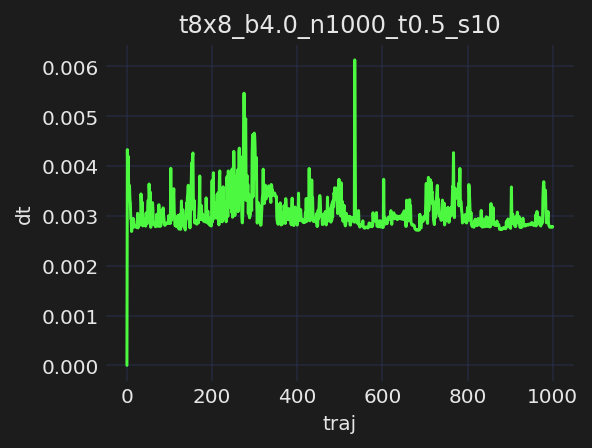

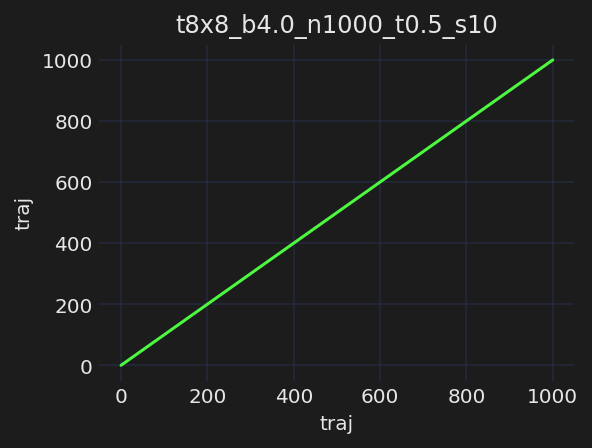

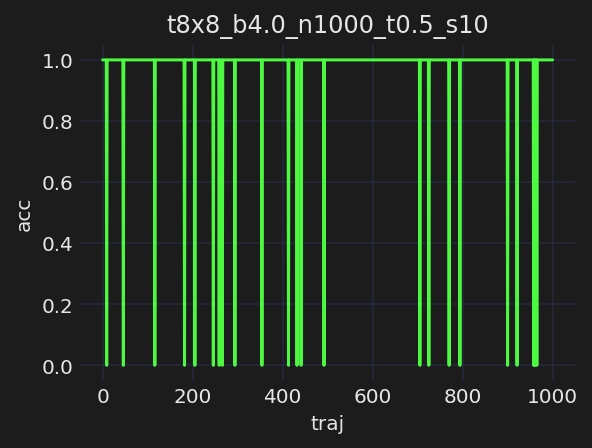

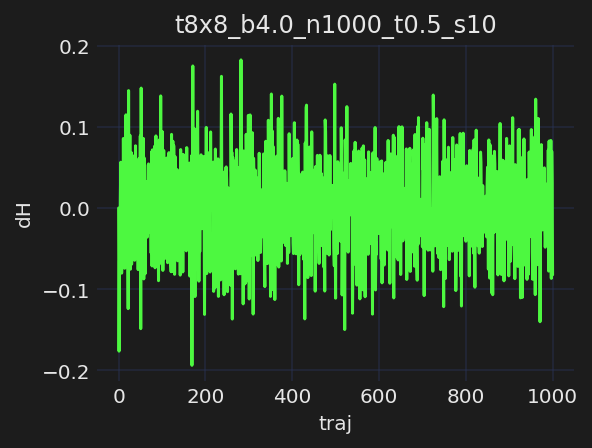

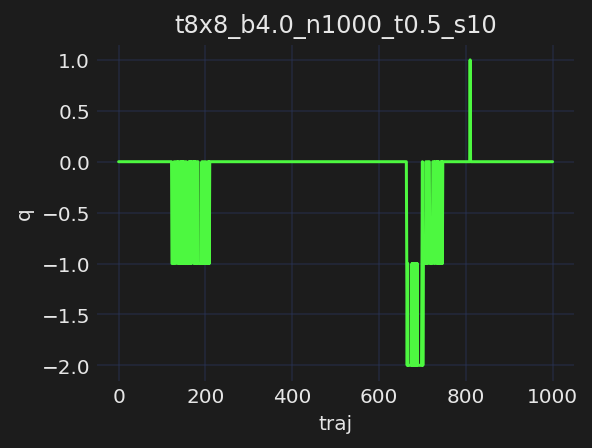

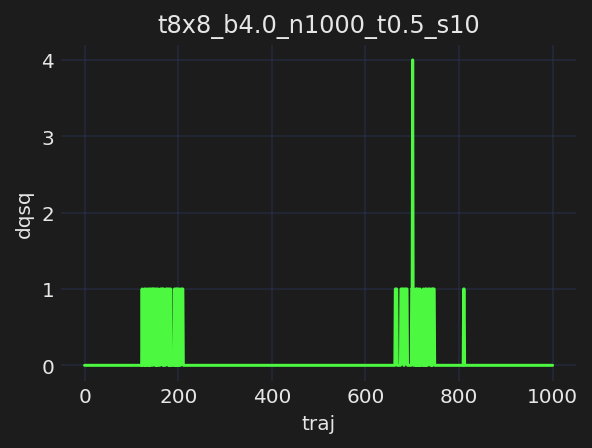

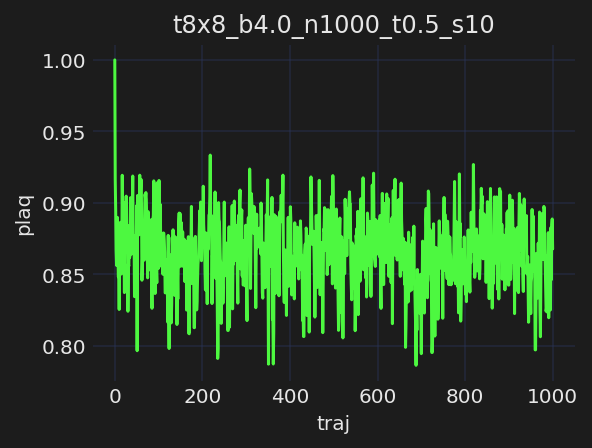

[11:15:13]  Run times: ['3.1962']

            Per trajectory: ['0.0032']

[11:15:13]  Saving hmc_histories to                                                          
            ../../logs/hmc/t8x8_b4.0_n1000_t0.5_s10/2021-06-23-111507/hmc_histories.z.

[11:15:13]  Saving hmc_fields_arr to                                                         
            ../../logs/hmc/t8x8_b4.0_n1000_t0.5_s10/2021-06-23-111507/hmc_fields_arr.z.

[11:15:13]  Creating directory: ../../logs/t8x8_b4.0_n1000_t0.5_s10/nb64_nh24_ns2_ks3_hl88_lr
            0.001_era10_epoch500/training/2021-06-23-111513

[11:15:13]  Creating directory: ../../logs/t8x8_b4.0_n1000_t0.5_s10/nb64_nh24_ns2_ks3_hl88_lr
            0.001_era10_epoch500/training/2021-06-23-111513/plots

[11:15:13]  Creating directory: ../../logs/t8x8_b4.0_n1000_t0.5_s10/nb64_nh24_ns2_ks3_hl88_lr
            0.001_era10_epoch500/training/2021-06-23-111513/checkpoints

[11:15:14]  Scheduler created!

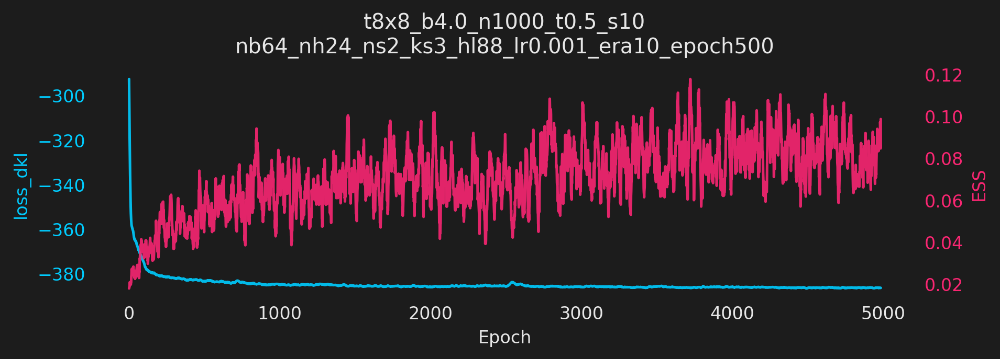

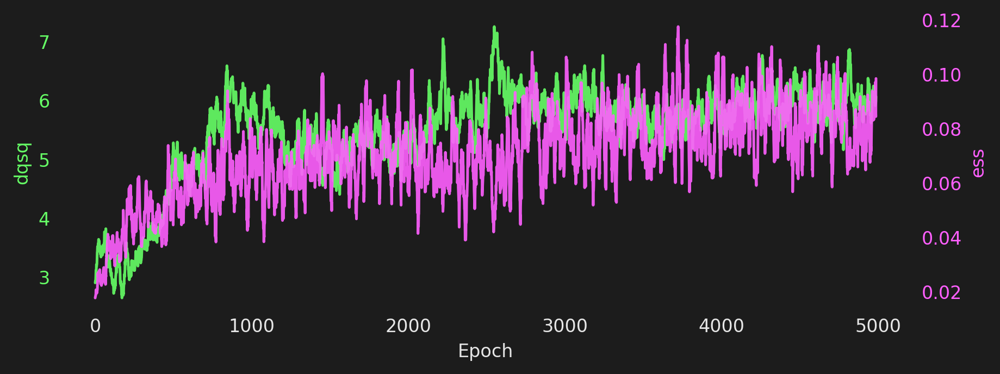

─────────────────────────────── ERA=0, last took: 0 min 0 sec ───────────────────────────────

[11:15:17]  (now) epoch: 9 dt=0.311 ess=0.016 loss_dkl=-307.112 logp=78.616 logq=-228.496    
            dqsq=2.938 plaq=0.307

            (avg) epoch: 9 dt=0.326 ess=0.019 loss_dkl=-278.167 logp=45.828 logq=-232.339    
            dqsq=2.898 plaq=0.179

[11:15:21]  (now) epoch: 19 dt=0.299 ess=0.044 loss_dkl=-356.735 logp=161.034 logq=-195.701  
            dqsq=4.172 plaq=0.629

            (avg) epoch: 19 dt=0.319 ess=0.020 loss_dkl=-311.401 logp=89.625 logq=-221.776   
            dqsq=3.071 plaq=0.350

[11:15:24]  (now) epoch: 29 dt=0.309 ess=0.057 loss_dkl=-358.579 logp=194.671 logq=-163.908  
            dqsq=4.516 plaq=0.760

            (avg) epoch: 29 dt=0.312 ess=0.022 loss_dkl=-350.375 logp=157.998 logq=-192.377  
            dqsq=3.384 plaq=0.617

[11:15:28]  (now) epoch: 39 dt=0.336 ess=0.034 loss_dkl=-363.937 logp=186.123 logq=-177.814  
            dqsq=3.453 plaq=0.727

            (avg) epoch: 39 dt=0.312 ess=0.025 loss_dkl=-360.481 logp=190.024 logq=-170.458  
            dqsq=3.497 plaq=0.742

[11:15:32]  (now) epoch: 49 dt=0.355 ess=0.016 loss_dkl=-364.031 logp=175.980 logq=-188.050  
            dqsq=4.000 plaq=0.687

            (avg) epoch: 49 dt=0.343 ess=0.026 loss_dkl=-363.095 logp=186.175 logq=-176.921  
            dqsq=3.444 plaq=0.727

[11:15:37]  (now) epoch: 59 dt=0.389 ess=0.048 loss_dkl=-365.766 logp=183.933 logq=-181.834  
            dqsq=3.969 plaq=0.718

            (avg) epoch: 59 dt=0.374 ess=0.024 loss_dkl=-365.260 logp=180.025 logq=-185.235  
            dqsq=3.441 plaq=0.703

[11:15:41]  (now) epoch: 69 dt=0.367 ess=0.019 loss_dkl=-367.735 logp=189.745 logq=-177.990  
            dqsq=4.078 plaq=0.741

            (avg) epoch: 69 dt=0.378 ess=0.027 loss_dkl=-367.174 logp=185.662 logq=-181.512  
            dqsq=3.476 plaq=0.725

[11:15:46]  (now) epoch: 79 dt=0.388 ess=0.016 loss_dkl=-371.488 logp=192.367 logq=-179.121  
            dqsq=2.375 plaq=0.751

            (avg) epoch: 79 dt=0.392 ess=0.025 loss_dkl=-369.404 logp=190.597 logq=-178.807  
            dqsq=3.653 plaq=0.745

[11:15:50]  (now) epoch: 89 dt=0.389 ess=0.033 loss_dkl=-371.333 logp=194.423 logq=-176.911  
            dqsq=4.266 plaq=0.759

            (avg) epoch: 89 dt=0.400 ess=0.031 loss_dkl=-371.062 logp=192.121 logq=-178.940  
            dqsq=3.545 plaq=0.750

[11:15:55]  (now) epoch: 99 dt=0.407 ess=0.030 loss_dkl=-374.625 logp=195.505 logq=-179.120  
            dqsq=2.547 plaq=0.764

            (avg) epoch: 99 dt=0.393 ess=0.039 loss_dkl=-372.824 logp=194.650 logq=-178.175  
            dqsq=3.253 plaq=0.760

[11:15:59]  (now) epoch: 109 dt=0.370 ess=0.016 loss_dkl=-374.562 logp=196.750 logq=-177.813 
            dqsq=2.594 plaq=0.769

            (avg) epoch: 109 dt=0.388 ess=0.036 loss_dkl=-374.292 logp=196.493 logq=-177.800 
            dqsq=3.181 plaq=0.768

[11:16:04]  (now) epoch: 119 dt=0.414 ess=0.033 loss_dkl=-379.617 logp=205.898 logq=-173.720 
            dqsq=2.406 plaq=0.804

            (avg) epoch: 119 dt=0.389 ess=0.035 loss_dkl=-376.020 logp=199.786 logq=-176.234 
            dqsq=3.114 plaq=0.780

[11:16:08]  (now) epoch: 129 dt=0.398 ess=0.028 loss_dkl=-379.027 logp=205.013 logq=-174.014 
            dqsq=2.516 plaq=0.801

            (avg) epoch: 129 dt=0.392 ess=0.038 loss_dkl=-377.866 logp=202.860 logq=-175.006 
            dqsq=2.967 plaq=0.792

[11:16:13]  (now) epoch: 139 dt=0.376 ess=0.017 loss_dkl=-378.413 logp=202.725 logq=-175.688 
            dqsq=3.062 plaq=0.792

            (avg) epoch: 139 dt=0.390 ess=0.035 loss_dkl=-378.537 logp=203.606 logq=-174.931 
            dqsq=2.807 plaq=0.795

[11:16:18]  (now) epoch: 149 dt=0.392 ess=0.045 loss_dkl=-379.159 logp=204.369 logq=-174.790 
            dqsq=4.297 plaq=0.798

            (avg) epoch: 149 dt=0.389 ess=0.034 loss_dkl=-378.963 logp=203.918 logq=-175.045 
            dqsq=3.030 plaq=0.797

[11:16:22]  (now) epoch: 159 dt=0.411 ess=0.046 loss_dkl=-380.858 logp=207.152 logq=-173.706 
            dqsq=4.469 plaq=0.809

            (avg) epoch: 159 dt=0.389 ess=0.040 loss_dkl=-379.437 logp=204.909 logq=-174.528 
            dqsq=3.306 plaq=0.800

[11:16:27]  (now) epoch: 169 dt=0.390 ess=0.019 loss_dkl=-379.832 logp=205.876 logq=-173.956 
            dqsq=2.672 plaq=0.804

            (avg) epoch: 169 dt=0.403 ess=0.036 loss_dkl=-379.657 logp=205.564 logq=-174.093 
            dqsq=3.216 plaq=0.803

[11:16:32]  (now) epoch: 179 dt=0.404 ess=0.064 loss_dkl=-378.673 logp=205.452 logq=-173.221 
            dqsq=2.234 plaq=0.803

            (avg) epoch: 179 dt=0.417 ess=0.033 loss_dkl=-379.829 logp=205.600 logq=-174.229 
            dqsq=2.926 plaq=0.803

[11:16:36]  (now) epoch: 189 dt=0.428 ess=0.056 loss_dkl=-380.921 logp=208.429 logq=-172.492 
            dqsq=2.438 plaq=0.814

[11:16:37]  (avg) epoch: 189 dt=0.416 ess=0.041 loss_dkl=-380.289 logp=206.144 logq=-174.144 
            dqsq=2.745 plaq=0.805

[11:16:41]  (now) epoch: 199 dt=0.417 ess=0.024 loss_dkl=-380.149 logp=206.209 logq=-173.940 
            dqsq=2.859 plaq=0.806

            (avg) epoch: 199 dt=0.421 ess=0.044 loss_dkl=-380.655 logp=206.655 logq=-174.000 
            dqsq=2.850 plaq=0.807

[11:16:46]  (now) epoch: 209 dt=0.449 ess=0.028 loss_dkl=-380.438 logp=205.135 logq=-175.304 
            dqsq=3.375 plaq=0.801

            (avg) epoch: 209 dt=0.424 ess=0.038 loss_dkl=-380.764 logp=206.783 logq=-173.981 
            dqsq=3.196 plaq=0.808

[11:16:51]  (now) epoch: 219 dt=0.476 ess=0.050 loss_dkl=-380.535 logp=205.821 logq=-174.714 
            dqsq=2.531 plaq=0.804

            (avg) epoch: 219 dt=0.420 ess=0.047 loss_dkl=-381.067 logp=207.020 logq=-174.047 
            dqsq=3.427 plaq=0.809

[11:16:56]  (now) epoch: 229 dt=0.382 ess=0.142 loss_dkl=-381.198 logp=209.436 logq=-171.762 
            dqsq=2.578 plaq=0.818

            (avg) epoch: 229 dt=0.431 ess=0.058 loss_dkl=-381.069 logp=207.207 logq=-173.862 
            dqsq=3.231 plaq=0.809

[11:17:02]  (now) epoch: 239 dt=0.464 ess=0.074 loss_dkl=-380.300 logp=205.466 logq=-174.834 
            dqsq=3.062 plaq=0.803

            (avg) epoch: 239 dt=0.447 ess=0.055 loss_dkl=-381.219 logp=207.759 logq=-173.460 
            dqsq=3.049 plaq=0.812

[11:17:07]  (now) epoch: 249 dt=0.465 ess=0.018 loss_dkl=-381.228 logp=207.717 logq=-173.511 
            dqsq=3.516 plaq=0.811

            (avg) epoch: 249 dt=0.455 ess=0.047 loss_dkl=-381.515 logp=208.257 logq=-173.259 
            dqsq=3.212 plaq=0.814

[11:17:12]  (now) epoch: 259 dt=0.489 ess=0.037 loss_dkl=-381.378 logp=210.612 logq=-170.766 
            dqsq=3.906 plaq=0.823

            (avg) epoch: 259 dt=0.459 ess=0.040 loss_dkl=-381.540 logp=208.571 logq=-172.969 
            dqsq=3.175 plaq=0.815

[11:17:18]  (now) epoch: 269 dt=0.481 ess=0.036 loss_dkl=-381.544 logp=207.176 logq=-174.368 
            dqsq=3.484 plaq=0.809

            (avg) epoch: 269 dt=0.483 ess=0.044 loss_dkl=-381.601 logp=208.870 logq=-172.731 
            dqsq=3.170 plaq=0.816

Epoch   273: reducing learning rate of group 0 to 9.9000e-04.


[11:17:24]  (now) epoch: 279 dt=0.495 ess=0.076 loss_dkl=-380.775 logp=207.827 logq=-172.948 
            dqsq=2.891 plaq=0.812

            (avg) epoch: 279 dt=0.501 ess=0.049 loss_dkl=-381.638 logp=208.293 logq=-173.345 
            dqsq=3.348 plaq=0.814

[11:17:29]  (now) epoch: 289 dt=0.488 ess=0.054 loss_dkl=-381.209 logp=207.233 logq=-173.976 
            dqsq=3.828 plaq=0.810

            (avg) epoch: 289 dt=0.491 ess=0.055 loss_dkl=-381.798 logp=208.273 logq=-173.524 
            dqsq=3.350 plaq=0.814

[11:17:35]  (now) epoch: 299 dt=0.561 ess=0.037 loss_dkl=-382.432 logp=211.725 logq=-170.707 
            dqsq=3.437 plaq=0.827

            (avg) epoch: 299 dt=0.508 ess=0.054 loss_dkl=-381.983 logp=209.158 logq=-172.826 
            dqsq=3.402 plaq=0.817

[11:17:41]  (now) epoch: 309 dt=0.542 ess=0.062 loss_dkl=-382.397 logp=209.537 logq=-172.860 
            dqsq=3.109 plaq=0.819

            (avg) epoch: 309 dt=0.525 ess=0.044 loss_dkl=-382.032 logp=209.421 logq=-172.611 
            dqsq=3.385 plaq=0.818

[11:17:48]  (now) epoch: 319 dt=0.514 ess=0.046 loss_dkl=-382.679 logp=208.886 logq=-173.793 
            dqsq=3.656 plaq=0.816

            (avg) epoch: 319 dt=0.525 ess=0.041 loss_dkl=-382.117 logp=209.205 logq=-172.912 
            dqsq=3.516 plaq=0.817

[11:17:53]  (now) epoch: 329 dt=0.541 ess=0.032 loss_dkl=-381.585 logp=210.125 logq=-171.459 
            dqsq=3.422 plaq=0.821

[11:17:54]  (avg) epoch: 329 dt=0.521 ess=0.046 loss_dkl=-382.248 logp=209.094 logq=-173.155 
            dqsq=3.599 plaq=0.817

[11:18:00]  (now) epoch: 339 dt=0.536 ess=0.023 loss_dkl=-381.162 logp=208.095 logq=-173.067 
            dqsq=2.937 plaq=0.813

            (avg) epoch: 339 dt=0.513 ess=0.054 loss_dkl=-382.104 logp=209.486 logq=-172.617 
            dqsq=3.492 plaq=0.818

[11:18:05]  (now) epoch: 349 dt=0.457 ess=0.081 loss_dkl=-383.034 logp=211.486 logq=-171.547 
            dqsq=4.406 plaq=0.826

            (avg) epoch: 349 dt=0.493 ess=0.052 loss_dkl=-382.142 logp=209.790 logq=-172.352 
            dqsq=3.634 plaq=0.819

[11:18:10]  (now) epoch: 359 dt=0.429 ess=0.027 loss_dkl=-382.403 logp=208.061 logq=-174.342 
            dqsq=3.156 plaq=0.813

[11:18:11]  (avg) epoch: 359 dt=0.470 ess=0.051 loss_dkl=-382.379 logp=209.452 logq=-172.927 
            dqsq=3.723 plaq=0.818

[11:18:16]  (now) epoch: 369 dt=0.442 ess=0.039 loss_dkl=-381.969 logp=210.977 logq=-170.992 
            dqsq=5.281 plaq=0.824

            (avg) epoch: 369 dt=0.465 ess=0.055 loss_dkl=-382.441 logp=209.294 logq=-173.147 
            dqsq=3.838 plaq=0.818

[11:18:21]  (now) epoch: 379 dt=0.448 ess=0.068 loss_dkl=-383.044 logp=209.072 logq=-173.972 
            dqsq=3.484 plaq=0.817

            (avg) epoch: 379 dt=0.446 ess=0.051 loss_dkl=-382.486 logp=209.382 logq=-173.104 
            dqsq=3.859 plaq=0.818

[11:18:26]  (now) epoch: 389 dt=0.439 ess=0.033 loss_dkl=-382.255 logp=208.246 logq=-174.008 
            dqsq=3.953 plaq=0.813

            (avg) epoch: 389 dt=0.433 ess=0.045 loss_dkl=-382.726 logp=209.982 logq=-172.744 
            dqsq=3.692 plaq=0.820

[11:18:31]  (now) epoch: 399 dt=0.433 ess=0.034 loss_dkl=-381.989 logp=209.952 logq=-172.038 
            dqsq=3.922 plaq=0.820

            (avg) epoch: 399 dt=0.430 ess=0.042 loss_dkl=-383.023 logp=210.503 logq=-172.520 
            dqsq=3.647 plaq=0.822

[11:18:36]  (now) epoch: 409 dt=0.433 ess=0.060 loss_dkl=-383.255 logp=211.135 logq=-172.120 
            dqsq=3.031 plaq=0.825

            (avg) epoch: 409 dt=0.431 ess=0.047 loss_dkl=-383.027 logp=209.906 logq=-173.121 
            dqsq=3.680 plaq=0.820

[11:18:41]  (now) epoch: 419 dt=0.488 ess=0.021 loss_dkl=-382.549 logp=209.470 logq=-173.079 
            dqsq=3.672 plaq=0.818

            (avg) epoch: 419 dt=0.446 ess=0.049 loss_dkl=-382.797 logp=209.404 logq=-173.393 
            dqsq=3.842 plaq=0.818

[11:18:46]  (now) epoch: 429 dt=0.442 ess=0.063 loss_dkl=-383.452 logp=212.396 logq=-171.056 
            dqsq=4.594 plaq=0.830

            (avg) epoch: 429 dt=0.453 ess=0.046 loss_dkl=-382.775 logp=209.926 logq=-172.849 
            dqsq=3.911 plaq=0.820

[11:18:52]  (now) epoch: 439 dt=0.470 ess=0.030 loss_dkl=-382.894 logp=209.789 logq=-173.106 
            dqsq=3.047 plaq=0.819

            (avg) epoch: 439 dt=0.452 ess=0.043 loss_dkl=-382.905 logp=210.402 logq=-172.503 
            dqsq=3.880 plaq=0.822

Epoch   450: reducing learning rate of group 0 to 9.8010e-04.


[11:18:57]  (now) epoch: 449 dt=0.431 ess=0.027 loss_dkl=-382.662 logp=210.096 logq=-172.566 
            dqsq=4.281 plaq=0.821

            (avg) epoch: 449 dt=0.449 ess=0.042 loss_dkl=-382.889 logp=210.361 logq=-172.528 
            dqsq=3.970 plaq=0.822

[11:19:02]  (now) epoch: 459 dt=0.468 ess=0.023 loss_dkl=-382.474 logp=208.902 logq=-173.572 
            dqsq=4.031 plaq=0.816

            (avg) epoch: 459 dt=0.444 ess=0.048 loss_dkl=-382.857 logp=209.970 logq=-172.887 
            dqsq=4.280 plaq=0.820

[11:19:07]  (now) epoch: 469 dt=0.434 ess=0.031 loss_dkl=-384.182 logp=212.326 logq=-171.856 
            dqsq=5.000 plaq=0.829

            (avg) epoch: 469 dt=0.440 ess=0.045 loss_dkl=-383.020 logp=210.057 logq=-172.962 
            dqsq=4.440 plaq=0.821

[11:19:12]  (now) epoch: 479 dt=0.429 ess=0.027 loss_dkl=-382.822 logp=210.158 logq=-172.665 
            dqsq=4.250 plaq=0.821

            (avg) epoch: 479 dt=0.432 ess=0.055 loss_dkl=-383.081 logp=210.637 logq=-172.444 
            dqsq=4.312 plaq=0.823

[11:19:17]  (now) epoch: 489 dt=0.437 ess=0.076 loss_dkl=-383.287 logp=212.277 logq=-171.010 
            dqsq=5.391 plaq=0.829

            (avg) epoch: 489 dt=0.426 ess=0.063 loss_dkl=-382.949 logp=211.009 logq=-171.940 
            dqsq=4.377 plaq=0.824

[11:19:22]  (now) epoch: 499 dt=0.401 ess=0.060 loss_dkl=-383.438 logp=209.162 logq=-174.277 
            dqsq=5.516 plaq=0.817

            (avg) epoch: 499 dt=0.426 ess=0.061 loss_dkl=-383.273 logp=211.376 logq=-171.898 
            dqsq=4.548 plaq=0.826

[11:19:22]  Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t8x8_b4.0_n1000_t0.5_s10/
            nb64_nh24_ns2_ks3_hl88_lr0.001_era10_epoch500/training/2021-06-23-111513/checkpoi
            nts/ckpt-era0-epoch499.tar

───────────────────────────── ERA=1, last took: 4 min 8.219 sec ─────────────────────────────

Epoch   501: reducing learning rate of group 0 to 9.7030e-04.


[11:19:27]  (now) epoch: 9 dt=0.426 ess=0.034 loss_dkl=-383.933 logp=211.575 logq=-172.358   
            dqsq=4.469 plaq=0.826

            (avg) epoch: 9 dt=0.426 ess=0.043 loss_dkl=-383.386 logp=210.630 logq=-172.755   
            dqsq=5.365 plaq=0.823

[11:19:31]  (now) epoch: 19 dt=0.390 ess=0.088 loss_dkl=-384.317 logp=210.676 logq=-173.641  
            dqsq=4.938 plaq=0.823

            (avg) epoch: 19 dt=0.417 ess=0.059 loss_dkl=-383.544 logp=210.924 logq=-172.620  
            dqsq=5.029 plaq=0.824

[11:19:36]  (now) epoch: 29 dt=0.405 ess=0.090 loss_dkl=-383.259 logp=211.435 logq=-171.824  
            dqsq=5.484 plaq=0.826

            (avg) epoch: 29 dt=0.416 ess=0.065 loss_dkl=-383.397 logp=210.506 logq=-172.891  
            dqsq=4.869 plaq=0.822

[11:19:41]  (now) epoch: 39 dt=0.407 ess=0.049 loss_dkl=-384.055 logp=212.869 logq=-171.187  
            dqsq=4.281 plaq=0.832

            (avg) epoch: 39 dt=0.423 ess=0.056 loss_dkl=-383.211 logp=210.540 logq=-172.671  
            dqsq=5.090 plaq=0.822

[11:19:46]  (now) epoch: 49 dt=0.449 ess=0.074 loss_dkl=-384.136 logp=211.696 logq=-172.439  
            dqsq=4.312 plaq=0.827

            (avg) epoch: 49 dt=0.421 ess=0.053 loss_dkl=-383.197 logp=210.721 logq=-172.476  
            dqsq=4.832 plaq=0.823

Epoch   552: reducing learning rate of group 0 to 9.6060e-04.


[11:19:51]  (now) epoch: 59 dt=0.421 ess=0.044 loss_dkl=-383.560 logp=210.995 logq=-172.565  
            dqsq=4.203 plaq=0.824

            (avg) epoch: 59 dt=0.423 ess=0.052 loss_dkl=-383.215 logp=210.150 logq=-173.065  
            dqsq=4.851 plaq=0.821

[11:19:56]  (now) epoch: 69 dt=0.409 ess=0.089 loss_dkl=-383.166 logp=209.769 logq=-173.398  
            dqsq=4.500 plaq=0.819

            (avg) epoch: 69 dt=0.426 ess=0.053 loss_dkl=-383.571 logp=211.040 logq=-172.532  
            dqsq=5.000 plaq=0.824

[11:20:01]  (now) epoch: 79 dt=0.444 ess=0.115 loss_dkl=-384.849 logp=212.014 logq=-172.835  
            dqsq=4.766 plaq=0.828

            (avg) epoch: 79 dt=0.421 ess=0.053 loss_dkl=-383.832 logp=211.187 logq=-172.645  
            dqsq=4.832 plaq=0.825

[11:20:06]  (now) epoch: 89 dt=0.425 ess=0.076 loss_dkl=-383.702 logp=212.167 logq=-171.535  
            dqsq=5.766 plaq=0.829

            (avg) epoch: 89 dt=0.427 ess=0.060 loss_dkl=-383.761 logp=211.204 logq=-172.558  
            dqsq=4.877 plaq=0.825

[11:20:11]  (now) epoch: 99 dt=0.403 ess=0.083 loss_dkl=-383.516 logp=211.581 logq=-171.935  
            dqsq=4.047 plaq=0.826

            (avg) epoch: 99 dt=0.429 ess=0.061 loss_dkl=-383.698 logp=211.328 logq=-172.370  
            dqsq=4.822 plaq=0.825

[11:20:15]  (now) epoch: 109 dt=0.425 ess=0.107 loss_dkl=-384.629 logp=213.335 logq=-171.294 
            dqsq=4.219 plaq=0.833

            (avg) epoch: 109 dt=0.419 ess=0.055 loss_dkl=-383.879 logp=210.944 logq=-172.935 
            dqsq=4.663 plaq=0.824

Epoch   620: reducing learning rate of group 0 to 9.5099e-04.


[11:20:20]  (now) epoch: 119 dt=0.434 ess=0.035 loss_dkl=-382.827 logp=209.378 logq=-173.449 
            dqsq=5.750 plaq=0.818

            (avg) epoch: 119 dt=0.427 ess=0.059 loss_dkl=-383.705 logp=211.188 logq=-172.517 
            dqsq=4.583 plaq=0.825

[11:20:26]  (now) epoch: 129 dt=0.416 ess=0.102 loss_dkl=-383.256 logp=211.507 logq=-171.749 
            dqsq=5.313 plaq=0.826

            (avg) epoch: 129 dt=0.437 ess=0.066 loss_dkl=-383.537 logp=211.583 logq=-171.954 
            dqsq=4.686 plaq=0.826

[11:20:31]  (now) epoch: 139 dt=0.494 ess=0.088 loss_dkl=-384.867 logp=211.769 logq=-173.098 
            dqsq=4.672 plaq=0.827

            (avg) epoch: 139 dt=0.453 ess=0.066 loss_dkl=-383.761 logp=211.715 logq=-172.046 
            dqsq=4.927 plaq=0.827

[11:20:37]  (now) epoch: 149 dt=0.454 ess=0.059 loss_dkl=-385.017 logp=212.240 logq=-172.777 
            dqsq=5.266 plaq=0.829

            (avg) epoch: 149 dt=0.475 ess=0.056 loss_dkl=-383.996 logp=211.383 logq=-172.613 
            dqsq=5.074 plaq=0.826

[11:20:42]  (now) epoch: 159 dt=0.489 ess=0.083 loss_dkl=-384.373 logp=211.115 logq=-173.258 
            dqsq=3.687 plaq=0.825

            (avg) epoch: 159 dt=0.475 ess=0.053 loss_dkl=-384.018 logp=211.345 logq=-172.673 
            dqsq=4.943 plaq=0.826

[11:20:47]  (now) epoch: 169 dt=0.493 ess=0.056 loss_dkl=-384.131 logp=210.629 logq=-173.501 
            dqsq=4.547 plaq=0.823

[11:20:48]  (avg) epoch: 169 dt=0.474 ess=0.053 loss_dkl=-383.869 logp=210.747 logq=-173.121 
            dqsq=4.950 plaq=0.823

Epoch   671: reducing learning rate of group 0 to 9.4148e-04.


[11:20:53]  (now) epoch: 179 dt=0.570 ess=0.056 loss_dkl=-384.615 logp=213.224 logq=-171.392 
            dqsq=4.000 plaq=0.833

[11:20:54]  (avg) epoch: 179 dt=0.499 ess=0.053 loss_dkl=-384.031 logp=211.084 logq=-172.948 
            dqsq=4.866 plaq=0.825

[11:21:00]  (now) epoch: 189 dt=0.527 ess=0.083 loss_dkl=-383.662 logp=210.642 logq=-173.020 
            dqsq=6.016 plaq=0.823

            (avg) epoch: 189 dt=0.526 ess=0.056 loss_dkl=-384.363 logp=211.932 logq=-172.431 
            dqsq=4.784 plaq=0.828

[11:21:06]  (now) epoch: 199 dt=0.561 ess=0.048 loss_dkl=-383.606 logp=211.190 logq=-172.417 
            dqsq=5.875 plaq=0.825

            (avg) epoch: 199 dt=0.529 ess=0.064 loss_dkl=-384.253 logp=211.743 logq=-172.511 
            dqsq=5.065 plaq=0.827

[11:21:12]  (now) epoch: 209 dt=0.516 ess=0.044 loss_dkl=-383.432 logp=212.190 logq=-171.242 
            dqsq=4.406 plaq=0.829

            (avg) epoch: 209 dt=0.521 ess=0.067 loss_dkl=-384.081 logp=211.740 logq=-172.341 
            dqsq=4.862 plaq=0.827

[11:21:18]  (now) epoch: 219 dt=0.464 ess=0.044 loss_dkl=-384.297 logp=212.500 logq=-171.797 
            dqsq=5.516 plaq=0.830

            (avg) epoch: 219 dt=0.503 ess=0.057 loss_dkl=-384.052 logp=212.095 logq=-171.957 
            dqsq=4.560 plaq=0.828

Epoch   722: reducing learning rate of group 0 to 9.3207e-04.


[11:21:23]  (now) epoch: 229 dt=0.575 ess=0.100 loss_dkl=-382.872 logp=212.451 logq=-170.421 
            dqsq=5.234 plaq=0.830

[11:21:24]  (avg) epoch: 229 dt=0.503 ess=0.050 loss_dkl=-383.581 logp=212.232 logq=-171.350 
            dqsq=5.241 plaq=0.829

[11:21:29]  (now) epoch: 239 dt=0.484 ess=0.076 loss_dkl=-383.865 logp=212.356 logq=-171.509 
            dqsq=6.500 plaq=0.830

            (avg) epoch: 239 dt=0.507 ess=0.065 loss_dkl=-383.376 logp=212.010 logq=-171.367 
            dqsq=5.537 plaq=0.828

[11:21:35]  (now) epoch: 249 dt=0.458 ess=0.055 loss_dkl=-384.003 logp=211.034 logq=-172.969 
            dqsq=3.547 plaq=0.824

            (avg) epoch: 249 dt=0.478 ess=0.070 loss_dkl=-383.783 logp=212.052 logq=-171.731 
            dqsq=5.481 plaq=0.828

[11:21:40]  (now) epoch: 259 dt=0.472 ess=0.041 loss_dkl=-382.501 logp=208.896 logq=-173.605 
            dqsq=5.656 plaq=0.816

            (avg) epoch: 259 dt=0.465 ess=0.058 loss_dkl=-383.890 logp=211.395 logq=-172.495 
            dqsq=5.800 plaq=0.826

[11:21:46]  (now) epoch: 269 dt=0.505 ess=0.035 loss_dkl=-383.641 logp=210.467 logq=-173.174 
            dqsq=5.969 plaq=0.822

            (avg) epoch: 269 dt=0.468 ess=0.058 loss_dkl=-383.920 logp=211.040 logq=-172.881 
            dqsq=5.523 plaq=0.824

Epoch   773: reducing learning rate of group 0 to 9.2274e-04.


[11:21:51]  (now) epoch: 279 dt=0.469 ess=0.018 loss_dkl=-384.249 logp=213.701 logq=-170.548 
            dqsq=6.031 plaq=0.835

            (avg) epoch: 279 dt=0.463 ess=0.050 loss_dkl=-384.134 logp=211.968 logq=-172.166 
            dqsq=5.527 plaq=0.828

[11:21:56]  (now) epoch: 289 dt=0.442 ess=0.023 loss_dkl=-384.309 logp=211.011 logq=-173.298 
            dqsq=5.062 plaq=0.824

            (avg) epoch: 289 dt=0.458 ess=0.049 loss_dkl=-384.304 logp=212.922 logq=-171.381 
            dqsq=5.835 plaq=0.832

[11:22:01]  (now) epoch: 299 dt=0.402 ess=0.022 loss_dkl=-384.530 logp=211.277 logq=-173.253 
            dqsq=6.391 plaq=0.825

            (avg) epoch: 299 dt=0.444 ess=0.064 loss_dkl=-384.527 logp=212.607 logq=-171.920 
            dqsq=5.794 plaq=0.830

[11:22:06]  (now) epoch: 309 dt=0.438 ess=0.058 loss_dkl=-384.770 logp=212.181 logq=-172.589 
            dqsq=6.187 plaq=0.829

            (avg) epoch: 309 dt=0.435 ess=0.056 loss_dkl=-384.568 logp=212.191 logq=-172.377 
            dqsq=5.727 plaq=0.829

[11:22:12]  (now) epoch: 319 dt=0.418 ess=0.042 loss_dkl=-384.014 logp=211.357 logq=-172.656 
            dqsq=5.000 plaq=0.826

            (avg) epoch: 319 dt=0.437 ess=0.063 loss_dkl=-384.626 logp=212.429 logq=-172.197 
            dqsq=5.603 plaq=0.830

Epoch   824: reducing learning rate of group 0 to 9.1352e-04.


[11:22:16]  (now) epoch: 329 dt=0.397 ess=0.107 loss_dkl=-383.763 logp=212.171 logq=-171.592 
            dqsq=4.125 plaq=0.829

            (avg) epoch: 329 dt=0.431 ess=0.067 loss_dkl=-384.606 logp=212.348 logq=-172.258 
            dqsq=5.367 plaq=0.829

[11:22:22]  (now) epoch: 339 dt=0.423 ess=0.084 loss_dkl=-384.709 logp=213.831 logq=-170.877 
            dqsq=7.266 plaq=0.835

            (avg) epoch: 339 dt=0.431 ess=0.064 loss_dkl=-384.439 logp=212.503 logq=-171.935 
            dqsq=5.544 plaq=0.830

[11:22:26]  (now) epoch: 349 dt=0.415 ess=0.038 loss_dkl=-385.095 logp=213.660 logq=-171.435 
            dqsq=8.812 plaq=0.835

            (avg) epoch: 349 dt=0.434 ess=0.074 loss_dkl=-384.608 logp=213.038 logq=-171.569 
            dqsq=6.244 plaq=0.832

[11:22:31]  (now) epoch: 359 dt=0.385 ess=0.209 loss_dkl=-384.748 logp=212.721 logq=-172.026 
            dqsq=5.750 plaq=0.831

            (avg) epoch: 359 dt=0.411 ess=0.088 loss_dkl=-384.801 logp=213.076 logq=-171.725 
            dqsq=6.415 plaq=0.832

[11:22:36]  (now) epoch: 369 dt=0.393 ess=0.094 loss_dkl=-384.434 logp=212.858 logq=-171.576 
            dqsq=6.141 plaq=0.831

            (avg) epoch: 369 dt=0.397 ess=0.086 loss_dkl=-384.693 logp=213.280 logq=-171.413 
            dqsq=6.027 plaq=0.833

[11:22:40]  (now) epoch: 379 dt=0.376 ess=0.139 loss_dkl=-384.688 logp=213.336 logq=-171.351 
            dqsq=5.312 plaq=0.833

            (avg) epoch: 379 dt=0.394 ess=0.064 loss_dkl=-384.653 logp=213.337 logq=-171.317 
            dqsq=6.068 plaq=0.833

[11:22:45]  (now) epoch: 389 dt=0.374 ess=0.055 loss_dkl=-384.840 logp=214.629 logq=-170.211 
            dqsq=7.125 plaq=0.838

            (avg) epoch: 389 dt=0.387 ess=0.060 loss_dkl=-384.796 logp=213.180 logq=-171.616 
            dqsq=6.369 plaq=0.833

Epoch   896: reducing learning rate of group 0 to 9.0438e-04.


[11:22:49]  (now) epoch: 399 dt=0.402 ess=0.018 loss_dkl=-385.330 logp=213.247 logq=-172.082 
            dqsq=6.516 plaq=0.833

            (avg) epoch: 399 dt=0.384 ess=0.056 loss_dkl=-385.027 logp=213.503 logq=-171.524 
            dqsq=6.109 plaq=0.834

[11:22:54]  (now) epoch: 409 dt=0.394 ess=0.060 loss_dkl=-384.900 logp=212.735 logq=-172.165 
            dqsq=4.828 plaq=0.831

            (avg) epoch: 409 dt=0.389 ess=0.056 loss_dkl=-385.065 logp=212.956 logq=-172.109 
            dqsq=6.018 plaq=0.832

[11:22:58]  (now) epoch: 419 dt=0.346 ess=0.065 loss_dkl=-385.085 logp=210.595 logq=-174.489 
            dqsq=6.953 plaq=0.823

            (avg) epoch: 419 dt=0.397 ess=0.063 loss_dkl=-385.033 logp=212.625 logq=-172.409 
            dqsq=5.953 plaq=0.831

[11:23:03]  (now) epoch: 429 dt=0.412 ess=0.091 loss_dkl=-385.321 logp=214.386 logq=-170.935 
            dqsq=7.828 plaq=0.837

            (avg) epoch: 429 dt=0.408 ess=0.068 loss_dkl=-385.198 logp=213.103 logq=-172.095 
            dqsq=5.719 plaq=0.832

[11:23:08]  (now) epoch: 439 dt=0.431 ess=0.036 loss_dkl=-385.070 logp=214.414 logq=-170.656 
            dqsq=5.547 plaq=0.838

            (avg) epoch: 439 dt=0.426 ess=0.063 loss_dkl=-385.149 logp=213.516 logq=-171.633 
            dqsq=5.766 plaq=0.834

Epoch   947: reducing learning rate of group 0 to 8.9534e-04.


[11:23:13]  (now) epoch: 449 dt=0.459 ess=0.090 loss_dkl=-384.916 logp=214.291 logq=-170.625 
            dqsq=4.953 plaq=0.837

            (avg) epoch: 449 dt=0.449 ess=0.059 loss_dkl=-385.079 logp=213.813 logq=-171.267 
            dqsq=6.004 plaq=0.835

[11:23:19]  (now) epoch: 459 dt=0.510 ess=0.103 loss_dkl=-384.748 logp=212.447 logq=-172.301 
            dqsq=5.875 plaq=0.830

            (avg) epoch: 459 dt=0.459 ess=0.072 loss_dkl=-385.010 logp=213.579 logq=-171.431 
            dqsq=6.141 plaq=0.834

[11:23:24]  (now) epoch: 469 dt=0.427 ess=0.100 loss_dkl=-384.894 logp=210.591 logq=-174.303 
            dqsq=6.328 plaq=0.823

            (avg) epoch: 469 dt=0.459 ess=0.075 loss_dkl=-384.891 logp=212.415 logq=-172.476 
            dqsq=6.035 plaq=0.830

[11:23:29]  (now) epoch: 479 dt=0.518 ess=0.019 loss_dkl=-384.677 logp=210.692 logq=-173.985 
            dqsq=5.891 plaq=0.823

            (avg) epoch: 479 dt=0.463 ess=0.056 loss_dkl=-384.859 logp=211.538 logq=-173.321 
            dqsq=5.823 plaq=0.826

[11:23:35]  (now) epoch: 489 dt=0.475 ess=0.035 loss_dkl=-384.491 logp=212.768 logq=-171.723 
            dqsq=6.547 plaq=0.831

            (avg) epoch: 489 dt=0.467 ess=0.044 loss_dkl=-384.748 logp=211.667 logq=-173.081 
            dqsq=5.709 plaq=0.827

Epoch   998: reducing learning rate of group 0 to 8.8638e-04.


[11:23:40]  (now) epoch: 499 dt=0.450 ess=0.050 loss_dkl=-384.568 logp=210.975 logq=-173.593 
            dqsq=7.016 plaq=0.824

            (avg) epoch: 499 dt=0.466 ess=0.057 loss_dkl=-384.776 logp=212.320 logq=-172.456 
            dqsq=5.585 plaq=0.829

[11:23:41]  Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t8x8_b4.0_n1000_t0.5_s10/
            nb64_nh24_ns2_ks3_hl88_lr0.001_era10_epoch500/training/2021-06-23-111513/checkpoi
            nts/ckpt-era1-epoch499.tar

───────────────────────────── ERA=2, last took: 4 min 18.5 sec ──────────────────────────────

[11:23:46]  (now) epoch: 9 dt=0.478 ess=0.095 loss_dkl=-385.852 logp=214.949 logq=-170.903   
            dqsq=6.625 plaq=0.840

            (avg) epoch: 9 dt=0.526 ess=0.078 loss_dkl=-385.099 logp=213.472 logq=-171.628   
            dqsq=5.997 plaq=0.834

[11:23:52]  (now) epoch: 19 dt=0.616 ess=0.127 loss_dkl=-384.236 logp=210.538 logq=-173.699  
            dqsq=8.297 plaq=0.822

            (avg) epoch: 19 dt=0.524 ess=0.071 loss_dkl=-385.065 logp=212.791 logq=-172.274  
            dqsq=5.975 plaq=0.831

[11:23:58]  (now) epoch: 29 dt=0.481 ess=0.088 loss_dkl=-384.707 logp=213.086 logq=-171.622  
            dqsq=4.984 plaq=0.832

            (avg) epoch: 29 dt=0.509 ess=0.073 loss_dkl=-384.984 logp=213.380 logq=-171.604  
            dqsq=5.823 plaq=0.834

[11:24:04]  (now) epoch: 39 dt=0.491 ess=0.051 loss_dkl=-384.932 logp=214.466 logq=-170.466  
            dqsq=6.047 plaq=0.838

            (avg) epoch: 39 dt=0.504 ess=0.066 loss_dkl=-384.956 logp=213.972 logq=-170.984  
            dqsq=5.683 plaq=0.836

Epoch  1049: reducing learning rate of group 0 to 8.7752e-04.


[11:24:10]  (now) epoch: 49 dt=0.509 ess=0.030 loss_dkl=-385.285 logp=215.049 logq=-170.236  
            dqsq=6.438 plaq=0.840

            (avg) epoch: 49 dt=0.510 ess=0.060 loss_dkl=-385.103 logp=213.563 logq=-171.539  
            dqsq=5.732 plaq=0.834

[11:24:15]  (now) epoch: 59 dt=0.437 ess=0.061 loss_dkl=-385.357 logp=213.642 logq=-171.715  
            dqsq=7.203 plaq=0.835

            (avg) epoch: 59 dt=0.477 ess=0.065 loss_dkl=-385.298 logp=213.769 logq=-171.528  
            dqsq=5.495 plaq=0.835

[11:24:20]  (now) epoch: 69 dt=0.416 ess=0.049 loss_dkl=-385.437 logp=214.848 logq=-170.590  
            dqsq=6.562 plaq=0.839

            (avg) epoch: 69 dt=0.438 ess=0.075 loss_dkl=-385.207 logp=213.367 logq=-171.840  
            dqsq=5.362 plaq=0.833

[11:24:25]  (now) epoch: 79 dt=0.471 ess=0.040 loss_dkl=-384.794 logp=213.126 logq=-171.668  
            dqsq=6.375 plaq=0.833

            (avg) epoch: 79 dt=0.419 ess=0.072 loss_dkl=-385.192 logp=213.579 logq=-171.613  
            dqsq=5.516 plaq=0.834

[11:24:29]  (now) epoch: 89 dt=0.460 ess=0.035 loss_dkl=-385.930 logp=215.661 logq=-170.269  
            dqsq=8.000 plaq=0.842

            (avg) epoch: 89 dt=0.419 ess=0.047 loss_dkl=-385.277 logp=213.989 logq=-171.288  
            dqsq=5.662 plaq=0.836

Epoch  1100: reducing learning rate of group 0 to 8.6875e-04.


[11:24:35]  (now) epoch: 99 dt=0.501 ess=0.088 loss_dkl=-385.003 logp=214.713 logq=-170.290  
            dqsq=7.656 plaq=0.839

            (avg) epoch: 99 dt=0.446 ess=0.050 loss_dkl=-385.194 logp=213.760 logq=-171.434  
            dqsq=5.958 plaq=0.835

[11:24:40]  (now) epoch: 109 dt=0.411 ess=0.055 loss_dkl=-384.960 logp=212.071 logq=-172.889 
            dqsq=6.250 plaq=0.828

            (avg) epoch: 109 dt=0.438 ess=0.071 loss_dkl=-385.036 logp=213.240 logq=-171.796 
            dqsq=6.123 plaq=0.833

[11:24:44]  (now) epoch: 119 dt=0.413 ess=0.026 loss_dkl=-384.884 logp=211.732 logq=-173.152 
            dqsq=4.766 plaq=0.827

[11:24:45]  (avg) epoch: 119 dt=0.414 ess=0.065 loss_dkl=-385.007 logp=212.802 logq=-172.205 
            dqsq=6.030 plaq=0.831

[11:24:49]  (now) epoch: 129 dt=0.405 ess=0.041 loss_dkl=-385.393 logp=213.846 logq=-171.548 
            dqsq=4.500 plaq=0.835

            (avg) epoch: 129 dt=0.420 ess=0.061 loss_dkl=-385.150 logp=213.449 logq=-171.700 
            dqsq=5.821 plaq=0.834

[11:24:54]  (now) epoch: 139 dt=0.454 ess=0.168 loss_dkl=-385.335 logp=213.205 logq=-172.130 
            dqsq=5.984 plaq=0.833

            (avg) epoch: 139 dt=0.422 ess=0.077 loss_dkl=-385.190 logp=213.770 logq=-171.421 
            dqsq=5.547 plaq=0.835

[11:25:00]  (now) epoch: 149 dt=0.424 ess=0.037 loss_dkl=-385.338 logp=214.182 logq=-171.155 
            dqsq=5.172 plaq=0.837

            (avg) epoch: 149 dt=0.445 ess=0.067 loss_dkl=-385.229 logp=213.430 logq=-171.799 
            dqsq=5.629 plaq=0.834

Epoch  1151: reducing learning rate of group 0 to 8.6006e-04.


[11:25:05]  (now) epoch: 159 dt=0.422 ess=0.022 loss_dkl=-385.761 logp=211.958 logq=-173.803 
            dqsq=6.281 plaq=0.828

            (avg) epoch: 159 dt=0.453 ess=0.049 loss_dkl=-385.097 logp=212.746 logq=-172.351 
            dqsq=5.621 plaq=0.831

[11:25:10]  (now) epoch: 169 dt=0.430 ess=0.130 loss_dkl=-384.984 logp=213.073 logq=-171.911 
            dqsq=6.703 plaq=0.832

            (avg) epoch: 169 dt=0.428 ess=0.056 loss_dkl=-384.935 logp=212.425 logq=-172.510 
            dqsq=5.505 plaq=0.830

[11:25:15]  (now) epoch: 179 dt=0.452 ess=0.125 loss_dkl=-385.042 logp=212.579 logq=-172.462 
            dqsq=6.828 plaq=0.830

            (avg) epoch: 179 dt=0.437 ess=0.066 loss_dkl=-385.103 logp=212.744 logq=-172.359 
            dqsq=5.645 plaq=0.831

[11:25:21]  (now) epoch: 189 dt=0.471 ess=0.137 loss_dkl=-384.352 logp=212.767 logq=-171.586 
            dqsq=5.953 plaq=0.831

            (avg) epoch: 189 dt=0.489 ess=0.062 loss_dkl=-385.083 logp=212.871 logq=-172.212 
            dqsq=5.565 plaq=0.832

[11:25:27]  (now) epoch: 199 dt=0.518 ess=0.043 loss_dkl=-384.371 logp=211.158 logq=-173.214 
            dqsq=4.406 plaq=0.825

            (avg) epoch: 199 dt=0.520 ess=0.065 loss_dkl=-384.927 logp=212.902 logq=-172.024 
            dqsq=5.416 plaq=0.832

Epoch  1202: reducing learning rate of group 0 to 8.5146e-04.


[11:25:32]  (now) epoch: 209 dt=0.476 ess=0.027 loss_dkl=-385.492 logp=214.811 logq=-170.682 
            dqsq=4.953 plaq=0.839

            (avg) epoch: 209 dt=0.490 ess=0.061 loss_dkl=-385.096 logp=213.336 logq=-171.760 
            dqsq=5.518 plaq=0.833

[11:25:38]  (now) epoch: 219 dt=0.474 ess=0.080 loss_dkl=-385.022 logp=212.512 logq=-172.509 
            dqsq=4.969 plaq=0.830

            (avg) epoch: 219 dt=0.480 ess=0.054 loss_dkl=-385.106 logp=213.087 logq=-172.019 
            dqsq=5.338 plaq=0.832

[11:25:44]  (now) epoch: 229 dt=0.534 ess=0.032 loss_dkl=-385.343 logp=213.261 logq=-172.082 
            dqsq=5.297 plaq=0.833

            (avg) epoch: 229 dt=0.501 ess=0.060 loss_dkl=-385.164 logp=212.408 logq=-172.757 
            dqsq=4.945 plaq=0.830

[11:25:49]  (now) epoch: 239 dt=0.471 ess=0.083 loss_dkl=-384.975 logp=213.317 logq=-171.658 
            dqsq=5.641 plaq=0.833

            (avg) epoch: 239 dt=0.499 ess=0.063 loss_dkl=-385.313 logp=213.118 logq=-172.194 
            dqsq=5.135 plaq=0.832

[11:25:55]  (now) epoch: 249 dt=0.574 ess=0.017 loss_dkl=-384.978 logp=213.129 logq=-171.849 
            dqsq=4.359 plaq=0.833

            (avg) epoch: 249 dt=0.483 ess=0.063 loss_dkl=-385.201 logp=213.357 logq=-171.843 
            dqsq=5.218 plaq=0.833

Epoch  1253: reducing learning rate of group 0 to 8.4294e-04.


[11:26:01]  (now) epoch: 259 dt=0.499 ess=0.037 loss_dkl=-384.290 logp=213.124 logq=-171.166 
            dqsq=4.875 plaq=0.833

            (avg) epoch: 259 dt=0.491 ess=0.063 loss_dkl=-385.025 logp=213.609 logq=-171.416 
            dqsq=4.794 plaq=0.834

[11:26:06]  (now) epoch: 269 dt=0.490 ess=0.066 loss_dkl=-385.286 logp=215.171 logq=-170.115 
            dqsq=5.062 plaq=0.841

            (avg) epoch: 269 dt=0.498 ess=0.067 loss_dkl=-385.012 logp=213.953 logq=-171.059 
            dqsq=4.855 plaq=0.836

[11:26:12]  (now) epoch: 279 dt=0.464 ess=0.055 loss_dkl=-384.486 logp=212.880 logq=-171.606 
            dqsq=4.656 plaq=0.832

            (avg) epoch: 279 dt=0.488 ess=0.065 loss_dkl=-384.880 logp=213.342 logq=-171.537 
            dqsq=5.016 plaq=0.833

[11:26:18]  (now) epoch: 289 dt=0.445 ess=0.097 loss_dkl=-384.959 logp=213.670 logq=-171.289 
            dqsq=3.469 plaq=0.835

            (avg) epoch: 289 dt=0.487 ess=0.058 loss_dkl=-384.754 logp=212.924 logq=-171.830 
            dqsq=5.015 plaq=0.832

[11:26:23]  (now) epoch: 299 dt=0.498 ess=0.125 loss_dkl=-385.646 logp=215.267 logq=-170.379 
            dqsq=6.109 plaq=0.841

            (avg) epoch: 299 dt=0.490 ess=0.054 loss_dkl=-385.019 logp=213.805 logq=-171.215 
            dqsq=5.305 plaq=0.835

Epoch  1304: reducing learning rate of group 0 to 8.3451e-04.


[11:26:29]  (now) epoch: 309 dt=0.498 ess=0.072 loss_dkl=-384.988 logp=211.847 logq=-173.140 
            dqsq=3.750 plaq=0.828

            (avg) epoch: 309 dt=0.485 ess=0.067 loss_dkl=-385.074 logp=214.525 logq=-170.549 
            dqsq=5.430 plaq=0.838

[11:26:35]  (now) epoch: 319 dt=0.600 ess=0.093 loss_dkl=-385.141 logp=213.891 logq=-171.249 
            dqsq=4.688 plaq=0.836

            (avg) epoch: 319 dt=0.498 ess=0.072 loss_dkl=-385.041 logp=213.661 logq=-171.380 
            dqsq=5.575 plaq=0.835

[11:26:41]  (now) epoch: 329 dt=0.543 ess=0.076 loss_dkl=-384.222 logp=211.008 logq=-173.214 
            dqsq=4.797 plaq=0.824

            (avg) epoch: 329 dt=0.520 ess=0.062 loss_dkl=-384.897 logp=212.785 logq=-172.111 
            dqsq=5.256 plaq=0.831

[11:26:47]  (now) epoch: 339 dt=0.533 ess=0.078 loss_dkl=-385.045 logp=213.507 logq=-171.537 
            dqsq=5.688 plaq=0.834

            (avg) epoch: 339 dt=0.541 ess=0.065 loss_dkl=-384.959 logp=213.155 logq=-171.804 
            dqsq=5.051 plaq=0.833

[11:26:53]  (now) epoch: 349 dt=0.483 ess=0.027 loss_dkl=-385.953 logp=215.773 logq=-170.180 
            dqsq=5.625 plaq=0.843

            (avg) epoch: 349 dt=0.538 ess=0.061 loss_dkl=-385.167 logp=213.714 logq=-171.453 
            dqsq=5.508 plaq=0.835

Epoch  1355: reducing learning rate of group 0 to 8.2617e-04.


[11:26:59]  (now) epoch: 359 dt=0.503 ess=0.031 loss_dkl=-384.834 logp=210.133 logq=-174.701 
            dqsq=4.766 plaq=0.821

            (avg) epoch: 359 dt=0.508 ess=0.061 loss_dkl=-385.103 logp=213.462 logq=-171.641 
            dqsq=5.334 plaq=0.834

[11:27:05]  (now) epoch: 369 dt=0.507 ess=0.058 loss_dkl=-385.453 logp=212.901 logq=-172.552 
            dqsq=4.969 plaq=0.832

[11:27:06]  (avg) epoch: 369 dt=0.527 ess=0.066 loss_dkl=-385.207 logp=213.270 logq=-171.937 
            dqsq=5.127 plaq=0.833

[11:27:12]  (now) epoch: 379 dt=0.530 ess=0.134 loss_dkl=-385.193 logp=213.890 logq=-171.303 
            dqsq=6.469 plaq=0.836

            (avg) epoch: 379 dt=0.542 ess=0.071 loss_dkl=-385.255 logp=213.003 logq=-172.252 
            dqsq=5.384 plaq=0.832

[11:27:17]  (now) epoch: 389 dt=0.478 ess=0.053 loss_dkl=-386.226 logp=214.925 logq=-171.300 
            dqsq=5.703 plaq=0.840

[11:27:18]  (avg) epoch: 389 dt=0.518 ess=0.071 loss_dkl=-385.317 logp=213.034 logq=-172.283 
            dqsq=5.432 plaq=0.832

[11:27:23]  (now) epoch: 399 dt=0.539 ess=0.081 loss_dkl=-385.512 logp=213.750 logq=-171.762 
            dqsq=3.969 plaq=0.835

            (avg) epoch: 399 dt=0.507 ess=0.066 loss_dkl=-385.462 logp=213.978 logq=-171.484 
            dqsq=5.214 plaq=0.836

[11:27:29]  (now) epoch: 409 dt=0.468 ess=0.063 loss_dkl=-385.675 logp=215.415 logq=-170.260 
            dqsq=5.250 plaq=0.841

            (avg) epoch: 409 dt=0.506 ess=0.069 loss_dkl=-385.470 logp=213.903 logq=-171.567 
            dqsq=5.253 plaq=0.836

[11:27:35]  (now) epoch: 419 dt=0.493 ess=0.127 loss_dkl=-385.525 logp=213.807 logq=-171.718 
            dqsq=4.625 plaq=0.835

            (avg) epoch: 419 dt=0.507 ess=0.066 loss_dkl=-385.401 logp=213.548 logq=-171.853 
            dqsq=5.620 plaq=0.834

[11:27:41]  (now) epoch: 429 dt=0.505 ess=0.057 loss_dkl=-384.960 logp=213.126 logq=-171.835 
            dqsq=4.484 plaq=0.833

            (avg) epoch: 429 dt=0.499 ess=0.073 loss_dkl=-385.295 logp=213.545 logq=-171.750 
            dqsq=5.428 plaq=0.834

[11:27:47]  (now) epoch: 439 dt=0.485 ess=0.071 loss_dkl=-385.855 logp=215.638 logq=-170.217 
            dqsq=3.578 plaq=0.842

            (avg) epoch: 439 dt=0.495 ess=0.070 loss_dkl=-385.067 logp=213.593 logq=-171.473 
            dqsq=5.089 plaq=0.834

[11:27:52]  (now) epoch: 449 dt=0.440 ess=0.026 loss_dkl=-385.968 logp=214.901 logq=-171.067 
            dqsq=5.250 plaq=0.839

            (avg) epoch: 449 dt=0.479 ess=0.061 loss_dkl=-385.152 logp=213.912 logq=-171.240 
            dqsq=5.001 plaq=0.836

Epoch  1453: reducing learning rate of group 0 to 8.1791e-04.


[11:27:57]  (now) epoch: 459 dt=0.447 ess=0.063 loss_dkl=-385.856 logp=215.860 logq=-169.995 
            dqsq=4.812 plaq=0.843

            (avg) epoch: 459 dt=0.459 ess=0.084 loss_dkl=-385.562 logp=213.855 logq=-171.706 
            dqsq=4.820 plaq=0.835

[11:28:02]  (now) epoch: 469 dt=0.440 ess=0.046 loss_dkl=-386.289 logp=214.707 logq=-171.582 
            dqsq=4.625 plaq=0.839

            (avg) epoch: 469 dt=0.450 ess=0.095 loss_dkl=-385.763 logp=213.910 logq=-171.853 
            dqsq=4.664 plaq=0.836

[11:28:08]  (now) epoch: 479 dt=0.432 ess=0.087 loss_dkl=-385.667 logp=214.197 logq=-171.470 
            dqsq=5.609 plaq=0.837

            (avg) epoch: 479 dt=0.435 ess=0.070 loss_dkl=-385.528 logp=213.296 logq=-172.233 
            dqsq=4.877 plaq=0.833

[11:28:13]  (now) epoch: 489 dt=0.465 ess=0.060 loss_dkl=-385.651 logp=213.584 logq=-172.066 
            dqsq=6.281 plaq=0.834

            (avg) epoch: 489 dt=0.430 ess=0.062 loss_dkl=-385.435 logp=213.395 logq=-172.040 
            dqsq=5.168 plaq=0.834

[11:28:17]  (now) epoch: 499 dt=0.447 ess=0.070 loss_dkl=-386.211 logp=215.078 logq=-171.133 
            dqsq=5.469 plaq=0.840

            (avg) epoch: 499 dt=0.423 ess=0.068 loss_dkl=-385.572 logp=213.822 logq=-171.751 
            dqsq=5.488 plaq=0.835

[11:28:18]  Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t8x8_b4.0_n1000_t0.5_s10/
            nb64_nh24_ns2_ks3_hl88_lr0.001_era10_epoch500/training/2021-06-23-111513/checkpoi
            nts/ckpt-era2-epoch499.tar

───────────────────────────── ERA=3, last took: 4 min 37.19 sec ─────────────────────────────

[11:28:22]  (now) epoch: 9 dt=0.402 ess=0.065 loss_dkl=-385.617 logp=213.789 logq=-171.827   
            dqsq=6.797 plaq=0.835

            (avg) epoch: 9 dt=0.390 ess=0.085 loss_dkl=-385.782 logp=213.603 logq=-172.179   
            dqsq=5.299 plaq=0.834

[11:28:27]  (now) epoch: 19 dt=0.377 ess=0.026 loss_dkl=-385.478 logp=213.962 logq=-171.516  
            dqsq=4.219 plaq=0.836

            (avg) epoch: 19 dt=0.391 ess=0.061 loss_dkl=-385.707 logp=213.531 logq=-172.176  
            dqsq=5.269 plaq=0.834

[11:28:31]  (now) epoch: 29 dt=0.406 ess=0.039 loss_dkl=-385.312 logp=211.996 logq=-173.316  
            dqsq=3.344 plaq=0.828

            (avg) epoch: 29 dt=0.399 ess=0.060 loss_dkl=-385.636 logp=213.214 logq=-172.422  
            dqsq=4.959 plaq=0.833

[11:28:36]  (now) epoch: 39 dt=0.395 ess=0.077 loss_dkl=-384.972 logp=213.546 logq=-171.426  
            dqsq=5.391 plaq=0.834

            (avg) epoch: 39 dt=0.406 ess=0.078 loss_dkl=-385.666 logp=213.060 logq=-172.607  
            dqsq=4.821 plaq=0.832

[11:28:41]  (now) epoch: 49 dt=0.408 ess=0.020 loss_dkl=-385.797 logp=211.858 logq=-173.939  
            dqsq=3.984 plaq=0.828

            (avg) epoch: 49 dt=0.398 ess=0.073 loss_dkl=-385.600 logp=213.576 logq=-172.024  
            dqsq=4.671 plaq=0.834

[11:28:46]  (now) epoch: 59 dt=0.424 ess=0.092 loss_dkl=-386.009 logp=215.126 logq=-170.883  
            dqsq=4.484 plaq=0.840

            (avg) epoch: 59 dt=0.408 ess=0.078 loss_dkl=-385.640 logp=213.949 logq=-171.691  
            dqsq=4.809 plaq=0.836

[11:28:50]  (now) epoch: 69 dt=0.396 ess=0.105 loss_dkl=-385.233 logp=212.969 logq=-172.263  
            dqsq=4.703 plaq=0.832

            (avg) epoch: 69 dt=0.420 ess=0.085 loss_dkl=-385.829 logp=213.999 logq=-171.830  
            dqsq=4.884 plaq=0.836

[11:28:55]  (now) epoch: 79 dt=0.408 ess=0.040 loss_dkl=-386.455 logp=215.409 logq=-171.046  
            dqsq=5.719 plaq=0.841

            (avg) epoch: 79 dt=0.406 ess=0.070 loss_dkl=-385.867 logp=214.157 logq=-171.710  
            dqsq=4.651 plaq=0.837

[11:29:00]  (now) epoch: 89 dt=0.422 ess=0.131 loss_dkl=-386.009 logp=215.828 logq=-170.181  
            dqsq=6.234 plaq=0.843

            (avg) epoch: 89 dt=0.400 ess=0.064 loss_dkl=-385.705 logp=214.039 logq=-171.666  
            dqsq=4.910 plaq=0.836

[11:29:04]  (now) epoch: 99 dt=0.408 ess=0.070 loss_dkl=-386.515 logp=214.630 logq=-171.884  
            dqsq=6.250 plaq=0.838

            (avg) epoch: 99 dt=0.399 ess=0.067 loss_dkl=-385.602 logp=214.056 logq=-171.546  
            dqsq=5.244 plaq=0.836

[11:29:09]  (now) epoch: 109 dt=0.413 ess=0.077 loss_dkl=-385.586 logp=213.905 logq=-171.681 
            dqsq=5.219 plaq=0.836

            (avg) epoch: 109 dt=0.400 ess=0.067 loss_dkl=-385.620 logp=214.623 logq=-170.997 
            dqsq=5.296 plaq=0.838

[11:29:14]  (now) epoch: 119 dt=0.386 ess=0.080 loss_dkl=-385.955 logp=214.305 logq=-171.650 
            dqsq=4.703 plaq=0.837

            (avg) epoch: 119 dt=0.407 ess=0.075 loss_dkl=-385.678 logp=214.666 logq=-171.012 
            dqsq=5.048 plaq=0.839

Epoch  1623: reducing learning rate of group 0 to 8.0973e-04.


[11:29:19]  (now) epoch: 129 dt=0.417 ess=0.059 loss_dkl=-386.034 logp=213.668 logq=-172.366 
            dqsq=6.109 plaq=0.835

            (avg) epoch: 129 dt=0.412 ess=0.065 loss_dkl=-385.794 logp=214.158 logq=-171.636 
            dqsq=4.925 plaq=0.837

[11:29:24]  (now) epoch: 139 dt=0.455 ess=0.046 loss_dkl=-386.678 logp=216.458 logq=-170.220 
            dqsq=4.594 plaq=0.846

            (avg) epoch: 139 dt=0.423 ess=0.056 loss_dkl=-385.702 logp=213.903 logq=-171.799 
            dqsq=5.173 plaq=0.836

[11:29:29]  (now) epoch: 149 dt=0.496 ess=0.079 loss_dkl=-385.256 logp=211.869 logq=-173.388 
            dqsq=5.047 plaq=0.828

            (avg) epoch: 149 dt=0.432 ess=0.065 loss_dkl=-385.504 logp=213.748 logq=-171.756 
            dqsq=5.238 plaq=0.835

[11:29:34]  (now) epoch: 159 dt=0.448 ess=0.059 loss_dkl=-386.457 logp=215.446 logq=-171.011 
            dqsq=5.594 plaq=0.842

            (avg) epoch: 159 dt=0.451 ess=0.068 loss_dkl=-385.627 logp=214.063 logq=-171.564 
            dqsq=5.188 plaq=0.836

[11:29:39]  (now) epoch: 169 dt=0.459 ess=0.027 loss_dkl=-385.691 logp=213.760 logq=-171.931 
            dqsq=4.516 plaq=0.835

[11:29:40]  (avg) epoch: 169 dt=0.458 ess=0.067 loss_dkl=-385.794 logp=214.216 logq=-171.579 
            dqsq=5.247 plaq=0.837

[11:29:45]  (now) epoch: 179 dt=0.464 ess=0.080 loss_dkl=-385.969 logp=214.269 logq=-171.700 
            dqsq=4.594 plaq=0.837

            (avg) epoch: 179 dt=0.462 ess=0.062 loss_dkl=-385.696 logp=213.707 logq=-171.990 
            dqsq=5.406 plaq=0.835

[11:29:50]  (now) epoch: 189 dt=0.435 ess=0.028 loss_dkl=-385.386 logp=212.737 logq=-172.649 
            dqsq=5.172 plaq=0.831

            (avg) epoch: 189 dt=0.461 ess=0.054 loss_dkl=-385.665 logp=214.015 logq=-171.650 
            dqsq=5.528 plaq=0.836

[11:29:55]  (now) epoch: 199 dt=0.464 ess=0.040 loss_dkl=-386.275 logp=213.282 logq=-172.993 
            dqsq=5.484 plaq=0.833

            (avg) epoch: 199 dt=0.450 ess=0.065 loss_dkl=-385.818 logp=214.192 logq=-171.626 
            dqsq=5.552 plaq=0.837

[11:30:01]  (now) epoch: 209 dt=0.459 ess=0.126 loss_dkl=-386.089 logp=214.675 logq=-171.414 
            dqsq=5.531 plaq=0.839

            (avg) epoch: 209 dt=0.456 ess=0.081 loss_dkl=-385.968 logp=214.176 logq=-171.792 
            dqsq=5.498 plaq=0.837

[11:30:06]  (now) epoch: 219 dt=0.442 ess=0.021 loss_dkl=-385.307 logp=213.291 logq=-172.016 
            dqsq=4.078 plaq=0.833

            (avg) epoch: 219 dt=0.449 ess=0.078 loss_dkl=-385.889 logp=214.046 logq=-171.843 
            dqsq=5.248 plaq=0.836

[11:30:11]  (now) epoch: 229 dt=0.449 ess=0.051 loss_dkl=-386.078 logp=212.829 logq=-173.249 
            dqsq=4.719 plaq=0.831

            (avg) epoch: 229 dt=0.456 ess=0.062 loss_dkl=-385.650 logp=212.943 logq=-172.707 
            dqsq=5.317 plaq=0.832

[11:30:17]  (now) epoch: 239 dt=0.459 ess=0.135 loss_dkl=-386.257 logp=214.014 logq=-172.244 
            dqsq=5.469 plaq=0.836

            (avg) epoch: 239 dt=0.469 ess=0.081 loss_dkl=-385.649 logp=213.120 logq=-172.529 
            dqsq=5.304 plaq=0.832

[11:30:22]  (now) epoch: 249 dt=0.484 ess=0.093 loss_dkl=-385.813 logp=214.323 logq=-171.490 
            dqsq=6.469 plaq=0.837

[11:30:23]  (avg) epoch: 249 dt=0.482 ess=0.088 loss_dkl=-385.789 logp=214.088 logq=-171.701 
            dqsq=5.447 plaq=0.836

Epoch  1754: reducing learning rate of group 0 to 8.0163e-04.


[11:30:28]  (now) epoch: 259 dt=0.489 ess=0.017 loss_dkl=-385.244 logp=214.407 logq=-170.837 
            dqsq=6.047 plaq=0.838

            (avg) epoch: 259 dt=0.501 ess=0.077 loss_dkl=-385.799 logp=214.579 logq=-171.219 
            dqsq=5.386 plaq=0.838

[11:30:34]  (now) epoch: 269 dt=0.507 ess=0.087 loss_dkl=-384.957 logp=212.655 logq=-172.302 
            dqsq=4.078 plaq=0.831

            (avg) epoch: 269 dt=0.500 ess=0.088 loss_dkl=-385.815 logp=214.524 logq=-171.291 
            dqsq=5.195 plaq=0.838

[11:30:40]  (now) epoch: 279 dt=0.489 ess=0.090 loss_dkl=-386.148 logp=217.124 logq=-169.024 
            dqsq=4.500 plaq=0.848

            (avg) epoch: 279 dt=0.496 ess=0.081 loss_dkl=-385.749 logp=214.064 logq=-171.684 
            dqsq=5.121 plaq=0.836

[11:30:46]  (now) epoch: 289 dt=0.514 ess=0.042 loss_dkl=-385.514 logp=213.777 logq=-171.737 
            dqsq=5.484 plaq=0.835

            (avg) epoch: 289 dt=0.498 ess=0.066 loss_dkl=-385.626 logp=214.024 logq=-171.602 
            dqsq=5.039 plaq=0.836

[11:30:52]  (now) epoch: 299 dt=0.482 ess=0.084 loss_dkl=-385.244 logp=213.693 logq=-171.550 
            dqsq=4.781 plaq=0.835

            (avg) epoch: 299 dt=0.507 ess=0.069 loss_dkl=-385.650 logp=214.074 logq=-171.576 
            dqsq=5.339 plaq=0.836

[11:30:58]  (now) epoch: 309 dt=0.503 ess=0.080 loss_dkl=-386.172 logp=214.721 logq=-171.452 
            dqsq=5.484 plaq=0.839

            (avg) epoch: 309 dt=0.515 ess=0.070 loss_dkl=-385.850 logp=214.663 logq=-171.187 
            dqsq=5.705 plaq=0.839

[11:31:03]  (now) epoch: 319 dt=0.536 ess=0.085 loss_dkl=-386.068 logp=214.739 logq=-171.329 
            dqsq=5.156 plaq=0.839

            (avg) epoch: 319 dt=0.502 ess=0.066 loss_dkl=-386.046 logp=214.890 logq=-171.156 
            dqsq=5.649 plaq=0.839

[11:31:09]  (now) epoch: 329 dt=0.524 ess=0.082 loss_dkl=-385.898 logp=213.791 logq=-172.107 
            dqsq=6.250 plaq=0.835

            (avg) epoch: 329 dt=0.500 ess=0.060 loss_dkl=-385.916 logp=214.110 logq=-171.806 
            dqsq=5.677 plaq=0.836

[11:31:15]  (now) epoch: 339 dt=0.497 ess=0.121 loss_dkl=-385.959 logp=213.474 logq=-172.485 
            dqsq=5.062 plaq=0.834

            (avg) epoch: 339 dt=0.507 ess=0.070 loss_dkl=-385.759 logp=213.523 logq=-172.236 
            dqsq=5.345 plaq=0.834

[11:31:21]  (now) epoch: 349 dt=0.457 ess=0.139 loss_dkl=-386.108 logp=214.662 logq=-171.446 
            dqsq=5.094 plaq=0.839

            (avg) epoch: 349 dt=0.493 ess=0.075 loss_dkl=-385.874 logp=214.094 logq=-171.780 
            dqsq=5.266 plaq=0.836

Epoch  1855: reducing learning rate of group 0 to 7.9361e-04.


[11:31:27]  (now) epoch: 359 dt=0.503 ess=0.040 loss_dkl=-386.008 logp=215.529 logq=-170.480 
            dqsq=6.438 plaq=0.842

            (avg) epoch: 359 dt=0.487 ess=0.077 loss_dkl=-385.802 logp=214.107 logq=-171.695 
            dqsq=5.384 plaq=0.836

[11:31:32]  (now) epoch: 369 dt=0.431 ess=0.041 loss_dkl=-385.821 logp=213.352 logq=-172.469 
            dqsq=4.859 plaq=0.833

            (avg) epoch: 369 dt=0.490 ess=0.082 loss_dkl=-385.774 logp=213.394 logq=-172.380 
            dqsq=5.118 plaq=0.834

[11:31:38]  (now) epoch: 379 dt=0.470 ess=0.110 loss_dkl=-386.501 logp=217.250 logq=-169.252 
            dqsq=5.625 plaq=0.849

            (avg) epoch: 379 dt=0.485 ess=0.080 loss_dkl=-385.933 logp=214.435 logq=-171.498 
            dqsq=5.520 plaq=0.838

[11:31:44]  (now) epoch: 389 dt=0.504 ess=0.069 loss_dkl=-385.409 logp=212.842 logq=-172.567 
            dqsq=4.828 plaq=0.831

            (avg) epoch: 389 dt=0.493 ess=0.076 loss_dkl=-385.767 logp=214.988 logq=-170.779 
            dqsq=5.288 plaq=0.840

[11:31:49]  (now) epoch: 399 dt=0.494 ess=0.047 loss_dkl=-385.863 logp=214.624 logq=-171.239 
            dqsq=5.188 plaq=0.838

            (avg) epoch: 399 dt=0.498 ess=0.066 loss_dkl=-385.418 logp=213.686 logq=-171.732 
            dqsq=4.888 plaq=0.835

[11:31:55]  (now) epoch: 409 dt=0.467 ess=0.105 loss_dkl=-385.754 logp=214.103 logq=-171.651 
            dqsq=3.938 plaq=0.836

            (avg) epoch: 409 dt=0.474 ess=0.066 loss_dkl=-385.509 logp=212.920 logq=-172.590 
            dqsq=5.062 plaq=0.832

[11:32:00]  (now) epoch: 419 dt=0.456 ess=0.016 loss_dkl=-385.869 logp=214.677 logq=-171.192 
            dqsq=4.266 plaq=0.839

            (avg) epoch: 419 dt=0.451 ess=0.062 loss_dkl=-385.761 logp=213.823 logq=-171.938 
            dqsq=5.044 plaq=0.835

[11:32:05]  (now) epoch: 429 dt=0.452 ess=0.030 loss_dkl=-385.617 logp=211.878 logq=-173.740 
            dqsq=4.594 plaq=0.828

            (avg) epoch: 429 dt=0.452 ess=0.066 loss_dkl=-385.748 logp=214.273 logq=-171.475 
            dqsq=5.066 plaq=0.837

[11:32:11]  (now) epoch: 439 dt=0.455 ess=0.123 loss_dkl=-386.610 logp=213.334 logq=-173.277 
            dqsq=3.875 plaq=0.833

            (avg) epoch: 439 dt=0.475 ess=0.083 loss_dkl=-385.872 logp=213.746 logq=-172.126 
            dqsq=5.056 plaq=0.835

[11:32:16]  (now) epoch: 449 dt=0.431 ess=0.116 loss_dkl=-385.737 logp=213.289 logq=-172.447 
            dqsq=6.141 plaq=0.833

            (avg) epoch: 449 dt=0.469 ess=0.087 loss_dkl=-385.875 logp=213.522 logq=-172.353 
            dqsq=5.373 plaq=0.834

Epoch  1954: reducing learning rate of group 0 to 7.8568e-04.


[11:32:22]  (now) epoch: 459 dt=0.430 ess=0.052 loss_dkl=-385.779 logp=213.418 logq=-172.361 
            dqsq=6.125 plaq=0.834

            (avg) epoch: 459 dt=0.447 ess=0.077 loss_dkl=-385.833 logp=213.906 logq=-171.927 
            dqsq=5.253 plaq=0.836

[11:32:27]  (now) epoch: 469 dt=0.437 ess=0.045 loss_dkl=-385.956 logp=214.128 logq=-171.827 
            dqsq=5.625 plaq=0.836

            (avg) epoch: 469 dt=0.436 ess=0.066 loss_dkl=-385.859 logp=214.312 logq=-171.547 
            dqsq=4.763 plaq=0.837

[11:32:31]  (now) epoch: 479 dt=0.375 ess=0.040 loss_dkl=-385.837 logp=213.582 logq=-172.255 
            dqsq=4.094 plaq=0.834

            (avg) epoch: 479 dt=0.414 ess=0.067 loss_dkl=-385.687 logp=213.785 logq=-171.903 
            dqsq=5.041 plaq=0.835

[11:32:36]  (now) epoch: 489 dt=0.395 ess=0.124 loss_dkl=-386.473 logp=215.026 logq=-171.447 
            dqsq=5.281 plaq=0.840

            (avg) epoch: 489 dt=0.398 ess=0.075 loss_dkl=-385.869 logp=214.164 logq=-171.704 
            dqsq=5.322 plaq=0.837

[11:32:40]  (now) epoch: 499 dt=0.401 ess=0.083 loss_dkl=-386.293 logp=214.894 logq=-171.399 
            dqsq=6.734 plaq=0.839

[11:32:41]  (avg) epoch: 499 dt=0.394 ess=0.077 loss_dkl=-386.097 logp=214.647 logq=-171.450 
            dqsq=5.461 plaq=0.838

[11:32:41]  Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t8x8_b4.0_n1000_t0.5_s10/
            nb64_nh24_ns2_ks3_hl88_lr0.001_era10_epoch500/training/2021-06-23-111513/checkpoi
            nts/ckpt-era3-epoch499.tar

───────────────────────────── ERA=4, last took: 4 min 22.89 sec ─────────────────────────────

[11:32:45]  (now) epoch: 9 dt=0.382 ess=0.020 loss_dkl=-385.370 logp=215.343 logq=-170.027   
            dqsq=5.438 plaq=0.841

            (avg) epoch: 9 dt=0.394 ess=0.059 loss_dkl=-385.970 logp=214.405 logq=-171.566   
            dqsq=5.306 plaq=0.838

[11:32:50]  (now) epoch: 19 dt=0.408 ess=0.141 loss_dkl=-385.452 logp=213.522 logq=-171.930  
            dqsq=5.188 plaq=0.834

            (avg) epoch: 19 dt=0.389 ess=0.061 loss_dkl=-386.083 logp=214.633 logq=-171.450  
            dqsq=5.146 plaq=0.838

[11:32:54]  (now) epoch: 29 dt=0.345 ess=0.225 loss_dkl=-385.959 logp=214.076 logq=-171.883  
            dqsq=5.656 plaq=0.836

            (avg) epoch: 29 dt=0.382 ess=0.079 loss_dkl=-386.075 logp=214.483 logq=-171.592  
            dqsq=5.094 plaq=0.838

[11:32:59]  (now) epoch: 39 dt=0.385 ess=0.147 loss_dkl=-385.861 logp=214.020 logq=-171.841  
            dqsq=6.750 plaq=0.836

            (avg) epoch: 39 dt=0.377 ess=0.096 loss_dkl=-385.883 logp=214.448 logq=-171.434  
            dqsq=5.417 plaq=0.838

Epoch  2044: reducing learning rate of group 0 to 7.7782e-04.


[11:33:03]  (now) epoch: 49 dt=0.382 ess=0.039 loss_dkl=-386.347 logp=215.180 logq=-171.167  
            dqsq=5.578 plaq=0.841

            (avg) epoch: 49 dt=0.378 ess=0.085 loss_dkl=-385.820 logp=214.369 logq=-171.450  
            dqsq=5.530 plaq=0.837

[11:33:08]  (now) epoch: 59 dt=0.405 ess=0.043 loss_dkl=-385.451 logp=213.947 logq=-171.503  
            dqsq=4.500 plaq=0.836

            (avg) epoch: 59 dt=0.385 ess=0.065 loss_dkl=-385.903 logp=214.423 logq=-171.480  
            dqsq=5.326 plaq=0.838

[11:33:12]  (now) epoch: 69 dt=0.352 ess=0.018 loss_dkl=-386.253 logp=214.807 logq=-171.446  
            dqsq=5.281 plaq=0.839

            (avg) epoch: 69 dt=0.379 ess=0.056 loss_dkl=-385.983 logp=214.119 logq=-171.864  
            dqsq=5.165 plaq=0.836

[11:33:16]  (now) epoch: 79 dt=0.364 ess=0.090 loss_dkl=-385.962 logp=214.001 logq=-171.962  
            dqsq=3.781 plaq=0.836

            (avg) epoch: 79 dt=0.369 ess=0.055 loss_dkl=-386.009 logp=213.611 logq=-172.399  
            dqsq=4.994 plaq=0.834

[11:33:20]  (now) epoch: 89 dt=0.362 ess=0.037 loss_dkl=-385.615 logp=212.934 logq=-172.681  
            dqsq=6.422 plaq=0.832

            (avg) epoch: 89 dt=0.361 ess=0.072 loss_dkl=-385.872 logp=213.738 logq=-172.135  
            dqsq=5.025 plaq=0.835

Epoch  2095: reducing learning rate of group 0 to 7.7004e-04.


[11:33:25]  (now) epoch: 99 dt=0.344 ess=0.093 loss_dkl=-385.649 logp=213.688 logq=-171.960  
            dqsq=5.547 plaq=0.835

            (avg) epoch: 99 dt=0.356 ess=0.076 loss_dkl=-385.892 logp=213.987 logq=-171.905  
            dqsq=5.109 plaq=0.836

[11:33:29]  (now) epoch: 109 dt=0.352 ess=0.046 loss_dkl=-385.624 logp=213.407 logq=-172.217 
            dqsq=3.891 plaq=0.834

            (avg) epoch: 109 dt=0.357 ess=0.074 loss_dkl=-385.983 logp=213.966 logq=-172.017 
            dqsq=5.148 plaq=0.836

[11:33:33]  (now) epoch: 119 dt=0.409 ess=0.031 loss_dkl=-384.969 logp=214.254 logq=-170.715 
            dqsq=4.844 plaq=0.837

            (avg) epoch: 119 dt=0.361 ess=0.071 loss_dkl=-385.868 logp=213.877 logq=-171.991 
            dqsq=5.397 plaq=0.835

[11:33:37]  (now) epoch: 129 dt=0.363 ess=0.046 loss_dkl=-385.840 logp=212.595 logq=-173.245 
            dqsq=5.625 plaq=0.830

            (avg) epoch: 129 dt=0.367 ess=0.059 loss_dkl=-385.884 logp=213.880 logq=-172.004 
            dqsq=5.460 plaq=0.835

[11:33:41]  (now) epoch: 139 dt=0.373 ess=0.061 loss_dkl=-386.448 logp=217.710 logq=-168.738 
            dqsq=5.391 plaq=0.850

            (avg) epoch: 139 dt=0.362 ess=0.067 loss_dkl=-385.922 logp=214.252 logq=-171.670 
            dqsq=5.584 plaq=0.837

[11:33:46]  (now) epoch: 149 dt=0.335 ess=0.131 loss_dkl=-385.317 logp=213.544 logq=-171.772 
            dqsq=6.125 plaq=0.834

            (avg) epoch: 149 dt=0.354 ess=0.078 loss_dkl=-385.724 logp=214.661 logq=-171.063 
            dqsq=6.158 plaq=0.839

Epoch  2158: reducing learning rate of group 0 to 7.6234e-04.


[11:33:50]  (now) epoch: 159 dt=0.378 ess=0.107 loss_dkl=-385.508 logp=214.108 logq=-171.400 
            dqsq=6.375 plaq=0.836

            (avg) epoch: 159 dt=0.364 ess=0.078 loss_dkl=-385.587 logp=214.620 logq=-170.968 
            dqsq=6.056 plaq=0.838

[11:33:54]  (now) epoch: 169 dt=0.453 ess=0.065 loss_dkl=-386.183 logp=214.143 logq=-172.040 
            dqsq=5.031 plaq=0.836

            (avg) epoch: 169 dt=0.382 ess=0.065 loss_dkl=-385.732 logp=214.886 logq=-170.846 
            dqsq=5.616 plaq=0.839

[11:33:59]  (now) epoch: 179 dt=0.376 ess=0.172 loss_dkl=-385.627 logp=215.427 logq=-170.200 
            dqsq=5.297 plaq=0.842

            (avg) epoch: 179 dt=0.386 ess=0.063 loss_dkl=-385.605 logp=214.099 logq=-171.506 
            dqsq=5.494 plaq=0.836

[11:34:03]  (now) epoch: 189 dt=0.379 ess=0.035 loss_dkl=-385.364 logp=215.325 logq=-170.039 
            dqsq=7.141 plaq=0.841

            (avg) epoch: 189 dt=0.378 ess=0.057 loss_dkl=-385.479 logp=213.957 logq=-171.522 
            dqsq=5.634 plaq=0.836

[11:34:08]  (now) epoch: 199 dt=0.390 ess=0.031 loss_dkl=-385.764 logp=214.599 logq=-171.164 
            dqsq=6.156 plaq=0.838

            (avg) epoch: 199 dt=0.386 ess=0.065 loss_dkl=-385.765 logp=214.531 logq=-171.235 
            dqsq=5.655 plaq=0.838

Epoch  2209: reducing learning rate of group 0 to 7.5472e-04.


[11:34:12]  (now) epoch: 209 dt=0.394 ess=0.079 loss_dkl=-384.621 logp=213.379 logq=-171.242 
            dqsq=6.203 plaq=0.834

            (avg) epoch: 209 dt=0.391 ess=0.070 loss_dkl=-385.762 logp=214.344 logq=-171.418 
            dqsq=5.706 plaq=0.837

[11:34:17]  (now) epoch: 219 dt=0.391 ess=0.109 loss_dkl=-386.026 logp=213.909 logq=-172.117 
            dqsq=4.625 plaq=0.836

            (avg) epoch: 219 dt=0.388 ess=0.069 loss_dkl=-385.646 logp=214.702 logq=-170.944 
            dqsq=5.848 plaq=0.839

[11:34:21]  (now) epoch: 229 dt=0.392 ess=0.021 loss_dkl=-385.779 logp=216.055 logq=-169.723 
            dqsq=6.313 plaq=0.844

            (avg) epoch: 229 dt=0.389 ess=0.066 loss_dkl=-385.576 logp=214.701 logq=-170.875 
            dqsq=6.379 plaq=0.839

[11:34:26]  (now) epoch: 239 dt=0.409 ess=0.058 loss_dkl=-385.596 logp=214.057 logq=-171.539 
            dqsq=7.422 plaq=0.836

            (avg) epoch: 239 dt=0.390 ess=0.056 loss_dkl=-385.511 logp=214.805 logq=-170.706 
            dqsq=6.956 plaq=0.839

[11:34:30]  (now) epoch: 249 dt=0.376 ess=0.083 loss_dkl=-386.099 logp=215.879 logq=-170.220 
            dqsq=4.766 plaq=0.843

            (avg) epoch: 249 dt=0.387 ess=0.064 loss_dkl=-385.637 logp=215.354 logq=-170.283 
            dqsq=6.307 plaq=0.841

Epoch  2260: reducing learning rate of group 0 to 7.4717e-04.


[11:34:35]  (now) epoch: 259 dt=0.398 ess=0.136 loss_dkl=-386.067 logp=215.430 logq=-170.636 
            dqsq=7.422 plaq=0.842

            (avg) epoch: 259 dt=0.388 ess=0.066 loss_dkl=-385.715 logp=215.032 logq=-170.683 
            dqsq=5.769 plaq=0.840

[11:34:39]  (now) epoch: 269 dt=0.368 ess=0.083 loss_dkl=-385.983 logp=216.297 logq=-169.687 
            dqsq=5.641 plaq=0.845

[11:34:40]  (avg) epoch: 269 dt=0.385 ess=0.061 loss_dkl=-385.719 logp=214.655 logq=-171.064 
            dqsq=5.917 plaq=0.838

[11:34:44]  (now) epoch: 279 dt=0.359 ess=0.034 loss_dkl=-386.146 logp=216.112 logq=-170.034 
            dqsq=7.531 plaq=0.844

            (avg) epoch: 279 dt=0.373 ess=0.055 loss_dkl=-385.742 logp=215.270 logq=-170.472 
            dqsq=5.890 plaq=0.841

[11:34:48]  (now) epoch: 289 dt=0.335 ess=0.090 loss_dkl=-385.903 logp=215.312 logq=-170.591 
            dqsq=4.984 plaq=0.841

            (avg) epoch: 289 dt=0.363 ess=0.070 loss_dkl=-385.761 logp=215.466 logq=-170.295 
            dqsq=5.763 plaq=0.842

[11:34:52]  (now) epoch: 299 dt=0.368 ess=0.049 loss_dkl=-385.716 logp=216.314 logq=-169.402 
            dqsq=6.375 plaq=0.845

            (avg) epoch: 299 dt=0.358 ess=0.087 loss_dkl=-385.734 logp=215.340 logq=-170.393 
            dqsq=5.619 plaq=0.841

[11:34:56]  (now) epoch: 309 dt=0.348 ess=0.086 loss_dkl=-386.017 logp=215.990 logq=-170.026 
            dqsq=5.719 plaq=0.844

            (avg) epoch: 309 dt=0.362 ess=0.077 loss_dkl=-385.877 logp=215.710 logq=-170.167 
            dqsq=5.574 plaq=0.843

Epoch  2311: reducing learning rate of group 0 to 7.3970e-04.


[11:35:01]  (now) epoch: 319 dt=0.371 ess=0.049 loss_dkl=-385.206 logp=215.010 logq=-170.196 
            dqsq=4.516 plaq=0.840

            (avg) epoch: 319 dt=0.370 ess=0.071 loss_dkl=-385.697 logp=214.898 logq=-170.799 
            dqsq=5.570 plaq=0.839

[11:35:05]  (now) epoch: 329 dt=0.352 ess=0.095 loss_dkl=-385.459 logp=213.205 logq=-172.254 
            dqsq=6.812 plaq=0.833

            (avg) epoch: 329 dt=0.366 ess=0.071 loss_dkl=-385.586 logp=214.656 logq=-170.930 
            dqsq=5.519 plaq=0.839

[11:35:09]  (now) epoch: 339 dt=0.379 ess=0.111 loss_dkl=-385.644 logp=214.457 logq=-171.187 
            dqsq=3.875 plaq=0.838

            (avg) epoch: 339 dt=0.360 ess=0.057 loss_dkl=-385.673 logp=214.626 logq=-171.046 
            dqsq=5.373 plaq=0.838

[11:35:13]  (now) epoch: 349 dt=0.361 ess=0.033 loss_dkl=-385.816 logp=212.805 logq=-173.010 
            dqsq=6.766 plaq=0.831

            (avg) epoch: 349 dt=0.362 ess=0.053 loss_dkl=-385.639 logp=214.276 logq=-171.363 
            dqsq=5.766 plaq=0.837

[11:35:18]  (now) epoch: 359 dt=0.357 ess=0.107 loss_dkl=-385.894 logp=216.078 logq=-169.816 
            dqsq=4.797 plaq=0.844

            (avg) epoch: 359 dt=0.360 ess=0.068 loss_dkl=-385.650 logp=214.626 logq=-171.024 
            dqsq=6.091 plaq=0.838

Epoch  2362: reducing learning rate of group 0 to 7.3230e-04.


[11:35:22]  (now) epoch: 369 dt=0.350 ess=0.024 loss_dkl=-384.942 logp=215.815 logq=-169.127 
            dqsq=6.281 plaq=0.843

            (avg) epoch: 369 dt=0.355 ess=0.063 loss_dkl=-385.388 logp=214.861 logq=-170.527 
            dqsq=5.855 plaq=0.839

[11:35:26]  (now) epoch: 379 dt=0.364 ess=0.056 loss_dkl=-385.314 logp=214.269 logq=-171.045 
            dqsq=6.047 plaq=0.837

            (avg) epoch: 379 dt=0.352 ess=0.043 loss_dkl=-385.210 logp=214.599 logq=-170.611 
            dqsq=5.907 plaq=0.838

[11:35:30]  (now) epoch: 389 dt=0.378 ess=0.075 loss_dkl=-384.524 logp=211.524 logq=-173.000 
            dqsq=6.953 plaq=0.826

            (avg) epoch: 389 dt=0.356 ess=0.053 loss_dkl=-385.472 logp=214.177 logq=-171.295 
            dqsq=5.954 plaq=0.837

[11:35:34]  (now) epoch: 399 dt=0.354 ess=0.057 loss_dkl=-385.707 logp=215.610 logq=-170.098 
            dqsq=5.547 plaq=0.842

            (avg) epoch: 399 dt=0.354 ess=0.069 loss_dkl=-385.651 logp=214.498 logq=-171.153 
            dqsq=5.875 plaq=0.838

[11:35:38]  (now) epoch: 409 dt=0.353 ess=0.047 loss_dkl=-385.368 logp=214.214 logq=-171.154 
            dqsq=6.688 plaq=0.837

            (avg) epoch: 409 dt=0.353 ess=0.075 loss_dkl=-385.614 logp=214.935 logq=-170.679 
            dqsq=5.998 plaq=0.840

Epoch  2413: reducing learning rate of group 0 to 7.2498e-04.


[11:35:43]  (now) epoch: 419 dt=0.364 ess=0.062 loss_dkl=-385.983 logp=213.957 logq=-172.027 
            dqsq=5.813 plaq=0.836

            (avg) epoch: 419 dt=0.358 ess=0.082 loss_dkl=-385.685 logp=215.018 logq=-170.667 
            dqsq=5.925 plaq=0.840

[11:35:47]  (now) epoch: 429 dt=0.351 ess=0.049 loss_dkl=-385.405 logp=216.062 logq=-169.344 
            dqsq=4.031 plaq=0.844

            (avg) epoch: 429 dt=0.361 ess=0.065 loss_dkl=-385.661 logp=214.800 logq=-170.861 
            dqsq=5.409 plaq=0.839

[11:35:51]  (now) epoch: 439 dt=0.338 ess=0.037 loss_dkl=-385.689 logp=213.509 logq=-172.180 
            dqsq=5.094 plaq=0.834

            (avg) epoch: 439 dt=0.364 ess=0.055 loss_dkl=-385.581 logp=214.487 logq=-171.094 
            dqsq=5.195 plaq=0.838

[11:35:55]  (now) epoch: 449 dt=0.363 ess=0.065 loss_dkl=-385.985 logp=215.786 logq=-170.199 
            dqsq=6.391 plaq=0.843

            (avg) epoch: 449 dt=0.367 ess=0.068 loss_dkl=-385.629 logp=214.745 logq=-170.884 
            dqsq=5.776 plaq=0.839

[11:36:00]  (now) epoch: 459 dt=0.369 ess=0.206 loss_dkl=-385.432 logp=214.717 logq=-170.714 
            dqsq=6.172 plaq=0.839

            (avg) epoch: 459 dt=0.368 ess=0.080 loss_dkl=-385.669 logp=215.304 logq=-170.365 
            dqsq=6.095 plaq=0.841

Epoch  2464: reducing learning rate of group 0 to 7.1773e-04.


[11:36:04]  (now) epoch: 469 dt=0.361 ess=0.061 loss_dkl=-385.470 logp=214.041 logq=-171.430 
            dqsq=4.969 plaq=0.836

            (avg) epoch: 469 dt=0.364 ess=0.070 loss_dkl=-385.563 logp=215.056 logq=-170.507 
            dqsq=5.762 plaq=0.840

[11:36:08]  (now) epoch: 479 dt=0.329 ess=0.078 loss_dkl=-385.854 logp=213.834 logq=-172.019 
            dqsq=4.062 plaq=0.835

            (avg) epoch: 479 dt=0.360 ess=0.062 loss_dkl=-385.606 logp=214.581 logq=-171.025 
            dqsq=5.693 plaq=0.838

[11:36:12]  (now) epoch: 489 dt=0.376 ess=0.115 loss_dkl=-385.447 logp=213.862 logq=-171.586 
            dqsq=7.703 plaq=0.835

            (avg) epoch: 489 dt=0.368 ess=0.067 loss_dkl=-385.681 logp=213.954 logq=-171.727 
            dqsq=5.852 plaq=0.836

[11:36:17]  (now) epoch: 499 dt=0.347 ess=0.111 loss_dkl=-386.160 logp=213.993 logq=-172.167 
            dqsq=4.750 plaq=0.836

            (avg) epoch: 499 dt=0.365 ess=0.074 loss_dkl=-385.599 logp=214.073 logq=-171.526 
            dqsq=5.935 plaq=0.836

[11:36:17]  Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t8x8_b4.0_n1000_t0.5_s10/
            nb64_nh24_ns2_ks3_hl88_lr0.001_era10_epoch500/training/2021-06-23-111513/checkpoi
            nts/ckpt-era4-epoch499.tar

───────────────────────────── ERA=5, last took: 3 min 35.88 sec ─────────────────────────────

[11:36:21]  (now) epoch: 9 dt=0.372 ess=0.043 loss_dkl=-387.162 logp=216.738 logq=-170.424   
            dqsq=5.016 plaq=0.847

            (avg) epoch: 9 dt=0.370 ess=0.091 loss_dkl=-385.802 logp=214.287 logq=-171.515   
            dqsq=5.688 plaq=0.837

[11:36:26]  (now) epoch: 19 dt=0.368 ess=0.070 loss_dkl=-385.627 logp=214.962 logq=-170.665  
            dqsq=7.078 plaq=0.840

            (avg) epoch: 19 dt=0.375 ess=0.070 loss_dkl=-385.690 logp=214.385 logq=-171.305  
            dqsq=5.631 plaq=0.837

[11:36:30]  (now) epoch: 29 dt=0.361 ess=0.029 loss_dkl=-385.753 logp=214.904 logq=-170.849  
            dqsq=4.422 plaq=0.839

            (avg) epoch: 29 dt=0.377 ess=0.064 loss_dkl=-385.519 logp=214.643 logq=-170.876  
            dqsq=5.734 plaq=0.838

[11:36:34]  (now) epoch: 39 dt=0.367 ess=0.071 loss_dkl=-383.803 logp=213.695 logq=-170.108  
            dqsq=7.641 plaq=0.835

            (avg) epoch: 39 dt=0.374 ess=0.074 loss_dkl=-384.986 logp=214.537 logq=-170.449  
            dqsq=6.315 plaq=0.838

[11:36:39]  (now) epoch: 49 dt=0.374 ess=0.055 loss_dkl=-383.100 logp=215.272 logq=-167.828  
            dqsq=5.906 plaq=0.841

            (avg) epoch: 49 dt=0.375 ess=0.057 loss_dkl=-384.264 logp=214.910 logq=-169.354  
            dqsq=6.612 plaq=0.839

[11:36:43]  (now) epoch: 59 dt=0.340 ess=0.071 loss_dkl=-384.800 logp=215.647 logq=-169.152  
            dqsq=6.344 plaq=0.842

            (avg) epoch: 59 dt=0.381 ess=0.045 loss_dkl=-384.074 logp=215.497 logq=-168.577  
            dqsq=6.848 plaq=0.842

Epoch  2561: reducing learning rate of group 0 to 7.1055e-04.


[11:36:48]  (now) epoch: 69 dt=0.367 ess=0.033 loss_dkl=-384.421 logp=215.058 logq=-169.363  
            dqsq=6.484 plaq=0.840

            (avg) epoch: 69 dt=0.373 ess=0.052 loss_dkl=-384.326 logp=215.368 logq=-168.958  
            dqsq=7.164 plaq=0.841

[11:36:52]  (now) epoch: 79 dt=0.382 ess=0.025 loss_dkl=-385.060 logp=214.654 logq=-170.406  
            dqsq=7.328 plaq=0.838

            (avg) epoch: 79 dt=0.367 ess=0.060 loss_dkl=-384.777 logp=215.074 logq=-169.703  
            dqsq=7.080 plaq=0.840

[11:36:56]  (now) epoch: 89 dt=0.366 ess=0.030 loss_dkl=-385.113 logp=216.394 logq=-168.719  
            dqsq=6.281 plaq=0.845

            (avg) epoch: 89 dt=0.375 ess=0.070 loss_dkl=-385.037 logp=215.436 logq=-169.601  
            dqsq=6.670 plaq=0.842

[11:37:01]  (now) epoch: 99 dt=0.380 ess=0.092 loss_dkl=-384.608 logp=214.578 logq=-170.030  
            dqsq=6.484 plaq=0.838

            (avg) epoch: 99 dt=0.376 ess=0.064 loss_dkl=-384.935 logp=215.711 logq=-169.224  
            dqsq=6.389 plaq=0.843

[11:37:05]  (now) epoch: 109 dt=0.349 ess=0.143 loss_dkl=-384.715 logp=215.864 logq=-168.851 
            dqsq=7.688 plaq=0.843

            (avg) epoch: 109 dt=0.373 ess=0.069 loss_dkl=-384.794 logp=214.935 logq=-169.859 
            dqsq=6.634 plaq=0.840

Epoch  2612: reducing learning rate of group 0 to 7.0345e-04.


[11:37:09]  (now) epoch: 119 dt=0.335 ess=0.055 loss_dkl=-384.797 logp=215.313 logq=-169.484 
            dqsq=5.625 plaq=0.841

            (avg) epoch: 119 dt=0.363 ess=0.071 loss_dkl=-384.932 logp=215.017 logq=-169.915 
            dqsq=6.502 plaq=0.840

[11:37:13]  (now) epoch: 129 dt=0.341 ess=0.050 loss_dkl=-385.454 logp=215.593 logq=-169.861 
            dqsq=5.328 plaq=0.842

            (avg) epoch: 129 dt=0.358 ess=0.054 loss_dkl=-385.259 logp=215.364 logq=-169.894 
            dqsq=6.209 plaq=0.841

[11:37:18]  (now) epoch: 139 dt=0.346 ess=0.106 loss_dkl=-385.903 logp=215.953 logq=-169.949 
            dqsq=5.688 plaq=0.844

            (avg) epoch: 139 dt=0.363 ess=0.059 loss_dkl=-385.484 logp=215.548 logq=-169.936 
            dqsq=6.037 plaq=0.842

[11:37:22]  (now) epoch: 149 dt=0.373 ess=0.060 loss_dkl=-385.664 logp=215.176 logq=-170.489 
            dqsq=7.672 plaq=0.841

            (avg) epoch: 149 dt=0.374 ess=0.079 loss_dkl=-385.592 logp=215.873 logq=-169.720 
            dqsq=6.123 plaq=0.843

[11:37:26]  (now) epoch: 159 dt=0.354 ess=0.022 loss_dkl=-385.859 logp=213.927 logq=-171.932 
            dqsq=4.156 plaq=0.836

            (avg) epoch: 159 dt=0.370 ess=0.067 loss_dkl=-385.570 logp=215.359 logq=-170.211 
            dqsq=6.045 plaq=0.841

Epoch  2663: reducing learning rate of group 0 to 6.9641e-04.


[11:37:31]  (now) epoch: 169 dt=0.360 ess=0.098 loss_dkl=-385.665 logp=215.591 logq=-170.074 
            dqsq=5.672 plaq=0.842

            (avg) epoch: 169 dt=0.360 ess=0.059 loss_dkl=-385.614 logp=214.565 logq=-171.049 
            dqsq=6.078 plaq=0.838

[11:37:35]  (now) epoch: 179 dt=0.360 ess=0.031 loss_dkl=-385.441 logp=214.895 logq=-170.546 
            dqsq=5.688 plaq=0.839

            (avg) epoch: 179 dt=0.366 ess=0.069 loss_dkl=-385.818 logp=214.697 logq=-171.121 
            dqsq=6.170 plaq=0.839

[11:37:39]  (now) epoch: 189 dt=0.381 ess=0.120 loss_dkl=-385.574 logp=212.925 logq=-172.648 
            dqsq=5.328 plaq=0.832

            (avg) epoch: 189 dt=0.374 ess=0.078 loss_dkl=-385.811 logp=214.920 logq=-170.891 
            dqsq=6.002 plaq=0.840

[11:37:44]  (now) epoch: 199 dt=0.376 ess=0.018 loss_dkl=-386.165 logp=214.604 logq=-171.561 
            dqsq=5.531 plaq=0.838

            (avg) epoch: 199 dt=0.373 ess=0.085 loss_dkl=-385.869 logp=214.639 logq=-171.231 
            dqsq=6.099 plaq=0.838

[11:37:48]  (now) epoch: 209 dt=0.342 ess=0.086 loss_dkl=-386.175 logp=214.670 logq=-171.505 
            dqsq=6.781 plaq=0.839

            (avg) epoch: 209 dt=0.360 ess=0.075 loss_dkl=-385.916 logp=214.553 logq=-171.362 
            dqsq=6.193 plaq=0.838

Epoch  2714: reducing learning rate of group 0 to 6.8945e-04.


[11:37:52]  (now) epoch: 219 dt=0.368 ess=0.047 loss_dkl=-386.095 logp=214.309 logq=-171.786 
            dqsq=5.391 plaq=0.837

            (avg) epoch: 219 dt=0.356 ess=0.068 loss_dkl=-385.740 logp=214.027 logq=-171.713 
            dqsq=6.007 plaq=0.836

[11:37:56]  (now) epoch: 229 dt=0.380 ess=0.053 loss_dkl=-385.683 logp=214.524 logq=-171.159 
            dqsq=6.531 plaq=0.838

            (avg) epoch: 229 dt=0.366 ess=0.053 loss_dkl=-385.807 logp=213.859 logq=-171.948 
            dqsq=6.297 plaq=0.835

[11:38:01]  (now) epoch: 239 dt=0.364 ess=0.056 loss_dkl=-385.631 logp=213.945 logq=-171.687 
            dqsq=5.812 plaq=0.836

            (avg) epoch: 239 dt=0.362 ess=0.064 loss_dkl=-385.949 logp=214.591 logq=-171.359 
            dqsq=6.400 plaq=0.838

[11:38:05]  (now) epoch: 249 dt=0.348 ess=0.080 loss_dkl=-385.062 logp=212.302 logq=-172.760 
            dqsq=6.281 plaq=0.829

            (avg) epoch: 249 dt=0.361 ess=0.089 loss_dkl=-385.905 logp=214.872 logq=-171.033 
            dqsq=5.920 plaq=0.839

[11:38:09]  (now) epoch: 259 dt=0.364 ess=0.058 loss_dkl=-385.992 logp=216.556 logq=-169.436 
            dqsq=5.969 plaq=0.846

            (avg) epoch: 259 dt=0.367 ess=0.085 loss_dkl=-385.915 logp=215.077 logq=-170.837 
            dqsq=5.977 plaq=0.840

[11:38:13]  (now) epoch: 269 dt=0.353 ess=0.133 loss_dkl=-385.570 logp=214.325 logq=-171.245 
            dqsq=4.953 plaq=0.837

            (avg) epoch: 269 dt=0.360 ess=0.086 loss_dkl=-386.123 logp=215.151 logq=-170.972 
            dqsq=5.788 plaq=0.840

[11:38:18]  (now) epoch: 279 dt=0.367 ess=0.089 loss_dkl=-386.155 logp=216.676 logq=-169.479 
            dqsq=4.969 plaq=0.846

            (avg) epoch: 279 dt=0.361 ess=0.082 loss_dkl=-386.128 logp=215.264 logq=-170.864 
            dqsq=5.433 plaq=0.841

Epoch  2783: reducing learning rate of group 0 to 6.8255e-04.


[11:38:22]  (now) epoch: 289 dt=0.361 ess=0.095 loss_dkl=-386.258 logp=215.662 logq=-170.596 
            dqsq=5.938 plaq=0.842

            (avg) epoch: 289 dt=0.365 ess=0.076 loss_dkl=-385.947 logp=215.393 logq=-170.554 
            dqsq=5.651 plaq=0.841

[11:38:26]  (now) epoch: 299 dt=0.337 ess=0.112 loss_dkl=-385.429 logp=215.120 logq=-170.309 
            dqsq=5.297 plaq=0.840

            (avg) epoch: 299 dt=0.358 ess=0.098 loss_dkl=-385.882 logp=215.257 logq=-170.626 
            dqsq=5.977 plaq=0.841

[11:38:30]  (now) epoch: 309 dt=0.336 ess=0.076 loss_dkl=-385.214 logp=214.772 logq=-170.442 
            dqsq=5.438 plaq=0.839

            (avg) epoch: 309 dt=0.354 ess=0.101 loss_dkl=-385.745 logp=214.883 logq=-170.862 
            dqsq=5.923 plaq=0.839

[11:38:35]  (now) epoch: 319 dt=0.405 ess=0.028 loss_dkl=-385.700 logp=214.236 logq=-171.464 
            dqsq=7.484 plaq=0.837

            (avg) epoch: 319 dt=0.366 ess=0.088 loss_dkl=-385.698 logp=214.706 logq=-170.991 
            dqsq=6.108 plaq=0.839

[11:38:39]  (now) epoch: 329 dt=0.393 ess=0.069 loss_dkl=-385.868 logp=213.518 logq=-172.350 
            dqsq=6.312 plaq=0.834

            (avg) epoch: 329 dt=0.369 ess=0.090 loss_dkl=-385.812 logp=214.832 logq=-170.980 
            dqsq=6.214 plaq=0.839

Epoch  2834: reducing learning rate of group 0 to 6.7573e-04.


[11:38:43]  (now) epoch: 339 dt=0.350 ess=0.023 loss_dkl=-386.197 logp=216.315 logq=-169.881 
            dqsq=4.781 plaq=0.845

            (avg) epoch: 339 dt=0.362 ess=0.087 loss_dkl=-385.762 logp=214.595 logq=-171.167 
            dqsq=5.716 plaq=0.838

[11:38:47]  (now) epoch: 349 dt=0.365 ess=0.031 loss_dkl=-385.528 logp=213.339 logq=-172.189 
            dqsq=4.875 plaq=0.833

            (avg) epoch: 349 dt=0.361 ess=0.077 loss_dkl=-385.725 logp=214.480 logq=-171.245 
            dqsq=5.691 plaq=0.838

[11:38:52]  (now) epoch: 359 dt=0.359 ess=0.120 loss_dkl=-385.999 logp=214.030 logq=-171.970 
            dqsq=6.734 plaq=0.836

            (avg) epoch: 359 dt=0.360 ess=0.069 loss_dkl=-385.815 logp=214.331 logq=-171.484 
            dqsq=5.952 plaq=0.837

[11:38:56]  (now) epoch: 369 dt=0.456 ess=0.059 loss_dkl=-386.274 logp=216.552 logq=-169.721 
            dqsq=6.328 plaq=0.846

            (avg) epoch: 369 dt=0.368 ess=0.059 loss_dkl=-385.989 logp=214.298 logq=-171.692 
            dqsq=5.879 plaq=0.837

[11:39:00]  (now) epoch: 379 dt=0.374 ess=0.034 loss_dkl=-385.531 logp=214.648 logq=-170.884 
            dqsq=5.203 plaq=0.838

            (avg) epoch: 379 dt=0.373 ess=0.066 loss_dkl=-386.077 logp=214.701 logq=-171.376 
            dqsq=6.027 plaq=0.839

Epoch  2885: reducing learning rate of group 0 to 6.6897e-04.


[11:39:05]  (now) epoch: 389 dt=0.356 ess=0.027 loss_dkl=-386.037 logp=214.308 logq=-171.728 
            dqsq=6.219 plaq=0.837

            (avg) epoch: 389 dt=0.367 ess=0.070 loss_dkl=-386.117 logp=214.717 logq=-171.400 
            dqsq=6.031 plaq=0.839

[11:39:09]  (now) epoch: 399 dt=0.358 ess=0.107 loss_dkl=-386.046 logp=215.117 logq=-170.929 
            dqsq=4.766 plaq=0.840

            (avg) epoch: 399 dt=0.368 ess=0.067 loss_dkl=-386.119 logp=214.351 logq=-171.769 
            dqsq=5.875 plaq=0.837

[11:39:13]  (now) epoch: 409 dt=0.377 ess=0.046 loss_dkl=-385.263 logp=214.536 logq=-170.727 
            dqsq=5.469 plaq=0.838

            (avg) epoch: 409 dt=0.363 ess=0.081 loss_dkl=-386.033 logp=214.803 logq=-171.230 
            dqsq=5.944 plaq=0.839

[11:39:18]  (now) epoch: 419 dt=0.392 ess=0.022 loss_dkl=-386.380 logp=215.471 logq=-170.908 
            dqsq=5.859 plaq=0.842

            (avg) epoch: 419 dt=0.366 ess=0.086 loss_dkl=-386.014 logp=215.612 logq=-170.402 
            dqsq=5.724 plaq=0.842

[11:39:22]  (now) epoch: 429 dt=0.363 ess=0.160 loss_dkl=-386.086 logp=214.912 logq=-171.175 
            dqsq=5.875 plaq=0.839

            (avg) epoch: 429 dt=0.373 ess=0.081 loss_dkl=-386.114 logp=215.255 logq=-170.860 
            dqsq=5.638 plaq=0.841

Epoch  2936: reducing learning rate of group 0 to 6.6228e-04.


[11:39:26]  (now) epoch: 439 dt=0.346 ess=0.094 loss_dkl=-386.371 logp=215.215 logq=-171.156 
            dqsq=3.938 plaq=0.841

            (avg) epoch: 439 dt=0.375 ess=0.084 loss_dkl=-386.136 logp=214.611 logq=-171.525 
            dqsq=5.848 plaq=0.838

[11:39:31]  (now) epoch: 449 dt=0.418 ess=0.046 loss_dkl=-386.349 logp=216.162 logq=-170.187 
            dqsq=7.641 plaq=0.844

            (avg) epoch: 449 dt=0.377 ess=0.068 loss_dkl=-386.036 logp=214.374 logq=-171.661 
            dqsq=5.987 plaq=0.837

[11:39:35]  (now) epoch: 459 dt=0.375 ess=0.157 loss_dkl=-386.151 logp=215.851 logq=-170.300 
            dqsq=7.391 plaq=0.843

            (avg) epoch: 459 dt=0.380 ess=0.073 loss_dkl=-386.093 logp=215.035 logq=-171.059 
            dqsq=6.243 plaq=0.840

[11:39:40]  (now) epoch: 469 dt=0.367 ess=0.078 loss_dkl=-385.682 logp=213.484 logq=-172.198 
            dqsq=4.766 plaq=0.834

            (avg) epoch: 469 dt=0.379 ess=0.090 loss_dkl=-386.015 logp=214.850 logq=-171.165 
            dqsq=6.167 plaq=0.839

[11:39:44]  (now) epoch: 479 dt=0.341 ess=0.119 loss_dkl=-386.108 logp=215.899 logq=-170.209 
            dqsq=4.734 plaq=0.843

            (avg) epoch: 479 dt=0.368 ess=0.077 loss_dkl=-385.909 logp=214.132 logq=-171.776 
            dqsq=5.805 plaq=0.836

Epoch  2987: reducing learning rate of group 0 to 6.5566e-04.


[11:39:48]  (now) epoch: 489 dt=0.357 ess=0.062 loss_dkl=-386.275 logp=215.181 logq=-171.094 
            dqsq=4.625 plaq=0.841

            (avg) epoch: 489 dt=0.370 ess=0.070 loss_dkl=-386.007 logp=215.227 logq=-170.780 
            dqsq=5.598 plaq=0.841

[11:39:53]  (now) epoch: 499 dt=0.389 ess=0.108 loss_dkl=-386.273 logp=214.270 logq=-172.003 
            dqsq=5.313 plaq=0.837

            (avg) epoch: 499 dt=0.378 ess=0.073 loss_dkl=-385.953 logp=215.055 logq=-170.899 
            dqsq=5.716 plaq=0.840

[11:39:53]  Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t8x8_b4.0_n1000_t0.5_s10/
            nb64_nh24_ns2_ks3_hl88_lr0.001_era10_epoch500/training/2021-06-23-111513/checkpoi
            nts/ckpt-era5-epoch499.tar

───────────────────────────── ERA=6, last took: 3 min 36.05 sec ─────────────────────────────

[11:39:58]  (now) epoch: 9 dt=0.379 ess=0.048 loss_dkl=-386.653 logp=216.384 logq=-170.269   
            dqsq=4.344 plaq=0.845

            (avg) epoch: 9 dt=0.378 ess=0.055 loss_dkl=-386.090 logp=215.487 logq=-170.603   
            dqsq=5.703 plaq=0.842

[11:40:02]  (now) epoch: 19 dt=0.374 ess=0.092 loss_dkl=-385.632 logp=213.509 logq=-172.124  
            dqsq=4.391 plaq=0.834

            (avg) epoch: 19 dt=0.376 ess=0.082 loss_dkl=-386.100 logp=214.992 logq=-171.108  
            dqsq=5.424 plaq=0.840

[11:40:06]  (now) epoch: 29 dt=0.368 ess=0.038 loss_dkl=-385.602 logp=215.392 logq=-170.210  
            dqsq=7.500 plaq=0.841

            (avg) epoch: 29 dt=0.371 ess=0.102 loss_dkl=-386.136 logp=214.783 logq=-171.353  
            dqsq=5.609 plaq=0.839

Epoch  3038: reducing learning rate of group 0 to 6.4910e-04.


[11:40:11]  (now) epoch: 39 dt=0.354 ess=0.049 loss_dkl=-385.591 logp=216.038 logq=-169.553  
            dqsq=6.516 plaq=0.844

            (avg) epoch: 39 dt=0.369 ess=0.090 loss_dkl=-385.979 logp=215.243 logq=-170.736  
            dqsq=6.007 plaq=0.841

[11:40:15]  (now) epoch: 49 dt=0.357 ess=0.103 loss_dkl=-385.518 logp=214.895 logq=-170.623  
            dqsq=8.328 plaq=0.839

            (avg) epoch: 49 dt=0.362 ess=0.080 loss_dkl=-385.722 logp=215.148 logq=-170.574  
            dqsq=6.080 plaq=0.840

[11:40:19]  (now) epoch: 59 dt=0.356 ess=0.053 loss_dkl=-385.911 logp=217.519 logq=-168.392  
            dqsq=7.219 plaq=0.850

            (avg) epoch: 59 dt=0.362 ess=0.079 loss_dkl=-385.806 logp=215.145 logq=-170.661  
            dqsq=5.930 plaq=0.840

[11:40:24]  (now) epoch: 69 dt=0.363 ess=0.089 loss_dkl=-386.207 logp=215.203 logq=-171.004  
            dqsq=8.500 plaq=0.841

            (avg) epoch: 69 dt=0.368 ess=0.075 loss_dkl=-385.831 logp=215.399 logq=-170.432  
            dqsq=6.016 plaq=0.841

[11:40:28]  (now) epoch: 79 dt=0.337 ess=0.024 loss_dkl=-385.970 logp=216.175 logq=-169.795  
            dqsq=6.250 plaq=0.844

            (avg) epoch: 79 dt=0.361 ess=0.063 loss_dkl=-385.657 logp=215.375 logq=-170.282  
            dqsq=6.223 plaq=0.841

Epoch  3089: reducing learning rate of group 0 to 6.4261e-04.


[11:40:32]  (now) epoch: 89 dt=0.392 ess=0.038 loss_dkl=-385.534 logp=213.462 logq=-172.072  
            dqsq=5.953 plaq=0.834

            (avg) epoch: 89 dt=0.361 ess=0.067 loss_dkl=-385.752 logp=215.861 logq=-169.891  
            dqsq=6.133 plaq=0.843

[11:40:36]  (now) epoch: 99 dt=0.370 ess=0.073 loss_dkl=-385.717 logp=214.170 logq=-171.547  
            dqsq=6.078 plaq=0.837

            (avg) epoch: 99 dt=0.365 ess=0.071 loss_dkl=-385.759 logp=215.164 logq=-170.595  
            dqsq=6.286 plaq=0.840

[11:40:41]  (now) epoch: 109 dt=0.384 ess=0.098 loss_dkl=-385.758 logp=215.026 logq=-170.731 
            dqsq=5.656 plaq=0.840

            (avg) epoch: 109 dt=0.367 ess=0.081 loss_dkl=-385.795 logp=214.321 logq=-171.474 
            dqsq=6.345 plaq=0.837

[11:40:45]  (now) epoch: 119 dt=0.362 ess=0.035 loss_dkl=-385.818 logp=212.602 logq=-173.215 
            dqsq=7.812 plaq=0.830

            (avg) epoch: 119 dt=0.362 ess=0.095 loss_dkl=-386.044 logp=214.435 logq=-171.610 
            dqsq=6.151 plaq=0.838

[11:40:49]  (now) epoch: 129 dt=0.359 ess=0.041 loss_dkl=-386.102 logp=215.374 logq=-170.728 
            dqsq=6.172 plaq=0.841

            (avg) epoch: 129 dt=0.359 ess=0.081 loss_dkl=-385.986 logp=214.444 logq=-171.542 
            dqsq=6.072 plaq=0.838

Epoch  3140: reducing learning rate of group 0 to 6.3619e-04.


[11:40:53]  (now) epoch: 139 dt=0.347 ess=0.033 loss_dkl=-385.758 logp=214.101 logq=-171.656 
            dqsq=6.047 plaq=0.836

            (avg) epoch: 139 dt=0.358 ess=0.061 loss_dkl=-385.899 logp=215.045 logq=-170.853 
            dqsq=6.309 plaq=0.840

[11:40:58]  (now) epoch: 149 dt=0.347 ess=0.092 loss_dkl=-385.166 logp=213.900 logq=-171.267 
            dqsq=6.641 plaq=0.836

            (avg) epoch: 149 dt=0.357 ess=0.073 loss_dkl=-385.918 logp=215.003 logq=-170.915 
            dqsq=6.163 plaq=0.840

[11:41:02]  (now) epoch: 159 dt=0.347 ess=0.133 loss_dkl=-385.985 logp=215.253 logq=-170.732 
            dqsq=5.797 plaq=0.841

            (avg) epoch: 159 dt=0.360 ess=0.083 loss_dkl=-385.975 logp=215.008 logq=-170.968 
            dqsq=6.036 plaq=0.840

[11:41:06]  (now) epoch: 169 dt=0.363 ess=0.037 loss_dkl=-385.977 logp=215.221 logq=-170.756 
            dqsq=5.781 plaq=0.841

            (avg) epoch: 169 dt=0.369 ess=0.071 loss_dkl=-386.033 logp=215.056 logq=-170.977 
            dqsq=6.060 plaq=0.840

[11:41:11]  (now) epoch: 179 dt=0.375 ess=0.096 loss_dkl=-386.197 logp=213.246 logq=-172.951 
            dqsq=4.141 plaq=0.833

            (avg) epoch: 179 dt=0.382 ess=0.074 loss_dkl=-385.988 logp=214.475 logq=-171.513 
            dqsq=5.840 plaq=0.838

[11:41:15]  (now) epoch: 189 dt=0.374 ess=0.029 loss_dkl=-385.913 logp=216.251 logq=-169.662 
            dqsq=8.344 plaq=0.845

            (avg) epoch: 189 dt=0.378 ess=0.066 loss_dkl=-385.973 logp=214.145 logq=-171.828 
            dqsq=6.294 plaq=0.837

Epoch  3191: reducing learning rate of group 0 to 6.2982e-04.


[11:41:20]  (now) epoch: 199 dt=0.387 ess=0.068 loss_dkl=-386.342 logp=214.028 logq=-172.314 
            dqsq=5.734 plaq=0.836

            (avg) epoch: 199 dt=0.373 ess=0.059 loss_dkl=-385.979 logp=214.246 logq=-171.733 
            dqsq=6.398 plaq=0.837

[11:41:24]  (now) epoch: 209 dt=0.374 ess=0.068 loss_dkl=-386.276 logp=215.560 logq=-170.716 
            dqsq=6.688 plaq=0.842

            (avg) epoch: 209 dt=0.376 ess=0.068 loss_dkl=-386.070 logp=214.857 logq=-171.213 
            dqsq=6.059 plaq=0.839

[11:41:29]  (now) epoch: 219 dt=0.388 ess=0.134 loss_dkl=-386.279 logp=214.857 logq=-171.421 
            dqsq=5.562 plaq=0.839

            (avg) epoch: 219 dt=0.380 ess=0.086 loss_dkl=-386.090 logp=215.309 logq=-170.781 
            dqsq=5.888 plaq=0.841

[11:41:33]  (now) epoch: 229 dt=0.374 ess=0.019 loss_dkl=-385.977 logp=213.928 logq=-172.048 
            dqsq=5.469 plaq=0.836

            (avg) epoch: 229 dt=0.378 ess=0.079 loss_dkl=-386.061 logp=215.216 logq=-170.844 
            dqsq=5.545 plaq=0.841

[11:41:37]  (now) epoch: 239 dt=0.379 ess=0.105 loss_dkl=-385.904 logp=214.530 logq=-171.374 
            dqsq=4.766 plaq=0.838

            (avg) epoch: 239 dt=0.378 ess=0.068 loss_dkl=-386.131 logp=215.090 logq=-171.041 
            dqsq=5.490 plaq=0.840

Epoch  3242: reducing learning rate of group 0 to 6.2353e-04.


[11:41:42]  (now) epoch: 249 dt=0.392 ess=0.147 loss_dkl=-386.979 logp=215.778 logq=-171.201 
            dqsq=6.688 plaq=0.843

            (avg) epoch: 249 dt=0.383 ess=0.090 loss_dkl=-386.137 logp=215.118 logq=-171.019 
            dqsq=6.241 plaq=0.840

[11:41:47]  (now) epoch: 259 dt=0.413 ess=0.053 loss_dkl=-385.819 logp=213.813 logq=-172.006 
            dqsq=3.812 plaq=0.835

            (avg) epoch: 259 dt=0.400 ess=0.087 loss_dkl=-385.935 logp=214.866 logq=-171.069 
            dqsq=6.377 plaq=0.839

[11:41:51]  (now) epoch: 269 dt=0.357 ess=0.039 loss_dkl=-386.056 logp=214.060 logq=-171.996 
            dqsq=5.766 plaq=0.836

            (avg) epoch: 269 dt=0.403 ess=0.071 loss_dkl=-385.825 logp=214.465 logq=-171.361 
            dqsq=5.785 plaq=0.838

[11:41:56]  (now) epoch: 279 dt=0.359 ess=0.087 loss_dkl=-386.347 logp=216.133 logq=-170.214 
            dqsq=8.062 plaq=0.844

            (avg) epoch: 279 dt=0.387 ess=0.076 loss_dkl=-385.909 logp=214.271 logq=-171.638 
            dqsq=5.728 plaq=0.837

[11:42:01]  (now) epoch: 289 dt=0.375 ess=0.129 loss_dkl=-386.071 logp=213.965 logq=-172.106 
            dqsq=3.969 plaq=0.836

            (avg) epoch: 289 dt=0.388 ess=0.085 loss_dkl=-386.145 logp=214.876 logq=-171.269 
            dqsq=5.554 plaq=0.839

Epoch  3293: reducing learning rate of group 0 to 6.1729e-04.


[11:42:05]  (now) epoch: 299 dt=0.409 ess=0.113 loss_dkl=-385.813 logp=212.924 logq=-172.889 
            dqsq=5.234 plaq=0.832

            (avg) epoch: 299 dt=0.393 ess=0.090 loss_dkl=-386.212 logp=214.608 logq=-171.604 
            dqsq=5.660 plaq=0.838

[11:42:10]  (now) epoch: 309 dt=0.369 ess=0.111 loss_dkl=-385.707 logp=214.107 logq=-171.600 
            dqsq=4.578 plaq=0.836

            (avg) epoch: 309 dt=0.387 ess=0.083 loss_dkl=-386.125 logp=214.016 logq=-172.109 
            dqsq=5.831 plaq=0.836

[11:42:14]  (now) epoch: 319 dt=0.366 ess=0.250 loss_dkl=-386.205 logp=216.027 logq=-170.177 
            dqsq=5.922 plaq=0.844

            (avg) epoch: 319 dt=0.374 ess=0.074 loss_dkl=-386.160 logp=214.746 logq=-171.414 
            dqsq=5.672 plaq=0.839

[11:42:18]  (now) epoch: 329 dt=0.347 ess=0.032 loss_dkl=-385.597 logp=213.519 logq=-172.079 
            dqsq=4.844 plaq=0.834

            (avg) epoch: 329 dt=0.368 ess=0.069 loss_dkl=-386.158 logp=215.302 logq=-170.855 
            dqsq=5.662 plaq=0.841

[11:42:23]  (now) epoch: 339 dt=0.359 ess=0.055 loss_dkl=-386.336 logp=213.633 logq=-172.702 
            dqsq=5.156 plaq=0.835

            (avg) epoch: 339 dt=0.367 ess=0.058 loss_dkl=-386.287 logp=215.092 logq=-171.195 
            dqsq=5.791 plaq=0.840

Epoch  3344: reducing learning rate of group 0 to 6.1112e-04.


[11:42:27]  (now) epoch: 349 dt=0.367 ess=0.151 loss_dkl=-386.559 logp=215.950 logq=-170.609 
            dqsq=7.984 plaq=0.844

            (avg) epoch: 349 dt=0.368 ess=0.074 loss_dkl=-386.343 logp=214.721 logq=-171.621 
            dqsq=6.095 plaq=0.839

[11:42:31]  (now) epoch: 359 dt=0.358 ess=0.156 loss_dkl=-386.192 logp=214.675 logq=-171.517 
            dqsq=5.672 plaq=0.839

            (avg) epoch: 359 dt=0.367 ess=0.094 loss_dkl=-386.335 logp=214.426 logq=-171.909 
            dqsq=5.889 plaq=0.838

[11:42:36]  (now) epoch: 369 dt=0.361 ess=0.091 loss_dkl=-386.202 logp=214.844 logq=-171.358 
            dqsq=5.047 plaq=0.839

            (avg) epoch: 369 dt=0.362 ess=0.083 loss_dkl=-386.340 logp=214.343 logq=-171.997 
            dqsq=5.444 plaq=0.837

[11:42:40]  (now) epoch: 379 dt=0.393 ess=0.127 loss_dkl=-385.458 logp=213.818 logq=-171.640 
            dqsq=6.469 plaq=0.835

            (avg) epoch: 379 dt=0.365 ess=0.084 loss_dkl=-386.173 logp=214.402 logq=-171.772 
            dqsq=5.715 plaq=0.838

[11:42:44]  (now) epoch: 389 dt=0.352 ess=0.043 loss_dkl=-385.883 logp=214.850 logq=-171.032 
            dqsq=8.234 plaq=0.839

            (avg) epoch: 389 dt=0.366 ess=0.083 loss_dkl=-386.145 logp=214.968 logq=-171.178 
            dqsq=5.980 plaq=0.840

Epoch  3395: reducing learning rate of group 0 to 6.0501e-04.


[11:42:49]  (now) epoch: 399 dt=0.359 ess=0.174 loss_dkl=-386.253 logp=215.219 logq=-171.034 
            dqsq=5.500 plaq=0.841

            (avg) epoch: 399 dt=0.368 ess=0.081 loss_dkl=-386.200 logp=215.584 logq=-170.617 
            dqsq=6.008 plaq=0.842

[11:42:53]  (now) epoch: 409 dt=0.359 ess=0.120 loss_dkl=-386.926 logp=215.487 logq=-171.440 
            dqsq=5.438 plaq=0.842

            (avg) epoch: 409 dt=0.365 ess=0.090 loss_dkl=-386.146 logp=214.884 logq=-171.262 
            dqsq=5.935 plaq=0.839

[11:42:57]  (now) epoch: 419 dt=0.374 ess=0.046 loss_dkl=-387.231 logp=214.848 logq=-172.383 
            dqsq=5.031 plaq=0.839

            (avg) epoch: 419 dt=0.356 ess=0.083 loss_dkl=-386.206 logp=214.430 logq=-171.775 
            dqsq=6.105 plaq=0.838

[11:43:01]  (now) epoch: 429 dt=0.388 ess=0.025 loss_dkl=-386.466 logp=214.630 logq=-171.836 
            dqsq=6.953 plaq=0.838

[11:43:02]  (avg) epoch: 429 dt=0.364 ess=0.074 loss_dkl=-386.255 logp=214.507 logq=-171.749 
            dqsq=5.965 plaq=0.838

[11:43:06]  (now) epoch: 439 dt=0.343 ess=0.035 loss_dkl=-387.039 logp=216.350 logq=-170.688 
            dqsq=5.891 plaq=0.845

            (avg) epoch: 439 dt=0.368 ess=0.080 loss_dkl=-386.394 logp=214.752 logq=-171.642 
            dqsq=5.553 plaq=0.839

Epoch  3446: reducing learning rate of group 0 to 5.9896e-04.


[11:43:10]  (now) epoch: 449 dt=0.353 ess=0.062 loss_dkl=-386.061 logp=215.611 logq=-170.449 
            dqsq=4.078 plaq=0.842

            (avg) epoch: 449 dt=0.361 ess=0.084 loss_dkl=-386.372 logp=214.701 logq=-171.671 
            dqsq=5.457 plaq=0.839

[11:43:14]  (now) epoch: 459 dt=0.340 ess=0.075 loss_dkl=-385.565 logp=213.516 logq=-172.049 
            dqsq=6.172 plaq=0.834

            (avg) epoch: 459 dt=0.358 ess=0.073 loss_dkl=-386.116 logp=214.282 logq=-171.834 
            dqsq=5.795 plaq=0.837

[11:43:18]  (now) epoch: 469 dt=0.363 ess=0.057 loss_dkl=-385.618 logp=212.664 logq=-172.954 
            dqsq=4.984 plaq=0.831

            (avg) epoch: 469 dt=0.358 ess=0.080 loss_dkl=-385.963 logp=213.834 logq=-172.130 
            dqsq=5.896 plaq=0.835

[11:43:23]  (now) epoch: 479 dt=0.346 ess=0.074 loss_dkl=-385.772 logp=214.834 logq=-170.938 
            dqsq=6.688 plaq=0.839

            (avg) epoch: 479 dt=0.366 ess=0.097 loss_dkl=-386.022 logp=214.011 logq=-172.011 
            dqsq=5.662 plaq=0.836

[11:43:27]  (now) epoch: 489 dt=0.362 ess=0.071 loss_dkl=-385.482 logp=213.000 logq=-172.483 
            dqsq=6.469 plaq=0.832

            (avg) epoch: 489 dt=0.372 ess=0.096 loss_dkl=-386.031 logp=214.153 logq=-171.877 
            dqsq=5.752 plaq=0.837

Epoch  3497: reducing learning rate of group 0 to 5.9297e-04.


[11:43:32]  (now) epoch: 499 dt=0.399 ess=0.021 loss_dkl=-386.186 logp=215.140 logq=-171.046 
            dqsq=5.141 plaq=0.840

            (avg) epoch: 499 dt=0.372 ess=0.081 loss_dkl=-385.883 logp=213.807 logq=-172.076 
            dqsq=5.747 plaq=0.835

[11:43:32]  Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t8x8_b4.0_n1000_t0.5_s10/
            nb64_nh24_ns2_ks3_hl88_lr0.001_era10_epoch500/training/2021-06-23-111513/checkpoi
            nts/ckpt-era6-epoch499.tar

───────────────────────────── ERA=7, last took: 3 min 38.44 sec ─────────────────────────────

[11:43:36]  (now) epoch: 9 dt=0.355 ess=0.166 loss_dkl=-386.610 logp=214.873 logq=-171.737   
            dqsq=6.078 plaq=0.839

            (avg) epoch: 9 dt=0.358 ess=0.089 loss_dkl=-385.924 logp=214.513 logq=-171.411   
            dqsq=5.821 plaq=0.838

[11:43:41]  (now) epoch: 19 dt=0.369 ess=0.131 loss_dkl=-386.179 logp=213.606 logq=-172.573  
            dqsq=6.250 plaq=0.834

            (avg) epoch: 19 dt=0.368 ess=0.088 loss_dkl=-385.853 logp=213.881 logq=-171.973  
            dqsq=6.077 plaq=0.835

[11:43:45]  (now) epoch: 29 dt=0.382 ess=0.157 loss_dkl=-385.687 logp=212.215 logq=-173.472  
            dqsq=5.953 plaq=0.829

            (avg) epoch: 29 dt=0.385 ess=0.078 loss_dkl=-385.758 logp=213.593 logq=-172.164  
            dqsq=5.661 plaq=0.834

[11:43:50]  (now) epoch: 39 dt=0.386 ess=0.069 loss_dkl=-385.989 logp=212.075 logq=-173.914  
            dqsq=7.094 plaq=0.828

            (avg) epoch: 39 dt=0.381 ess=0.065 loss_dkl=-385.712 logp=213.165 logq=-172.547  
            dqsq=5.596 plaq=0.833

Epoch  3548: reducing learning rate of group 0 to 5.8704e-04.


[11:43:54]  (now) epoch: 49 dt=0.431 ess=0.124 loss_dkl=-386.041 logp=215.095 logq=-170.946  
            dqsq=5.750 plaq=0.840

            (avg) epoch: 49 dt=0.374 ess=0.068 loss_dkl=-385.741 logp=212.879 logq=-172.862  
            dqsq=5.687 plaq=0.832

[11:43:58]  (now) epoch: 59 dt=0.366 ess=0.066 loss_dkl=-385.028 logp=213.436 logq=-171.592  
            dqsq=4.281 plaq=0.834

            (avg) epoch: 59 dt=0.372 ess=0.069 loss_dkl=-385.916 logp=214.054 logq=-171.861  
            dqsq=5.245 plaq=0.836

[11:44:03]  (now) epoch: 69 dt=0.398 ess=0.036 loss_dkl=-385.721 logp=213.234 logq=-172.488  
            dqsq=4.828 plaq=0.833

            (avg) epoch: 69 dt=0.366 ess=0.064 loss_dkl=-385.937 logp=214.244 logq=-171.694  
            dqsq=5.376 plaq=0.837

[11:44:07]  (now) epoch: 79 dt=0.343 ess=0.038 loss_dkl=-386.166 logp=213.395 logq=-172.771  
            dqsq=5.672 plaq=0.834

            (avg) epoch: 79 dt=0.365 ess=0.067 loss_dkl=-386.011 logp=214.063 logq=-171.947  
            dqsq=5.754 plaq=0.836

[11:44:12]  (now) epoch: 89 dt=0.370 ess=0.085 loss_dkl=-385.743 logp=212.896 logq=-172.848  
            dqsq=4.203 plaq=0.832

            (avg) epoch: 89 dt=0.366 ess=0.076 loss_dkl=-386.100 logp=214.140 logq=-171.960  
            dqsq=5.751 plaq=0.836

Epoch  3599: reducing learning rate of group 0 to 5.8117e-04.


[11:44:16]  (now) epoch: 99 dt=0.463 ess=0.120 loss_dkl=-386.731 logp=214.508 logq=-172.223  
            dqsq=5.734 plaq=0.838

            (avg) epoch: 99 dt=0.380 ess=0.088 loss_dkl=-386.189 logp=214.466 logq=-171.723  
            dqsq=5.503 plaq=0.838

[11:44:21]  (now) epoch: 109 dt=0.419 ess=0.110 loss_dkl=-386.190 logp=213.163 logq=-173.027 
            dqsq=6.250 plaq=0.833

            (avg) epoch: 109 dt=0.388 ess=0.085 loss_dkl=-386.191 logp=214.710 logq=-171.482 
            dqsq=5.871 plaq=0.839

[11:44:25]  (now) epoch: 119 dt=0.397 ess=0.052 loss_dkl=-385.942 logp=213.003 logq=-172.939 
            dqsq=4.406 plaq=0.832

            (avg) epoch: 119 dt=0.385 ess=0.074 loss_dkl=-386.065 logp=214.463 logq=-171.602 
            dqsq=5.616 plaq=0.838

[11:44:30]  (now) epoch: 129 dt=0.380 ess=0.075 loss_dkl=-386.404 logp=213.640 logq=-172.764 
            dqsq=5.500 plaq=0.835

            (avg) epoch: 129 dt=0.388 ess=0.067 loss_dkl=-386.163 logp=214.043 logq=-172.120 
            dqsq=5.252 plaq=0.836

[11:44:35]  (now) epoch: 139 dt=0.509 ess=0.083 loss_dkl=-386.176 logp=215.378 logq=-170.799 
            dqsq=5.328 plaq=0.841

            (avg) epoch: 139 dt=0.417 ess=0.077 loss_dkl=-386.290 logp=214.122 logq=-172.168 
            dqsq=5.291 plaq=0.836

Epoch  3650: reducing learning rate of group 0 to 5.7535e-04.


[11:44:40]  (now) epoch: 149 dt=0.412 ess=0.147 loss_dkl=-387.196 logp=215.072 logq=-172.125 
            dqsq=5.344 plaq=0.840

            (avg) epoch: 149 dt=0.437 ess=0.103 loss_dkl=-386.365 logp=214.530 logq=-171.835 
            dqsq=5.189 plaq=0.838

[11:44:46]  (now) epoch: 159 dt=0.478 ess=0.114 loss_dkl=-386.437 logp=215.222 logq=-171.215 
            dqsq=7.188 plaq=0.841

            (avg) epoch: 159 dt=0.445 ess=0.099 loss_dkl=-386.379 logp=214.351 logq=-172.028 
            dqsq=5.631 plaq=0.837

[11:44:51]  (now) epoch: 169 dt=0.439 ess=0.087 loss_dkl=-386.739 logp=216.670 logq=-170.069 
            dqsq=5.906 plaq=0.846

            (avg) epoch: 169 dt=0.451 ess=0.084 loss_dkl=-386.313 logp=214.680 logq=-171.633 
            dqsq=5.882 plaq=0.839

[11:44:56]  (now) epoch: 179 dt=0.402 ess=0.121 loss_dkl=-386.576 logp=215.065 logq=-171.511 
            dqsq=4.719 plaq=0.840

            (avg) epoch: 179 dt=0.440 ess=0.075 loss_dkl=-386.392 logp=215.127 logq=-171.264 
            dqsq=5.720 plaq=0.840

[11:45:01]  (now) epoch: 189 dt=0.452 ess=0.111 loss_dkl=-386.352 logp=215.081 logq=-171.271 
            dqsq=4.594 plaq=0.840

            (avg) epoch: 189 dt=0.426 ess=0.076 loss_dkl=-386.378 logp=215.006 logq=-171.372 
            dqsq=5.599 plaq=0.840

[11:45:06]  (now) epoch: 199 dt=0.413 ess=0.117 loss_dkl=-386.734 logp=214.636 logq=-172.098 
            dqsq=4.938 plaq=0.838

            (avg) epoch: 199 dt=0.405 ess=0.092 loss_dkl=-386.333 logp=214.797 logq=-171.536 
            dqsq=5.566 plaq=0.839

Epoch  3701: reducing learning rate of group 0 to 5.6960e-04.


[11:45:10]  (now) epoch: 209 dt=0.393 ess=0.107 loss_dkl=-386.171 logp=213.414 logq=-172.757 
            dqsq=2.234 plaq=0.834

            (avg) epoch: 209 dt=0.395 ess=0.082 loss_dkl=-386.369 logp=214.251 logq=-172.119 
            dqsq=5.468 plaq=0.837

[11:45:15]  (now) epoch: 219 dt=0.405 ess=0.028 loss_dkl=-386.216 logp=214.180 logq=-172.036 
            dqsq=4.406 plaq=0.837

            (avg) epoch: 219 dt=0.394 ess=0.066 loss_dkl=-386.326 logp=214.270 logq=-172.055 
            dqsq=5.661 plaq=0.837

[11:45:19]  (now) epoch: 229 dt=0.367 ess=0.166 loss_dkl=-386.445 logp=215.774 logq=-170.671 
            dqsq=8.750 plaq=0.843

            (avg) epoch: 229 dt=0.380 ess=0.092 loss_dkl=-386.410 logp=215.137 logq=-171.273 
            dqsq=6.052 plaq=0.840

[11:45:24]  (now) epoch: 239 dt=0.368 ess=0.041 loss_dkl=-386.851 logp=215.217 logq=-171.634 
            dqsq=6.734 plaq=0.841

            (avg) epoch: 239 dt=0.377 ess=0.108 loss_dkl=-386.449 logp=215.312 logq=-171.137 
            dqsq=5.735 plaq=0.841

[11:45:28]  (now) epoch: 249 dt=0.418 ess=0.024 loss_dkl=-386.256 logp=214.113 logq=-172.143 
            dqsq=4.734 plaq=0.836

            (avg) epoch: 249 dt=0.384 ess=0.093 loss_dkl=-386.458 logp=214.883 logq=-171.575 
            dqsq=5.363 plaq=0.839

Epoch  3752: reducing learning rate of group 0 to 5.6391e-04.


[11:45:33]  (now) epoch: 259 dt=0.381 ess=0.017 loss_dkl=-385.543 logp=213.271 logq=-172.272 
            dqsq=5.297 plaq=0.833

            (avg) epoch: 259 dt=0.397 ess=0.074 loss_dkl=-386.279 logp=214.532 logq=-171.747 
            dqsq=5.483 plaq=0.838

[11:45:38]  (now) epoch: 269 dt=0.413 ess=0.173 loss_dkl=-386.479 logp=212.929 logq=-173.551 
            dqsq=5.766 plaq=0.832

            (avg) epoch: 269 dt=0.412 ess=0.083 loss_dkl=-386.265 logp=214.749 logq=-171.516 
            dqsq=5.761 plaq=0.839

[11:45:43]  (now) epoch: 279 dt=0.498 ess=0.133 loss_dkl=-386.250 logp=215.282 logq=-170.969 
            dqsq=4.672 plaq=0.841

            (avg) epoch: 279 dt=0.426 ess=0.093 loss_dkl=-386.401 logp=215.164 logq=-171.237 
            dqsq=5.748 plaq=0.840

[11:45:49]  (now) epoch: 289 dt=0.414 ess=0.030 loss_dkl=-387.016 logp=215.141 logq=-171.875 
            dqsq=6.750 plaq=0.840

            (avg) epoch: 289 dt=0.446 ess=0.094 loss_dkl=-386.270 logp=214.910 logq=-171.360 
            dqsq=5.493 plaq=0.839

[11:45:54]  (now) epoch: 299 dt=0.441 ess=0.066 loss_dkl=-386.421 logp=215.597 logq=-170.824 
            dqsq=6.203 plaq=0.842

            (avg) epoch: 299 dt=0.446 ess=0.099 loss_dkl=-386.209 logp=214.587 logq=-171.622 
            dqsq=5.544 plaq=0.838

Epoch  3803: reducing learning rate of group 0 to 5.5827e-04.


[11:45:59]  (now) epoch: 309 dt=0.465 ess=0.045 loss_dkl=-385.590 logp=213.765 logq=-171.825 
            dqsq=6.031 plaq=0.835

            (avg) epoch: 309 dt=0.456 ess=0.069 loss_dkl=-386.315 logp=215.042 logq=-171.273 
            dqsq=5.689 plaq=0.840

[11:46:05]  (now) epoch: 319 dt=0.491 ess=0.201 loss_dkl=-385.716 logp=213.968 logq=-171.748 
            dqsq=6.063 plaq=0.836

            (avg) epoch: 319 dt=0.470 ess=0.068 loss_dkl=-386.050 logp=214.716 logq=-171.334 
            dqsq=5.734 plaq=0.839

[11:46:10]  (now) epoch: 329 dt=0.451 ess=0.041 loss_dkl=-386.887 logp=216.644 logq=-170.243 
            dqsq=6.109 plaq=0.846

[11:46:11]  (avg) epoch: 329 dt=0.473 ess=0.084 loss_dkl=-386.011 logp=214.886 logq=-171.125 
            dqsq=5.537 plaq=0.839

[11:46:16]  (now) epoch: 339 dt=0.496 ess=0.083 loss_dkl=-386.012 logp=214.080 logq=-171.932 
            dqsq=5.422 plaq=0.836

            (avg) epoch: 339 dt=0.487 ess=0.080 loss_dkl=-386.153 logp=214.912 logq=-171.242 
            dqsq=5.606 plaq=0.839

[11:46:22]  (now) epoch: 349 dt=0.519 ess=0.062 loss_dkl=-385.930 logp=214.632 logq=-171.298 
            dqsq=6.125 plaq=0.838

            (avg) epoch: 349 dt=0.488 ess=0.075 loss_dkl=-386.078 logp=214.223 logq=-171.854 
            dqsq=5.849 plaq=0.837

[11:46:28]  (now) epoch: 359 dt=0.498 ess=0.125 loss_dkl=-385.438 logp=212.988 logq=-172.450 
            dqsq=6.906 plaq=0.832

            (avg) epoch: 359 dt=0.483 ess=0.077 loss_dkl=-386.197 logp=214.630 logq=-171.567 
            dqsq=5.785 plaq=0.838

[11:46:33]  (now) epoch: 369 dt=0.495 ess=0.049 loss_dkl=-385.993 logp=215.006 logq=-170.987 
            dqsq=5.500 plaq=0.840

            (avg) epoch: 369 dt=0.483 ess=0.083 loss_dkl=-386.109 logp=214.301 logq=-171.808 
            dqsq=5.928 plaq=0.837

[11:46:39]  (now) epoch: 379 dt=0.437 ess=0.073 loss_dkl=-385.754 logp=215.243 logq=-170.512 
            dqsq=6.719 plaq=0.841

            (avg) epoch: 379 dt=0.465 ess=0.076 loss_dkl=-386.094 logp=214.294 logq=-171.800 
            dqsq=5.862 plaq=0.837

Epoch  3887: reducing learning rate of group 0 to 5.5268e-04.


[11:46:44]  (now) epoch: 389 dt=0.447 ess=0.044 loss_dkl=-385.909 logp=213.854 logq=-172.055 
            dqsq=5.453 plaq=0.835

            (avg) epoch: 389 dt=0.458 ess=0.066 loss_dkl=-386.067 logp=215.036 logq=-171.031 
            dqsq=5.730 plaq=0.840

[11:46:49]  (now) epoch: 399 dt=0.438 ess=0.075 loss_dkl=-385.770 logp=214.789 logq=-170.981 
            dqsq=5.516 plaq=0.839

            (avg) epoch: 399 dt=0.449 ess=0.078 loss_dkl=-386.018 logp=214.836 logq=-171.181 
            dqsq=5.776 plaq=0.839

[11:46:54]  (now) epoch: 409 dt=0.422 ess=0.047 loss_dkl=-386.813 logp=216.479 logq=-170.335 
            dqsq=6.578 plaq=0.846

[11:46:55]  (avg) epoch: 409 dt=0.428 ess=0.078 loss_dkl=-386.075 logp=214.783 logq=-171.292 
            dqsq=5.636 plaq=0.839

[11:46:59]  (now) epoch: 419 dt=0.374 ess=0.021 loss_dkl=-385.433 logp=211.833 logq=-173.600 
            dqsq=7.328 plaq=0.827

            (avg) epoch: 419 dt=0.415 ess=0.080 loss_dkl=-386.037 logp=214.666 logq=-171.371 
            dqsq=5.713 plaq=0.839

[11:47:04]  (now) epoch: 429 dt=0.421 ess=0.070 loss_dkl=-386.488 logp=214.373 logq=-172.115 
            dqsq=7.875 plaq=0.837

            (avg) epoch: 429 dt=0.405 ess=0.087 loss_dkl=-386.059 logp=214.418 logq=-171.641 
            dqsq=6.183 plaq=0.838

Epoch  3938: reducing learning rate of group 0 to 5.4716e-04.


[11:47:09]  (now) epoch: 439 dt=0.376 ess=0.115 loss_dkl=-386.625 logp=216.313 logq=-170.312 
            dqsq=5.375 plaq=0.845

            (avg) epoch: 439 dt=0.391 ess=0.072 loss_dkl=-386.109 logp=215.050 logq=-171.059 
            dqsq=6.238 plaq=0.840

[11:47:13]  (now) epoch: 449 dt=0.383 ess=0.048 loss_dkl=-386.705 logp=213.686 logq=-173.018 
            dqsq=5.656 plaq=0.835

            (avg) epoch: 449 dt=0.378 ess=0.066 loss_dkl=-386.220 logp=214.849 logq=-171.371 
            dqsq=5.774 plaq=0.839

[11:47:18]  (now) epoch: 459 dt=0.380 ess=0.018 loss_dkl=-386.751 logp=216.183 logq=-170.568 
            dqsq=6.453 plaq=0.844

            (avg) epoch: 459 dt=0.382 ess=0.064 loss_dkl=-386.230 logp=214.467 logq=-171.762 
            dqsq=5.794 plaq=0.838

[11:47:22]  (now) epoch: 469 dt=0.421 ess=0.111 loss_dkl=-386.358 logp=215.158 logq=-171.200 
            dqsq=4.719 plaq=0.840

            (avg) epoch: 469 dt=0.388 ess=0.072 loss_dkl=-386.058 logp=214.887 logq=-171.171 
            dqsq=6.005 plaq=0.839

[11:47:27]  (now) epoch: 479 dt=0.384 ess=0.246 loss_dkl=-386.852 logp=216.411 logq=-170.442 
            dqsq=6.141 plaq=0.845

            (avg) epoch: 479 dt=0.387 ess=0.100 loss_dkl=-385.872 logp=214.711 logq=-171.161 
            dqsq=6.020 plaq=0.839

Epoch  3989: reducing learning rate of group 0 to 5.4169e-04.


[11:47:31]  (now) epoch: 489 dt=0.372 ess=0.194 loss_dkl=-385.620 logp=214.660 logq=-170.960 
            dqsq=5.312 plaq=0.839

            (avg) epoch: 489 dt=0.379 ess=0.110 loss_dkl=-386.014 logp=214.568 logq=-171.445 
            dqsq=6.094 plaq=0.838

[11:47:36]  (now) epoch: 499 dt=0.367 ess=0.110 loss_dkl=-385.826 logp=213.917 logq=-171.909 
            dqsq=5.797 plaq=0.836

            (avg) epoch: 499 dt=0.374 ess=0.081 loss_dkl=-386.171 logp=214.510 logq=-171.661 
            dqsq=5.730 plaq=0.838

[11:47:36]  Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t8x8_b4.0_n1000_t0.5_s10/
            nb64_nh24_ns2_ks3_hl88_lr0.001_era10_epoch500/training/2021-06-23-111513/checkpoi
            nts/ckpt-era7-epoch499.tar

───────────────────────────── ERA=8, last took: 4 min 3.749 sec ─────────────────────────────

[11:47:41]  (now) epoch: 9 dt=0.352 ess=0.030 loss_dkl=-385.339 logp=212.627 logq=-172.712   
            dqsq=5.844 plaq=0.831

            (avg) epoch: 9 dt=0.374 ess=0.078 loss_dkl=-386.127 logp=214.539 logq=-171.588   
            dqsq=5.800 plaq=0.838

[11:47:45]  (now) epoch: 19 dt=0.411 ess=0.076 loss_dkl=-386.299 logp=214.969 logq=-171.330  
            dqsq=5.344 plaq=0.840

            (avg) epoch: 19 dt=0.378 ess=0.093 loss_dkl=-386.168 logp=214.657 logq=-171.511  
            dqsq=5.547 plaq=0.839

[11:47:49]  (now) epoch: 29 dt=0.345 ess=0.100 loss_dkl=-385.822 logp=214.493 logq=-171.329  
            dqsq=3.891 plaq=0.838

[11:47:50]  (avg) epoch: 29 dt=0.377 ess=0.099 loss_dkl=-386.213 logp=214.782 logq=-171.431  
            dqsq=5.555 plaq=0.839

Epoch  4040: reducing learning rate of group 0 to 5.3627e-04.


[11:47:54]  (now) epoch: 39 dt=0.412 ess=0.055 loss_dkl=-386.221 logp=216.378 logq=-169.843  
            dqsq=5.344 plaq=0.845

            (avg) epoch: 39 dt=0.388 ess=0.083 loss_dkl=-386.166 logp=214.680 logq=-171.485  
            dqsq=5.774 plaq=0.839

[11:47:59]  (now) epoch: 49 dt=0.386 ess=0.100 loss_dkl=-385.394 logp=211.645 logq=-173.749  
            dqsq=7.156 plaq=0.827

            (avg) epoch: 49 dt=0.397 ess=0.079 loss_dkl=-386.100 logp=214.346 logq=-171.753  
            dqsq=5.660 plaq=0.837

[11:48:04]  (now) epoch: 59 dt=0.399 ess=0.092 loss_dkl=-385.443 logp=213.576 logq=-171.866  
            dqsq=6.359 plaq=0.834

            (avg) epoch: 59 dt=0.397 ess=0.084 loss_dkl=-386.063 logp=214.051 logq=-172.012  
            dqsq=5.637 plaq=0.836

[11:48:09]  (now) epoch: 69 dt=0.410 ess=0.140 loss_dkl=-386.063 logp=214.045 logq=-172.018  
            dqsq=3.797 plaq=0.836

            (avg) epoch: 69 dt=0.411 ess=0.081 loss_dkl=-386.208 logp=214.293 logq=-171.914  
            dqsq=5.595 plaq=0.837

[11:48:14]  (now) epoch: 79 dt=0.421 ess=0.164 loss_dkl=-387.204 logp=215.993 logq=-171.211  
            dqsq=6.109 plaq=0.844

            (avg) epoch: 79 dt=0.423 ess=0.087 loss_dkl=-386.338 logp=214.441 logq=-171.898  
            dqsq=5.699 plaq=0.838

[11:48:19]  (now) epoch: 89 dt=0.420 ess=0.049 loss_dkl=-385.967 logp=214.916 logq=-171.051  
            dqsq=5.344 plaq=0.840

            (avg) epoch: 89 dt=0.424 ess=0.087 loss_dkl=-386.223 logp=214.343 logq=-171.880  
            dqsq=5.868 plaq=0.837

Epoch  4091: reducing learning rate of group 0 to 5.3091e-04.


[11:48:24]  (now) epoch: 99 dt=0.423 ess=0.038 loss_dkl=-385.829 logp=213.683 logq=-172.146  
            dqsq=5.328 plaq=0.835

            (avg) epoch: 99 dt=0.424 ess=0.078 loss_dkl=-386.129 logp=214.294 logq=-171.834  
            dqsq=5.784 plaq=0.837

[11:48:29]  (now) epoch: 109 dt=0.442 ess=0.145 loss_dkl=-386.380 logp=214.893 logq=-171.487 
            dqsq=7.781 plaq=0.839

            (avg) epoch: 109 dt=0.424 ess=0.086 loss_dkl=-386.133 logp=214.329 logq=-171.805 
            dqsq=6.079 plaq=0.837

[11:48:34]  (now) epoch: 119 dt=0.408 ess=0.029 loss_dkl=-385.980 logp=212.999 logq=-172.981 
            dqsq=7.094 plaq=0.832

            (avg) epoch: 119 dt=0.421 ess=0.083 loss_dkl=-386.203 logp=214.445 logq=-171.758 
            dqsq=6.184 plaq=0.838

[11:48:38]  (now) epoch: 129 dt=0.388 ess=0.063 loss_dkl=-387.054 logp=216.237 logq=-170.817 
            dqsq=3.766 plaq=0.845

            (avg) epoch: 129 dt=0.414 ess=0.078 loss_dkl=-386.247 logp=214.562 logq=-171.685 
            dqsq=5.964 plaq=0.838

[11:48:43]  (now) epoch: 139 dt=0.418 ess=0.054 loss_dkl=-386.246 logp=214.084 logq=-172.162 
            dqsq=5.813 plaq=0.836

            (avg) epoch: 139 dt=0.406 ess=0.086 loss_dkl=-386.302 logp=214.690 logq=-171.612 
            dqsq=6.052 plaq=0.839

Epoch  4142: reducing learning rate of group 0 to 5.2560e-04.


[11:48:48]  (now) epoch: 149 dt=0.425 ess=0.060 loss_dkl=-385.867 logp=213.475 logq=-172.392 
            dqsq=4.844 plaq=0.834

            (avg) epoch: 149 dt=0.409 ess=0.084 loss_dkl=-386.268 logp=214.508 logq=-171.760 
            dqsq=6.289 plaq=0.838

[11:48:53]  (now) epoch: 159 dt=0.410 ess=0.045 loss_dkl=-386.463 logp=214.616 logq=-171.847 
            dqsq=4.672 plaq=0.838

            (avg) epoch: 159 dt=0.419 ess=0.083 loss_dkl=-386.122 logp=213.908 logq=-172.215 
            dqsq=6.080 plaq=0.836

[11:48:58]  (now) epoch: 169 dt=0.406 ess=0.029 loss_dkl=-386.720 logp=215.035 logq=-171.685 
            dqsq=6.906 plaq=0.840

            (avg) epoch: 169 dt=0.414 ess=0.091 loss_dkl=-386.188 logp=213.837 logq=-172.352 
            dqsq=5.809 plaq=0.835

[11:49:02]  (now) epoch: 179 dt=0.390 ess=0.090 loss_dkl=-385.732 logp=212.883 logq=-172.849 
            dqsq=4.734 plaq=0.832

            (avg) epoch: 179 dt=0.398 ess=0.091 loss_dkl=-386.210 logp=213.974 logq=-172.236 
            dqsq=5.935 plaq=0.836

[11:49:07]  (now) epoch: 189 dt=0.427 ess=0.127 loss_dkl=-386.307 logp=214.334 logq=-171.973 
            dqsq=5.297 plaq=0.837

            (avg) epoch: 189 dt=0.399 ess=0.082 loss_dkl=-386.138 logp=214.330 logq=-171.808 
            dqsq=5.895 plaq=0.837

Epoch  4193: reducing learning rate of group 0 to 5.2034e-04.


[11:49:12]  (now) epoch: 199 dt=0.397 ess=0.133 loss_dkl=-386.387 logp=213.053 logq=-173.334 
            dqsq=5.516 plaq=0.832

            (avg) epoch: 199 dt=0.401 ess=0.084 loss_dkl=-386.274 logp=214.736 logq=-171.538 
            dqsq=5.830 plaq=0.839

[11:49:16]  (now) epoch: 209 dt=0.413 ess=0.030 loss_dkl=-386.410 logp=214.667 logq=-171.742 
            dqsq=6.203 plaq=0.839

            (avg) epoch: 209 dt=0.395 ess=0.087 loss_dkl=-386.194 logp=214.178 logq=-172.016 
            dqsq=5.764 plaq=0.837

[11:49:21]  (now) epoch: 219 dt=0.403 ess=0.024 loss_dkl=-386.053 logp=214.699 logq=-171.354 
            dqsq=5.500 plaq=0.839

            (avg) epoch: 219 dt=0.389 ess=0.077 loss_dkl=-386.047 logp=214.327 logq=-171.720 
            dqsq=5.914 plaq=0.837

[11:49:26]  (now) epoch: 229 dt=0.391 ess=0.075 loss_dkl=-386.382 logp=215.762 logq=-170.620 
            dqsq=6.141 plaq=0.843

            (avg) epoch: 229 dt=0.389 ess=0.070 loss_dkl=-386.200 logp=214.926 logq=-171.274 
            dqsq=5.923 plaq=0.840

[11:49:30]  (now) epoch: 239 dt=0.369 ess=0.069 loss_dkl=-386.633 logp=215.436 logq=-171.197 
            dqsq=5.766 plaq=0.842

            (avg) epoch: 239 dt=0.384 ess=0.063 loss_dkl=-386.299 logp=214.930 logq=-171.369 
            dqsq=5.747 plaq=0.840

Epoch  4244: reducing learning rate of group 0 to 5.1514e-04.


[11:49:35]  (now) epoch: 249 dt=0.390 ess=0.089 loss_dkl=-386.421 logp=214.915 logq=-171.505 
            dqsq=6.109 plaq=0.840

            (avg) epoch: 249 dt=0.387 ess=0.082 loss_dkl=-386.289 logp=214.606 logq=-171.683 
            dqsq=6.090 plaq=0.838

[11:49:39]  (now) epoch: 259 dt=0.419 ess=0.047 loss_dkl=-385.682 logp=213.715 logq=-171.968 
            dqsq=6.766 plaq=0.835

            (avg) epoch: 259 dt=0.396 ess=0.097 loss_dkl=-386.269 logp=214.471 logq=-171.798 
            dqsq=6.308 plaq=0.838

[11:49:44]  (now) epoch: 269 dt=0.385 ess=0.051 loss_dkl=-386.451 logp=214.212 logq=-172.239 
            dqsq=6.266 plaq=0.837

            (avg) epoch: 269 dt=0.393 ess=0.085 loss_dkl=-386.273 logp=214.447 logq=-171.826 
            dqsq=6.486 plaq=0.838

[11:49:48]  (now) epoch: 279 dt=0.388 ess=0.079 loss_dkl=-386.662 logp=215.464 logq=-171.199 
            dqsq=5.438 plaq=0.842

            (avg) epoch: 279 dt=0.386 ess=0.088 loss_dkl=-386.183 logp=214.433 logq=-171.750 
            dqsq=6.502 plaq=0.838

[11:49:53]  (now) epoch: 289 dt=0.365 ess=0.077 loss_dkl=-386.186 logp=213.486 logq=-172.700 
            dqsq=6.219 plaq=0.834

            (avg) epoch: 289 dt=0.384 ess=0.087 loss_dkl=-386.186 logp=214.424 logq=-171.762 
            dqsq=5.978 plaq=0.838

Epoch  4295: reducing learning rate of group 0 to 5.0999e-04.


[11:49:58]  (now) epoch: 299 dt=0.380 ess=0.129 loss_dkl=-386.393 logp=215.679 logq=-170.714 
            dqsq=4.281 plaq=0.842

            (avg) epoch: 299 dt=0.388 ess=0.090 loss_dkl=-386.282 logp=214.367 logq=-171.915 
            dqsq=5.667 plaq=0.837

[11:50:02]  (now) epoch: 309 dt=0.362 ess=0.038 loss_dkl=-385.729 logp=213.872 logq=-171.857 
            dqsq=5.109 plaq=0.835

            (avg) epoch: 309 dt=0.386 ess=0.095 loss_dkl=-386.308 logp=215.068 logq=-171.240 
            dqsq=5.897 plaq=0.840

[11:50:07]  (now) epoch: 319 dt=0.363 ess=0.072 loss_dkl=-386.803 logp=215.702 logq=-171.101 
            dqsq=7.094 plaq=0.843

            (avg) epoch: 319 dt=0.377 ess=0.083 loss_dkl=-386.427 logp=215.391 logq=-171.035 
            dqsq=6.095 plaq=0.841

[11:50:11]  (now) epoch: 329 dt=0.385 ess=0.030 loss_dkl=-386.344 logp=215.252 logq=-171.093 
            dqsq=8.219 plaq=0.841

            (avg) epoch: 329 dt=0.384 ess=0.099 loss_dkl=-386.464 logp=214.947 logq=-171.517 
            dqsq=6.250 plaq=0.840

[11:50:16]  (now) epoch: 339 dt=0.398 ess=0.084 loss_dkl=-386.779 logp=216.002 logq=-170.777 
            dqsq=5.906 plaq=0.844

            (avg) epoch: 339 dt=0.383 ess=0.102 loss_dkl=-386.388 logp=215.033 logq=-171.355 
            dqsq=6.254 plaq=0.840

[11:50:20]  (now) epoch: 349 dt=0.390 ess=0.025 loss_dkl=-386.344 logp=215.264 logq=-171.080 
            dqsq=6.531 plaq=0.841

            (avg) epoch: 349 dt=0.376 ess=0.072 loss_dkl=-386.341 logp=214.903 logq=-171.438 
            dqsq=5.986 plaq=0.839

[11:50:25]  (now) epoch: 359 dt=0.366 ess=0.034 loss_dkl=-386.407 logp=213.164 logq=-173.244 
            dqsq=6.469 plaq=0.833

            (avg) epoch: 359 dt=0.380 ess=0.075 loss_dkl=-386.335 logp=214.850 logq=-171.485 
            dqsq=6.038 plaq=0.839

Epoch  4366: reducing learning rate of group 0 to 5.0489e-04.


[11:50:29]  (now) epoch: 369 dt=0.378 ess=0.068 loss_dkl=-387.141 logp=215.585 logq=-171.556 
            dqsq=5.375 plaq=0.842

            (avg) epoch: 369 dt=0.386 ess=0.082 loss_dkl=-386.368 logp=214.740 logq=-171.628 
            dqsq=6.213 plaq=0.839

[11:50:34]  (now) epoch: 379 dt=0.395 ess=0.175 loss_dkl=-386.671 logp=216.729 logq=-169.942 
            dqsq=5.797 plaq=0.847

            (avg) epoch: 379 dt=0.390 ess=0.081 loss_dkl=-386.445 logp=214.603 logq=-171.842 
            dqsq=6.097 plaq=0.838

[11:50:38]  (now) epoch: 389 dt=0.406 ess=0.091 loss_dkl=-386.220 logp=213.835 logq=-172.384 
            dqsq=6.656 plaq=0.835

            (avg) epoch: 389 dt=0.388 ess=0.097 loss_dkl=-386.405 logp=214.586 logq=-171.819 
            dqsq=5.773 plaq=0.838

[11:50:43]  (now) epoch: 399 dt=0.390 ess=0.040 loss_dkl=-387.121 logp=214.298 logq=-172.823 
            dqsq=5.953 plaq=0.837

            (avg) epoch: 399 dt=0.387 ess=0.091 loss_dkl=-386.445 logp=214.633 logq=-171.812 
            dqsq=5.740 plaq=0.838

[11:50:47]  (now) epoch: 409 dt=0.390 ess=0.121 loss_dkl=-385.988 logp=214.590 logq=-171.398 
            dqsq=6.609 plaq=0.838

            (avg) epoch: 409 dt=0.387 ess=0.083 loss_dkl=-386.461 logp=214.877 logq=-171.584 
            dqsq=5.812 plaq=0.839

Epoch  4417: reducing learning rate of group 0 to 4.9984e-04.


[11:50:52]  (now) epoch: 419 dt=0.377 ess=0.156 loss_dkl=-386.322 logp=215.390 logq=-170.932 
            dqsq=5.359 plaq=0.841

            (avg) epoch: 419 dt=0.389 ess=0.086 loss_dkl=-386.444 logp=215.047 logq=-171.397 
            dqsq=5.683 plaq=0.840

[11:50:57]  (now) epoch: 429 dt=0.415 ess=0.024 loss_dkl=-387.146 logp=216.163 logq=-170.984 
            dqsq=3.672 plaq=0.844

            (avg) epoch: 429 dt=0.391 ess=0.087 loss_dkl=-386.547 logp=215.268 logq=-171.279 
            dqsq=5.965 plaq=0.841

[11:51:01]  (now) epoch: 439 dt=0.422 ess=0.072 loss_dkl=-386.548 logp=213.380 logq=-173.167 
            dqsq=7.812 plaq=0.834

            (avg) epoch: 439 dt=0.398 ess=0.082 loss_dkl=-386.512 logp=214.995 logq=-171.517 
            dqsq=6.095 plaq=0.840

[11:51:07]  (now) epoch: 449 dt=0.422 ess=0.091 loss_dkl=-386.256 logp=215.068 logq=-171.188 
            dqsq=5.922 plaq=0.840

            (avg) epoch: 449 dt=0.423 ess=0.077 loss_dkl=-386.338 logp=214.596 logq=-171.742 
            dqsq=6.070 plaq=0.838

[11:51:12]  (now) epoch: 459 dt=0.493 ess=0.071 loss_dkl=-386.741 logp=215.827 logq=-170.914 
            dqsq=6.422 plaq=0.843

            (avg) epoch: 459 dt=0.452 ess=0.080 loss_dkl=-386.309 logp=214.804 logq=-171.505 
            dqsq=6.002 plaq=0.839

[11:51:18]  (now) epoch: 469 dt=0.489 ess=0.119 loss_dkl=-387.149 logp=215.982 logq=-171.167 
            dqsq=6.766 plaq=0.844

            (avg) epoch: 469 dt=0.474 ess=0.073 loss_dkl=-386.461 logp=214.941 logq=-171.520 
            dqsq=5.959 plaq=0.840

Epoch  4477: reducing learning rate of group 0 to 4.9484e-04.


[11:51:24]  (now) epoch: 479 dt=0.490 ess=0.016 loss_dkl=-386.964 logp=215.851 logq=-171.114 
            dqsq=6.141 plaq=0.843

            (avg) epoch: 479 dt=0.492 ess=0.071 loss_dkl=-386.400 logp=214.751 logq=-171.648 
            dqsq=6.298 plaq=0.839

[11:51:29]  (now) epoch: 489 dt=0.497 ess=0.052 loss_dkl=-386.976 logp=215.234 logq=-171.742 
            dqsq=5.500 plaq=0.841

            (avg) epoch: 489 dt=0.491 ess=0.077 loss_dkl=-386.312 logp=215.013 logq=-171.300 
            dqsq=6.332 plaq=0.840

[11:51:35]  (now) epoch: 499 dt=0.484 ess=0.021 loss_dkl=-386.860 logp=214.292 logq=-172.568 
            dqsq=5.875 plaq=0.837

            (avg) epoch: 499 dt=0.485 ess=0.078 loss_dkl=-386.473 logp=215.263 logq=-171.210 
            dqsq=6.315 plaq=0.841

[11:51:36]  Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t8x8_b4.0_n1000_t0.5_s10/
            nb64_nh24_ns2_ks3_hl88_lr0.001_era10_epoch500/training/2021-06-23-111513/checkpoi
            nts/ckpt-era8-epoch499.tar

───────────────────────────── ERA=9, last took: 3 min 59.09 sec ─────────────────────────────

[11:51:41]  (now) epoch: 9 dt=0.493 ess=0.077 loss_dkl=-386.633 logp=215.915 logq=-170.717   
            dqsq=7.531 plaq=0.843

            (avg) epoch: 9 dt=0.457 ess=0.076 loss_dkl=-386.677 logp=215.291 logq=-171.386   
            dqsq=6.153 plaq=0.841

[11:51:46]  (now) epoch: 19 dt=0.462 ess=0.025 loss_dkl=-386.151 logp=214.909 logq=-171.242  
            dqsq=7.406 plaq=0.839

[11:51:47]  (avg) epoch: 19 dt=0.457 ess=0.084 loss_dkl=-386.474 logp=215.146 logq=-171.327  
            dqsq=6.069 plaq=0.840

Epoch  4528: reducing learning rate of group 0 to 4.8989e-04.


[11:51:52]  (now) epoch: 29 dt=0.505 ess=0.051 loss_dkl=-386.800 logp=215.448 logq=-171.352  
            dqsq=5.172 plaq=0.842

            (avg) epoch: 29 dt=0.460 ess=0.078 loss_dkl=-386.373 logp=214.884 logq=-171.488  
            dqsq=6.079 plaq=0.839

[11:51:58]  (now) epoch: 39 dt=0.472 ess=0.083 loss_dkl=-385.719 logp=214.495 logq=-171.224  
            dqsq=7.266 plaq=0.838

            (avg) epoch: 39 dt=0.466 ess=0.083 loss_dkl=-386.488 logp=215.084 logq=-171.403  
            dqsq=6.070 plaq=0.840

[11:52:03]  (now) epoch: 49 dt=0.442 ess=0.055 loss_dkl=-386.140 logp=214.054 logq=-172.085  
            dqsq=5.531 plaq=0.836

            (avg) epoch: 49 dt=0.463 ess=0.095 loss_dkl=-386.498 logp=215.296 logq=-171.203  
            dqsq=6.045 plaq=0.841

[11:52:08]  (now) epoch: 59 dt=0.437 ess=0.114 loss_dkl=-386.149 logp=215.274 logq=-170.874  
            dqsq=5.984 plaq=0.841

            (avg) epoch: 59 dt=0.444 ess=0.081 loss_dkl=-386.477 logp=214.966 logq=-171.511  
            dqsq=6.003 plaq=0.840

[11:52:13]  (now) epoch: 69 dt=0.448 ess=0.098 loss_dkl=-386.808 logp=216.152 logq=-170.656  
            dqsq=6.375 plaq=0.844

            (avg) epoch: 69 dt=0.437 ess=0.078 loss_dkl=-386.464 logp=214.812 logq=-171.652  
            dqsq=5.859 plaq=0.839

Epoch  4579: reducing learning rate of group 0 to 4.8499e-04.


[11:52:18]  (now) epoch: 79 dt=0.424 ess=0.148 loss_dkl=-386.665 logp=214.863 logq=-171.802  
            dqsq=5.844 plaq=0.839

            (avg) epoch: 79 dt=0.436 ess=0.089 loss_dkl=-386.391 logp=214.595 logq=-171.796  
            dqsq=6.174 plaq=0.838

[11:52:23]  (now) epoch: 89 dt=0.443 ess=0.030 loss_dkl=-386.449 logp=214.033 logq=-172.416  
            dqsq=5.969 plaq=0.836

            (avg) epoch: 89 dt=0.417 ess=0.076 loss_dkl=-386.425 logp=214.727 logq=-171.698  
            dqsq=6.198 plaq=0.839

[11:52:28]  (now) epoch: 99 dt=0.409 ess=0.142 loss_dkl=-386.323 logp=214.836 logq=-171.487  
            dqsq=6.281 plaq=0.839

            (avg) epoch: 99 dt=0.406 ess=0.079 loss_dkl=-386.541 logp=214.841 logq=-171.701  
            dqsq=5.869 plaq=0.839

[11:52:33]  (now) epoch: 109 dt=0.380 ess=0.031 loss_dkl=-385.866 logp=214.452 logq=-171.415 
            dqsq=8.297 plaq=0.838

            (avg) epoch: 109 dt=0.399 ess=0.085 loss_dkl=-386.460 logp=214.721 logq=-171.739 
            dqsq=5.673 plaq=0.839

[11:52:37]  (now) epoch: 119 dt=0.409 ess=0.108 loss_dkl=-386.687 logp=215.352 logq=-171.335 
            dqsq=6.047 plaq=0.841

            (avg) epoch: 119 dt=0.392 ess=0.087 loss_dkl=-386.369 logp=214.953 logq=-171.416 
            dqsq=5.748 plaq=0.840

[11:52:42]  (now) epoch: 129 dt=0.398 ess=0.084 loss_dkl=-387.254 logp=215.218 logq=-172.037 
            dqsq=6.047 plaq=0.841

            (avg) epoch: 129 dt=0.408 ess=0.104 loss_dkl=-386.444 logp=215.355 logq=-171.089 
            dqsq=5.898 plaq=0.841

[11:52:47]  (now) epoch: 139 dt=0.421 ess=0.025 loss_dkl=-386.301 logp=214.513 logq=-171.788 
            dqsq=6.328 plaq=0.838

            (avg) epoch: 139 dt=0.412 ess=0.096 loss_dkl=-386.480 logp=215.187 logq=-171.293 
            dqsq=5.736 plaq=0.841

Epoch  4647: reducing learning rate of group 0 to 4.8014e-04.


[11:52:52]  (now) epoch: 149 dt=0.386 ess=0.137 loss_dkl=-385.897 logp=214.928 logq=-170.969 
            dqsq=4.766 plaq=0.840

            (avg) epoch: 149 dt=0.396 ess=0.084 loss_dkl=-386.369 logp=214.422 logq=-171.947 
            dqsq=5.797 plaq=0.838

[11:52:56]  (now) epoch: 159 dt=0.385 ess=0.076 loss_dkl=-386.710 logp=213.806 logq=-172.903 
            dqsq=6.453 plaq=0.835

            (avg) epoch: 159 dt=0.395 ess=0.083 loss_dkl=-386.259 logp=214.557 logq=-171.703 
            dqsq=6.131 plaq=0.838

[11:53:01]  (now) epoch: 169 dt=0.362 ess=0.072 loss_dkl=-386.149 logp=213.774 logq=-172.374 
            dqsq=7.312 plaq=0.835

            (avg) epoch: 169 dt=0.389 ess=0.088 loss_dkl=-386.244 logp=214.503 logq=-171.741 
            dqsq=6.120 plaq=0.838

[11:53:05]  (now) epoch: 179 dt=0.353 ess=0.067 loss_dkl=-387.029 logp=215.002 logq=-172.027 
            dqsq=5.109 plaq=0.840

            (avg) epoch: 179 dt=0.387 ess=0.094 loss_dkl=-386.311 logp=214.286 logq=-172.025 
            dqsq=5.758 plaq=0.837

[11:53:10]  (now) epoch: 189 dt=0.386 ess=0.132 loss_dkl=-387.093 logp=216.666 logq=-170.426 
            dqsq=6.078 plaq=0.846

            (avg) epoch: 189 dt=0.391 ess=0.091 loss_dkl=-386.455 logp=214.904 logq=-171.550 
            dqsq=5.748 plaq=0.839

Epoch  4698: reducing learning rate of group 0 to 4.7534e-04.


[11:53:14]  (now) epoch: 199 dt=0.358 ess=0.153 loss_dkl=-386.313 logp=215.872 logq=-170.441 
            dqsq=5.266 plaq=0.843

            (avg) epoch: 199 dt=0.381 ess=0.092 loss_dkl=-386.507 logp=215.469 logq=-171.038 
            dqsq=5.861 plaq=0.842

[11:53:19]  (now) epoch: 209 dt=0.387 ess=0.082 loss_dkl=-386.177 logp=213.999 logq=-172.178 
            dqsq=3.797 plaq=0.836

            (avg) epoch: 209 dt=0.371 ess=0.090 loss_dkl=-386.514 logp=215.371 logq=-171.143 
            dqsq=5.612 plaq=0.841

[11:53:23]  (now) epoch: 219 dt=0.390 ess=0.088 loss_dkl=-386.136 logp=214.941 logq=-171.195 
            dqsq=8.188 plaq=0.840

            (avg) epoch: 219 dt=0.372 ess=0.067 loss_dkl=-386.521 logp=214.982 logq=-171.539 
            dqsq=5.746 plaq=0.840

[11:53:28]  (now) epoch: 229 dt=0.361 ess=0.135 loss_dkl=-386.302 logp=213.818 logq=-172.484 
            dqsq=6.563 plaq=0.835

            (avg) epoch: 229 dt=0.383 ess=0.076 loss_dkl=-386.557 logp=214.994 logq=-171.563 
            dqsq=6.250 plaq=0.840

[11:53:32]  (now) epoch: 239 dt=0.376 ess=0.051 loss_dkl=-386.055 logp=214.843 logq=-171.212 
            dqsq=5.609 plaq=0.839

            (avg) epoch: 239 dt=0.378 ess=0.080 loss_dkl=-386.506 logp=215.277 logq=-171.229 
            dqsq=6.248 plaq=0.841

Epoch  4749: reducing learning rate of group 0 to 4.7059e-04.


[11:53:36]  (now) epoch: 249 dt=0.363 ess=0.035 loss_dkl=-386.360 logp=215.054 logq=-171.306 
            dqsq=6.984 plaq=0.840

[11:53:37]  (avg) epoch: 249 dt=0.368 ess=0.086 loss_dkl=-386.332 logp=215.050 logq=-171.282 
            dqsq=5.909 plaq=0.840

[11:53:41]  (now) epoch: 259 dt=0.415 ess=0.040 loss_dkl=-387.076 logp=216.968 logq=-170.107 
            dqsq=5.891 plaq=0.848

            (avg) epoch: 259 dt=0.384 ess=0.101 loss_dkl=-386.408 logp=214.828 logq=-171.581 
            dqsq=5.645 plaq=0.839

[11:53:46]  (now) epoch: 269 dt=0.383 ess=0.144 loss_dkl=-386.422 logp=215.303 logq=-171.119 
            dqsq=7.672 plaq=0.841

            (avg) epoch: 269 dt=0.388 ess=0.088 loss_dkl=-386.515 logp=214.679 logq=-171.836 
            dqsq=6.070 plaq=0.839

[11:53:50]  (now) epoch: 279 dt=0.428 ess=0.064 loss_dkl=-386.258 logp=212.919 logq=-173.339 
            dqsq=6.672 plaq=0.832

[11:53:51]  (avg) epoch: 279 dt=0.396 ess=0.075 loss_dkl=-386.462 logp=214.295 logq=-172.167 
            dqsq=6.140 plaq=0.837

[11:53:55]  (now) epoch: 289 dt=0.393 ess=0.040 loss_dkl=-386.487 logp=215.581 logq=-170.906 
            dqsq=4.469 plaq=0.842

            (avg) epoch: 289 dt=0.405 ess=0.086 loss_dkl=-386.457 logp=214.741 logq=-171.716 
            dqsq=5.479 plaq=0.839

Epoch  4800: reducing learning rate of group 0 to 4.6588e-04.


[11:54:00]  (now) epoch: 299 dt=0.445 ess=0.132 loss_dkl=-386.805 logp=216.237 logq=-170.568 
            dqsq=5.187 plaq=0.845

            (avg) epoch: 299 dt=0.405 ess=0.100 loss_dkl=-386.418 logp=215.162 logq=-171.256 
            dqsq=5.559 plaq=0.840

[11:54:05]  (now) epoch: 309 dt=0.410 ess=0.061 loss_dkl=-386.339 logp=215.599 logq=-170.740 
            dqsq=6.391 plaq=0.842

            (avg) epoch: 309 dt=0.409 ess=0.081 loss_dkl=-386.396 logp=214.858 logq=-171.538 
            dqsq=5.945 plaq=0.839

[11:54:10]  (now) epoch: 319 dt=0.395 ess=0.115 loss_dkl=-385.858 logp=215.143 logq=-170.715 
            dqsq=6.656 plaq=0.840

            (avg) epoch: 319 dt=0.400 ess=0.072 loss_dkl=-386.408 logp=214.937 logq=-171.471 
            dqsq=6.305 plaq=0.840

[11:54:14]  (now) epoch: 329 dt=0.413 ess=0.020 loss_dkl=-386.847 logp=215.961 logq=-170.886 
            dqsq=8.000 plaq=0.844

[11:54:15]  (avg) epoch: 329 dt=0.409 ess=0.068 loss_dkl=-386.444 logp=215.441 logq=-171.002 
            dqsq=6.817 plaq=0.842

[11:54:19]  (now) epoch: 339 dt=0.428 ess=0.048 loss_dkl=-386.318 logp=215.754 logq=-170.564 
            dqsq=5.641 plaq=0.843

            (avg) epoch: 339 dt=0.414 ess=0.067 loss_dkl=-386.546 logp=215.613 logq=-170.934 
            dqsq=6.564 plaq=0.842

[11:54:24]  (now) epoch: 349 dt=0.474 ess=0.073 loss_dkl=-386.352 logp=214.468 logq=-171.884 
            dqsq=5.469 plaq=0.838

            (avg) epoch: 349 dt=0.413 ess=0.075 loss_dkl=-386.409 logp=214.759 logq=-171.649 
            dqsq=6.049 plaq=0.839

Epoch  4851: reducing learning rate of group 0 to 4.6122e-04.


[11:54:29]  (now) epoch: 359 dt=0.422 ess=0.097 loss_dkl=-386.621 logp=214.598 logq=-172.023 
            dqsq=5.766 plaq=0.838

            (avg) epoch: 359 dt=0.418 ess=0.073 loss_dkl=-386.357 logp=214.274 logq=-172.084 
            dqsq=5.844 plaq=0.837

[11:54:34]  (now) epoch: 369 dt=0.430 ess=0.095 loss_dkl=-386.253 logp=215.441 logq=-170.812 
            dqsq=6.328 plaq=0.842

            (avg) epoch: 369 dt=0.420 ess=0.079 loss_dkl=-386.490 logp=214.839 logq=-171.651 
            dqsq=5.752 plaq=0.839

[11:54:39]  (now) epoch: 379 dt=0.438 ess=0.085 loss_dkl=-386.488 logp=214.975 logq=-171.513 
            dqsq=5.953 plaq=0.840

            (avg) epoch: 379 dt=0.433 ess=0.075 loss_dkl=-386.428 logp=214.791 logq=-171.637 
            dqsq=5.980 plaq=0.839

[11:54:44]  (now) epoch: 389 dt=0.418 ess=0.107 loss_dkl=-386.148 logp=213.109 logq=-173.039 
            dqsq=4.922 plaq=0.832

            (avg) epoch: 389 dt=0.440 ess=0.079 loss_dkl=-386.364 logp=214.497 logq=-171.867 
            dqsq=6.115 plaq=0.838

[11:54:50]  (now) epoch: 399 dt=0.426 ess=0.064 loss_dkl=-386.630 logp=213.833 logq=-172.797 
            dqsq=6.188 plaq=0.835

            (avg) epoch: 399 dt=0.441 ess=0.086 loss_dkl=-386.499 logp=214.589 logq=-171.910 
            dqsq=6.135 plaq=0.838

Epoch  4902: reducing learning rate of group 0 to 4.5661e-04.


[11:54:55]  (now) epoch: 409 dt=0.459 ess=0.117 loss_dkl=-386.084 logp=216.295 logq=-169.789 
            dqsq=5.672 plaq=0.845

            (avg) epoch: 409 dt=0.453 ess=0.074 loss_dkl=-386.506 logp=214.917 logq=-171.589 
            dqsq=5.938 plaq=0.840

[11:55:01]  (now) epoch: 419 dt=0.452 ess=0.029 loss_dkl=-386.400 logp=214.572 logq=-171.828 
            dqsq=6.000 plaq=0.838

            (avg) epoch: 419 dt=0.464 ess=0.080 loss_dkl=-386.424 logp=215.006 logq=-171.418 
            dqsq=5.761 plaq=0.840

[11:55:07]  (now) epoch: 429 dt=0.551 ess=0.029 loss_dkl=-386.730 logp=216.389 logq=-170.342 
            dqsq=5.078 plaq=0.845

            (avg) epoch: 429 dt=0.511 ess=0.073 loss_dkl=-386.383 logp=214.609 logq=-171.774 
            dqsq=5.838 plaq=0.838

[11:55:13]  (now) epoch: 439 dt=0.508 ess=0.171 loss_dkl=-386.756 logp=215.637 logq=-171.119 
            dqsq=5.219 plaq=0.842

            (avg) epoch: 439 dt=0.533 ess=0.077 loss_dkl=-386.360 logp=214.617 logq=-171.743 
            dqsq=5.987 plaq=0.838

[11:55:19]  (now) epoch: 449 dt=0.468 ess=0.069 loss_dkl=-386.803 logp=215.315 logq=-171.489 
            dqsq=5.516 plaq=0.841

            (avg) epoch: 449 dt=0.514 ess=0.087 loss_dkl=-386.526 logp=214.557 logq=-171.969 
            dqsq=6.173 plaq=0.838

Epoch  4953: reducing learning rate of group 0 to 4.5204e-04.


[11:55:25]  (now) epoch: 459 dt=0.450 ess=0.062 loss_dkl=-386.774 logp=216.233 logq=-170.541 
            dqsq=5.359 plaq=0.845

            (avg) epoch: 459 dt=0.501 ess=0.074 loss_dkl=-386.550 logp=214.671 logq=-171.879 
            dqsq=6.008 plaq=0.839

[11:55:31]  (now) epoch: 469 dt=0.452 ess=0.040 loss_dkl=-385.732 logp=215.500 logq=-170.232 
            dqsq=7.766 plaq=0.842

            (avg) epoch: 469 dt=0.486 ess=0.076 loss_dkl=-386.443 logp=215.033 logq=-171.410 
            dqsq=5.872 plaq=0.840

[11:55:36]  (now) epoch: 479 dt=0.443 ess=0.034 loss_dkl=-386.526 logp=214.676 logq=-171.850 
            dqsq=6.234 plaq=0.839

            (avg) epoch: 479 dt=0.469 ess=0.085 loss_dkl=-386.457 logp=215.140 logq=-171.318 
            dqsq=5.976 plaq=0.840

[11:55:41]  (now) epoch: 489 dt=0.392 ess=0.111 loss_dkl=-386.114 logp=215.321 logq=-170.793 
            dqsq=5.781 plaq=0.841

            (avg) epoch: 489 dt=0.437 ess=0.093 loss_dkl=-386.490 logp=215.111 logq=-171.379 
            dqsq=6.031 plaq=0.840

[11:55:46]  (now) epoch: 499 dt=0.433 ess=0.242 loss_dkl=-386.511 logp=215.715 logq=-170.795 
            dqsq=7.047 plaq=0.843

            (avg) epoch: 499 dt=0.416 ess=0.100 loss_dkl=-386.524 logp=215.104 logq=-171.420 
            dqsq=6.127 plaq=0.840

[11:55:47]  Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t8x8_b4.0_n1000_t0.5_s10/
            nb64_nh24_ns2_ks3_hl88_lr0.001_era10_epoch500/training/2021-06-23-111513/checkpoi
            nts/ckpt-era9-epoch499.tar

            Saving checkpoint to: /Users/saforem2/nftqcd/fthmc/logs/t8x8_b4.0_n1000_t0.5_s10/
            nb64_nh24_ns2_ks3_hl88_lr0.001_era10_epoch500/training/2021-06-23-111513/checkpoi
            nts/ckpt-era10-epoch501.tar

[11:55:48]  Saving live plots to: /Users/saforem2/nftqcd/fthmc/logs/t8x8_b4.0_n1000_t0.5_s10/
            nb64_nh24_ns2_ks3_hl88_lr0.001_era10_epoch500/training/2021-06-23-111513/plots

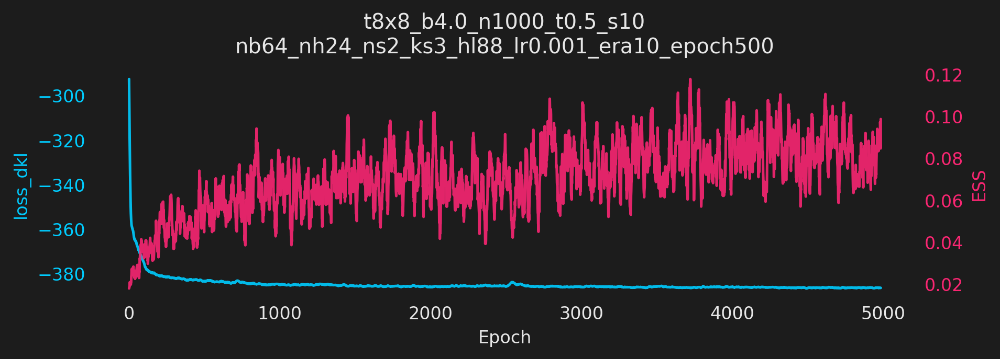

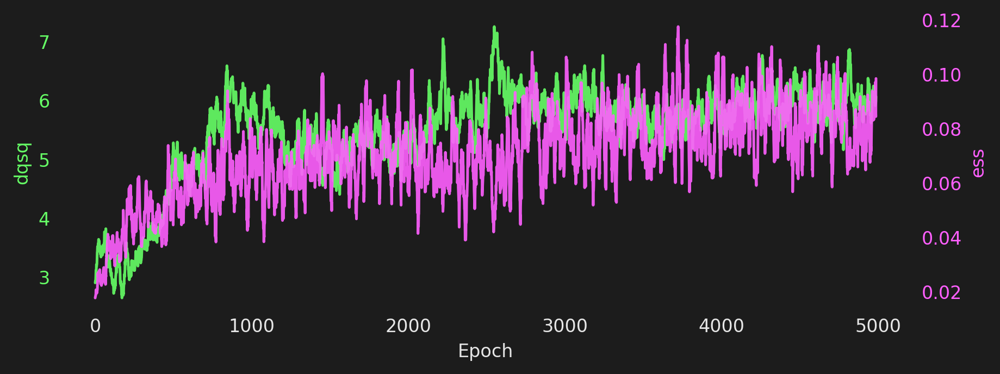

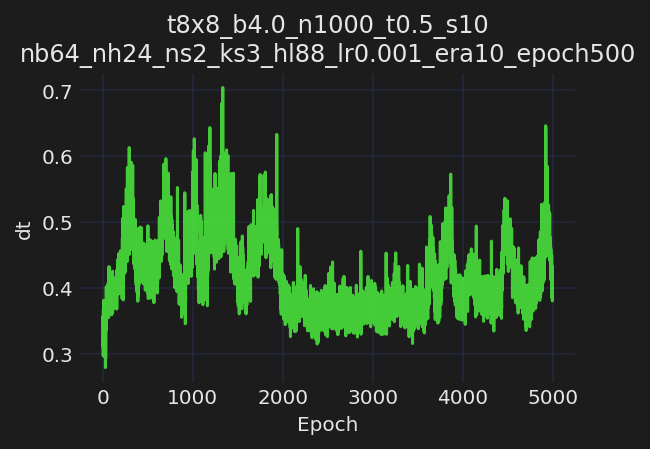

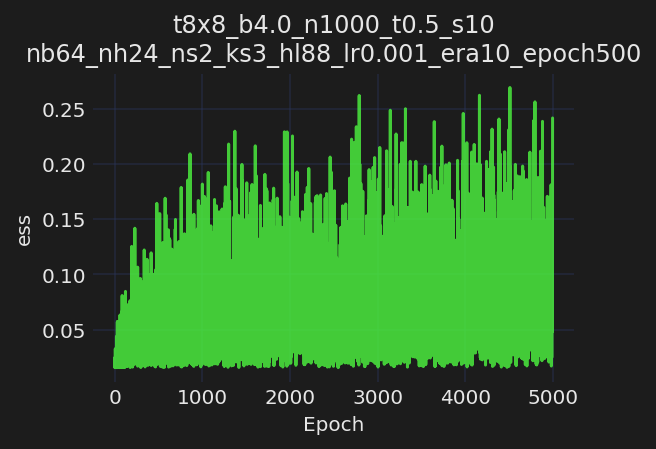

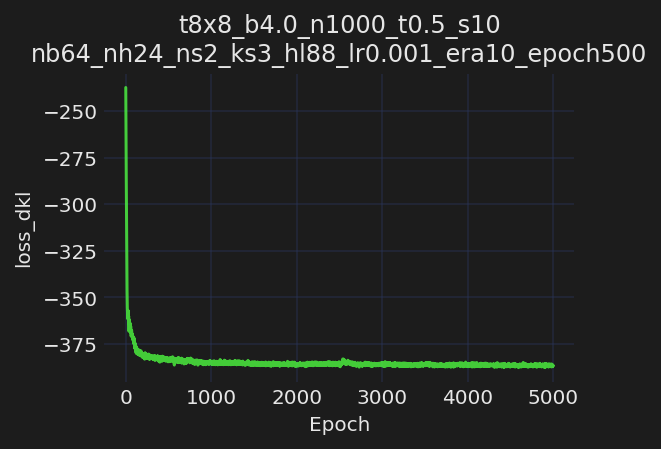

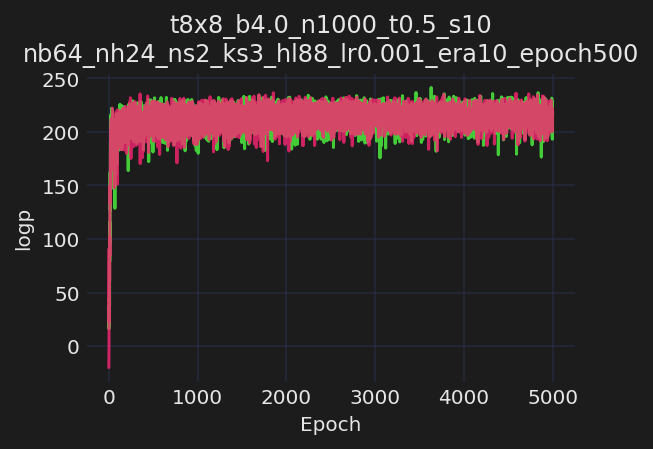

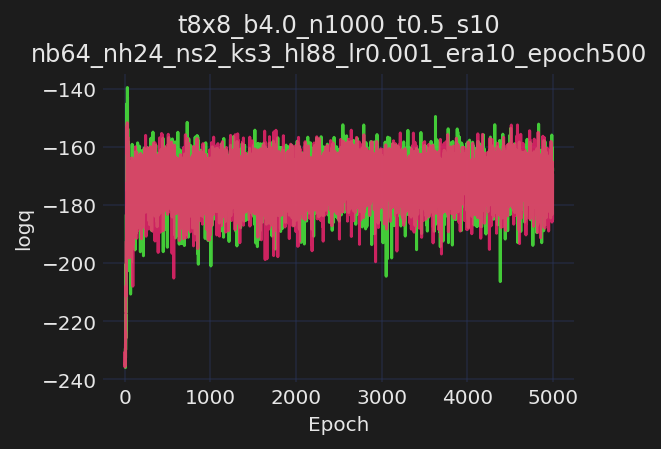

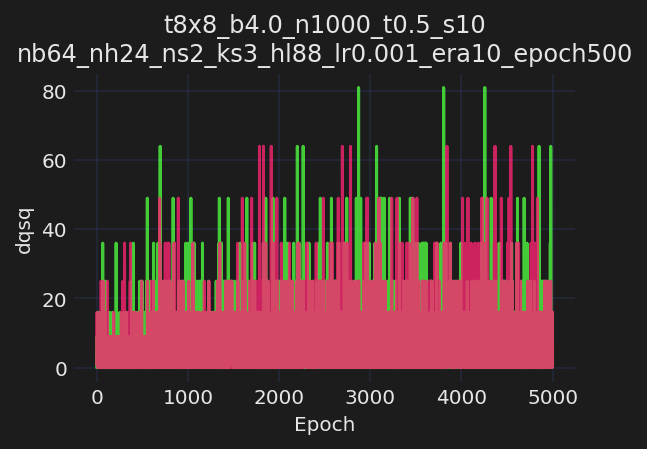

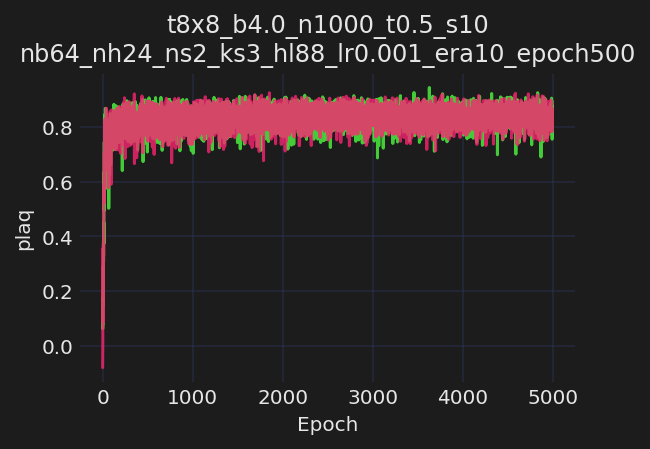

[11:55:53]  Saving train_history to ../../logs/t8x8_b4.0_n1000_t0.5_s10/nb64_nh24_ns2_ks3_hl8
            8_lr0.001_era10_epoch500/training/2021-06-23-111513/train_history.z.

[11:55:58]  Creating directory: ../../logs/t8x8_b4.0_n1000_t0.5_s10/nb64_nh24_ns2_ks3_hl88_lr
            0.001_era10_epoch500/inference/plots

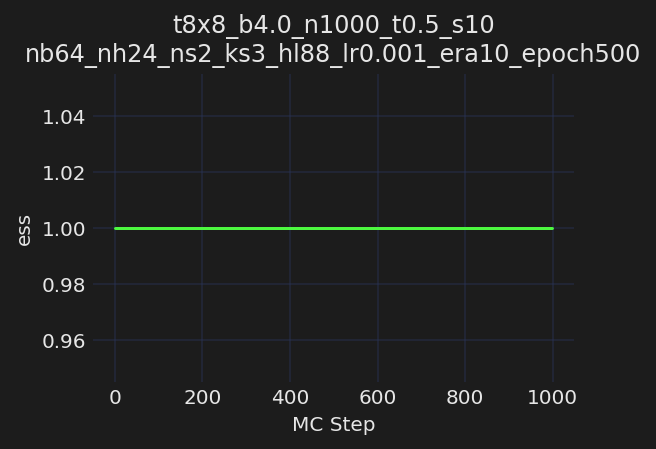

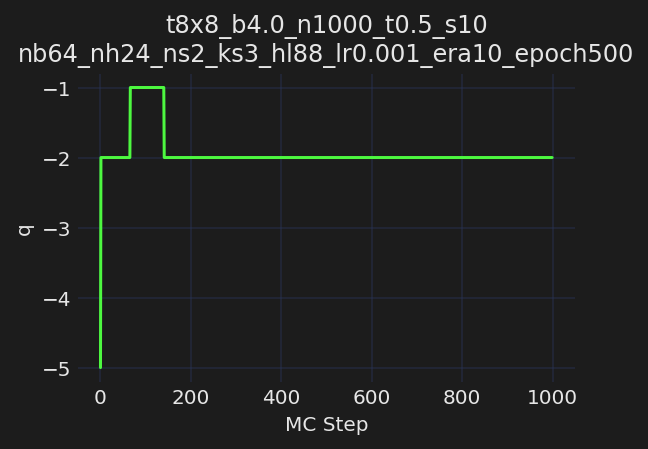

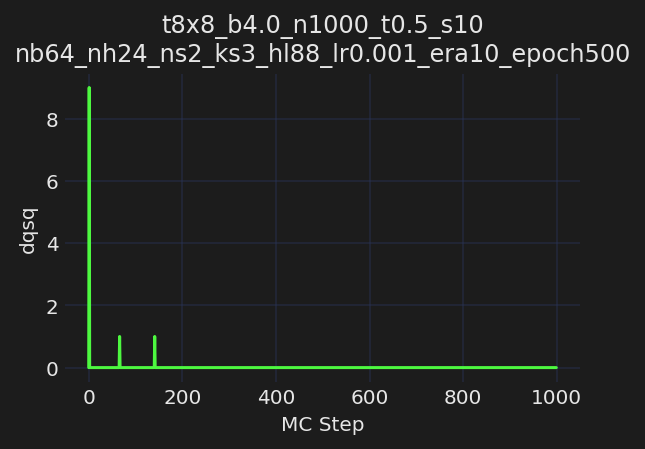

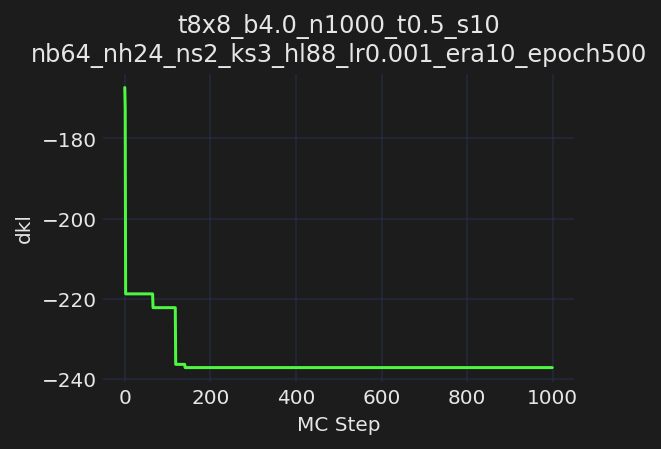

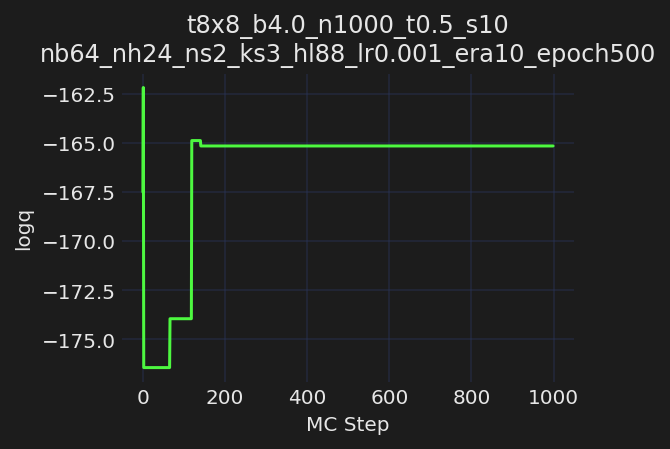

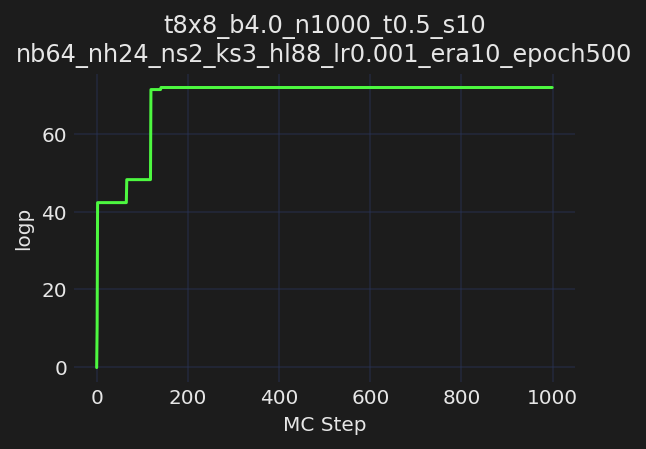

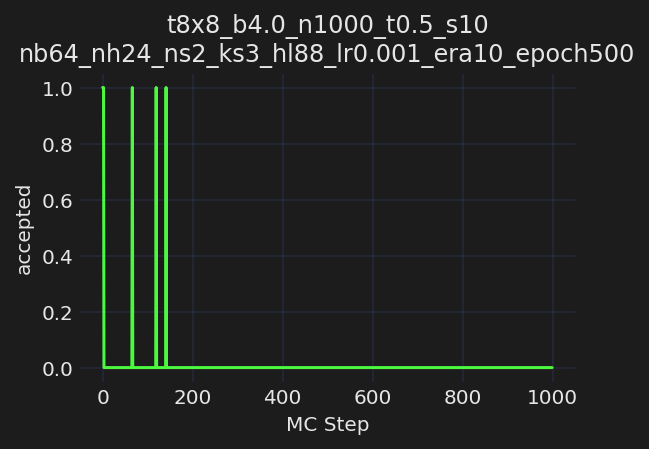

In [8]:
import numpy as np

from train import SchedulerConfig

# -------------------------------------------
# Specify `param` and `train_config` objects
# -------------------------------------------

# param.formatting:
# -----------------
# t{L}x{L}_b{beta}_n{ntraj}_t{tau}_s{nstep}

param = {
    'L': 8,
    'tau': 0.5,
    'nrun': 1,
    'beta': 4.,
    'nstep': 10,
    'ntraj': 1000,
    'nprint': 100,
    'seed': 1331,
}

param = Param(**param)
logger.log(param)

train_config = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 500,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 3,
    'batch_size': 64,
    'print_freq': 10,
    'plot_freq': 10,
})

scheduler_config = SchedulerConfig(
    factor=0.99,
    mode='min',
    patience=50,
    min_lr=5e-6,
    verbose=True,
)

logger.log(repr(train_config))

#torch.set_num_threads(param.nth)
#torch.set_num_interop_threads(param.nth_interop)
#os.environ["OMP_NUM_THREADS"] = str(param.nth)
os.environ["KMP_BLOCKTIME"] = "0"
os.environ["KMP_SETTINGS"] = "1"
os.environ["KMP_AFFINITY"]= "granularity=fine,verbose,compact,1,0"


# train_config.uniquestr() = '_'.join([
#    f'nb{batch_size}',
#    f'nh{n_layers}',
#    f'ns{n_s_nets}',
#    f'ks{kernel_size}',
#    f'hl{hstr}',
#    f'lr{base_lr}',
#    f'era{n_era}',
#    f'epoch{n_epoch}',
# ]
 

# ------------------------------
# Run HMC using `param` above
# ------------------------------
from fthmc.hmc import run_hmc

hmc_fields, hmc_history = run_hmc(param)


# ---------------------------------------
# Train model using `train_config` above
# ---------------------------------------
from fthmc.train import train


train_outputs = train(param,
                      train_config,
                      model=None,  # train_outputs['model'],
                      pre_model=None,
                      figsize=(8, 2.75),
                      dpi=150,
                      scheduler_config=scheduler_config)

pre_flow_plots = train_outputs['plots']
pre_flow_history = train_outputs['history']
flow_act = train_outputs['action']
pre_flow_model = train_outputs['model']
pre_flow_optimizer = train_outputs['optimizer']


# -----------------------------------------------------------
# Run inference on trained model and evaluate / plot metrics
# -----------------------------------------------------------
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history
from fthmc.utils.samplers import make_mcmc_ensemble

action_fn = qed.BatchAction(param.beta)
dirs = train_outputs['dirs']
logdir = dirs['logdir']

inf_dir = os.path.join(logdir, 'inference')
inf_pdir = os.path.join(inf_dir, 'plots')
history = make_mcmc_ensemble(model=train_outputs['model'], action_fn=action_fn,
                             batch_size=train_config.batch_size, num_samples=1000)
plot_history(history=history,
             param=param, config=train_config, skip=['epoch', 'x'],
             num_chains=4, therm_frac=0.0, xlabel='MC Step', outdir=inf_pdir)

In [9]:
import time
import torch.nn as nn

from fthmc.utils.plot_helpers import init_live_plot, update_plot
from math import pi as PI

TWO_PI = 2. * PI

In [93]:
from fthmc.utils.plot_helpers import update_plot
from fthmc.field_transformation import FieldTransformation

flow = train_outputs['model'].layers
flow.eval()

#param = Param(**{
#    'L': 8,
#    'tau': 0.5,
#    'nrun': 1,
#    'beta': 4.,
#    'nstep': 10,
#    'ntraj': 1000,
#    'nprint': 100,
#    'seed': 1331,
#})


#x_ = x[None, :]
#x_.requires_grad_(True)
param.tau = 0.1
param.nstep = 10
x = param.initializer()
#param.tau = 0.25
#param.nstep = 5 
x_ = torch.ones(1, 2, 8, 8)
field_transformation = FieldTransformation(flow=flow, param=param)

ModuleList(
  (0): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (1): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (2): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLaye

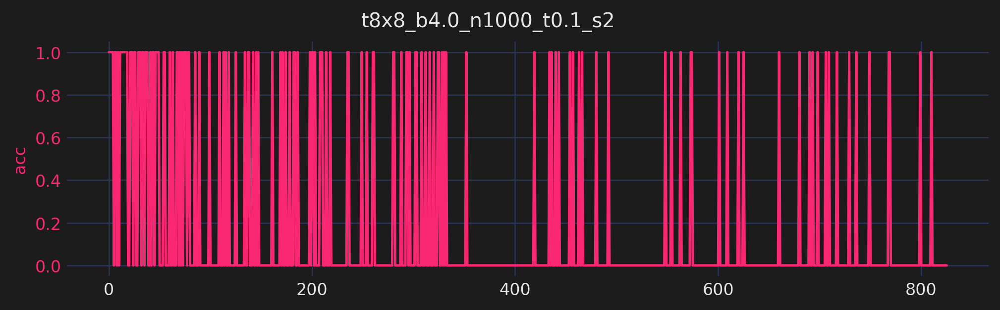

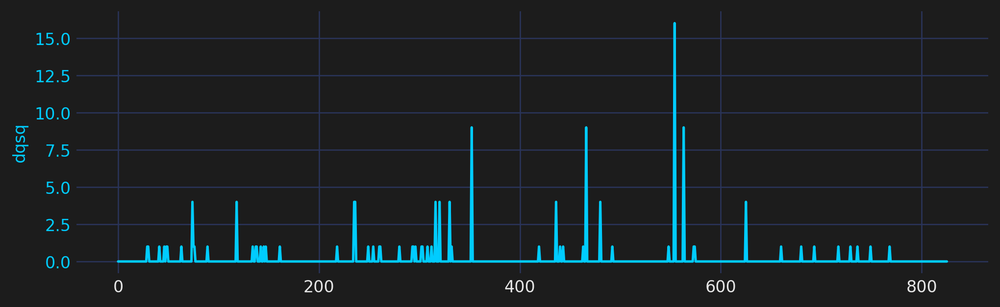

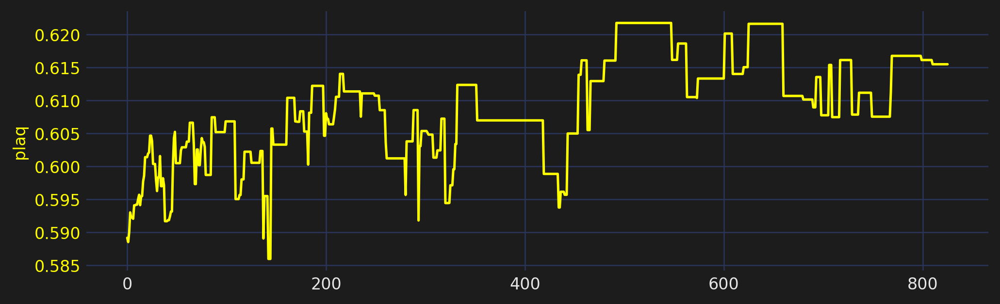

[12:32:05]  plaq=0.589 q=0.000

[12:32:06]  (now) traj=3.333 dt=0.132 acc=0.833 dH=0.000 exp_mdh=0.965 dqsq=0.000 plaq=0.591 
            dh=0.812

            (avg) traj=6.000 dt=0.156 acc=0.000 dH=0.000 exp_mdh=0.018 dqsq=0.000 plaq=0.592 
            dh=4.002

[12:32:08]  (now) traj=5.909 dt=0.138 acc=0.727 dH=0.000 exp_mdh=0.972 dqsq=0.000 plaq=0.592 
            dh=0.524

            (avg) traj=6.500 dt=0.152 acc=0.700 dH=0.000 exp_mdh=0.970 dqsq=0.000 plaq=0.592 
            dh=0.524

[12:32:09]  (now) traj=8.438 dt=0.139 acc=0.812 dH=0.000 exp_mdh=1.029 dqsq=0.000 plaq=0.593 
            dh=0.338

            (avg) traj=11.500 dt=0.144 acc=0.800 dH=0.000 exp_mdh=1.067 dqsq=0.000 plaq=0.594
            dh=0.101

[12:32:10]  (now) traj=10.952 dt=0.144 acc=0.762 dH=0.000 exp_mdh=1.029 dqsq=0.000 plaq=0.595
            dh=0.501

            (avg) traj=16.500 dt=0.150 acc=0.800 dH=0.000 exp_mdh=1.091 dqsq=0.000 plaq=0.598
            dh=0.478

[12:32:12]  (now) traj=13.462 dt=0.150 acc=0.769 dH=0.000 exp_mdh=1.088 dqsq=0.000 plaq=0.596
            dh=0.560

            (avg) traj=21.500 dt=0.166 acc=0.700 dH=0.000 exp_mdh=1.181 dqsq=0.000 plaq=0.602
            dh=0.893

[12:32:13]  (now) traj=15.968 dt=0.151 acc=0.742 dH=0.000 exp_mdh=0.961 dqsq=0.065 plaq=0.597
            dh=0.716

            (avg) traj=26.500 dt=0.166 acc=0.700 dH=0.000 exp_mdh=0.820 dqsq=0.200 plaq=0.601
            dh=1.146

[12:32:14]  (now) traj=18.472 dt=0.151 acc=0.722 dH=0.000 exp_mdh=1.321 dqsq=0.056 plaq=0.597
            dh=0.740

            (avg) traj=31.500 dt=0.154 acc=0.600 dH=0.000 exp_mdh=1.926 dqsq=0.200 plaq=0.599
            dh=1.190

[12:32:16]  (now) traj=20.976 dt=0.153 acc=0.707 dH=0.000 exp_mdh=1.404 dqsq=0.049 plaq=0.597
            dh=0.700

            (avg) traj=36.500 dt=0.160 acc=0.600 dH=0.000 exp_mdh=2.776 dqsq=0.000 plaq=0.596
            dh=0.651

[12:32:17]  (now) traj=23.478 dt=0.155 acc=0.696 dH=0.000 exp_mdh=1.401 dqsq=0.065 plaq=0.596
            dh=0.642

            (avg) traj=41.500 dt=0.170 acc=0.600 dH=0.000 exp_mdh=1.691 dqsq=0.100 plaq=0.593
            dh=0.297

[12:32:19]  (now) traj=25.980 dt=0.156 acc=0.706 dH=0.000 exp_mdh=1.427 dqsq=0.118 plaq=0.597
            dh=0.584

            (avg) traj=46.500 dt=0.166 acc=0.700 dH=0.000 exp_mdh=1.519 dqsq=0.400 plaq=0.597
            dh=0.120

[12:32:20]  (now) traj=28.482 dt=0.155 acc=0.679 dH=0.000 exp_mdh=1.416 dqsq=0.107 plaq=0.597
            dh=0.571

            (avg) traj=51.500 dt=0.153 acc=0.600 dH=0.000 exp_mdh=1.487 dqsq=0.300 plaq=0.602
            dh=0.253

[12:32:21]  (now) traj=30.984 dt=0.155 acc=0.639 dH=0.000 exp_mdh=1.305 dqsq=0.098 plaq=0.598
            dh=0.768

            (avg) traj=56.500 dt=0.152 acc=0.300 dH=0.000 exp_mdh=0.688 dqsq=0.000 plaq=0.602
            dh=1.692

[12:32:23]  (now) traj=33.485 dt=0.155 acc=0.606 dH=0.000 exp_mdh=1.553 dqsq=0.106 plaq=0.598
            dh=0.910

            (avg) traj=61.500 dt=0.155 acc=0.200 dH=0.000 exp_mdh=2.319 dqsq=0.100 plaq=0.604
            dh=2.776

[12:32:24]  (now) traj=35.986 dt=0.155 acc=0.606 dH=0.000 exp_mdh=2.452 dqsq=0.099 plaq=0.599
            dh=0.860

            (avg) traj=66.500 dt=0.153 acc=0.400 dH=0.000 exp_mdh=9.445 dqsq=0.100 plaq=0.603
            dh=1.406

[12:32:25]  (now) traj=38.487 dt=0.154 acc=0.605 dH=0.000 exp_mdh=2.354 dqsq=0.158 plaq=0.599
            dh=0.892

            (avg) traj=71.500 dt=0.150 acc=0.600 dH=0.000 exp_mdh=7.641 dqsq=0.500 plaq=0.602
            dh=0.775

[12:32:26]  (now) traj=40.988 dt=0.154 acc=0.605 dH=0.000 exp_mdh=2.317 dqsq=0.160 plaq=0.599
            dh=0.855

            (avg) traj=76.500 dt=0.146 acc=0.600 dH=0.000 exp_mdh=1.363 dqsq=0.600 plaq=0.602
            dh=0.827

[12:32:28]  (now) traj=43.488 dt=0.153 acc=0.581 dH=0.000 exp_mdh=2.205 dqsq=0.151 plaq=0.599
            dh=0.958

            (avg) traj=81.500 dt=0.145 acc=0.400 dH=0.000 exp_mdh=1.069 dqsq=0.100 plaq=0.601
            dh=1.455

[12:32:29]  (now) traj=45.989 dt=0.153 acc=0.560 dH=0.000 exp_mdh=2.093 dqsq=0.154 plaq=0.599
            dh=1.046

            (avg) traj=86.500 dt=0.144 acc=0.200 dH=0.000 exp_mdh=0.278 dqsq=0.100 plaq=0.603
            dh=2.566

[12:32:30]  (now) traj=48.490 dt=0.152 acc=0.531 dH=0.000 exp_mdh=1.988 dqsq=0.146 plaq=0.600
            dh=1.202

            (avg) traj=91.500 dt=0.145 acc=0.100 dH=0.000 exp_mdh=0.125 dqsq=0.100 plaq=0.606
            dh=3.273

[12:32:31]  (now) traj=50.990 dt=0.152 acc=0.515 dH=0.000 exp_mdh=1.902 dqsq=0.139 plaq=0.600
            dh=1.315

            (avg) traj=96.500 dt=0.146 acc=0.100 dH=0.000 exp_mdh=0.162 dqsq=0.000 plaq=0.606
            dh=3.745

[12:32:33]  (now) traj=53.491 dt=0.152 acc=0.491 dH=0.000 exp_mdh=1.820 dqsq=0.132 plaq=0.600
            dh=1.386

            (avg) traj=101.500 dt=0.151 acc=0.100 dH=0.000 exp_mdh=0.207 dqsq=0.000          
            plaq=0.606 dh=3.132

[12:32:34]  (now) traj=55.991 dt=0.152 acc=0.477 dH=0.000 exp_mdh=1.753 dqsq=0.126 plaq=0.600
            dh=1.413

            (avg) traj=106.500 dt=0.154 acc=0.100 dH=0.000 exp_mdh=0.251 dqsq=0.000          
            plaq=0.604 dh=2.385

[12:32:35]  (now) traj=58.491 dt=0.152 acc=0.474 dH=0.000 exp_mdh=1.718 dqsq=0.121 plaq=0.600
            dh=1.401

            (avg) traj=111.500 dt=0.147 acc=0.300 dH=0.000 exp_mdh=0.632 dqsq=0.000          
            plaq=0.599 dh=1.565

[12:32:36]  (now) traj=60.992 dt=0.152 acc=0.463 dH=0.000 exp_mdh=1.658 dqsq=0.149 plaq=0.600
            dh=1.459

            (avg) traj=116.500 dt=0.157 acc=0.300 dH=0.000 exp_mdh=0.598 dqsq=0.400          
            plaq=0.598 dh=1.969

[12:32:38]  (now) traj=63.492 dt=0.153 acc=0.452 dH=0.000 exp_mdh=1.607 dqsq=0.143 plaq=0.600
            dh=1.496

            (avg) traj=121.500 dt=0.167 acc=0.200 dH=0.000 exp_mdh=0.324 dqsq=0.400          
            plaq=0.601 dh=2.583

[12:32:39]  (now) traj=65.992 dt=0.154 acc=0.435 dH=0.000 exp_mdh=1.547 dqsq=0.137 plaq=0.600
            dh=1.603

            (avg) traj=126.500 dt=0.167 acc=0.100 dH=0.000 exp_mdh=0.202 dqsq=0.000          
            plaq=0.601 dh=3.327

[12:32:41]  (now) traj=68.493 dt=0.154 acc=0.426 dH=0.000 exp_mdh=1.496 dqsq=0.140 plaq=0.600
            dh=1.696

            (avg) traj=131.500 dt=0.172 acc=0.100 dH=0.000 exp_mdh=0.091 dqsq=0.100          
            plaq=0.601 dh=4.195

[12:32:42]  (now) traj=70.993 dt=0.155 acc=0.426 dH=0.000 exp_mdh=2.746 dqsq=0.149 plaq=0.600
            dh=1.670

            (avg) traj=136.500 dt=0.168 acc=0.300 dH=0.000 exp_mdh=18.451 dqsq=0.300         
            plaq=0.598 dh=2.541

[12:32:44]  (now) traj=73.493 dt=0.155 acc=0.425 dH=0.000 exp_mdh=2.672 dqsq=0.158 plaq=0.600
            dh=1.670

            (avg) traj=141.500 dt=0.163 acc=0.400 dH=0.000 exp_mdh=18.665 dqsq=0.400         
            plaq=0.594 dh=1.316

[12:32:45]  (now) traj=75.993 dt=0.155 acc=0.417 dH=0.000 exp_mdh=2.587 dqsq=0.159 plaq=0.600
            dh=1.689

            (avg) traj=146.500 dt=0.162 acc=0.300 dH=0.000 exp_mdh=0.351 dqsq=0.300          
            plaq=0.598 dh=1.954

[12:32:46]  (now) traj=78.494 dt=0.156 acc=0.404 dH=0.000 exp_mdh=2.507 dqsq=0.154 plaq=0.600
            dh=1.746

            (avg) traj=151.500 dt=0.172 acc=0.100 dH=0.000 exp_mdh=0.103 dqsq=0.100          
            plaq=0.604 dh=2.855

[12:32:48]  (now) traj=80.994 dt=0.156 acc=0.391 dH=0.000 exp_mdh=2.435 dqsq=0.149 plaq=0.600
            dh=1.756

            (avg) traj=156.500 dt=0.173 acc=0.000 dH=0.000 exp_mdh=0.135 dqsq=0.000          
            plaq=0.603 dh=2.758

[12:32:49]  (now) traj=83.494 dt=0.156 acc=0.386 dH=0.000 exp_mdh=2.363 dqsq=0.151 plaq=0.601
            dh=1.848

            (avg) traj=161.500 dt=0.163 acc=0.100 dH=0.000 exp_mdh=0.111 dqsq=0.100          
            plaq=0.607 dh=3.434

[12:32:50]  (now) traj=85.994 dt=0.156 acc=0.380 dH=0.000 exp_mdh=2.297 dqsq=0.146 plaq=0.601
            dh=1.912

            (avg) traj=166.500 dt=0.152 acc=0.200 dH=0.000 exp_mdh=0.072 dqsq=0.100          
            plaq=0.610 dh=4.417

[12:32:52]  (now) traj=88.494 dt=0.156 acc=0.381 dH=0.000 exp_mdh=2.244 dqsq=0.142 plaq=0.601
            dh=1.897

            (avg) traj=171.500 dt=0.144 acc=0.300 dH=0.000 exp_mdh=0.273 dqsq=0.000          
            plaq=0.608 dh=2.692

[12:32:53]  (now) traj=90.994 dt=0.155 acc=0.376 dH=0.000 exp_mdh=2.189 dqsq=0.138 plaq=0.601
            dh=1.950

            (avg) traj=176.500 dt=0.145 acc=0.300 dH=0.000 exp_mdh=0.358 dqsq=0.000          
            plaq=0.607 dh=2.590

[12:32:54]  (now) traj=93.495 dt=0.155 acc=0.376 dH=0.000 exp_mdh=2.568 dqsq=0.134 plaq=0.601
            dh=1.943

            (avg) traj=181.500 dt=0.145 acc=0.300 dH=0.000 exp_mdh=8.268 dqsq=0.000          
            plaq=0.606 dh=2.763

[12:32:56]  (now) traj=95.995 dt=0.155 acc=0.372 dH=0.000 exp_mdh=2.554 dqsq=0.131 plaq=0.602
            dh=2.013

            (avg) traj=186.500 dt=0.154 acc=0.300 dH=0.000 exp_mdh=9.151 dqsq=0.000          
            plaq=0.609 dh=3.148

[12:32:57]  (now) traj=98.495 dt=0.156 acc=0.362 dH=0.000 exp_mdh=2.489 dqsq=0.128 plaq=0.602
            dh=2.098

            (avg) traj=191.500 dt=0.162 acc=0.100 dH=0.000 exp_mdh=1.024 dqsq=0.000          
            plaq=0.612 dh=4.963

[12:32:58]  (now) traj=100.995 dt=0.156 acc=0.363 dH=0.000 exp_mdh=2.433 dqsq=0.124          
            plaq=0.602 dh=2.097

            (avg) traj=196.500 dt=0.160 acc=0.200 dH=0.000 exp_mdh=0.127 dqsq=0.000          
            plaq=0.610 dh=3.707

[12:33:00]  (now) traj=103.495 dt=0.155 acc=0.364 dH=0.000 exp_mdh=2.482 dqsq=0.121          
            plaq=0.602 dh=2.067

            (avg) traj=201.500 dt=0.155 acc=0.400 dH=0.000 exp_mdh=2.349 dqsq=0.000          
            plaq=0.608 dh=1.466

[12:33:01]  (now) traj=105.995 dt=0.155 acc=0.370 dH=0.000 exp_mdh=2.458 dqsq=0.118          
            plaq=0.602 dh=2.048

            (avg) traj=206.500 dt=0.149 acc=0.500 dH=0.000 exp_mdh=2.955 dqsq=0.000          
            plaq=0.607 dh=1.064

[12:33:02]  (now) traj=108.495 dt=0.155 acc=0.366 dH=0.000 exp_mdh=2.414 dqsq=0.116          
            plaq=0.602 dh=2.085

            (avg) traj=211.500 dt=0.150 acc=0.400 dH=0.000 exp_mdh=1.013 dqsq=0.000          
            plaq=0.610 dh=2.443

[12:33:04]  (now) traj=110.995 dt=0.155 acc=0.362 dH=0.000 exp_mdh=2.370 dqsq=0.118          
            plaq=0.603 dh=2.091

            (avg) traj=216.500 dt=0.154 acc=0.200 dH=0.000 exp_mdh=0.518 dqsq=0.100          
            plaq=0.612 dh=2.991

[12:33:05]  (now) traj=113.496 dt=0.155 acc=0.354 dH=0.000 exp_mdh=2.321 dqsq=0.115          
            plaq=0.603 dh=2.135

            (avg) traj=221.500 dt=0.154 acc=0.100 dH=0.000 exp_mdh=0.318 dqsq=0.100          
            plaq=0.612 dh=3.222

[12:33:06]  (now) traj=115.996 dt=0.155 acc=0.346 dH=0.000 exp_mdh=2.272 dqsq=0.113          
            plaq=0.603 dh=2.179

            (avg) traj=226.500 dt=0.151 acc=0.000 dH=0.000 exp_mdh=0.112 dqsq=0.000          
            plaq=0.611 dh=4.101

[12:33:08]  (now) traj=118.496 dt=0.155 acc=0.343 dH=0.000 exp_mdh=2.235 dqsq=0.127          
            plaq=0.603 dh=2.229

            (avg) traj=231.500 dt=0.157 acc=0.100 dH=0.000 exp_mdh=0.292 dqsq=0.400          
            plaq=0.611 dh=4.332

[12:33:09]  (now) traj=120.996 dt=0.155 acc=0.340 dH=0.000 exp_mdh=2.218 dqsq=0.141          
            plaq=0.603 dh=2.253

            (avg) traj=236.500 dt=0.161 acc=0.200 dH=0.000 exp_mdh=0.967 dqsq=0.800          
            plaq=0.611 dh=3.957

[12:33:10]  (now) traj=123.496 dt=0.155 acc=0.333 dH=0.000 exp_mdh=2.174 dqsq=0.138          
            plaq=0.604 dh=2.309

            (avg) traj=241.500 dt=0.152 acc=0.100 dH=0.000 exp_mdh=0.722 dqsq=0.400          
            plaq=0.611 dh=4.189

[12:33:11]  (now) traj=125.996 dt=0.155 acc=0.331 dH=0.000 exp_mdh=2.133 dqsq=0.139          
            plaq=0.604 dh=2.351

            (avg) traj=246.500 dt=0.153 acc=0.100 dH=0.000 exp_mdh=0.076 dqsq=0.100          
            plaq=0.611 dh=4.713

[12:33:13]  (now) traj=128.496 dt=0.155 acc=0.328 dH=0.000 exp_mdh=2.099 dqsq=0.141          
            plaq=0.604 dh=2.361

            (avg) traj=251.500 dt=0.152 acc=0.200 dH=0.000 exp_mdh=0.253 dqsq=0.200          
            plaq=0.610 dh=3.630

[12:33:14]  (now) traj=130.996 dt=0.155 acc=0.326 dH=0.000 exp_mdh=2.081 dqsq=0.142          
            plaq=0.604 dh=2.365

            (avg) traj=256.500 dt=0.148 acc=0.200 dH=0.000 exp_mdh=0.790 dqsq=0.200          
            plaq=0.609 dh=2.714

[12:33:15]  (now) traj=133.496 dt=0.155 acc=0.323 dH=0.000 exp_mdh=2.046 dqsq=0.143          
            plaq=0.604 dh=2.376

            (avg) traj=261.500 dt=0.149 acc=0.200 dH=0.000 exp_mdh=0.680 dqsq=0.200          
            plaq=0.604 dh=2.756

[12:33:17]  (now) traj=135.996 dt=0.155 acc=0.317 dH=0.000 exp_mdh=2.008 dqsq=0.140          
            plaq=0.604 dh=2.418

            (avg) traj=266.500 dt=0.147 acc=0.100 dH=0.000 exp_mdh=0.096 dqsq=0.100          
            plaq=0.601 dh=3.803

[12:33:18]  (now) traj=138.496 dt=0.154 acc=0.312 dH=0.000 exp_mdh=1.973 dqsq=0.138          
            plaq=0.604 dh=2.471

            (avg) traj=271.500 dt=0.147 acc=0.000 dH=0.000 exp_mdh=0.040 dqsq=0.000          
            plaq=0.601 dh=5.005

[12:33:19]  (now) traj=140.996 dt=0.154 acc=0.310 dH=0.000 exp_mdh=1.940 dqsq=0.139          
            plaq=0.604 dh=2.486

            (avg) traj=276.500 dt=0.148 acc=0.100 dH=0.000 exp_mdh=0.082 dqsq=0.100          
            plaq=0.601 dh=4.304

[12:33:20]  (now) traj=143.497 dt=0.154 acc=0.308 dH=0.000 exp_mdh=1.913 dqsq=0.136          
            plaq=0.604 dh=2.484

            (avg) traj=281.500 dt=0.152 acc=0.200 dH=0.000 exp_mdh=0.261 dqsq=0.100          
            plaq=0.602 dh=2.836

[12:33:22]  (now) traj=145.997 dt=0.154 acc=0.306 dH=0.000 exp_mdh=2.003 dqsq=0.134          
            plaq=0.604 dh=2.475

            (avg) traj=286.500 dt=0.157 acc=0.200 dH=0.000 exp_mdh=3.781 dqsq=0.000          
            plaq=0.605 dh=2.182

[12:33:23]  (now) traj=148.497 dt=0.154 acc=0.307 dH=0.000 exp_mdh=1.982 dqsq=0.139          
            plaq=0.604 dh=2.516

            (avg) traj=291.500 dt=0.157 acc=0.300 dH=0.000 exp_mdh=3.952 dqsq=0.200          
            plaq=0.605 dh=3.420

[12:33:24]  (now) traj=150.997 dt=0.155 acc=0.306 dH=0.000 exp_mdh=1.950 dqsq=0.140          
            plaq=0.604 dh=2.543

            (avg) traj=296.500 dt=0.156 acc=0.300 dH=0.000 exp_mdh=0.412 dqsq=0.300          
            plaq=0.604 dh=4.508

[12:33:26]  (now) traj=153.497 dt=0.154 acc=0.307 dH=0.000 exp_mdh=1.923 dqsq=0.144          
            plaq=0.604 dh=2.556

            (avg) traj=301.500 dt=0.153 acc=0.300 dH=0.000 exp_mdh=0.168 dqsq=0.300          
            plaq=0.605 dh=3.750

[12:33:27]  (now) traj=155.997 dt=0.154 acc=0.305 dH=0.000 exp_mdh=1.896 dqsq=0.145          
            plaq=0.604 dh=2.557

            (avg) traj=306.500 dt=0.145 acc=0.300 dH=0.000 exp_mdh=0.268 dqsq=0.300          
            plaq=0.604 dh=2.974

[12:33:28]  (now) traj=158.497 dt=0.154 acc=0.304 dH=0.000 exp_mdh=1.879 dqsq=0.146          
            plaq=0.604 dh=2.561

            (avg) traj=311.500 dt=0.144 acc=0.200 dH=0.000 exp_mdh=0.528 dqsq=0.200          
            plaq=0.602 dh=2.705

[12:33:30]  (now) traj=160.997 dt=0.154 acc=0.305 dH=0.000 exp_mdh=1.852 dqsq=0.168          
            plaq=0.604 dh=2.586

            (avg) traj=316.500 dt=0.146 acc=0.300 dH=0.000 exp_mdh=0.495 dqsq=0.900          
            plaq=0.603 dh=3.499

[12:33:31]  (now) traj=163.497 dt=0.154 acc=0.307 dH=0.000 exp_mdh=1.861 dqsq=0.166          
            plaq=0.604 dh=2.571

            (avg) traj=321.500 dt=0.145 acc=0.400 dH=0.000 exp_mdh=1.293 dqsq=0.800          
            plaq=0.600 dh=2.889

[12:33:32]  (now) traj=165.997 dt=0.154 acc=0.308 dH=0.000 exp_mdh=1.927 dqsq=0.175          
            plaq=0.604 dh=2.552

            (avg) traj=326.500 dt=0.153 acc=0.400 dH=0.000 exp_mdh=4.337 dqsq=0.400          
            plaq=0.597 dh=1.458

[12:33:34]  (now) traj=168.497 dt=0.154 acc=0.307 dH=0.000 exp_mdh=1.913 dqsq=0.176          
            plaq=0.604 dh=2.568

            (avg) traj=331.500 dt=0.162 acc=0.300 dH=0.000 exp_mdh=3.635 dqsq=0.500          
            plaq=0.605 dh=2.471

[12:33:35]  (now) traj=170.997 dt=0.154 acc=0.302 dH=0.000 exp_mdh=1.886 dqsq=0.173          
            plaq=0.604 dh=2.645

            (avg) traj=336.500 dt=0.158 acc=0.100 dH=0.000 exp_mdh=0.498 dqsq=0.100          
            plaq=0.611 dh=5.711

[12:33:36]  (now) traj=173.497 dt=0.154 acc=0.298 dH=0.000 exp_mdh=1.858 dqsq=0.171          
            plaq=0.604 dh=2.715

            (avg) traj=341.500 dt=0.152 acc=0.000 dH=0.000 exp_mdh=0.009 dqsq=0.000          
            plaq=0.612 dh=7.648

[12:33:38]  (now) traj=175.997 dt=0.154 acc=0.293 dH=0.000 exp_mdh=1.832 dqsq=0.168          
            plaq=0.604 dh=2.773

            (avg) traj=346.500 dt=0.146 acc=0.000 dH=0.000 exp_mdh=0.018 dqsq=0.000          
            plaq=0.612 dh=7.140

[12:33:39]  (now) traj=178.497 dt=0.154 acc=0.292 dH=0.000 exp_mdh=1.825 dqsq=0.191          
            plaq=0.604 dh=2.850

            (avg) traj=351.500 dt=0.142 acc=0.100 dH=0.000 exp_mdh=0.674 dqsq=0.900          
            plaq=0.610 dh=7.483

[12:33:40]  (now) traj=180.997 dt=0.154 acc=0.288 dH=0.000 exp_mdh=1.800 dqsq=0.188          
            plaq=0.604 dh=2.941

            (avg) traj=356.500 dt=0.142 acc=0.100 dH=0.000 exp_mdh=0.658 dqsq=0.900          
            plaq=0.608 dh=8.799

[12:33:41]  (now) traj=183.497 dt=0.153 acc=0.284 dH=0.000 exp_mdh=1.775 dqsq=0.186          
            plaq=0.604 dh=3.053

            (avg) traj=361.500 dt=0.143 acc=0.000 dH=0.000 exp_mdh=0.001 dqsq=0.000          
            plaq=0.607 dh=10.263

[12:33:43]  (now) traj=185.997 dt=0.153 acc=0.280 dH=0.000 exp_mdh=1.751 dqsq=0.183          
            plaq=0.604 dh=3.137

            (avg) traj=366.500 dt=0.145 acc=0.000 dH=0.000 exp_mdh=0.002 dqsq=0.000          
            plaq=0.607 dh=10.187

[12:33:44]  (now) traj=188.497 dt=0.153 acc=0.277 dH=0.000 exp_mdh=1.729 dqsq=0.181          
            plaq=0.604 dh=3.198

            (avg) traj=371.500 dt=0.151 acc=0.000 dH=0.000 exp_mdh=0.026 dqsq=0.000          
            plaq=0.607 dh=8.491

[12:33:45]  (now) traj=190.997 dt=0.153 acc=0.273 dH=0.000 exp_mdh=1.706 dqsq=0.178          
            plaq=0.604 dh=3.297

            (avg) traj=376.500 dt=0.154 acc=0.000 dH=0.000 exp_mdh=0.025 dqsq=0.000          
            plaq=0.607 dh=9.236

[12:33:47]  (now) traj=193.497 dt=0.153 acc=0.269 dH=0.000 exp_mdh=1.684 dqsq=0.176          
            plaq=0.604 dh=3.370

            (avg) traj=381.500 dt=0.151 acc=0.000 dH=0.000 exp_mdh=0.001 dqsq=0.000          
            plaq=0.607 dh=9.834

[12:33:48]  (now) traj=195.997 dt=0.153 acc=0.266 dH=0.000 exp_mdh=1.663 dqsq=0.174          
            plaq=0.604 dh=3.438

            (avg) traj=386.500 dt=0.149 acc=0.000 dH=0.000 exp_mdh=0.007 dqsq=0.000          
            plaq=0.607 dh=8.784

[12:33:49]  (now) traj=198.497 dt=0.153 acc=0.263 dH=0.000 exp_mdh=1.642 dqsq=0.172          
            plaq=0.604 dh=3.498

            (avg) traj=391.500 dt=0.149 acc=0.000 dH=0.000 exp_mdh=0.020 dqsq=0.000          
            plaq=0.607 dh=8.415

[12:33:51]  (now) traj=200.998 dt=0.153 acc=0.259 dH=0.000 exp_mdh=1.622 dqsq=0.170          
            plaq=0.604 dh=3.556

            (avg) traj=396.500 dt=0.149 acc=0.000 dH=0.000 exp_mdh=0.023 dqsq=0.000          
            plaq=0.607 dh=8.180

[12:33:52]  (now) traj=203.498 dt=0.153 acc=0.256 dH=0.000 exp_mdh=1.602 dqsq=0.167          
            plaq=0.604 dh=3.625

            (avg) traj=401.500 dt=0.143 acc=0.000 dH=0.000 exp_mdh=0.008 dqsq=0.000          
            plaq=0.607 dh=8.655

[12:33:53]  (now) traj=205.998 dt=0.153 acc=0.253 dH=0.000 exp_mdh=1.582 dqsq=0.165          
            plaq=0.604 dh=3.709

            (avg) traj=406.500 dt=0.142 acc=0.000 dH=0.000 exp_mdh=0.001 dqsq=0.000          
            plaq=0.607 dh=9.830

[12:33:54]  (now) traj=208.498 dt=0.153 acc=0.250 dH=0.000 exp_mdh=1.565 dqsq=0.163          
            plaq=0.604 dh=3.752

            (avg) traj=411.500 dt=0.147 acc=0.000 dH=0.000 exp_mdh=0.064 dqsq=0.000          
            plaq=0.607 dh=8.882

[12:33:56]  (now) traj=210.998 dt=0.153 acc=0.249 dH=0.000 exp_mdh=1.550 dqsq=0.164          
            plaq=0.604 dh=3.797

            (avg) traj=416.500 dt=0.146 acc=0.100 dH=0.000 exp_mdh=0.215 dqsq=0.100          
            plaq=0.605 dh=7.407

[12:33:57]  (now) traj=213.498 dt=0.153 acc=0.246 dH=0.000 exp_mdh=1.532 dqsq=0.162          
            plaq=0.604 dh=3.861

            (avg) traj=421.500 dt=0.145 acc=0.100 dH=0.000 exp_mdh=0.152 dqsq=0.100          
            plaq=0.601 dh=8.400

[12:33:58]  (now) traj=215.998 dt=0.153 acc=0.244 dH=0.000 exp_mdh=1.514 dqsq=0.160          
            plaq=0.604 dh=3.925

            (avg) traj=426.500 dt=0.149 acc=0.000 dH=0.000 exp_mdh=0.001 dqsq=0.000          
            plaq=0.599 dh=9.269

[12:34:00]  (now) traj=218.498 dt=0.153 acc=0.243 dH=0.000 exp_mdh=1.497 dqsq=0.158          
            plaq=0.604 dh=3.960

            (avg) traj=431.500 dt=0.154 acc=0.100 dH=0.000 exp_mdh=0.005 dqsq=0.000          
            plaq=0.598 dh=8.177

[12:34:01]  (now) traj=220.998 dt=0.153 acc=0.245 dH=0.000 exp_mdh=1.481 dqsq=0.168          
            plaq=0.604 dh=3.948

            (avg) traj=436.500 dt=0.156 acc=0.300 dH=0.000 exp_mdh=0.087 dqsq=0.500          
            plaq=0.596 dh=4.971

[12:34:02]  (now) traj=223.498 dt=0.153 acc=0.244 dH=0.000 exp_mdh=1.468 dqsq=0.168          
            plaq=0.604 dh=3.953

            (avg) traj=441.500 dt=0.151 acc=0.300 dH=0.000 exp_mdh=0.240 dqsq=0.600          
            plaq=0.599 dh=3.623

[12:34:03]  (now) traj=225.998 dt=0.152 acc=0.242 dH=0.000 exp_mdh=1.453 dqsq=0.166          
            plaq=0.604 dh=3.953

            (avg) traj=446.500 dt=0.146 acc=0.100 dH=0.000 exp_mdh=0.203 dqsq=0.100          
            plaq=0.603 dh=4.149

[12:34:05]  (now) traj=228.498 dt=0.152 acc=0.241 dH=0.000 exp_mdh=1.439 dqsq=0.164          
            plaq=0.604 dh=3.940

            (avg) traj=451.500 dt=0.147 acc=0.100 dH=0.000 exp_mdh=0.117 dqsq=0.000          
            plaq=0.607 dh=3.390

[12:34:06]  (now) traj=230.998 dt=0.152 acc=0.241 dH=0.000 exp_mdh=1.427 dqsq=0.163          
            plaq=0.604 dh=3.923

            (avg) traj=456.500 dt=0.146 acc=0.200 dH=0.000 exp_mdh=0.233 dqsq=0.000          
            plaq=0.612 dh=2.585

[12:34:07]  (now) traj=233.498 dt=0.152 acc=0.240 dH=0.000 exp_mdh=1.413 dqsq=0.163          
            plaq=0.604 dh=3.908

            (avg) traj=461.500 dt=0.148 acc=0.200 dH=0.000 exp_mdh=0.218 dqsq=0.100          
            plaq=0.613 dh=2.425

[12:34:08]  (now) traj=235.998 dt=0.152 acc=0.240 dH=0.000 exp_mdh=1.401 dqsq=0.180          
            plaq=0.604 dh=3.904

            (avg) traj=466.500 dt=0.148 acc=0.200 dH=0.000 exp_mdh=0.207 dqsq=1.000          
            plaq=0.611 dh=3.009

[12:34:10]  (now) traj=238.498 dt=0.152 acc=0.237 dH=0.000 exp_mdh=1.387 dqsq=0.179          
            plaq=0.605 dh=3.906

            (avg) traj=471.500 dt=0.144 acc=0.100 dH=0.000 exp_mdh=0.183 dqsq=0.900          
            plaq=0.613 dh=3.810

[12:34:11]  (now) traj=240.998 dt=0.152 acc=0.237 dH=0.000 exp_mdh=1.399 dqsq=0.185          
            plaq=0.605 dh=3.889

            (avg) traj=476.500 dt=0.151 acc=0.100 dH=0.000 exp_mdh=1.332 dqsq=0.400          
            plaq=0.613 dh=3.205

[12:34:12]  (now) traj=243.498 dt=0.152 acc=0.235 dH=0.000 exp_mdh=1.385 dqsq=0.183          
            plaq=0.605 dh=3.923

            (avg) traj=481.500 dt=0.151 acc=0.100 dH=0.000 exp_mdh=1.302 dqsq=0.400          
            plaq=0.615 dh=4.729

[12:34:14]  (now) traj=245.998 dt=0.152 acc=0.232 dH=0.000 exp_mdh=1.371 dqsq=0.181          
            plaq=0.605 dh=3.963

            (avg) traj=486.500 dt=0.148 acc=0.000 dH=0.000 exp_mdh=0.005 dqsq=0.000          
            plaq=0.616 dh=7.496

[12:34:15]  (now) traj=248.498 dt=0.152 acc=0.232 dH=0.000 exp_mdh=1.482 dqsq=0.181          
            plaq=0.605 dh=4.021

            (avg) traj=491.500 dt=0.150 acc=0.100 dH=0.000 exp_mdh=6.211 dqsq=0.100          
            plaq=0.618 dh=8.771

[12:34:16]  (now) traj=250.998 dt=0.152 acc=0.230 dH=0.000 exp_mdh=1.467 dqsq=0.180          
            plaq=0.605 dh=4.095

            (avg) traj=496.500 dt=0.154 acc=0.100 dH=0.000 exp_mdh=6.210 dqsq=0.100          
            plaq=0.621 dh=10.593

[12:34:17]  (now) traj=253.498 dt=0.152 acc=0.227 dH=0.000 exp_mdh=1.453 dqsq=0.178          
            plaq=0.605 dh=4.164

            (avg) traj=501.500 dt=0.159 acc=0.000 dH=0.000 exp_mdh=0.019 dqsq=0.000          
            plaq=0.622 dh=11.233

[12:34:19]  (now) traj=255.998 dt=0.152 acc=0.225 dH=0.000 exp_mdh=1.439 dqsq=0.176          
            plaq=0.606 dh=4.240

            (avg) traj=506.500 dt=0.153 acc=0.000 dH=0.000 exp_mdh=0.019 dqsq=0.000          
            plaq=0.622 dh=11.488

[12:34:20]  (now) traj=258.498 dt=0.152 acc=0.223 dH=0.000 exp_mdh=1.425 dqsq=0.174          
            plaq=0.606 dh=4.299

            (avg) traj=511.500 dt=0.146 acc=0.000 dH=0.000 exp_mdh=0.000 dqsq=0.000          
            plaq=0.622 dh=11.122

[12:34:21]  (now) traj=260.998 dt=0.152 acc=0.221 dH=0.000 exp_mdh=1.412 dqsq=0.173          
            plaq=0.606 dh=4.369

            (avg) traj=516.500 dt=0.146 acc=0.000 dH=0.000 exp_mdh=0.000 dqsq=0.000          
            plaq=0.622 dh=10.932

[12:34:23]  (now) traj=263.498 dt=0.152 acc=0.219 dH=0.000 exp_mdh=1.398 dqsq=0.171          
            plaq=0.606 dh=4.418

            (avg) traj=521.500 dt=0.165 acc=0.000 dH=0.000 exp_mdh=0.000 dqsq=0.000          
            plaq=0.622 dh=10.583

[12:34:24]  (now) traj=265.998 dt=0.153 acc=0.217 dH=0.000 exp_mdh=1.385 dqsq=0.169          
            plaq=0.606 dh=4.461

            (avg) traj=526.500 dt=0.174 acc=0.000 dH=0.000 exp_mdh=0.001 dqsq=0.000          
            plaq=0.622 dh=9.224

[12:34:26]  (now) traj=268.498 dt=0.153 acc=0.215 dH=0.000 exp_mdh=1.372 dqsq=0.168          
            plaq=0.606 dh=4.543

            (avg) traj=531.500 dt=0.162 acc=0.000 dH=0.000 exp_mdh=0.001 dqsq=0.000          
            plaq=0.622 dh=11.112

[12:34:27]  (now) traj=270.998 dt=0.153 acc=0.213 dH=0.000 exp_mdh=1.359 dqsq=0.166          
            plaq=0.606 dh=4.598

            (avg) traj=536.500 dt=0.158 acc=0.000 dH=0.000 exp_mdh=0.003 dqsq=0.000          
            plaq=0.622 dh=11.895

[12:34:28]  (now) traj=273.498 dt=0.153 acc=0.211 dH=0.000 exp_mdh=1.347 dqsq=0.165          
            plaq=0.607 dh=4.640

            (avg) traj=541.500 dt=0.159 acc=0.000 dH=0.000 exp_mdh=0.006 dqsq=0.000          
            plaq=0.622 dh=9.803

[12:34:30]  (now) traj=275.998 dt=0.153 acc=0.211 dH=0.000 exp_mdh=1.336 dqsq=0.165          
            plaq=0.607 dh=4.660

            (avg) traj=546.500 dt=0.158 acc=0.100 dH=0.000 exp_mdh=0.071 dqsq=0.100          
            plaq=0.620 dh=7.974

[12:34:31]  (now) traj=278.498 dt=0.153 acc=0.210 dH=0.000 exp_mdh=1.326 dqsq=0.192          
            plaq=0.607 dh=4.653

            (avg) traj=551.500 dt=0.156 acc=0.200 dH=0.000 exp_mdh=0.190 dqsq=1.700          
            plaq=0.618 dh=5.357

[12:34:33]  (now) traj=280.998 dt=0.153 acc=0.209 dH=0.000 exp_mdh=1.314 dqsq=0.191          
            plaq=0.607 dh=4.695

            (avg) traj=556.500 dt=0.161 acc=0.100 dH=0.000 exp_mdh=0.123 dqsq=1.600          
            plaq=0.618 dh=6.617

[12:34:34]  (now) traj=283.498 dt=0.153 acc=0.208 dH=0.000 exp_mdh=1.303 dqsq=0.205          
            plaq=0.607 dh=4.703

            (avg) traj=561.500 dt=0.165 acc=0.100 dH=0.000 exp_mdh=0.036 dqsq=0.900          
            plaq=0.616 dh=7.460

[12:34:35]  (now) traj=285.998 dt=0.153 acc=0.207 dH=0.000 exp_mdh=1.292 dqsq=0.203          
            plaq=0.607 dh=4.722

            (avg) traj=566.500 dt=0.157 acc=0.100 dH=0.000 exp_mdh=0.036 dqsq=0.900          
            plaq=0.612 dh=6.257

[12:34:37]  (now) traj=288.498 dt=0.153 acc=0.208 dH=0.000 exp_mdh=1.290 dqsq=0.205          
            plaq=0.607 dh=4.706

            (avg) traj=571.500 dt=0.157 acc=0.200 dH=0.000 exp_mdh=0.519 dqsq=0.200          
            plaq=0.611 dh=4.904

[12:34:38]  (now) traj=290.998 dt=0.153 acc=0.207 dH=0.000 exp_mdh=1.279 dqsq=0.203          
            plaq=0.607 dh=4.735

            (avg) traj=576.500 dt=0.160 acc=0.200 dH=0.000 exp_mdh=0.517 dqsq=0.200          
            plaq=0.612 dh=5.470

[12:34:40]  (now) traj=293.498 dt=0.153 acc=0.205 dH=0.000 exp_mdh=1.268 dqsq=0.201          
            plaq=0.607 dh=4.773

            (avg) traj=581.500 dt=0.159 acc=0.000 dH=0.000 exp_mdh=0.002 dqsq=0.000          
            plaq=0.613 dh=8.647

[12:34:41]  (now) traj=295.998 dt=0.153 acc=0.203 dH=0.000 exp_mdh=1.257 dqsq=0.200          
            plaq=0.607 dh=4.794

            (avg) traj=586.500 dt=0.156 acc=0.000 dH=0.000 exp_mdh=0.004 dqsq=0.000          
            plaq=0.613 dh=8.227

[12:34:42]  (now) traj=298.498 dt=0.153 acc=0.201 dH=0.000 exp_mdh=1.247 dqsq=0.198          
            plaq=0.607 dh=4.806

            (avg) traj=591.500 dt=0.151 acc=0.000 dH=0.000 exp_mdh=0.007 dqsq=0.000          
            plaq=0.613 dh=6.702

[12:34:44]  (now) traj=300.998 dt=0.153 acc=0.200 dH=0.000 exp_mdh=1.236 dqsq=0.196          
            plaq=0.607 dh=4.824

            (avg) traj=596.500 dt=0.151 acc=0.000 dH=0.000 exp_mdh=0.008 dqsq=0.000          
            plaq=0.613 dh=6.590

[12:34:45]  (now) traj=303.498 dt=0.153 acc=0.200 dH=0.000 exp_mdh=1.227 dqsq=0.195          
            plaq=0.607 dh=4.830

            (avg) traj=601.500 dt=0.162 acc=0.100 dH=0.000 exp_mdh=0.039 dqsq=0.000          
            plaq=0.617 dh=6.274

[12:34:46]  (now) traj=305.998 dt=0.153 acc=0.200 dH=0.000 exp_mdh=1.220 dqsq=0.193          
            plaq=0.607 dh=4.841

            (avg) traj=606.500 dt=0.166 acc=0.200 dH=0.000 exp_mdh=0.221 dqsq=0.000          
            plaq=0.619 dh=5.834

[12:34:48]  (now) traj=308.498 dt=0.153 acc=0.198 dH=0.000 exp_mdh=1.210 dqsq=0.192          
            plaq=0.608 dh=4.833

            (avg) traj=611.500 dt=0.160 acc=0.100 dH=0.000 exp_mdh=0.212 dqsq=0.000          
            plaq=0.616 dh=5.004

[12:34:49]  (now) traj=310.998 dt=0.153 acc=0.198 dH=0.000 exp_mdh=1.202 dqsq=0.190          
            plaq=0.608 dh=4.829

            (avg) traj=616.500 dt=0.152 acc=0.100 dH=0.000 exp_mdh=0.114 dqsq=0.000          
            plaq=0.614 dh=4.135

[12:34:50]  (now) traj=313.498 dt=0.153 acc=0.198 dH=0.000 exp_mdh=1.194 dqsq=0.195          
            plaq=0.608 dh=4.846

[12:34:51]  (avg) traj=621.500 dt=0.149 acc=0.200 dH=0.000 exp_mdh=0.212 dqsq=0.400          
            plaq=0.615 dh=5.665

[12:34:52]  (now) traj=315.998 dt=0.153 acc=0.197 dH=0.000 exp_mdh=1.185 dqsq=0.193          
            plaq=0.608 dh=4.884

            (avg) traj=626.500 dt=0.154 acc=0.100 dH=0.000 exp_mdh=0.126 dqsq=0.400          
            plaq=0.619 dh=8.303

[12:34:53]  (now) traj=318.498 dt=0.153 acc=0.195 dH=0.000 exp_mdh=1.176 dqsq=0.192          
            plaq=0.608 dh=4.927

            (avg) traj=631.500 dt=0.156 acc=0.000 dH=0.000 exp_mdh=0.000 dqsq=0.000          
            plaq=0.622 dh=10.000

[12:34:55]  (now) traj=320.998 dt=0.153 acc=0.193 dH=0.000 exp_mdh=1.167 dqsq=0.190          
            plaq=0.608 dh=4.955

            (avg) traj=636.500 dt=0.159 acc=0.000 dH=0.000 exp_mdh=0.031 dqsq=0.000          
            plaq=0.622 dh=9.418

[12:34:56]  (now) traj=323.498 dt=0.153 acc=0.192 dH=0.000 exp_mdh=1.158 dqsq=0.189          
            plaq=0.608 dh=4.992

            (avg) traj=641.500 dt=0.159 acc=0.000 dH=0.000 exp_mdh=0.037 dqsq=0.000          
            plaq=0.622 dh=9.066

[12:34:57]  (now) traj=325.998 dt=0.153 acc=0.190 dH=0.000 exp_mdh=1.149 dqsq=0.187          
            plaq=0.608 dh=5.022

            (avg) traj=646.500 dt=0.158 acc=0.000 dH=0.000 exp_mdh=0.006 dqsq=0.000          
            plaq=0.622 dh=9.286

[12:34:59]  (now) traj=328.498 dt=0.153 acc=0.189 dH=0.000 exp_mdh=1.140 dqsq=0.186          
            plaq=0.608 dh=5.056

            (avg) traj=651.500 dt=0.157 acc=0.000 dH=0.000 exp_mdh=0.000 dqsq=0.000          
            plaq=0.622 dh=9.235

[12:35:00]  (now) traj=330.998 dt=0.153 acc=0.189 dH=0.000 exp_mdh=1.132 dqsq=0.186          
            plaq=0.608 dh=5.086

            (avg) traj=656.500 dt=0.154 acc=0.100 dH=0.000 exp_mdh=0.001 dqsq=0.100          
            plaq=0.621 dh=9.260

[12:35:01]  (now) traj=333.498 dt=0.154 acc=0.188 dH=0.000 exp_mdh=1.123 dqsq=0.185          
            plaq=0.608 dh=5.087

[12:35:02]  (avg) traj=661.500 dt=0.158 acc=0.100 dH=0.000 exp_mdh=0.014 dqsq=0.100          
            plaq=0.615 dh=7.061

[12:35:03]  (now) traj=335.999 dt=0.153 acc=0.186 dH=0.000 exp_mdh=1.115 dqsq=0.183          
            plaq=0.608 dh=5.088

            (avg) traj=666.500 dt=0.155 acc=0.000 dH=0.000 exp_mdh=0.027 dqsq=0.000          
            plaq=0.611 dh=5.245

[12:35:04]  (now) traj=338.499 dt=0.153 acc=0.185 dH=0.000 exp_mdh=1.107 dqsq=0.182          
            plaq=0.608 dh=5.103

            (avg) traj=671.500 dt=0.148 acc=0.000 dH=0.000 exp_mdh=0.018 dqsq=0.000          
            plaq=0.611 dh=6.185

[12:35:06]  (now) traj=340.999 dt=0.153 acc=0.185 dH=0.000 exp_mdh=1.099 dqsq=0.182          
            plaq=0.608 dh=5.094

            (avg) traj=676.500 dt=0.156 acc=0.100 dH=0.000 exp_mdh=0.034 dqsq=0.100          
            plaq=0.611 dh=5.501

[12:35:07]  (now) traj=343.499 dt=0.154 acc=0.184 dH=0.000 exp_mdh=1.092 dqsq=0.181          
            plaq=0.608 dh=5.097

            (avg) traj=681.500 dt=0.159 acc=0.100 dH=0.000 exp_mdh=0.051 dqsq=0.100          
            plaq=0.610 dh=4.672

[12:35:08]  (now) traj=345.999 dt=0.154 acc=0.184 dH=0.000 exp_mdh=1.090 dqsq=0.179          
            plaq=0.608 dh=5.089

            (avg) traj=686.500 dt=0.158 acc=0.100 dH=0.000 exp_mdh=0.453 dqsq=0.000          
            plaq=0.610 dh=4.704

[12:35:10]  (now) traj=348.499 dt=0.154 acc=0.184 dH=0.000 exp_mdh=1.090 dqsq=0.180          
            plaq=0.608 dh=5.072

            (avg) traj=691.500 dt=0.158 acc=0.200 dH=0.000 exp_mdh=1.009 dqsq=0.100          
            plaq=0.611 dh=3.391

[12:35:11]  (now) traj=350.999 dt=0.154 acc=0.184 dH=0.000 exp_mdh=1.088 dqsq=0.178          
            plaq=0.608 dh=5.059

            (avg) traj=696.500 dt=0.159 acc=0.200 dH=0.000 exp_mdh=0.980 dqsq=0.100          
            plaq=0.611 dh=2.974

[12:35:13]  (now) traj=353.499 dt=0.154 acc=0.183 dH=0.000 exp_mdh=1.081 dqsq=0.177          
            plaq=0.608 dh=5.058

            (avg) traj=701.500 dt=0.162 acc=0.100 dH=0.000 exp_mdh=0.427 dqsq=0.000          
            plaq=0.609 dh=4.070

[12:35:14]  (now) traj=355.999 dt=0.154 acc=0.184 dH=0.000 exp_mdh=1.076 dqsq=0.176          
            plaq=0.609 dh=5.034

            (avg) traj=706.500 dt=0.155 acc=0.200 dH=0.000 exp_mdh=0.200 dqsq=0.000          
            plaq=0.610 dh=3.335

[12:35:15]  (now) traj=358.499 dt=0.154 acc=0.183 dH=0.000 exp_mdh=1.069 dqsq=0.175          
            plaq=0.608 dh=5.031

            (avg) traj=711.500 dt=0.154 acc=0.200 dH=0.000 exp_mdh=0.224 dqsq=0.000          
            plaq=0.610 dh=3.175

[12:35:17]  (now) traj=360.999 dt=0.154 acc=0.183 dH=0.000 exp_mdh=1.079 dqsq=0.175          
            plaq=0.609 dh=5.022

            (avg) traj=716.500 dt=0.160 acc=0.100 dH=0.000 exp_mdh=1.311 dqsq=0.100          
            plaq=0.611 dh=4.178

[12:35:18]  (now) traj=363.499 dt=0.154 acc=0.182 dH=0.000 exp_mdh=1.072 dqsq=0.174          
            plaq=0.609 dh=5.021

            (avg) traj=721.500 dt=0.157 acc=0.100 dH=0.000 exp_mdh=1.279 dqsq=0.100          
            plaq=0.615 dh=4.306

[12:35:19]  (now) traj=365.999 dt=0.154 acc=0.182 dH=0.000 exp_mdh=1.065 dqsq=0.174          
            plaq=0.609 dh=5.021

            (avg) traj=726.500 dt=0.150 acc=0.100 dH=0.000 exp_mdh=0.067 dqsq=0.100          
            plaq=0.614 dh=4.926

[12:35:21]  (now) traj=368.499 dt=0.154 acc=0.181 dH=0.000 exp_mdh=1.059 dqsq=0.173          
            plaq=0.609 dh=5.010

            (avg) traj=731.500 dt=0.150 acc=0.100 dH=0.000 exp_mdh=0.084 dqsq=0.100          
            plaq=0.610 dh=4.198

[12:35:22]  (now) traj=370.999 dt=0.154 acc=0.181 dH=0.000 exp_mdh=1.053 dqsq=0.173          
            plaq=0.609 dh=5.003

            (avg) traj=736.500 dt=0.156 acc=0.100 dH=0.000 exp_mdh=0.116 dqsq=0.100          
            plaq=0.610 dh=3.688

[12:35:24]  (now) traj=373.499 dt=0.154 acc=0.180 dH=0.000 exp_mdh=1.046 dqsq=0.172          
            plaq=0.609 dh=4.999

            (avg) traj=741.500 dt=0.155 acc=0.100 dH=0.000 exp_mdh=0.094 dqsq=0.100          
            plaq=0.611 dh=4.139

[12:35:25]  (now) traj=375.999 dt=0.154 acc=0.180 dH=0.000 exp_mdh=1.042 dqsq=0.172          
            plaq=0.609 dh=4.982

            (avg) traj=746.500 dt=0.155 acc=0.100 dH=0.000 exp_mdh=0.275 dqsq=0.100          
            plaq=0.610 dh=3.412

[12:35:26]  (now) traj=378.499 dt=0.154 acc=0.179 dH=0.000 exp_mdh=1.035 dqsq=0.171          
            plaq=0.609 dh=4.997

            (avg) traj=751.500 dt=0.154 acc=0.100 dH=0.000 exp_mdh=0.267 dqsq=0.100          
            plaq=0.609 dh=4.850

[12:35:28]  (now) traj=380.999 dt=0.154 acc=0.177 dH=0.000 exp_mdh=1.029 dqsq=0.170          
            plaq=0.609 dh=5.002

            (avg) traj=756.500 dt=0.157 acc=0.000 dH=0.000 exp_mdh=0.013 dqsq=0.000          
            plaq=0.608 dh=6.537

[12:35:29]  (now) traj=383.499 dt=0.154 acc=0.176 dH=0.000 exp_mdh=1.022 dqsq=0.168          
            plaq=0.609 dh=5.002

            (avg) traj=761.500 dt=0.161 acc=0.000 dH=0.000 exp_mdh=0.049 dqsq=0.000          
            plaq=0.608 dh=5.424

[12:35:31]  (now) traj=385.999 dt=0.154 acc=0.178 dH=0.000 exp_mdh=1.021 dqsq=0.169          
            plaq=0.609 dh=4.984

            (avg) traj=766.500 dt=0.159 acc=0.200 dH=0.000 exp_mdh=0.442 dqsq=0.100          
            plaq=0.610 dh=3.585

[12:35:32]  (now) traj=388.499 dt=0.154 acc=0.177 dH=0.000 exp_mdh=1.014 dqsq=0.168          
            plaq=0.609 dh=5.004

            (avg) traj=771.500 dt=0.158 acc=0.200 dH=0.000 exp_mdh=0.405 dqsq=0.100          
            plaq=0.614 dh=5.116

[12:35:33]  (now) traj=390.999 dt=0.154 acc=0.175 dH=0.000 exp_mdh=1.009 dqsq=0.166          
            plaq=0.609 dh=4.990

            (avg) traj=776.500 dt=0.158 acc=0.000 dH=0.000 exp_mdh=0.056 dqsq=0.000          
            plaq=0.617 dh=5.472

[12:35:35]  (now) traj=393.499 dt=0.154 acc=0.174 dH=0.000 exp_mdh=1.002 dqsq=0.165          
            plaq=0.609 dh=4.998

            (avg) traj=781.500 dt=0.166 acc=0.000 dH=0.000 exp_mdh=0.067 dqsq=0.000          
            plaq=0.617 dh=4.561

[12:35:37]  (now) traj=395.999 dt=0.154 acc=0.173 dH=0.000 exp_mdh=0.996 dqsq=0.164          
            plaq=0.609 dh=5.009

            (avg) traj=786.500 dt=0.198 acc=0.000 dH=0.000 exp_mdh=0.038 dqsq=0.000          
            plaq=0.617 dh=6.475

[12:35:38]  (now) traj=398.499 dt=0.155 acc=0.172 dH=0.000 exp_mdh=0.990 dqsq=0.163          
            plaq=0.609 dh=5.020

            (avg) traj=791.500 dt=0.211 acc=0.000 dH=0.000 exp_mdh=0.030 dqsq=0.000          
            plaq=0.617 dh=6.734

[12:35:40]  (now) traj=400.999 dt=0.155 acc=0.172 dH=0.000 exp_mdh=0.990 dqsq=0.162          
            plaq=0.609 dh=5.021

            (avg) traj=796.500 dt=0.192 acc=0.100 dH=0.000 exp_mdh=0.446 dqsq=0.000          
            plaq=0.617 dh=6.007

[12:35:41]  (now) traj=403.499 dt=0.155 acc=0.171 dH=0.000 exp_mdh=0.985 dqsq=0.161          
            plaq=0.609 dh=5.038

            (avg) traj=801.500 dt=0.171 acc=0.100 dH=0.000 exp_mdh=0.540 dqsq=0.000          
            plaq=0.616 dh=6.468

[12:35:44]  (now) traj=405.999 dt=0.156 acc=0.171 dH=0.000 exp_mdh=0.980 dqsq=0.160          
            plaq=0.609 dh=5.049

            (avg) traj=806.500 dt=0.248 acc=0.100 dH=0.000 exp_mdh=0.194 dqsq=0.000          
            plaq=0.616 dh=7.217

[12:35:46]  (now) traj=408.499 dt=0.156 acc=0.170 dH=0.000 exp_mdh=0.974 dqsq=0.159          
            plaq=0.609 dh=5.050

            (avg) traj=811.500 dt=0.264 acc=0.100 dH=0.000 exp_mdh=0.109 dqsq=0.000          
            plaq=0.616 dh=6.005

[12:35:47]  (now) traj=410.999 dt=0.156 acc=0.169 dH=0.000 exp_mdh=0.968 dqsq=0.158          
            plaq=0.609 dh=5.054

            (avg) traj=816.500 dt=0.186 acc=0.000 dH=0.000 exp_mdh=0.044 dqsq=0.000          
            plaq=0.615 dh=5.521

[12:35:49]  (now) traj=413.499 dt=0.157 acc=0.168 dH=0.000 exp_mdh=0.962 dqsq=0.157          
            plaq=0.609 dh=5.064

            (avg) traj=821.500 dt=0.182 acc=0.000 dH=0.000 exp_mdh=0.032 dqsq=0.000          
            plaq=0.615 dh=6.245

KeyboardInterrupt: 

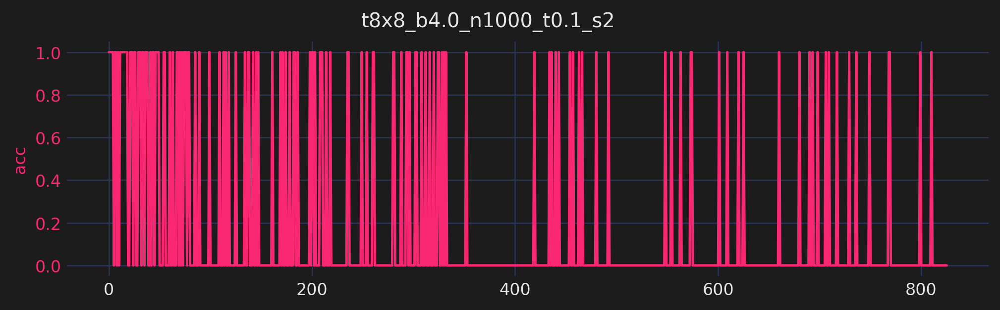

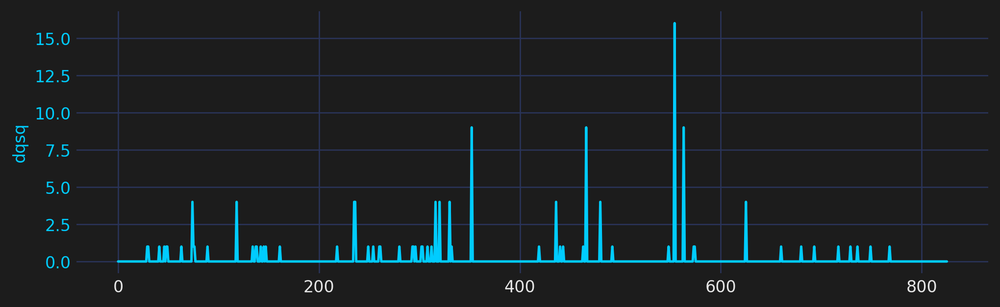

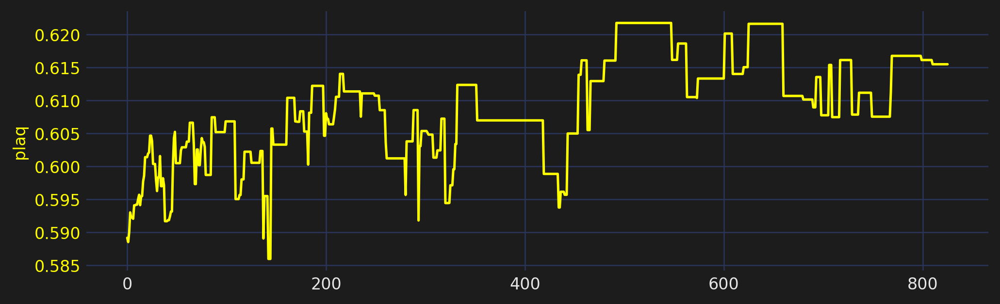

In [25]:
plt.style.use('~/.matplotlib/stylelib/molokai.mplstyle')

#x_ = x[None, :]
#x_.requires_grad_(True)
param.tau = 0.1
param.nstep = 2
x = param.initializer()
#param.tau = 0.25
#param.nstep = 5 
x_ = torch.ones(1, 2, 8, 8)

runs_history = field_transformation.run(x=x[None, :],  nprint=5,
                                        figsize=(8.5, 2.5),
                                        dpi=120, nplot=5)

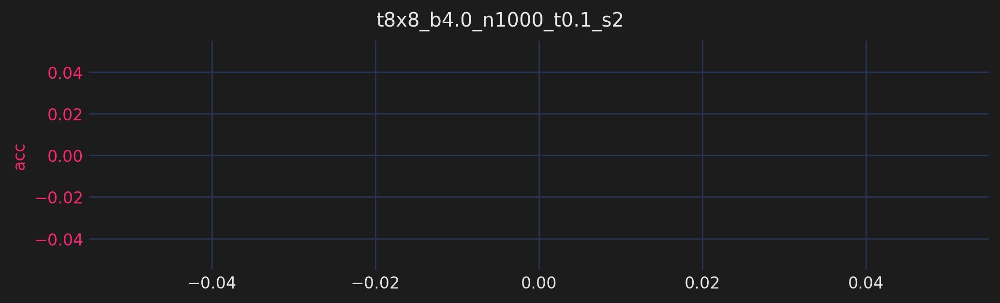

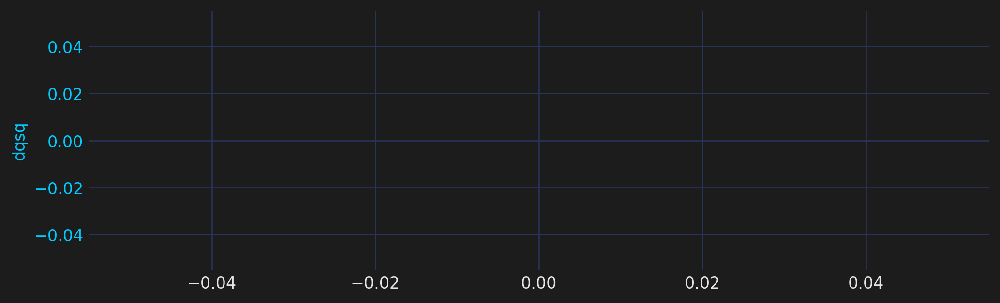

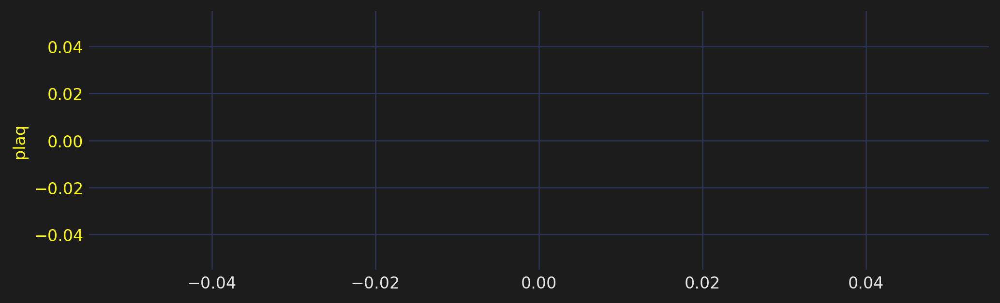

[13:29:47]  plaq=0.589 q=0.000

RuntimeError: element 0 of tensors does not require grad and does not have a grad_fn

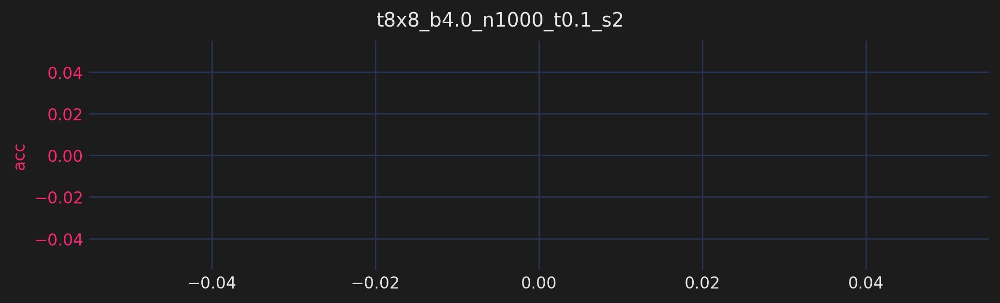

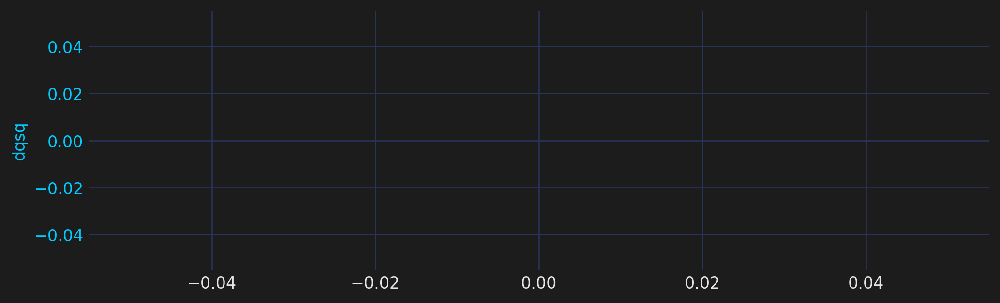

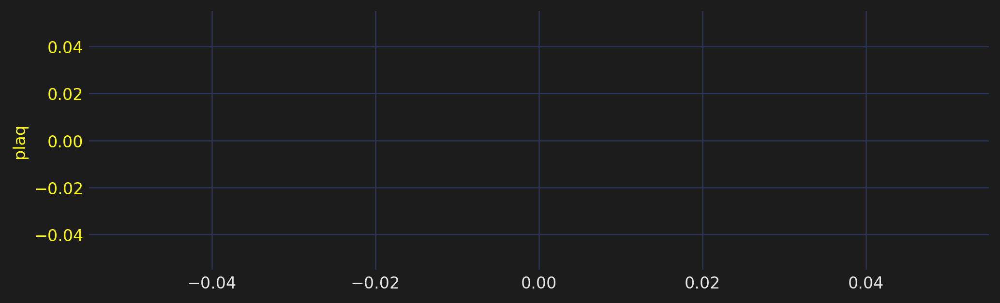

In [94]:
plt.style.use('~/.matplotlib/stylelib/molokai.mplstyle')

#x_ = x[None, :]
#x_.requires_grad_(True)
param.tau = 0.1
param.nstep = 2
x = param.initializer()
#param.tau = 0.25
#param.nstep = 5 
x_ = torch.ones(1, 2, 8, 8)

runs_history = field_transformation.run(x=x[None, :],  nprint=5,
                                        figsize=(8.5, 2.5),
                                        dpi=120, nplot=5)

In [87]:
from fthmc.hmc import HamiltonianMonteCarlo

hmc = HamiltonianMonteCarlo(param)

hmc.run()



from fthmc.hmc import run_hmc, run_hmc1

hmc_fields_arr,  hmc_histories = run_hmc1(param)

# Compare with training run above

In [ ]:
from fthmc.train import train
from fthmc.hmc import run_hmc
param = {
    'L': 8,
    'tau': 0.5,
    'nrun': 1,
    'beta': np.float32(4.),
    'nstep': 20,
    'ntraj': 1000,
    'nprint': 100,
    'seed': 1331,
}

train_config = TrainConfig(**{
    'n_era': 50,
    'n_epoch': 500,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 5,
    'batch_size': 64,
    'print_freq': 100,
    'plot_freq': 100,
})


param = Param(**param)
logger.log(repr(train_config))

# ------------------------------
# Run HMC using `param` above
# ------------------------------

hmc_fields, hmc_history = run_hmc(param)


# ---------------------------------------
# Train model using `train_config` above
# ---------------------------------------

%matplotlib inline
plt.style.use('/lus/grand/projects/DLHMC/molokai.mplstyle')
sns.set_context('paper', font_scale=0.6)

train_outputs = train(param,
                      train_config,
                      model=None,
                      pre_model=None,
                      figsize=(5, 2))

pre_flow_plots = train_outputs['plots']
pre_flow_history = train_outputs['history']
flow_act = train_outputs['action']
pre_flow_model = train_outputs['model']
pre_flow_optimizer = train_outputs['optimizer']


# -----------------------------------------------------------
# Run inference on trained model and evaluate / plot metrics
# -----------------------------------------------------------
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history
from fthmc.utils.samplers import make_mcmc_ensemble

action_fn = qed.BatchAction(param.beta)
dirs = train_outputs['dirs']
logdir = dirs['logdir']

inf_dir = os.path.join(logdir, 'inference')
inf_pdir = os.path.join(inf_dir, 'plots')
history = make_mcmc_ensemble(model=train_outputs['model'], action_fn=action_fn,
                             batch_size=train_config.batch_size, num_samples=1000)
plot_history(history=history,
             param=param, config=train_config, skip=['epoch', 'x'],
             num_chains=4, therm_frac=0.0, xlabel='MC Step', outdir=inf_pdir)

# Transfer to larger lattice

In [21]:
from dataclasses import asdict
from fthmc.train import train, transfer_to_new_lattice
%matplotlib inline

from torch import nn 

plt.style.use('default')
plt.style.use('/lus/grand/projects/DLHMC/molokai.mplstyle')
sns.set_context('paper', font_scale=0.6)


def transfer(
        L: int,
        param_init: Param,
        config_init: TrainConfig,
        layers_init: nn.ModuleList,
        new_lr: float = None,
        run_hmc: bool = True
):
    xfr = transfer_to_new_lattice(L=L,
                                  layers=layers,
                                  param_init=param_init)
    param_new = xfr['param']
    model_new = xfr['model']
    # ----------------------------------------------
    # Run HMC using new (transferred) `param` above
    # ----------------------------------------------
    if run_hmc:
        from fthmc.hmc import run_hmc
        hmc_fields, hmc_history = run_hmc(param_new)


    if new_lr is not None:
        cfg_dict = asdict(config_init)
        cfg_dict['base_lr'] = new_lr
        config_new = TrainConfig(**cfg_dict)
    else:
        config_new = config_init

    train_outputs = train(param_new,
                          config_new,
                          model=model_new,
                          pre_model=None,
                          figsize=(5, 2))
    return {
        'param': param_new,
        'config': config_new,
        'model': model_new,
        'outputs': train_outputs
    }

ModuleList(
  (0): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (1): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (2): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLaye

[22:18:46]  Creating directory: ../../logs/hmc/t8x8_b5.0_n1000_t0.5_s10/2021-06-21-221846

[22:18:46]  Creating directory:                                                              
            ../../logs/hmc/t8x8_b5.0_n1000_t0.5_s10/2021-06-21-221846/plots

[22:18:46]  Param:                                                                           
            ----------------                                                                 
            beta=5.0                                                                         
            L=8                                                                              
            tau=0.5                                                                          
            nstep=10                                                                         
            ntraj=1000                                                                       
            nrun=1                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth_interop=2                                                                    
            nth=2                                                                            
            lat=[8, 8]                                                                       
            nd=2                                                                             
            shape=[2, 8, 8]                                                                  
            volume=64                                                                        
            dt=0.05

──────────────────────────────── RUN: 0, last took: 0 m 0 s ─────────────────────────────────

            plaq=1.000 q=0.000

            traj=2 dt=0.006 acc=1.000 dH=-0.062 q=0 dqsq=0 plaq=0.919

[22:18:47]  traj=102 dt=0.006 acc=1.000 dH=0.029 q=0 dqsq=0 plaq=0.901

[22:18:48]  traj=202 dt=0.006 acc=1.000 dH=0.027 q=0 dqsq=0 plaq=0.919

            traj=302 dt=0.006 acc=1.000 dH=0.089 q=0 dqsq=0 plaq=0.888

[22:18:49]  traj=402 dt=0.006 acc=1.000 dH=0.038 q=0 dqsq=0 plaq=0.872

            traj=502 dt=0.006 acc=1.000 dH=-0.076 q=0 dqsq=0 plaq=0.905

[22:18:50]  traj=602 dt=0.006 acc=1.000 dH=-0.123 q=0 dqsq=0 plaq=0.887

            traj=702 dt=0.006 acc=1.000 dH=0.024 q=0 dqsq=0 plaq=0.894

[22:18:51]  traj=802 dt=0.006 acc=1.000 dH=0.034 q=0 dqsq=0 plaq=0.907

[22:18:52]  traj=902 dt=0.006 acc=1.000 dH=-0.047 q=0 dqsq=0 plaq=0.911

[22:18:52]  Creating directory:                                                              
            ../../logs/hmc/t8x8_b5.0_n1000_t0.5_s10/2021-06-21-221846/plots/run0

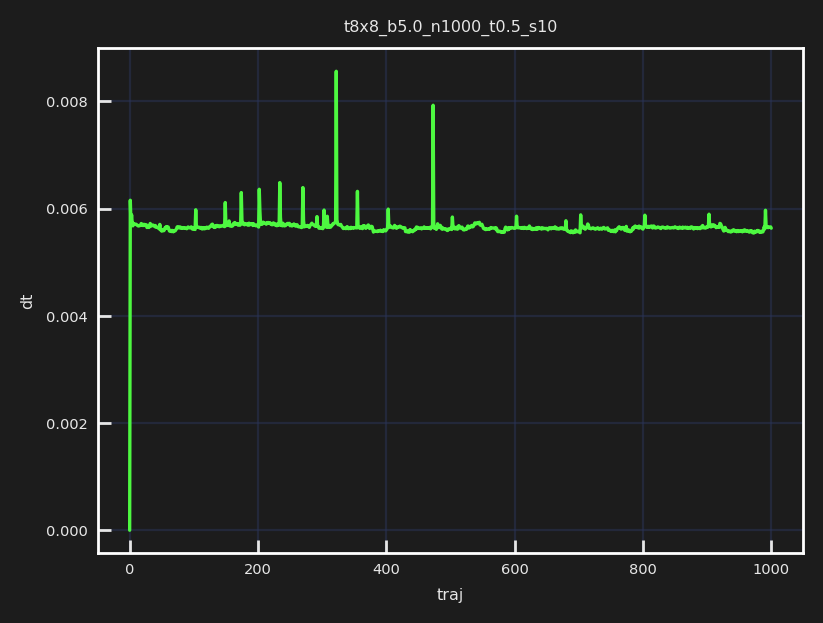

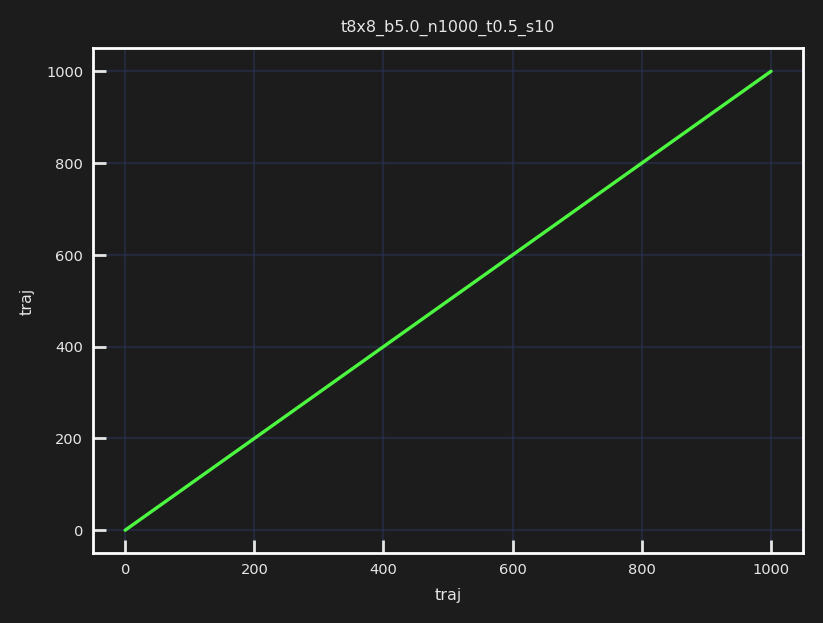

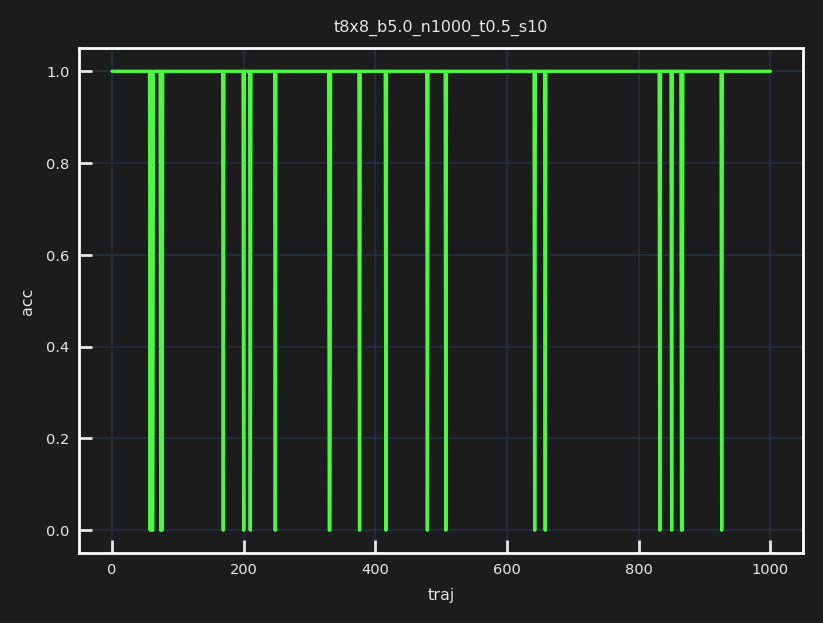

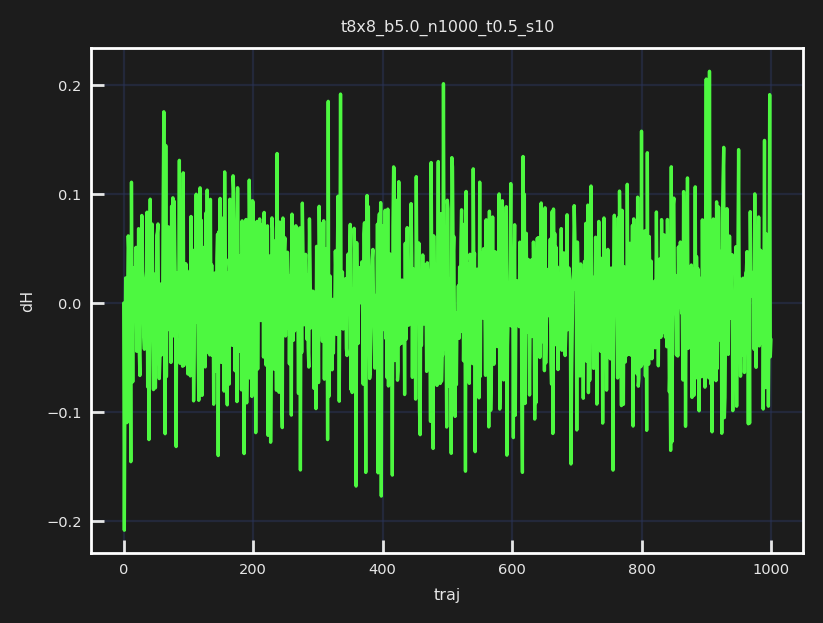

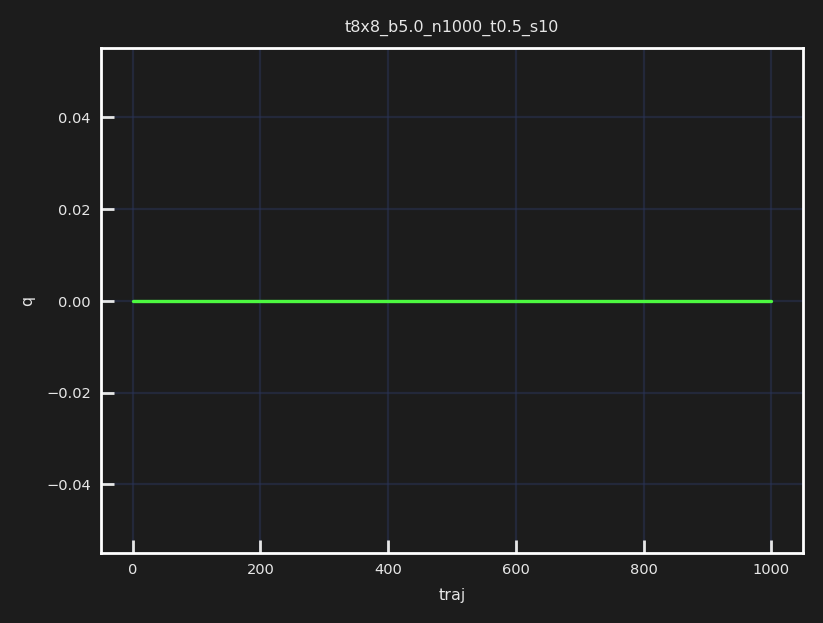

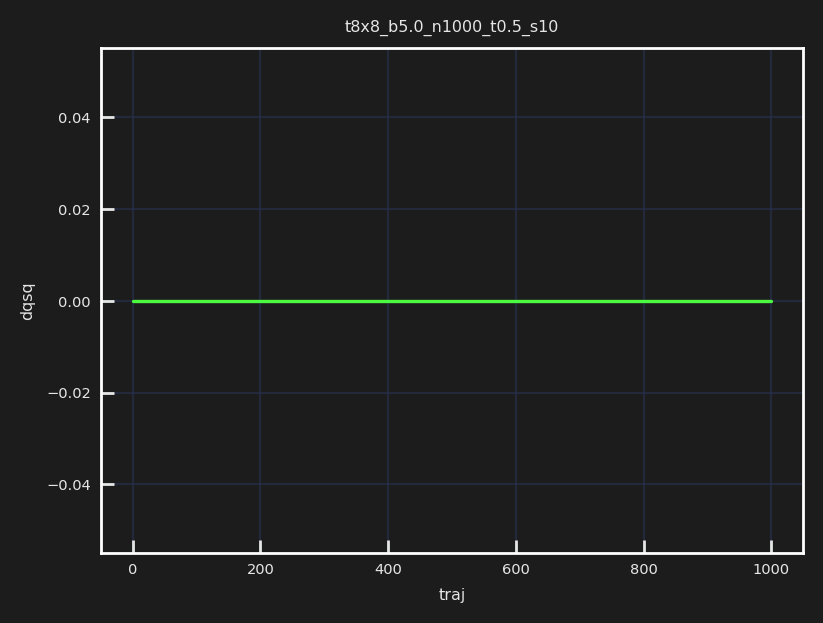

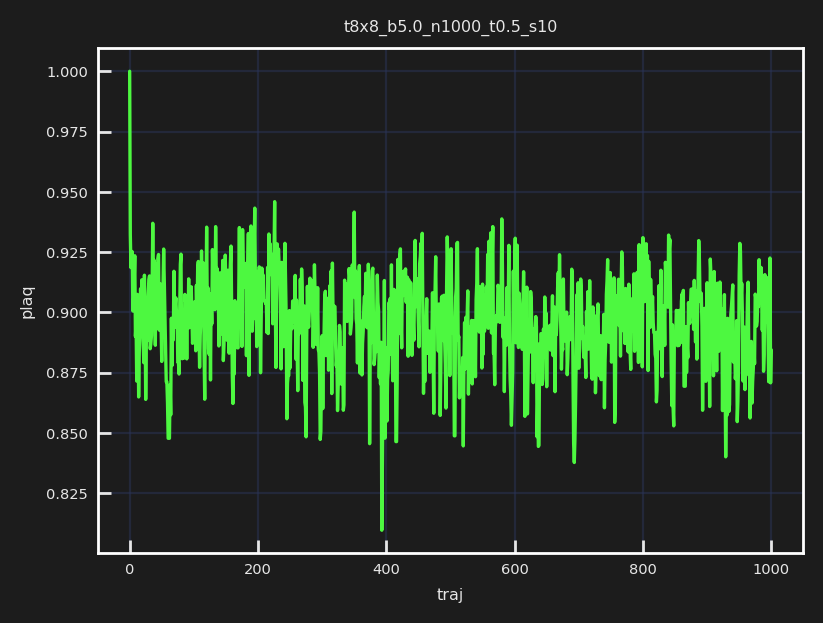

[22:18:54]  Run times: ['5.7975']

            Per trajectory: ['0.0058']

[22:18:54]  Saving hmc_histories to                                                          
            ../../logs/hmc/t8x8_b5.0_n1000_t0.5_s10/2021-06-21-221846/hmc_histories.z.

[22:18:54]  Saving hmc_fields_arr to                                                         
            ../../logs/hmc/t8x8_b5.0_n1000_t0.5_s10/2021-06-21-221846/hmc_fields_arr.z.

[22:18:54]  Creating directory: ../../logs/t8x8_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88_l
            r0.0001_era10_epoch1000/training/2021-06-21-221854

[22:18:54]  Creating directory: ../../logs/t8x8_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88_l
            r0.0001_era10_epoch1000/training/2021-06-21-221854/plots

[22:18:54]  Creating directory: ../../logs/t8x8_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88_l
            r0.0001_era10_epoch1000/training/2021-06-21-221854/checkpoints

[22:18:54]  Scheduler created!

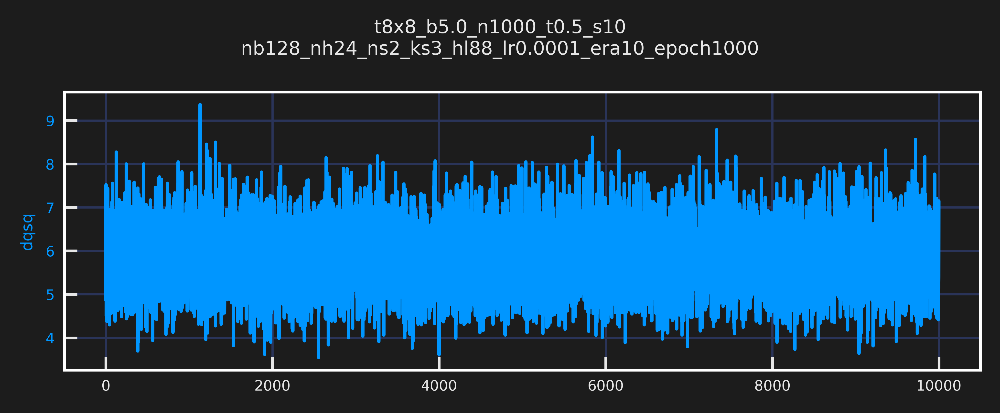

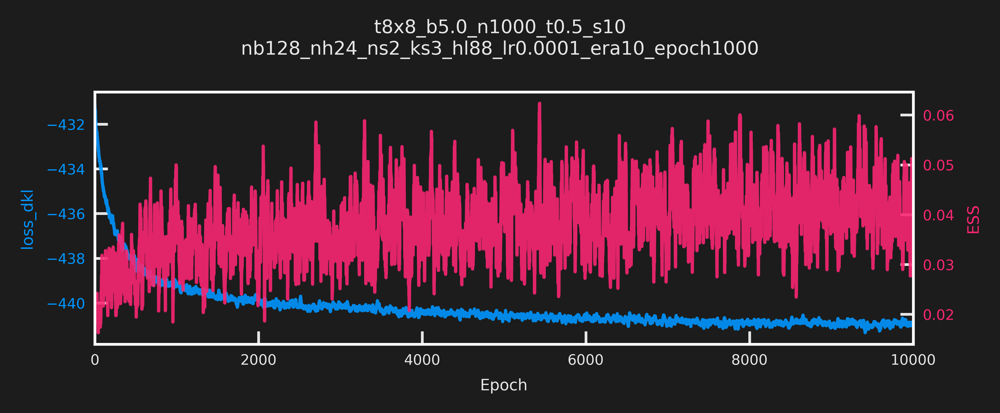

─────────────────────────────── ERA=0, last took: 0 min 0 sec ───────────────────────────────

[22:20:01]  (now) epoch: 499 dt=0.127 ess=0.022 loss_dkl=-437.964 logp=276.086 logq=-161.878 
            dqsq=6.625 plaq=0.863

            (avg) epoch: 499 dt=0.127 ess=0.029 loss_dkl=-437.980 logp=276.742 logq=-161.238 
            dqsq=5.769 plaq=0.865

[22:21:07]  (now) epoch: 999 dt=0.127 ess=0.070 loss_dkl=-438.883 logp=276.161 logq=-162.721 
            dqsq=5.391 plaq=0.863

            (avg) epoch: 999 dt=0.127 ess=0.045 loss_dkl=-439.076 logp=277.758 logq=-161.318 
            dqsq=5.776 plaq=0.868

[22:21:08]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era0-epoch999.tar

───────────────────────────── ERA=1, last took: 2 min 12.89 sec ─────────────────────────────

[22:22:14]  (now) epoch: 499 dt=0.128 ess=0.025 loss_dkl=-439.497 logp=278.935 logq=-160.563 
            dqsq=4.875 plaq=0.872

            (avg) epoch: 499 dt=0.128 ess=0.042 loss_dkl=-439.759 logp=278.446 logq=-161.313 
            dqsq=5.979 plaq=0.870

[22:23:20]  (now) epoch: 999 dt=0.128 ess=0.033 loss_dkl=-440.089 logp=279.348 logq=-160.741 
            dqsq=5.766 plaq=0.873

            (avg) epoch: 999 dt=0.128 ess=0.027 loss_dkl=-439.818 logp=278.799 logq=-161.019 
            dqsq=5.585 plaq=0.871

[22:23:21]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era1-epoch999.tar

───────────────────────────── ERA=2, last took: 2 min 12.69 sec ─────────────────────────────

[22:24:26]  (now) epoch: 499 dt=0.132 ess=0.017 loss_dkl=-440.023 logp=279.319 logq=-160.703 
            dqsq=5.805 plaq=0.873

            (avg) epoch: 499 dt=0.134 ess=0.038 loss_dkl=-440.171 logp=278.949 logq=-161.221 
            dqsq=5.797 plaq=0.872

[22:25:33]  (now) epoch: 999 dt=0.128 ess=0.021 loss_dkl=-440.620 logp=278.257 logq=-162.362 
            dqsq=6.461 plaq=0.870

[22:25:34]  (avg) epoch: 999 dt=0.128 ess=0.031 loss_dkl=-440.093 logp=278.867 logq=-161.226 
            dqsq=5.965 plaq=0.871

[22:25:35]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era2-epoch999.tar

───────────────────────────── ERA=3, last took: 2 min 13.33 sec ─────────────────────────────

[22:26:44]  (now) epoch: 499 dt=0.137 ess=0.025 loss_dkl=-440.242 logp=279.472 logq=-160.770 
            dqsq=6.383 plaq=0.873

            (avg) epoch: 499 dt=0.137 ess=0.044 loss_dkl=-440.252 logp=279.208 logq=-161.043 
            dqsq=5.793 plaq=0.873

[22:27:53]  (now) epoch: 999 dt=0.132 ess=0.039 loss_dkl=-440.816 logp=280.050 logq=-160.766 
            dqsq=6.094 plaq=0.875

            (avg) epoch: 999 dt=0.132 ess=0.043 loss_dkl=-440.367 logp=278.846 logq=-161.522 
            dqsq=5.736 plaq=0.871

[22:27:54]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era3-epoch999.tar

───────────────────────────── ERA=4, last took: 2 min 19.15 sec ─────────────────────────────

[22:29:00]  (now) epoch: 499 dt=0.138 ess=0.036 loss_dkl=-440.592 logp=279.237 logq=-161.355 
            dqsq=6.625 plaq=0.873

            (avg) epoch: 499 dt=0.130 ess=0.027 loss_dkl=-440.363 logp=278.981 logq=-161.382 
            dqsq=5.815 plaq=0.872

[22:30:08]  (now) epoch: 999 dt=0.130 ess=0.062 loss_dkl=-440.433 logp=278.883 logq=-161.550 
            dqsq=5.398 plaq=0.872

            (avg) epoch: 999 dt=0.130 ess=0.049 loss_dkl=-440.750 logp=279.451 logq=-161.299 
            dqsq=5.712 plaq=0.873

[22:30:09]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era4-epoch999.tar

───────────────────────────── ERA=5, last took: 2 min 14.4 sec ──────────────────────────────

[22:31:16]  (now) epoch: 499 dt=0.133 ess=0.009 loss_dkl=-440.502 logp=280.040 logq=-160.463 
            dqsq=4.852 plaq=0.875

            (avg) epoch: 499 dt=0.133 ess=0.034 loss_dkl=-440.601 logp=279.254 logq=-161.347 
            dqsq=6.062 plaq=0.873

[22:32:26]  (now) epoch: 999 dt=0.138 ess=0.022 loss_dkl=-440.376 logp=278.650 logq=-161.725 
            dqsq=6.031 plaq=0.871

            (avg) epoch: 999 dt=0.134 ess=0.032 loss_dkl=-440.539 logp=279.023 logq=-161.517 
            dqsq=5.909 plaq=0.872

[22:32:27]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era5-epoch999.tar

───────────────────────────── ERA=6, last took: 2 min 17.75 sec ─────────────────────────────

[22:33:34]  (now) epoch: 499 dt=0.131 ess=0.030 loss_dkl=-440.530 logp=278.719 logq=-161.812 
            dqsq=6.984 plaq=0.871

            (avg) epoch: 499 dt=0.131 ess=0.049 loss_dkl=-440.669 logp=279.318 logq=-161.351 
            dqsq=5.979 plaq=0.873

[22:34:41]  (now) epoch: 999 dt=0.131 ess=0.080 loss_dkl=-441.407 logp=280.187 logq=-161.220 
            dqsq=5.305 plaq=0.876

            (avg) epoch: 999 dt=0.130 ess=0.034 loss_dkl=-440.909 logp=279.460 logq=-161.449 
            dqsq=5.650 plaq=0.873

[22:34:43]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era6-epoch999.tar

───────────────────────────── ERA=7, last took: 2 min 15.4 sec ──────────────────────────────

[22:35:50]  (now) epoch: 499 dt=0.130 ess=0.062 loss_dkl=-441.468 logp=280.428 logq=-161.040 
            dqsq=5.984 plaq=0.876

            (avg) epoch: 499 dt=0.130 ess=0.044 loss_dkl=-440.928 logp=279.252 logq=-161.676 
            dqsq=5.779 plaq=0.873

[22:36:59]  (now) epoch: 999 dt=0.134 ess=0.033 loss_dkl=-440.369 logp=277.852 logq=-162.517 
            dqsq=5.609 plaq=0.868

            (avg) epoch: 999 dt=0.135 ess=0.037 loss_dkl=-440.848 logp=279.428 logq=-161.420 
            dqsq=5.629 plaq=0.873

[22:37:00]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era7-epoch999.tar

───────────────────────────── ERA=8, last took: 2 min 17.15 sec ─────────────────────────────

[22:38:07]  (now) epoch: 499 dt=0.130 ess=0.031 loss_dkl=-440.727 logp=278.715 logq=-162.012 
            dqsq=4.687 plaq=0.871

            (avg) epoch: 499 dt=0.130 ess=0.041 loss_dkl=-441.042 logp=279.973 logq=-161.070 
            dqsq=5.609 plaq=0.875

[22:39:15]  (now) epoch: 999 dt=0.133 ess=0.024 loss_dkl=-441.354 logp=280.587 logq=-160.768 
            dqsq=5.711 plaq=0.877

            (avg) epoch: 999 dt=0.134 ess=0.039 loss_dkl=-441.018 logp=279.975 logq=-161.042 
            dqsq=5.667 plaq=0.875

[22:39:17]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era8-epoch999.tar

───────────────────────────── ERA=9, last took: 2 min 15.61 sec ─────────────────────────────

[22:40:25]  (now) epoch: 499 dt=0.130 ess=0.051 loss_dkl=-441.454 logp=280.475 logq=-160.978 
            dqsq=6.891 plaq=0.876

            (avg) epoch: 499 dt=0.130 ess=0.040 loss_dkl=-441.078 logp=280.039 logq=-161.040 
            dqsq=5.793 plaq=0.875

[22:41:33]  (now) epoch: 999 dt=0.130 ess=0.031 loss_dkl=-440.961 logp=279.972 logq=-160.989 
            dqsq=7.148 plaq=0.875

            (avg) epoch: 999 dt=0.130 ess=0.045 loss_dkl=-440.967 logp=280.087 logq=-160.880 
            dqsq=5.933 plaq=0.875

[22:41:34]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era9-epoch999.tar

[22:41:35]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/checkpoints/ckpt-era10-epoch1001.tar

[22:41:36]  Saving live plots to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000
            _t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-22
            1854/plots

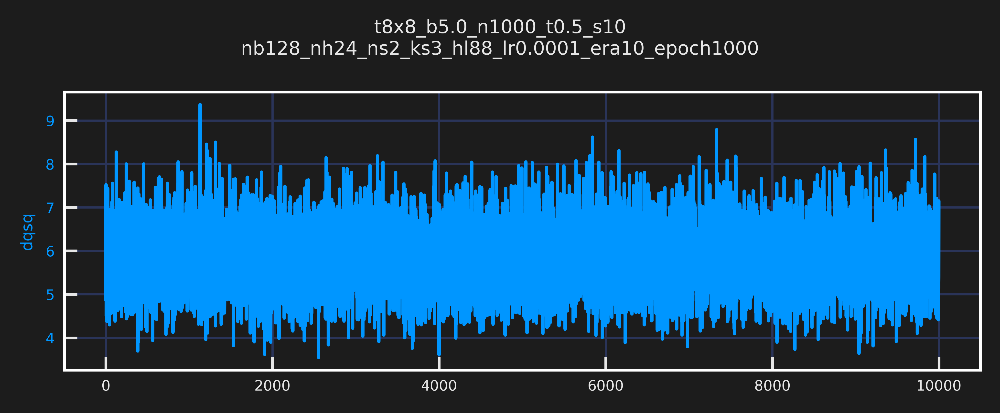

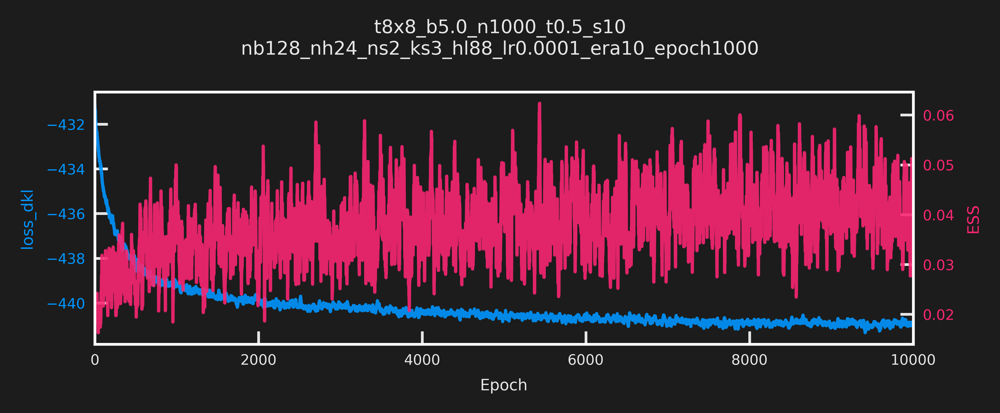

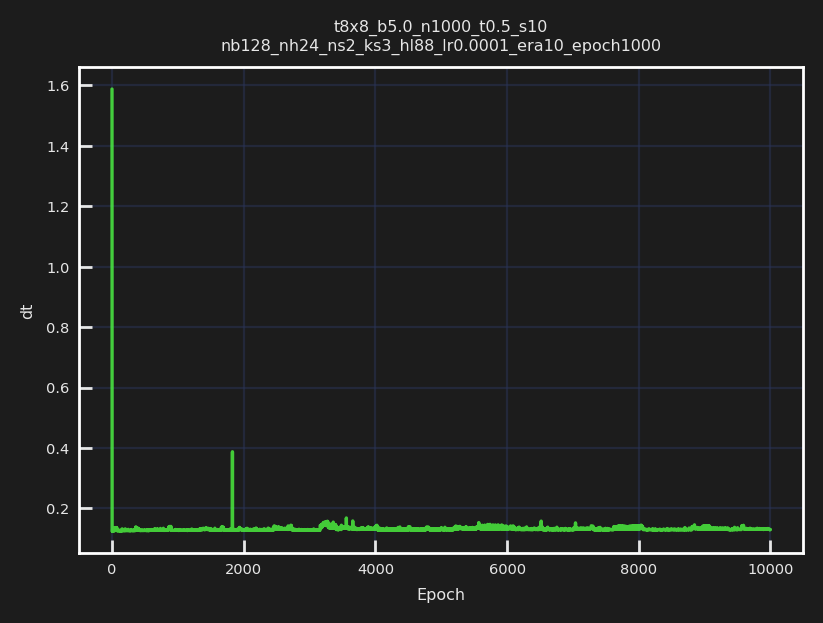

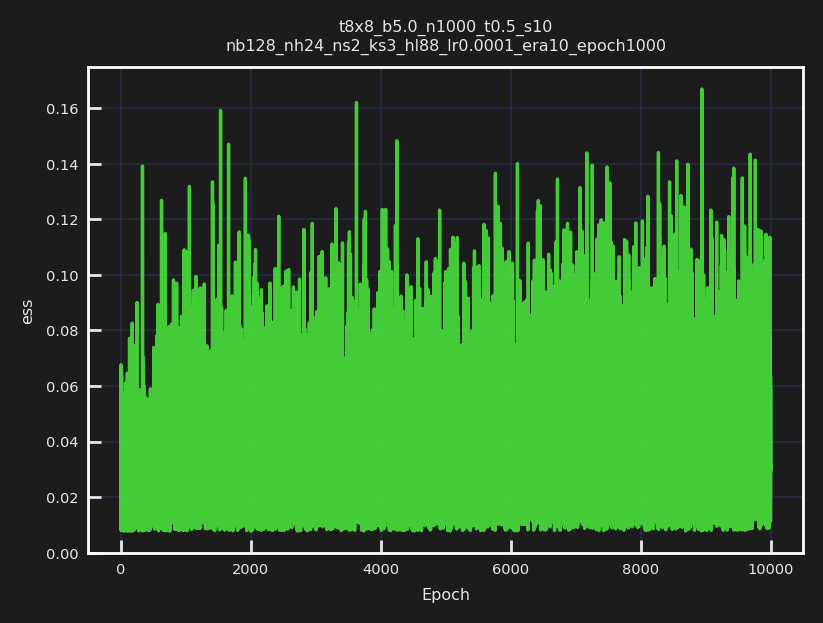

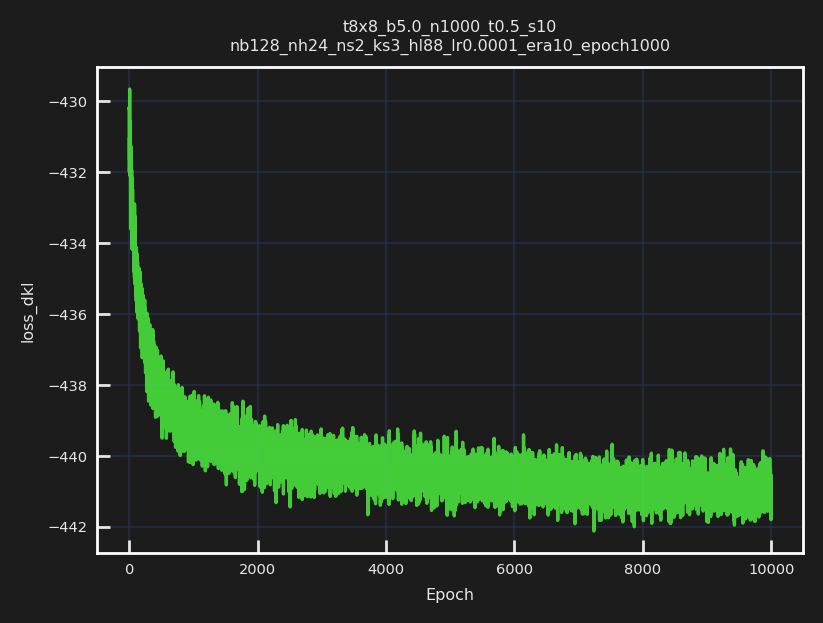

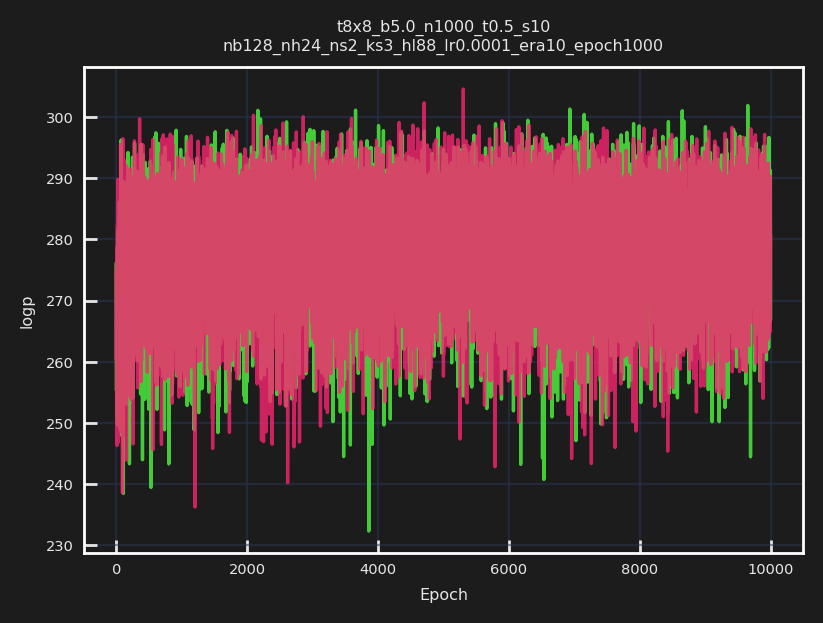

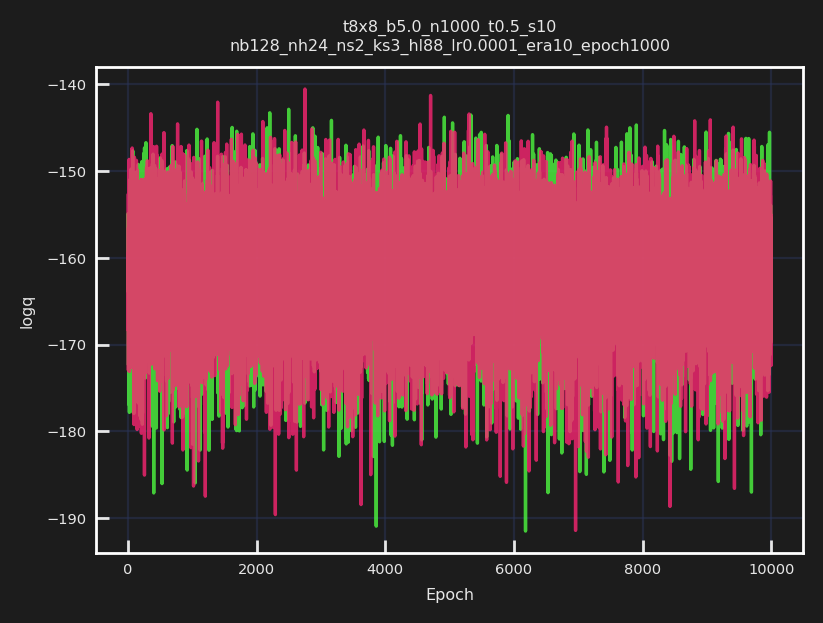

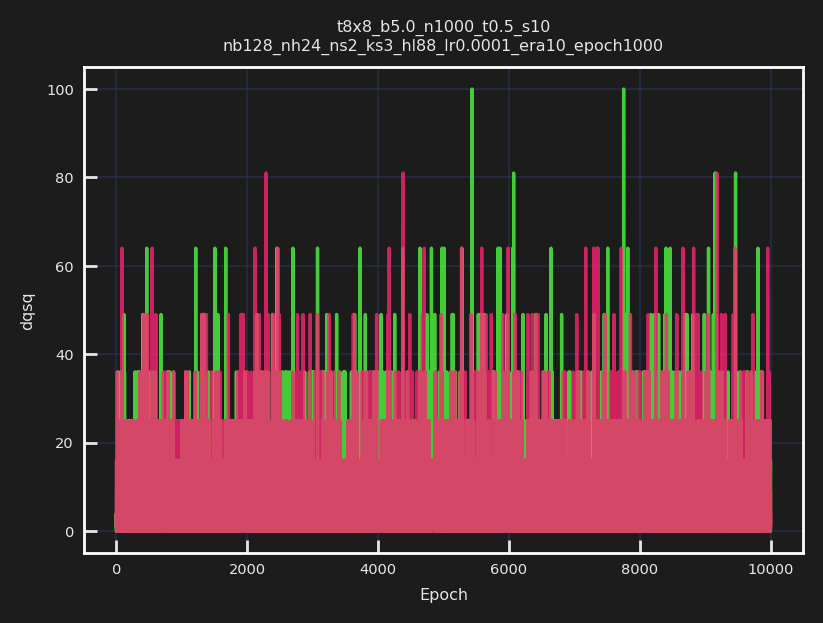

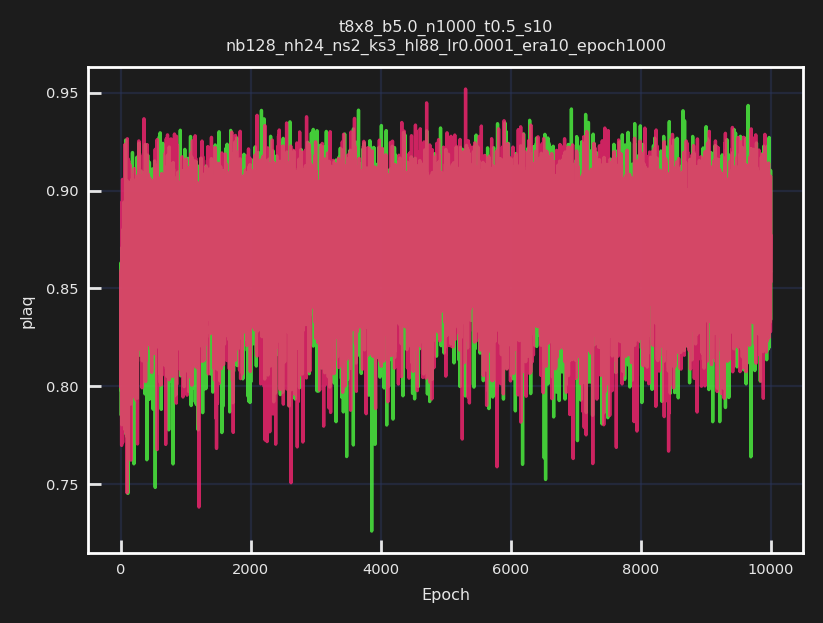

[22:41:40]  Saving train_history to ../../logs/t8x8_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl
            88_lr0.0001_era10_epoch1000/training/2021-06-21-221854/train_history.z.

In [13]:
layers = train_outputs['model'].layers #['layers']
layers.train()
train_outputs8 = transfer(L=8, param_init=param,
                          config_init=train_config,
                          layers_init=layers, 
                          new_lr=0.0001, run_hmc=True)

In [16]:
from dataclasses import asdict

param8 = Param(**asdict(param))
logger.log(param8)

train_config8 = TrainConfig(**asdict(train_config))
train_config8.base_lr = 0.0001

[23:06:12]  Param:                                                                           
            ----------------                                                                 
            beta=5.0                                                                         
            L=4                                                                              
            tau=0.5                                                                          
            nstep=10                                                                         
            ntraj=1000                                                                       
            nrun=1                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth_interop=2                                                                    
            nth=2                                                                            
            lat=[4, 4]                                                                       
            nd=2                                                                             
            shape=[2, 4, 4]                                                                  
            volume=16                                                                        
            dt=0.05

[23:08:30]  Existing file found!                                                             
            Renaming outfile to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000_
            t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/inference/plots/ess_230
            830.pdf

[23:08:31]  Existing file found!                                                             
            Renaming outfile to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000_
            t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/inference/plots/q_23083
            1.pdf

            Existing file found!                                                             
            Renaming outfile to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000_
            t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/inference/plots/dqsq_23
            0831.pdf

            Existing file found!                                                             
            Renaming outfile to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000_
            t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/inference/plots/dkl_230
            831.pdf

            Existing file found!                                                             
            Renaming outfile to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000_
            t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/inference/plots/logq_23
            0831.pdf

            Existing file found!                                                             
            Renaming outfile to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000_
            t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/inference/plots/logp_23
            0831.pdf

            Existing file found!                                                             
            Renaming outfile to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t8x8_b5.0_n1000_
            t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/inference/plots/accepte
            d_230831.pdf

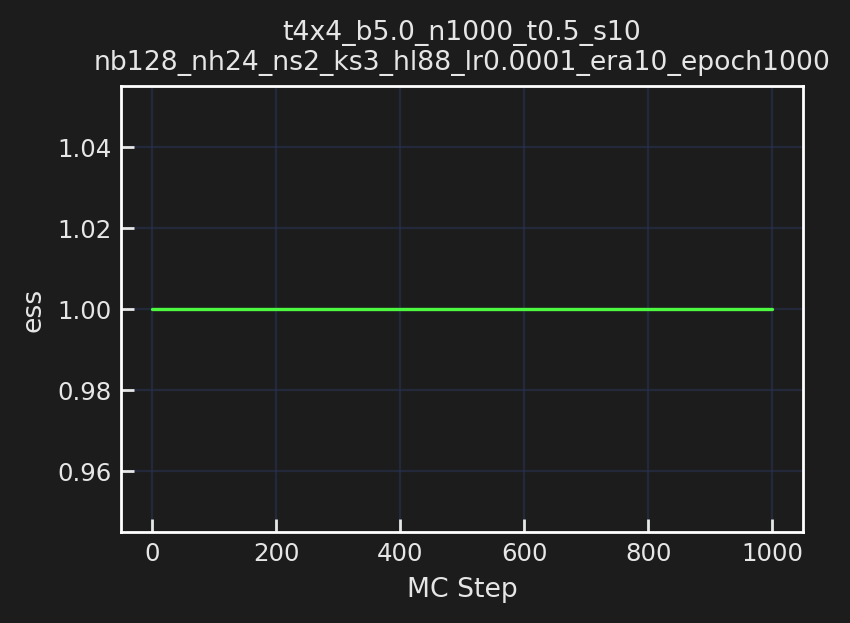

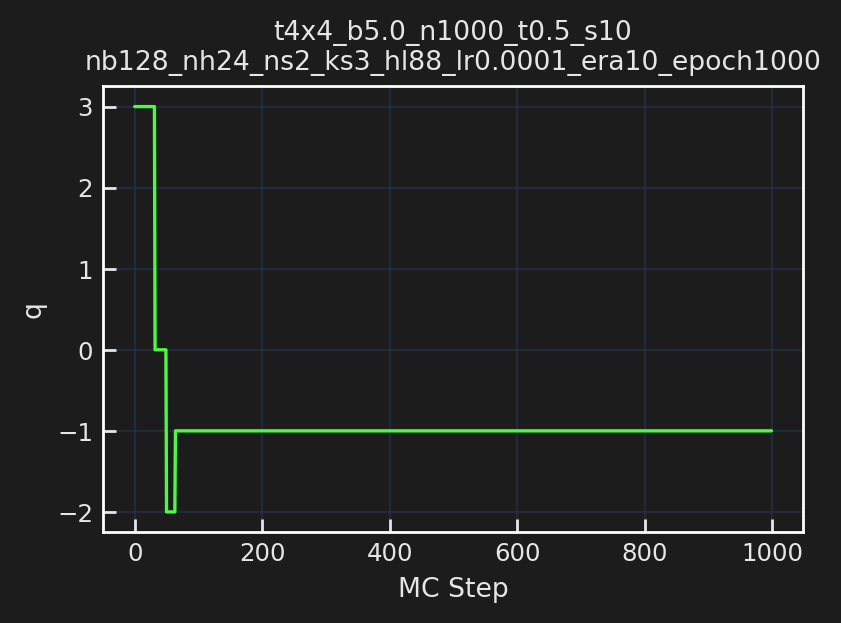

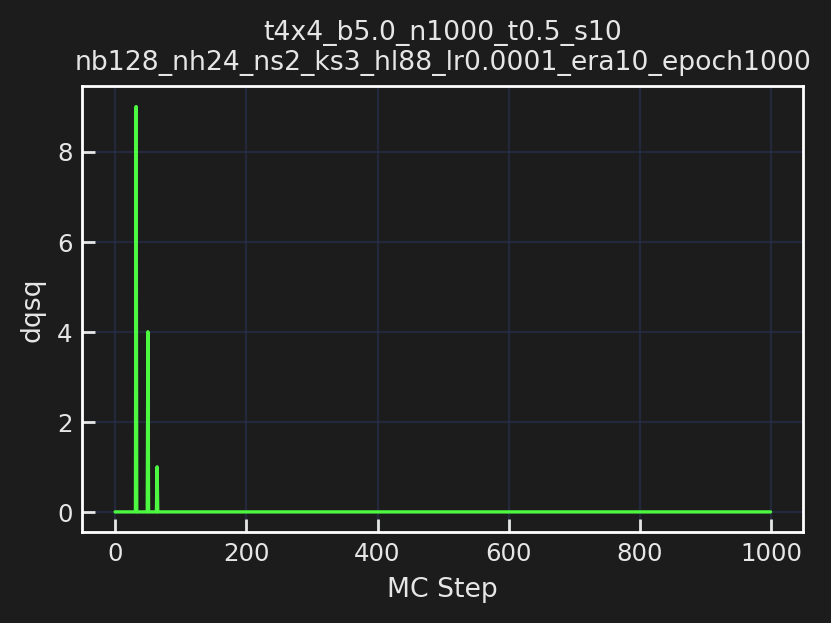

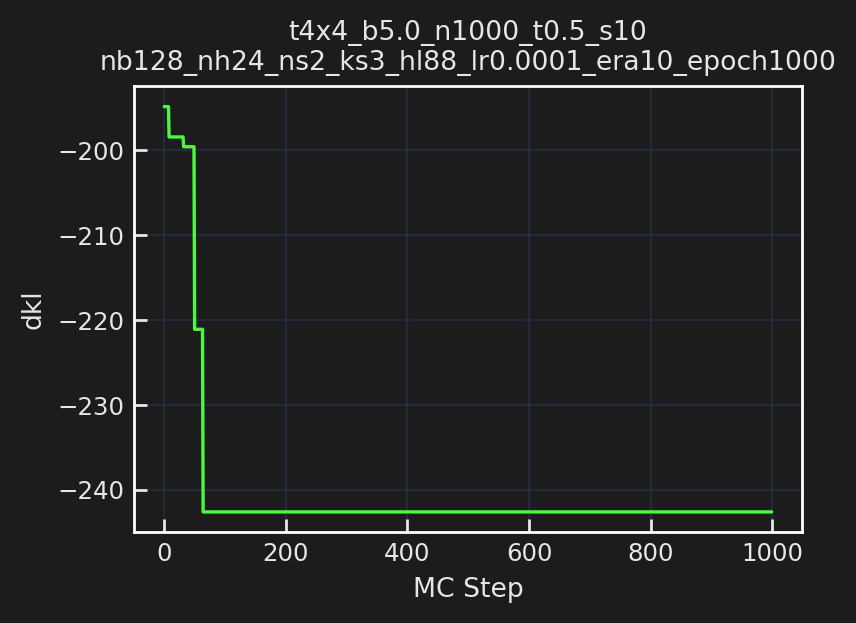

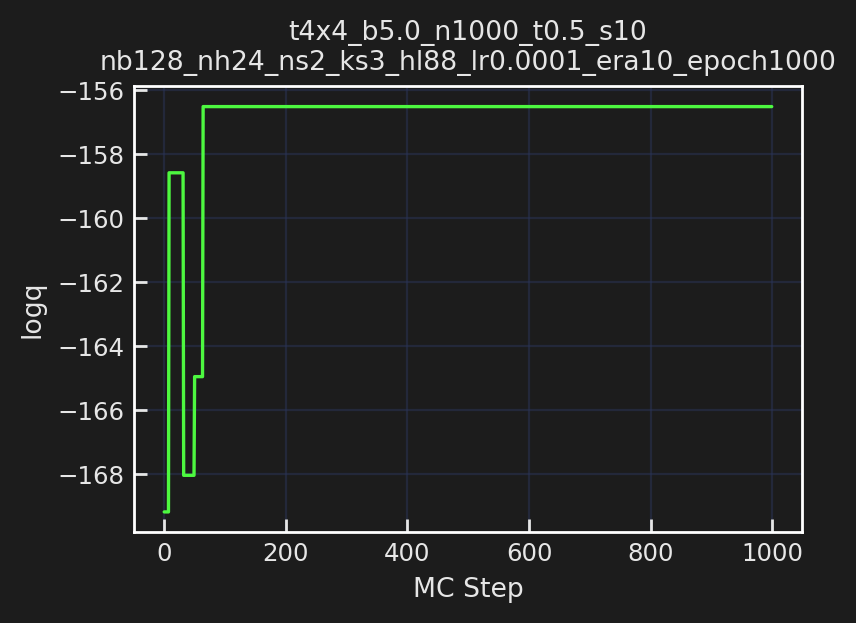

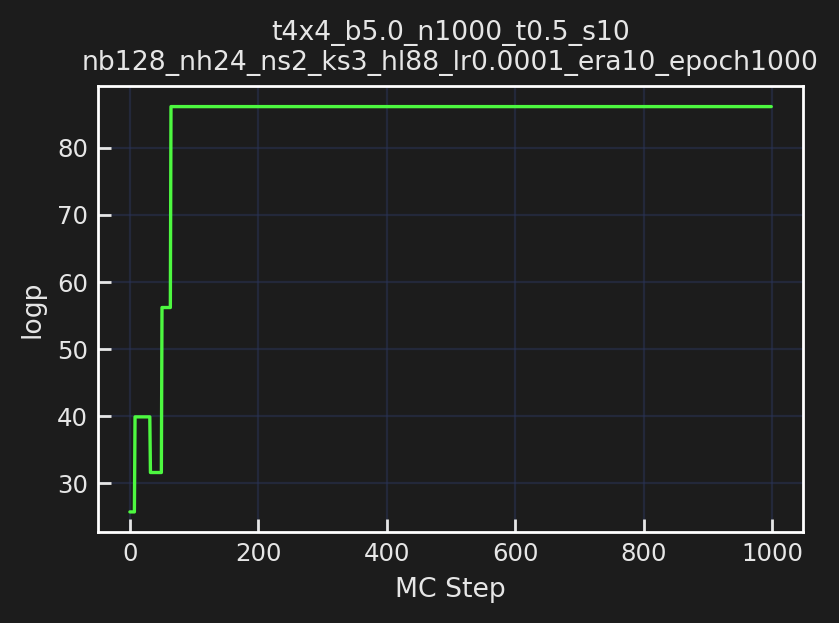

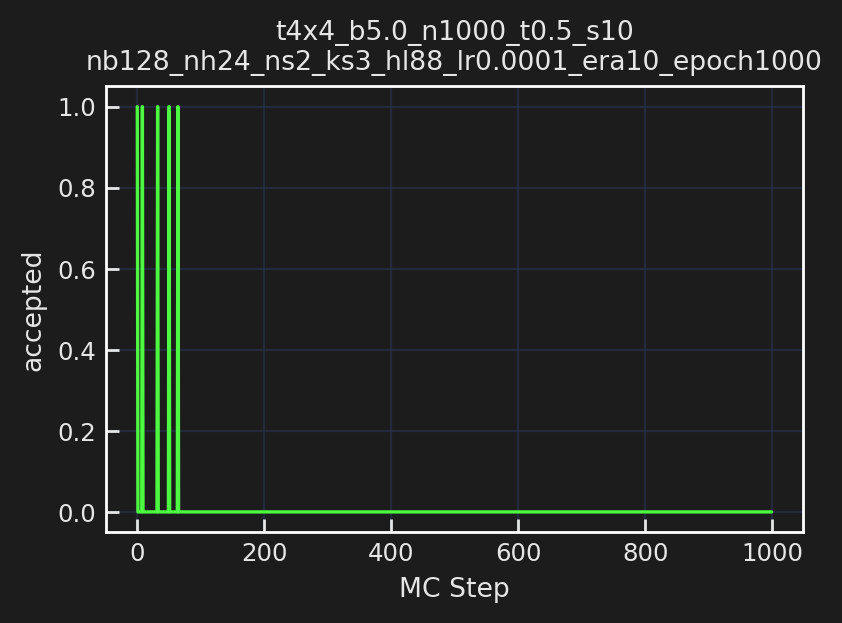

In [20]:
# ----------------------------------------------------------------
# Run inference on transferred model and evaluate / plot metrics
# ----------------------------------------------------------------
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history
from fthmc.utils.samplers import make_mcmc_ensemble

sns.set_context('paper')
action_fn8 = qed.BatchAction(param8.beta)
dirs8 = train_outputs8['dirs']
logdir8 = dirs8['logdir']

inf_dir8 = os.path.join(logdir8, 'inference')
inf_pdir8 = os.path.join(inf_dir8, 'plots')
history8 = make_mcmc_ensemble(model=train_outputs8['model'],
                               action_fn=action_fn8,
                               batch_size=train_config8.batch_size,
                               num_samples=1000)
plot_history(history=history8,
             param=param8, config=train_config8, skip=['epoch', 'x'],
             num_chains=4, therm_frac=0.0, xlabel='MC Step', outdir=inf_pdir8)

ModuleList(
  (0): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (1): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (2): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLaye

[23:11:36]  Creating directory: ../../logs/hmc/t16x16_b5.0_n1000_t0.5_s10/plots

[23:11:36]  Param:                                                                           
            ----------------                                                                 
            beta=5.0                                                                         
            L=16                                                                             
            tau=0.5                                                                          
            nstep=10                                                                         
            ntraj=1000                                                                       
            nrun=1                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth_interop=2                                                                    
            nth=2                                                                            
            lat=[16, 16]                                                                     
            nd=2                                                                             
            shape=[2, 16, 16]                                                                
            volume=256                                                                       
            dt=0.05

──────────────────────────────── RUN: 0, last took: 0 m 0 s ─────────────────────────────────

            plaq=1.000 q=0.000

            traj=2 dt=0.007 acc=1.000 dH=-0.064 q=0 dqsq=0 plaq=0.937

[23:11:37]  traj=102 dt=0.006 acc=1.000 dH=0.001 q=0 dqsq=0 plaq=0.903

            traj=202 dt=0.007 acc=1.000 dH=0.010 q=0 dqsq=0 plaq=0.906

[23:11:38]  traj=302 dt=0.006 acc=1.000 dH=-0.053 q=0 dqsq=0 plaq=0.895

[23:11:39]  traj=402 dt=0.006 acc=1.000 dH=0.071 q=0 dqsq=0 plaq=0.906

            traj=502 dt=0.006 acc=1.000 dH=-0.300 q=-1 dqsq=0 plaq=0.878

[23:11:40]  traj=602 dt=0.006 acc=1.000 dH=-0.128 q=-1 dqsq=1 plaq=0.897

            traj=702 dt=0.006 acc=1.000 dH=0.001 q=-1 dqsq=0 plaq=0.890

[23:11:41]  traj=802 dt=0.006 acc=1.000 dH=-0.092 q=-1 dqsq=0 plaq=0.870

[23:11:42]  traj=902 dt=0.006 acc=1.000 dH=-0.013 q=0 dqsq=0 plaq=0.894

[23:11:42]  Creating directory: ../../logs/hmc/t16x16_b5.0_n1000_t0.5_s10/plots/run0

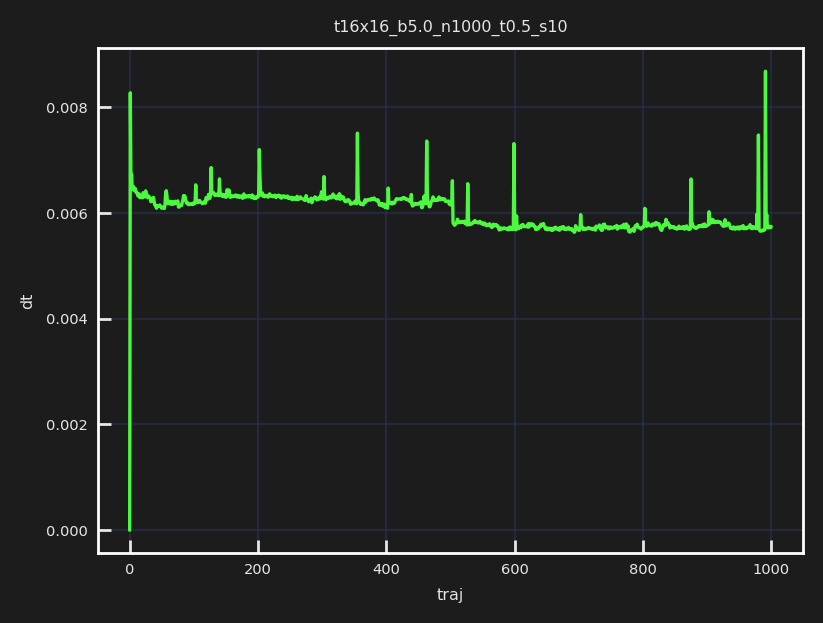

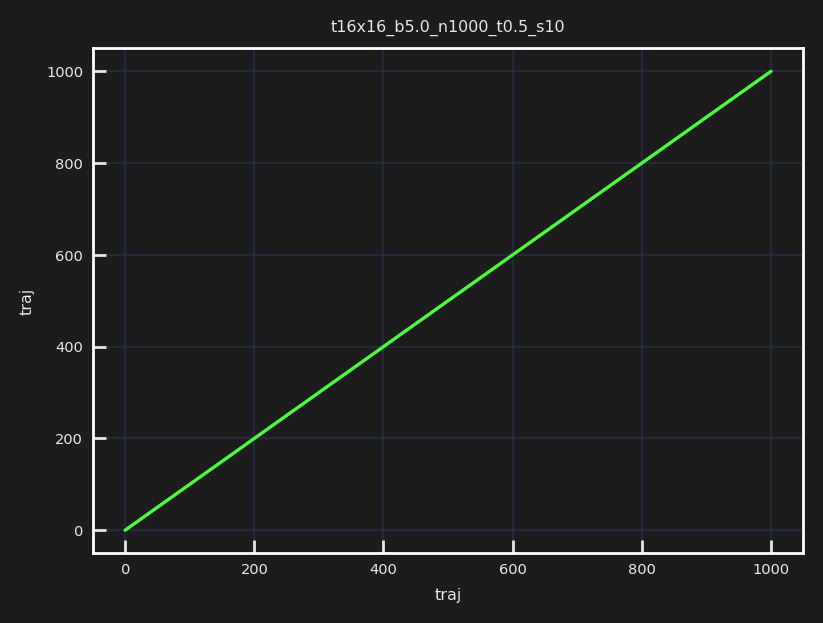

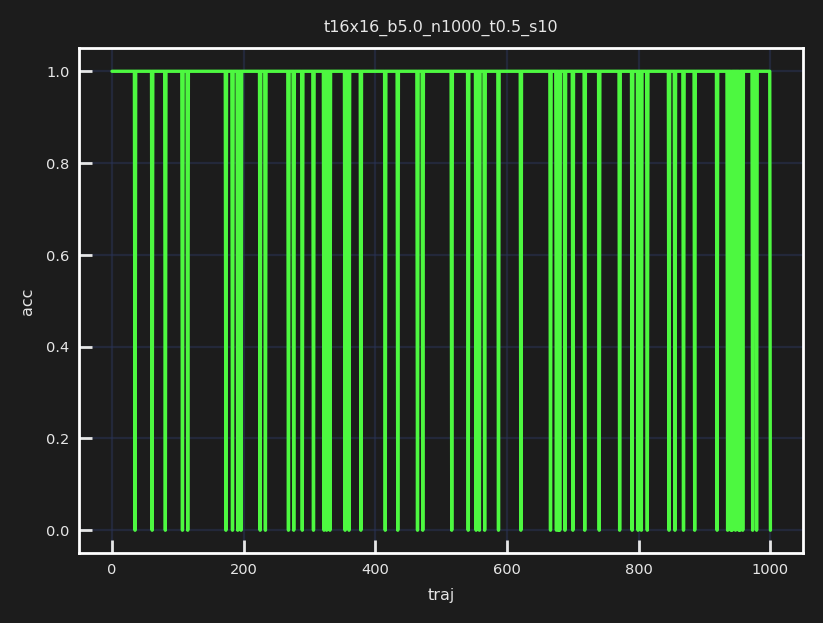

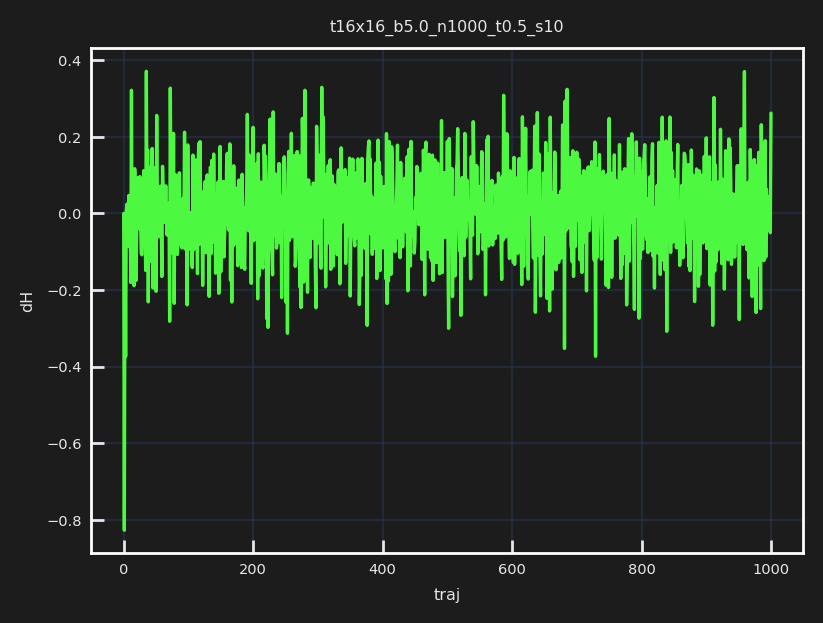

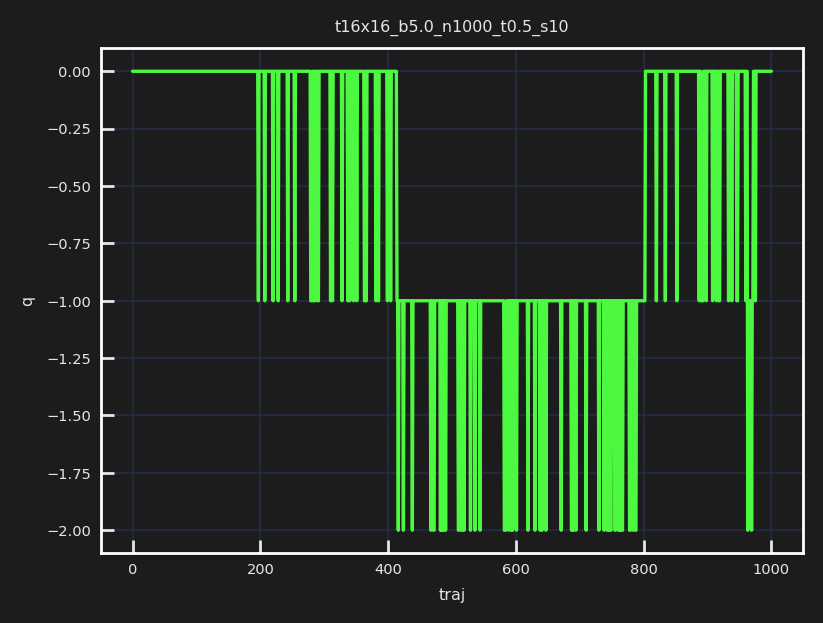

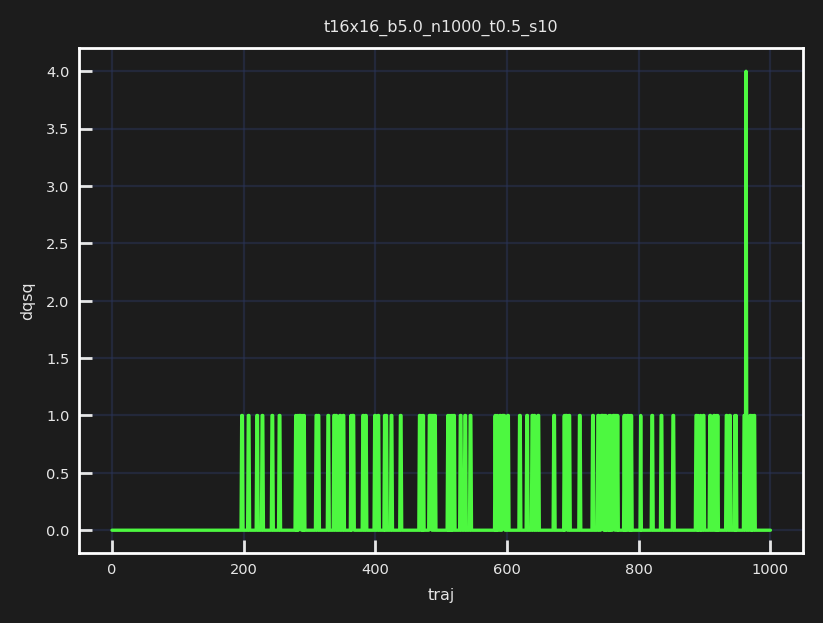

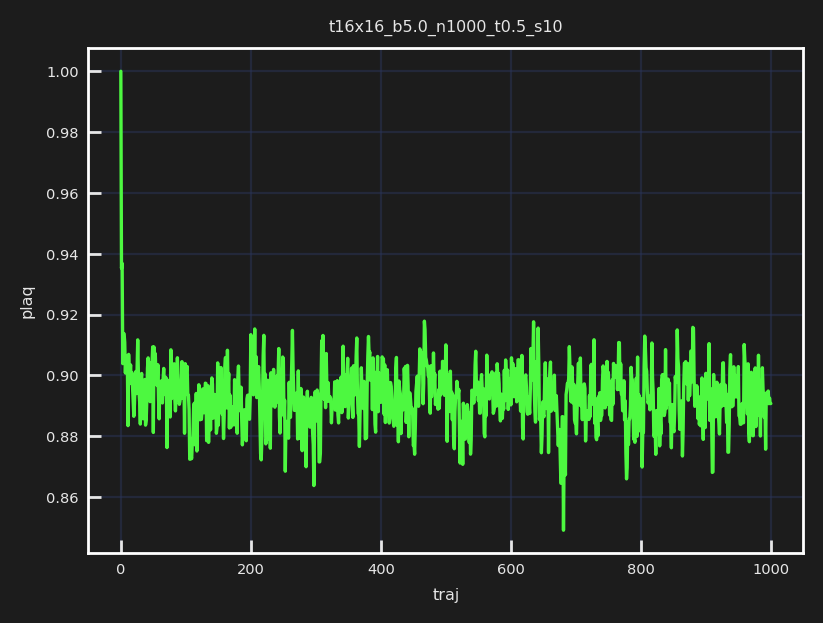

[23:11:44]  Run times: ['6.1637']

            Per trajectory: ['0.0062']

[23:11:44]  Saving hmc_histories to                                                          
            ../../logs/hmc/t16x16_b5.0_n1000_t0.5_s10/hmc_histories.z.

[23:11:45]  Saving hmc_fields_arr to                                                         
            ../../logs/hmc/t16x16_b5.0_n1000_t0.5_s10/hmc_fields_arr.z.

[23:11:45]  Creating directory: ../../logs/t16x16_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88
            _lr0.0001_era10_epoch1000

[23:11:45]  Creating directory: ../../logs/t16x16_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88
            _lr0.0001_era10_epoch1000/training

[23:11:45]  Creating directory: ../../logs/t16x16_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88
            _lr0.0001_era10_epoch1000/training/plots

[23:11:45]  Creating directory: ../../logs/t16x16_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88
            _lr0.0001_era10_epoch1000/training/checkpoints

[23:11:45]  Scheduler created!

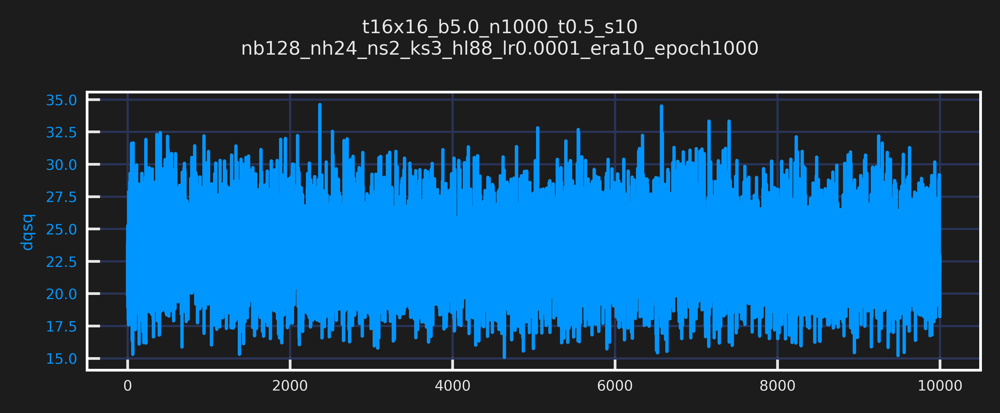

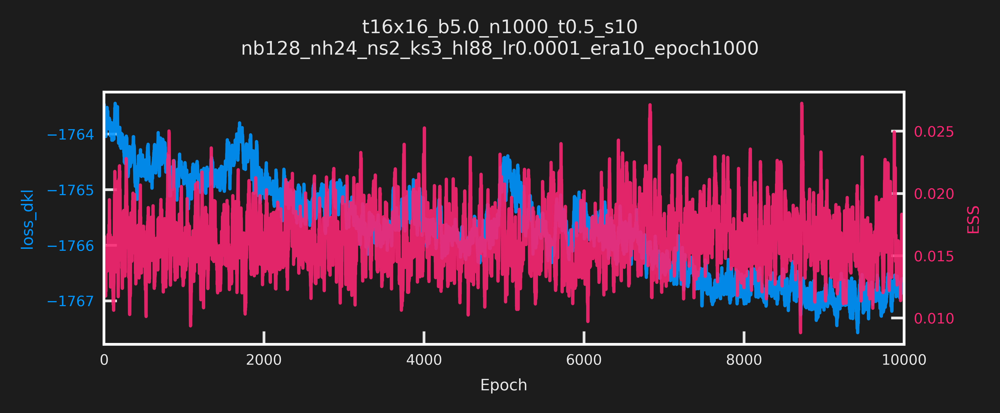

─────────────────────────────── ERA=0, last took: 0 min 0 sec ───────────────────────────────

[23:12:53]  (now) epoch: 499 dt=0.132 ess=0.021 loss_dkl=-1764.314 logp=1119.397             
            logq=-644.917 dqsq=31.117 plaq=0.875

            (avg) epoch: 499 dt=0.133 ess=0.016 loss_dkl=-1764.553 logp=1119.239             
            logq=-645.314 dqsq=23.265 plaq=0.874

[23:14:02]  (now) epoch: 999 dt=0.132 ess=0.010 loss_dkl=-1764.322 logp=1116.355             
            logq=-647.967 dqsq=23.477 plaq=0.872

            (avg) epoch: 999 dt=0.133 ess=0.014 loss_dkl=-1764.716 logp=1119.744             
            logq=-644.972 dqsq=23.305 plaq=0.875

[23:14:03]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era0-epoch999.tar

───────────────────────────── ERA=1, last took: 2 min 17.06 sec ─────────────────────────────

[23:15:12]  (now) epoch: 499 dt=0.132 ess=0.019 loss_dkl=-1765.069 logp=1121.492             
            logq=-643.577 dqsq=28.250 plaq=0.876

            (avg) epoch: 499 dt=0.208 ess=0.017 loss_dkl=-1764.751 logp=1121.069             
            logq=-643.683 dqsq=24.691 plaq=0.876

[23:16:22]  (now) epoch: 999 dt=0.132 ess=0.008 loss_dkl=-1764.598 logp=1119.830             
            logq=-644.768 dqsq=21.445 plaq=0.875

            (avg) epoch: 999 dt=0.132 ess=0.014 loss_dkl=-1764.980 logp=1120.551             
            logq=-644.429 dqsq=23.460 plaq=0.875

[23:16:23]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era1-epoch999.tar

───────────────────────────── ERA=2, last took: 2 min 20.18 sec ─────────────────────────────

[23:17:31]  (now) epoch: 499 dt=0.133 ess=0.013 loss_dkl=-1765.598 logp=1122.684             
            logq=-642.914 dqsq=25.242 plaq=0.877

            (avg) epoch: 499 dt=0.132 ess=0.014 loss_dkl=-1765.442 logp=1120.870             
            logq=-644.571 dqsq=22.111 plaq=0.876

[23:18:40]  (now) epoch: 999 dt=0.132 ess=0.010 loss_dkl=-1765.166 logp=1120.650             
            logq=-644.515 dqsq=25.883 plaq=0.876

            (avg) epoch: 999 dt=0.132 ess=0.018 loss_dkl=-1765.177 logp=1121.645             
            logq=-643.532 dqsq=22.620 plaq=0.876

[23:18:41]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era2-epoch999.tar

───────────────────────────── ERA=3, last took: 2 min 18.14 sec ─────────────────────────────

[23:19:49]  (now) epoch: 499 dt=0.136 ess=0.012 loss_dkl=-1766.067 logp=1123.451             
            logq=-642.616 dqsq=24.641 plaq=0.878

            (avg) epoch: 499 dt=0.137 ess=0.015 loss_dkl=-1765.878 logp=1121.890             
            logq=-643.987 dqsq=22.670 plaq=0.876

[23:20:57]  (now) epoch: 999 dt=0.130 ess=0.012 loss_dkl=-1765.979 logp=1123.582             
            logq=-642.397 dqsq=22.773 plaq=0.878

            (avg) epoch: 999 dt=0.130 ess=0.014 loss_dkl=-1765.342 logp=1121.148             
            logq=-644.194 dqsq=23.109 plaq=0.876

[23:20:58]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era3-epoch999.tar

───────────────────────────── ERA=4, last took: 2 min 16.62 sec ─────────────────────────────

[23:22:05]  (now) epoch: 499 dt=0.130 ess=0.016 loss_dkl=-1766.780 logp=1122.915             
            logq=-643.864 dqsq=25.227 plaq=0.877

            (avg) epoch: 499 dt=0.130 ess=0.017 loss_dkl=-1765.879 logp=1121.731             
            logq=-644.148 dqsq=22.668 plaq=0.876

[23:23:12]  (now) epoch: 999 dt=0.130 ess=0.012 loss_dkl=-1765.233 logp=1119.584             
            logq=-645.649 dqsq=27.766 plaq=0.875

            (avg) epoch: 999 dt=0.132 ess=0.015 loss_dkl=-1764.727 logp=1121.034             
            logq=-643.693 dqsq=22.817 plaq=0.876

[23:23:13]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era4-epoch999.tar

───────────────────────────── ERA=5, last took: 2 min 14.57 sec ─────────────────────────────

[23:24:21]  (now) epoch: 499 dt=0.130 ess=0.008 loss_dkl=-1764.584 logp=1120.484             
            logq=-644.101 dqsq=21.047 plaq=0.875

            (avg) epoch: 499 dt=0.130 ess=0.018 loss_dkl=-1765.494 logp=1121.311             
            logq=-644.183 dqsq=22.661 plaq=0.876

[23:25:29]  (now) epoch: 999 dt=0.130 ess=0.015 loss_dkl=-1766.219 logp=1122.588             
            logq=-643.631 dqsq=24.172 plaq=0.877

            (avg) epoch: 999 dt=0.131 ess=0.015 loss_dkl=-1765.311 logp=1122.228             
            logq=-643.083 dqsq=22.669 plaq=0.877

[23:25:30]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era5-epoch999.tar

───────────────────────────── ERA=6, last took: 2 min 15.58 sec ─────────────────────────────

[23:26:37]  (now) epoch: 499 dt=0.133 ess=0.012 loss_dkl=-1765.696 logp=1122.211             
            logq=-643.485 dqsq=28.680 plaq=0.877

[23:26:38]  (avg) epoch: 499 dt=0.133 ess=0.021 loss_dkl=-1765.912 logp=1122.850             
            logq=-643.062 dqsq=23.462 plaq=0.877

[23:27:47]  (now) epoch: 999 dt=0.133 ess=0.010 loss_dkl=-1765.623 logp=1121.539             
            logq=-644.083 dqsq=21.391 plaq=0.876

            (avg) epoch: 999 dt=0.133 ess=0.015 loss_dkl=-1766.240 logp=1121.629             
            logq=-644.611 dqsq=23.400 plaq=0.876

[23:27:48]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era6-epoch999.tar

───────────────────────────── ERA=7, last took: 2 min 17.51 sec ─────────────────────────────

[23:28:56]  (now) epoch: 499 dt=0.133 ess=0.014 loss_dkl=-1766.757 logp=1125.348             
            logq=-641.409 dqsq=26.438 plaq=0.879

            (avg) epoch: 499 dt=0.133 ess=0.018 loss_dkl=-1766.759 logp=1123.146             
            logq=-643.613 dqsq=23.568 plaq=0.877

[23:30:06]  (now) epoch: 999 dt=0.138 ess=0.010 loss_dkl=-1766.950 logp=1125.261             
            logq=-641.688 dqsq=19.266 plaq=0.879

            (avg) epoch: 999 dt=0.138 ess=0.016 loss_dkl=-1766.761 logp=1122.689             
            logq=-644.072 dqsq=22.066 plaq=0.877

[23:30:07]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era7-epoch999.tar

───────────────────────────── ERA=8, last took: 2 min 18.82 sec ─────────────────────────────

[23:31:15]  (now) epoch: 499 dt=0.130 ess=0.008 loss_dkl=-1765.982 logp=1121.958             
            logq=-644.024 dqsq=19.391 plaq=0.877

            (avg) epoch: 499 dt=0.130 ess=0.015 loss_dkl=-1766.561 logp=1122.850             
            logq=-643.711 dqsq=23.596 plaq=0.877

[23:32:23]  (now) epoch: 999 dt=0.130 ess=0.028 loss_dkl=-1767.569 logp=1125.249             
            logq=-642.320 dqsq=22.195 plaq=0.879

            (avg) epoch: 999 dt=0.130 ess=0.016 loss_dkl=-1766.933 logp=1123.240             
            logq=-643.694 dqsq=23.466 plaq=0.878

[23:32:24]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era8-epoch999.tar

───────────────────────────── ERA=9, last took: 2 min 16.3 sec ──────────────────────────────

[23:33:31]  (now) epoch: 499 dt=0.130 ess=0.008 loss_dkl=-1766.168 logp=1120.319             
            logq=-645.850 dqsq=24.961 plaq=0.875

            (avg) epoch: 499 dt=0.130 ess=0.018 loss_dkl=-1766.947 logp=1123.608             
            logq=-643.340 dqsq=21.726 plaq=0.878

[23:34:39]  (now) epoch: 999 dt=0.134 ess=0.008 loss_dkl=-1767.219 logp=1122.893             
            logq=-644.327 dqsq=21.609 plaq=0.877

[23:34:40]  (avg) epoch: 999 dt=0.133 ess=0.015 loss_dkl=-1766.733 logp=1123.514             
            logq=-643.219 dqsq=23.026 plaq=0.878

[23:34:41]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era9-epoch999.tar

[23:34:42]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/checkpoints
            /ckpt-era10-epoch1001.tar

[23:34:43]  Saving live plots to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/plots

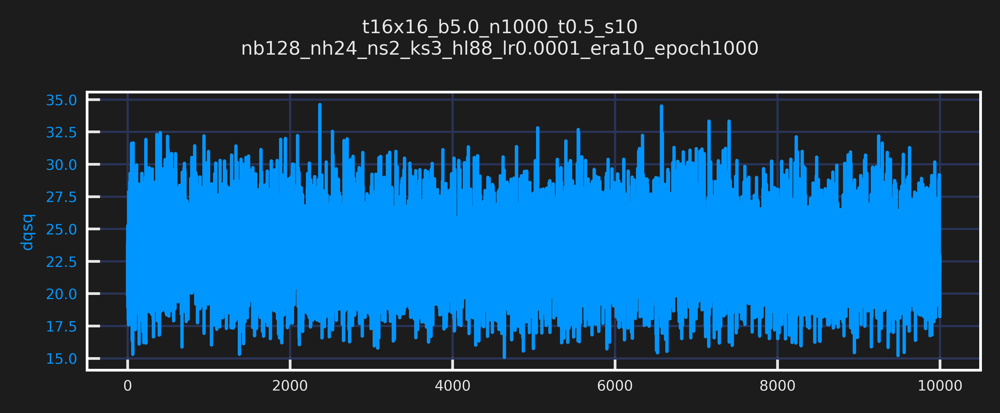

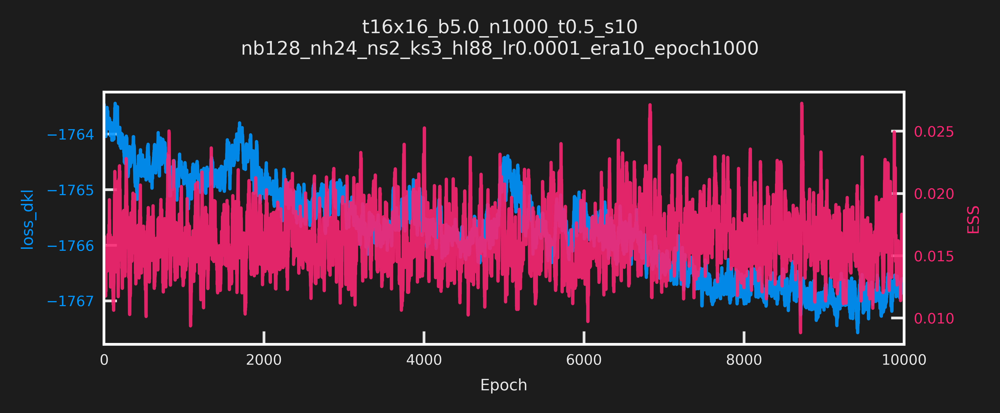

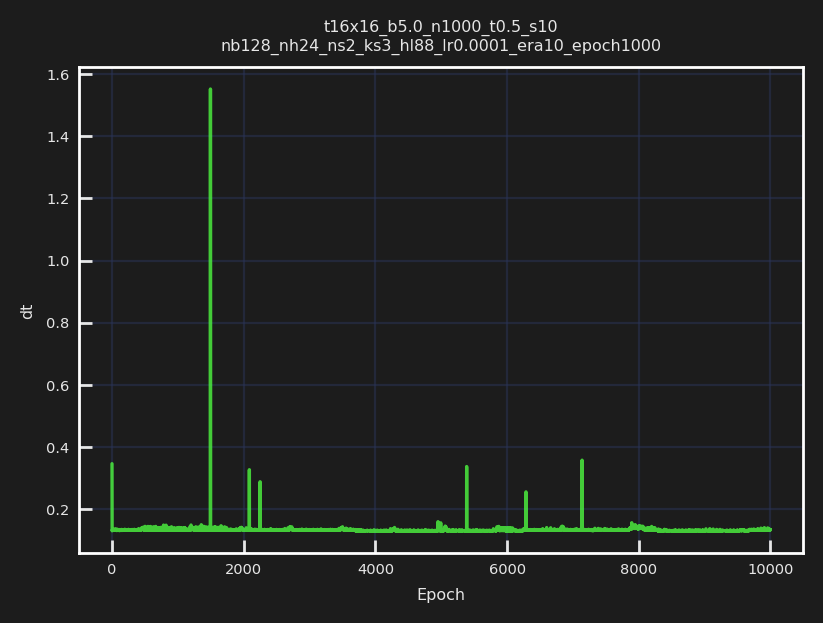

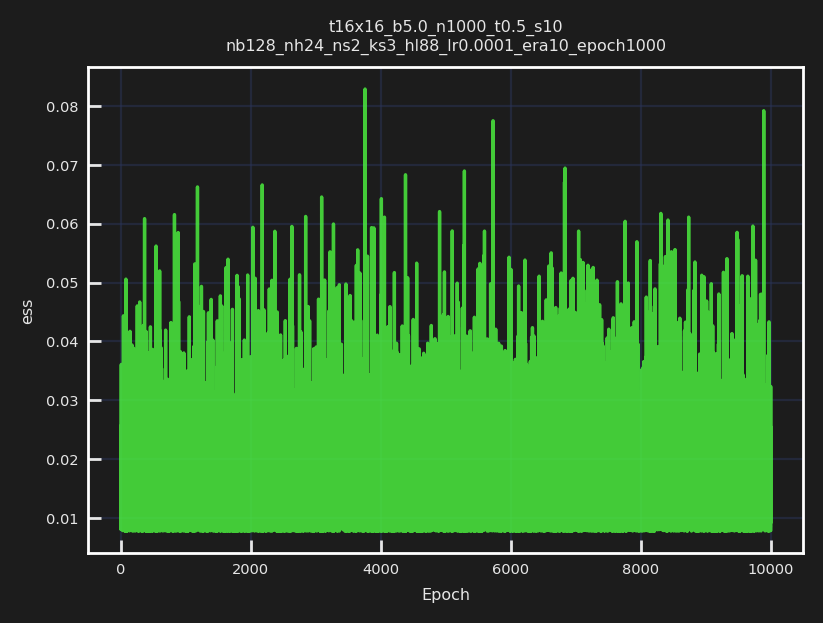

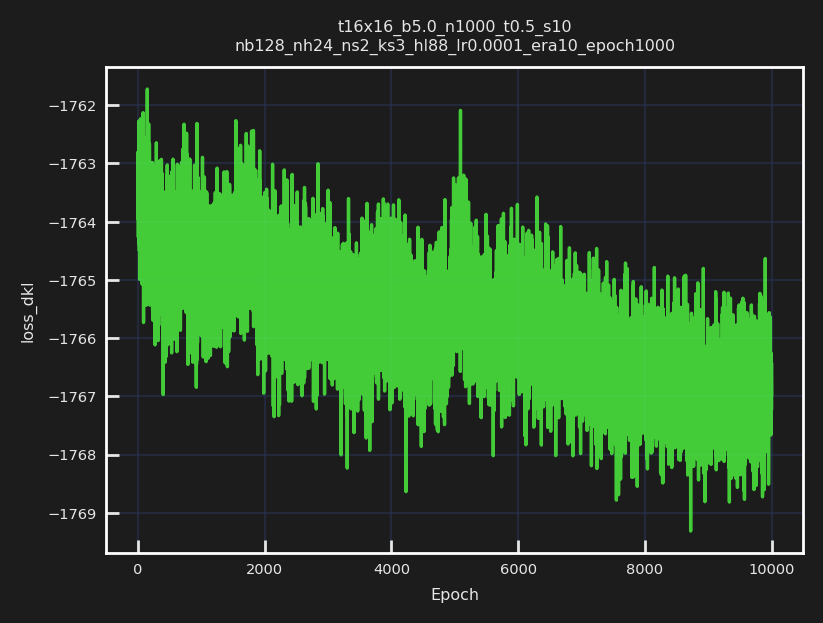

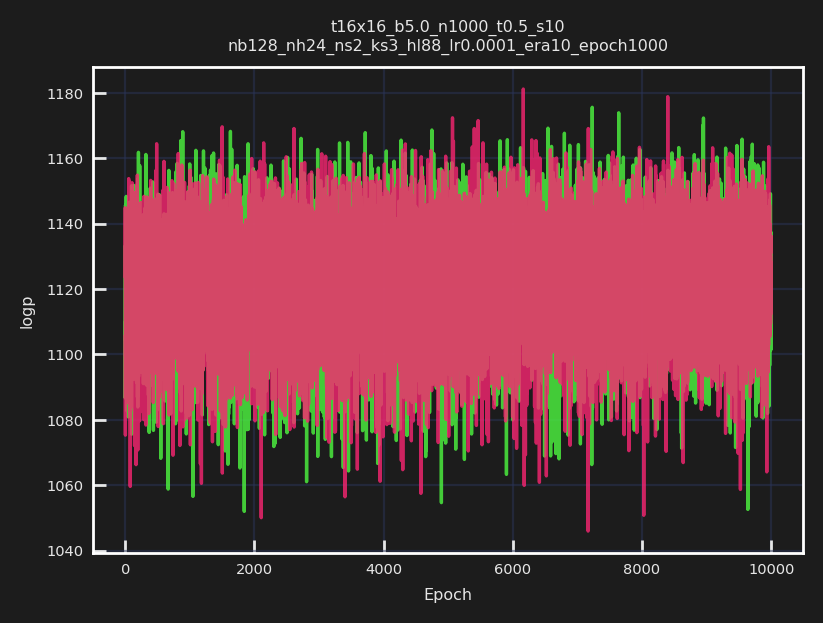

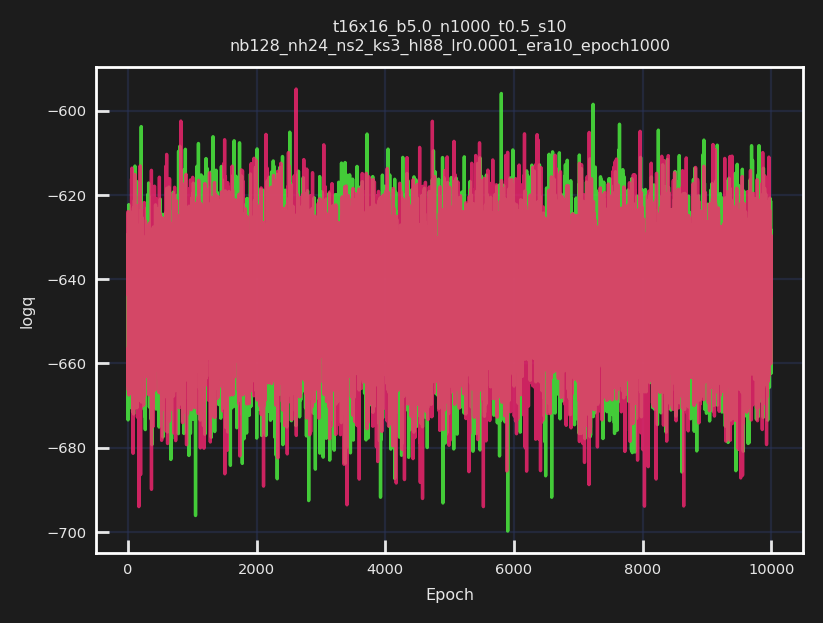

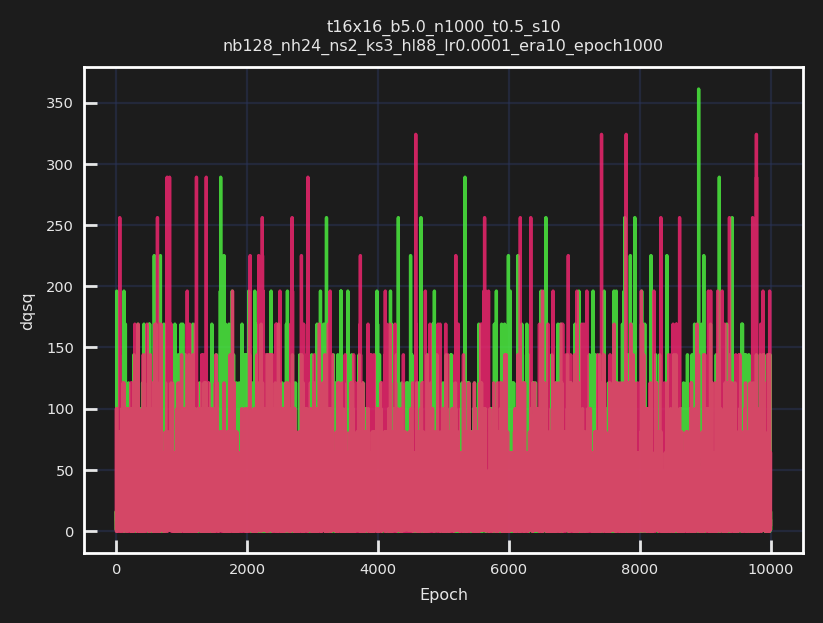

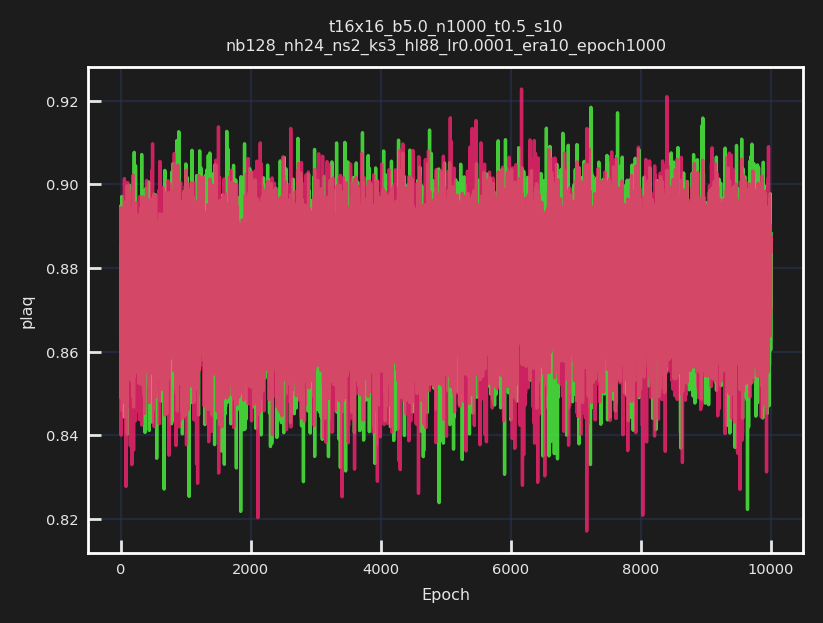

[23:34:47]  Saving train_history to ../../logs/t16x16_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_
            hl88_lr0.0001_era10_epoch1000/training/train_history.z.

NameError: name 'param16' is not defined

In [22]:
layers = train_outputs['model'].layers #['layers']
layers.train()
train_outputs16 = transfer(L=16, param_init=param,
                          config_init=train_config,
                          layers_init=layers, 
                          new_lr=0.0001, run_hmc=True)

# ----------------------------------------------------------------
# Run inference on transferred model and evaluate / plot metrics
# ----------------------------------------------------------------
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history
from fthmc.utils.samplers import make_mcmc_ensemble

sns.set_context('paper')
action_fn16 = qed.BatchAction(param16.beta)
dirs16 = train_outputs16['dirs']
logdir16 = dirs16['logdir']

inf_dir16 = os.path.join(logdir16, 'inference')
inf_pdir16 = os.path.join(inf_dir16, 'plots')
history16 = make_mcmc_ensemble(model=train_outputs16['model'],
                               action_fn=action_fn16,
                               batch_size=train_config16.batch_size,
                               num_samples=1000)
plot_history(history=history16,
             param=param16, config=train_config16, skip=['epoch', 'x'],
             num_chains=4, therm_frac=0.0, xlabel='MC Step', outdir=inf_pdir16)

In [23]:
train_outputs16.keys()

dict_keys(['param', 'config', 'model', 'outputs'])

[23:46:18]  Creating directory: ../../logs/t16x16_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88
            _lr0.0001_era10_epoch1000/inference/plots

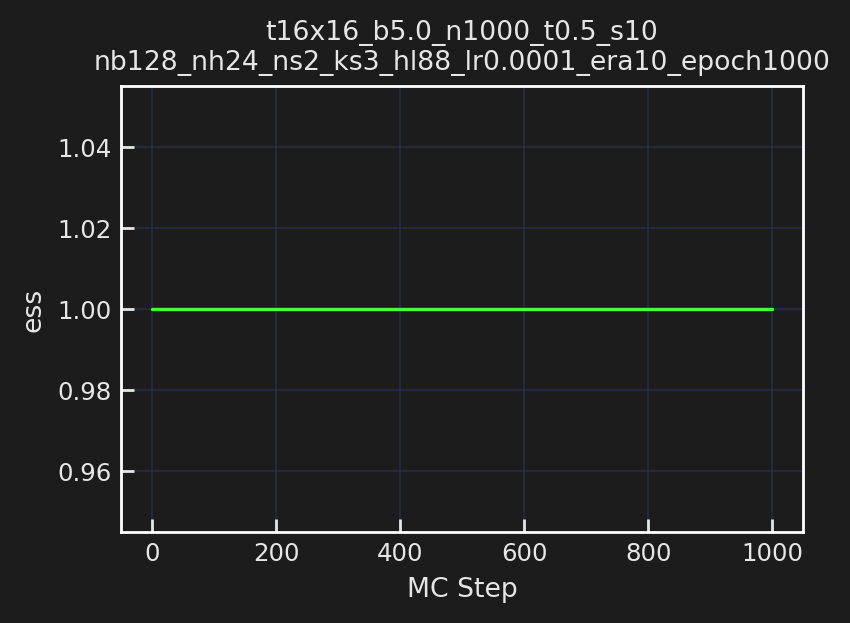

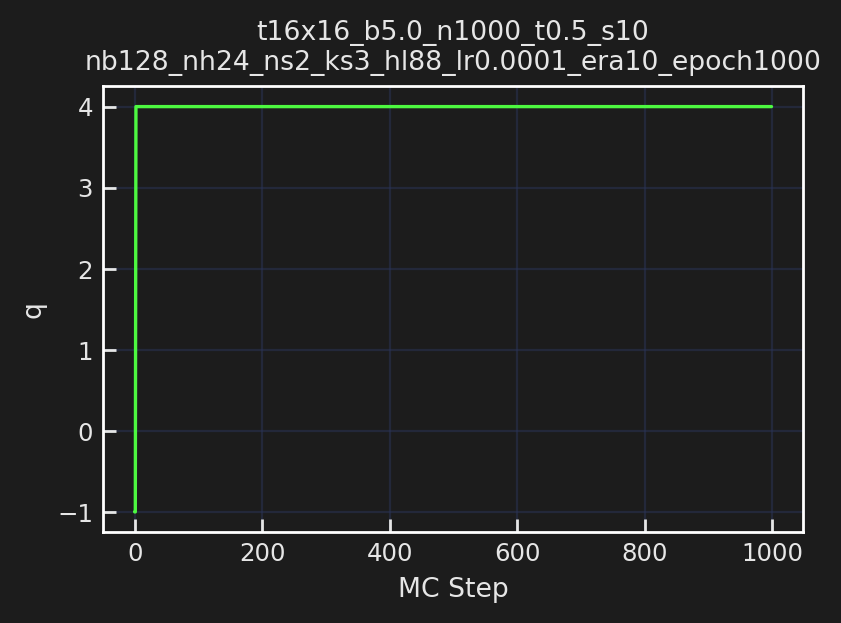

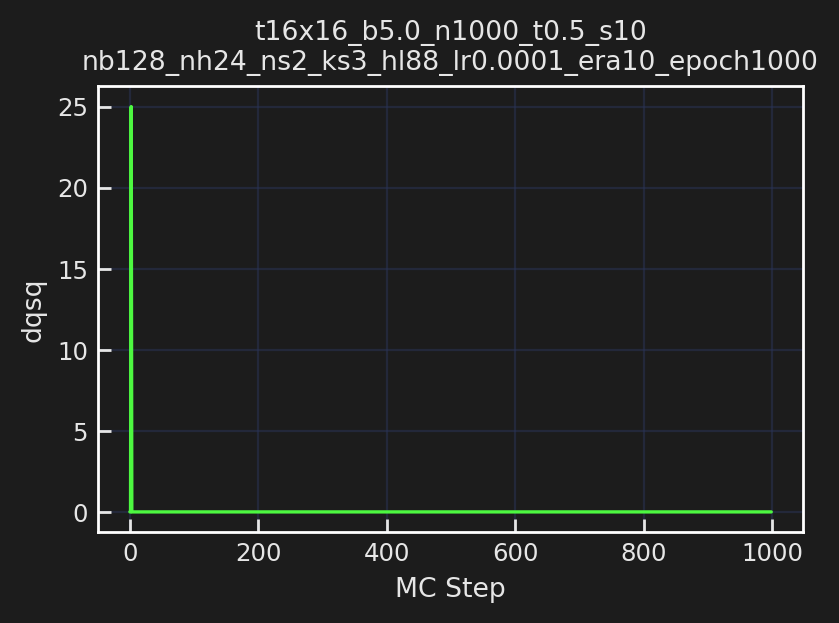

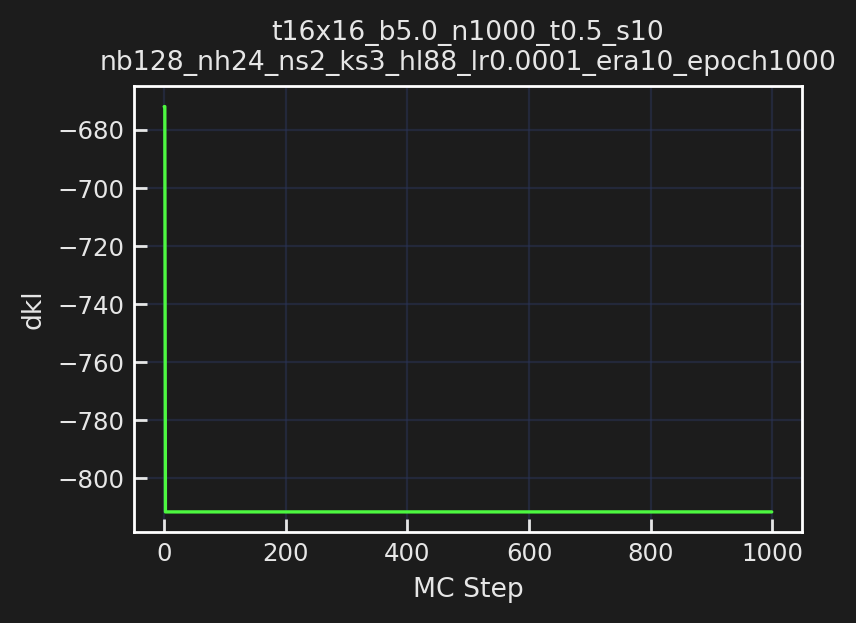

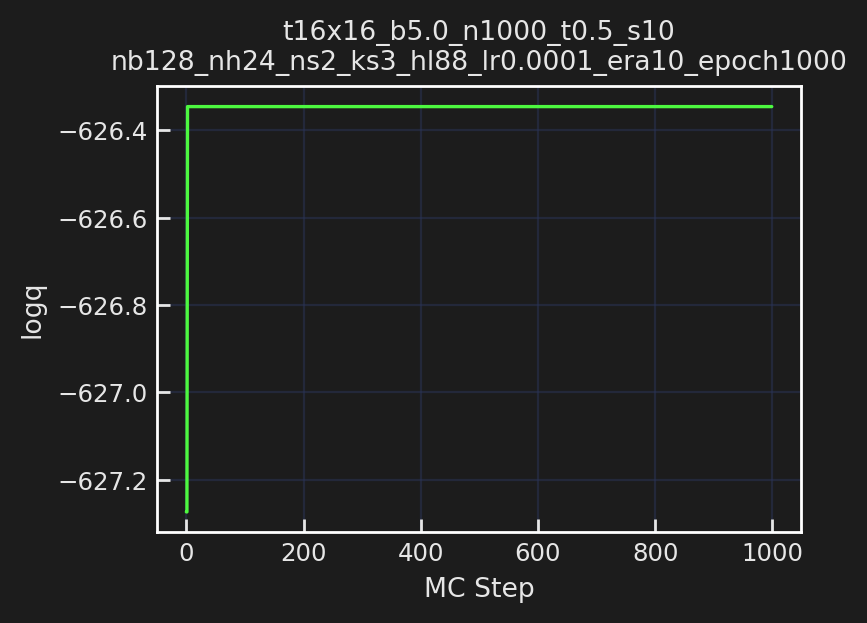

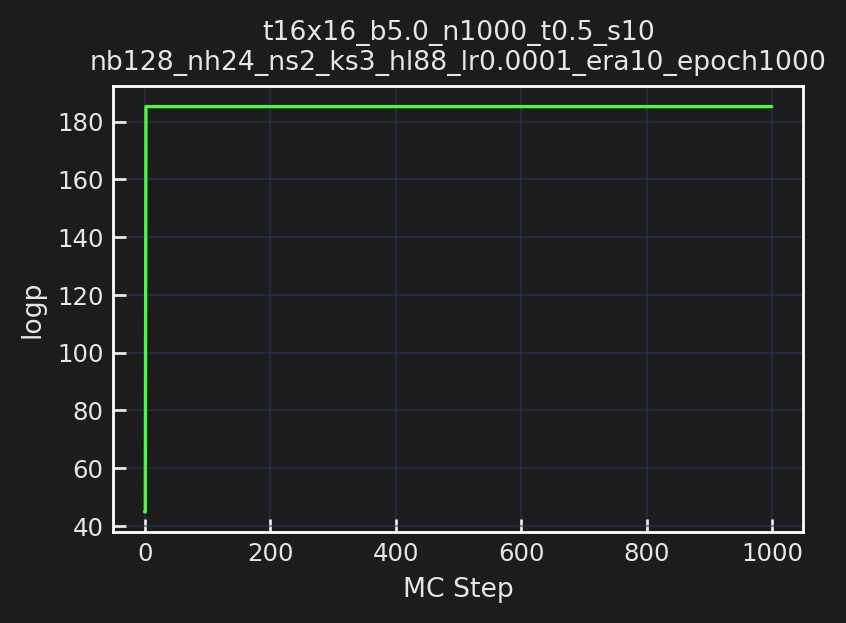

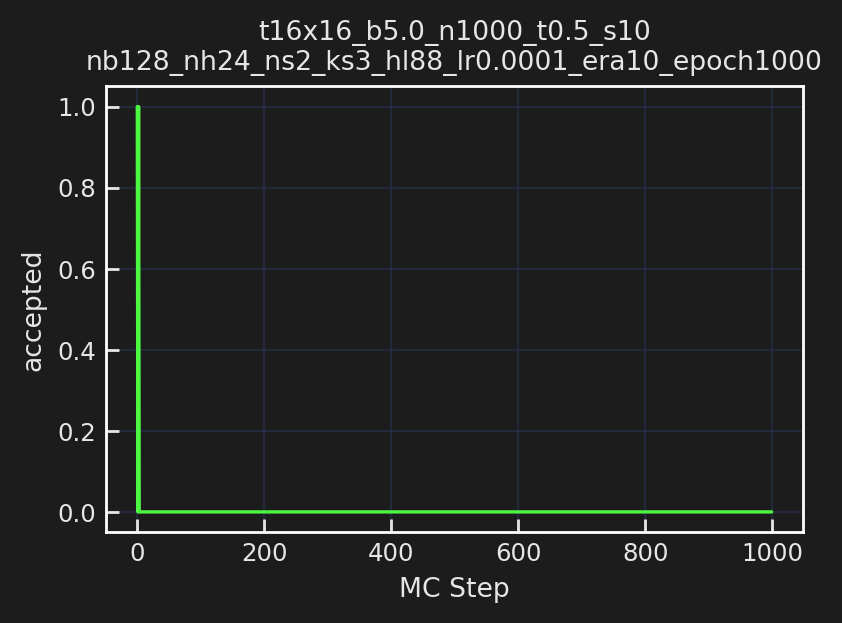

In [24]:
# ----------------------------------------------------------------
# Run inference on transferred model and evaluate / plot metrics
# ----------------------------------------------------------------
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history
from fthmc.utils.samplers import make_mcmc_ensemble

sns.set_context('paper')

param16 = train_outputs16['param']
train_config16 = train_outputs16['config']
model16 = train_outputs16['model']
outputs16 = train_outputs16['outputs']

action_fn16 = qed.BatchAction(param16.beta)
dirs16 = outputs16['dirs']
logdir16 = dirs16['logdir']

inf_dir16 = os.path.join(logdir16, 'inference')
inf_pdir16 = os.path.join(inf_dir16, 'plots')
history16 = make_mcmc_ensemble(model=model16,
                               action_fn=action_fn16,
                               batch_size=train_config16.batch_size,
                               num_samples=1000)
plot_history(history=history16,
             param=param16, config=train_config16, skip=['epoch', 'x'],
             num_chains=4, therm_frac=0.0, xlabel='MC Step', outdir=inf_pdir16)

ModuleList(
  (0): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (1): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (2): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLaye

[23:48:15]  Creating directory: ../../logs/hmc/t16x16_b5.0_n1000_t0.5_s10/2021-06-21-234815

[23:48:15]  Creating directory:                                                              
            ../../logs/hmc/t16x16_b5.0_n1000_t0.5_s10/2021-06-21-234815/plots

[23:48:15]  Param:                                                                           
            ----------------                                                                 
            beta=5.0                                                                         
            L=16                                                                             
            tau=0.5                                                                          
            nstep=10                                                                         
            ntraj=1000                                                                       
            nrun=1                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth_interop=2                                                                    
            nth=2                                                                            
            lat=[16, 16]                                                                     
            nd=2                                                                             
            shape=[2, 16, 16]                                                                
            volume=256                                                                       
            dt=0.05

──────────────────────────────── RUN: 0, last took: 0 m 0 s ─────────────────────────────────

            plaq=1.000 q=0.000

            traj=2 dt=0.007 acc=1.000 dH=-0.393 q=0 dqsq=0 plaq=0.925

[23:48:16]  traj=102 dt=0.006 acc=1.000 dH=-0.040 q=0 dqsq=0 plaq=0.886

            traj=202 dt=0.007 acc=1.000 dH=-0.041 q=0 dqsq=0 plaq=0.892

[23:48:17]  traj=302 dt=0.006 acc=1.000 dH=0.108 q=0 dqsq=0 plaq=0.902

[23:48:18]  traj=402 dt=0.006 acc=1.000 dH=0.171 q=0 dqsq=0 plaq=0.896

            traj=502 dt=0.006 acc=1.000 dH=-0.104 q=0 dqsq=0 plaq=0.895

[23:48:19]  traj=602 dt=0.006 acc=1.000 dH=0.057 q=0 dqsq=0 plaq=0.901

            traj=702 dt=0.006 acc=1.000 dH=-0.132 q=0 dqsq=0 plaq=0.897

[23:48:20]  traj=802 dt=0.006 acc=1.000 dH=-0.024 q=0 dqsq=0 plaq=0.896

[23:48:21]  traj=902 dt=0.006 acc=1.000 dH=-0.134 q=0 dqsq=0 plaq=0.892

[23:48:21]  Creating directory:                                                              
            ../../logs/hmc/t16x16_b5.0_n1000_t0.5_s10/2021-06-21-234815/plots/run0

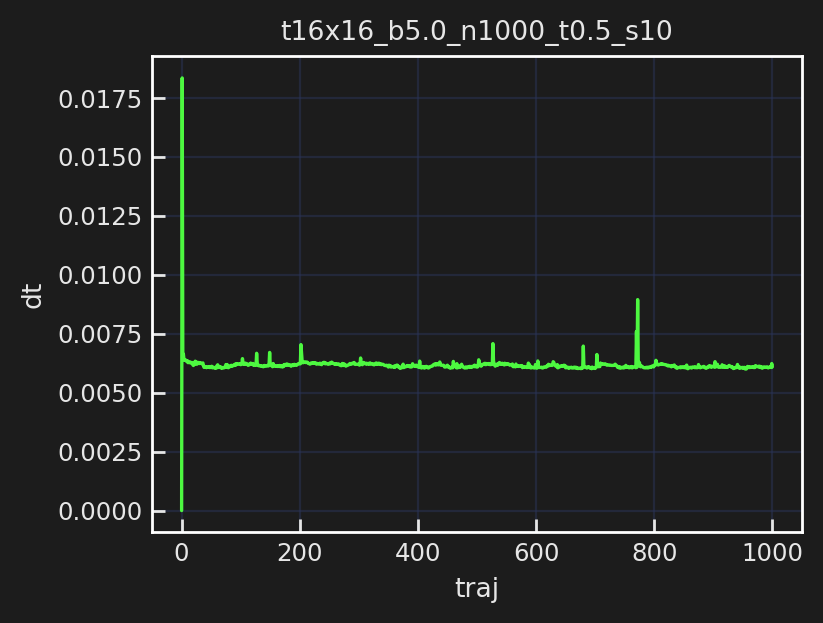

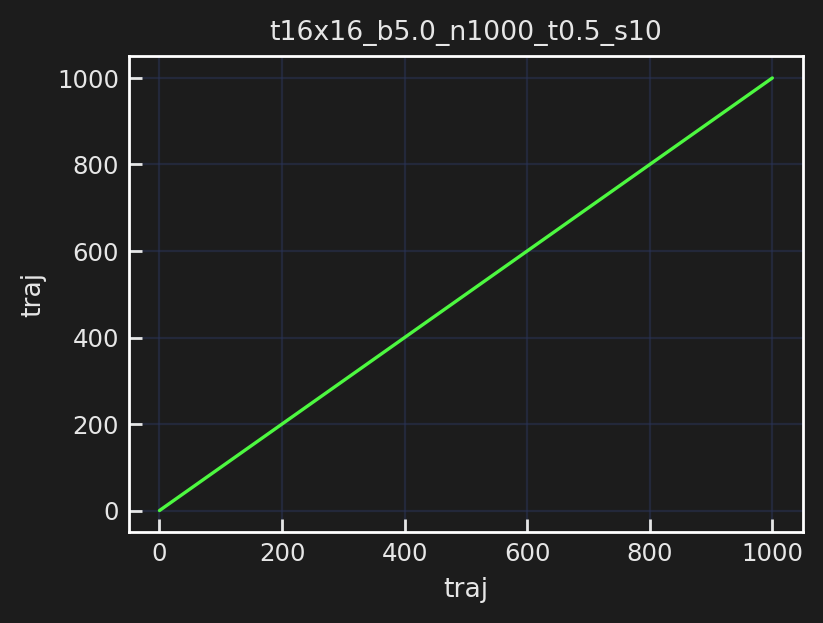

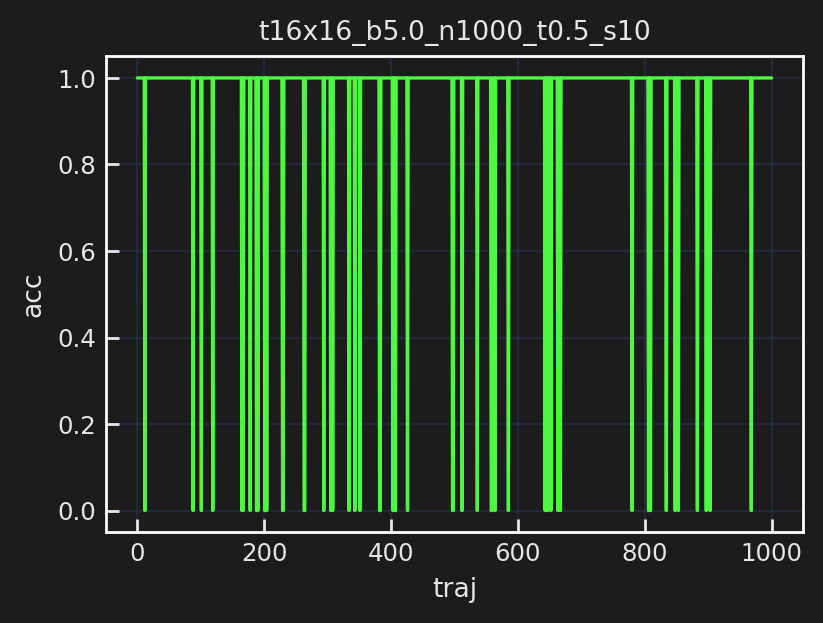

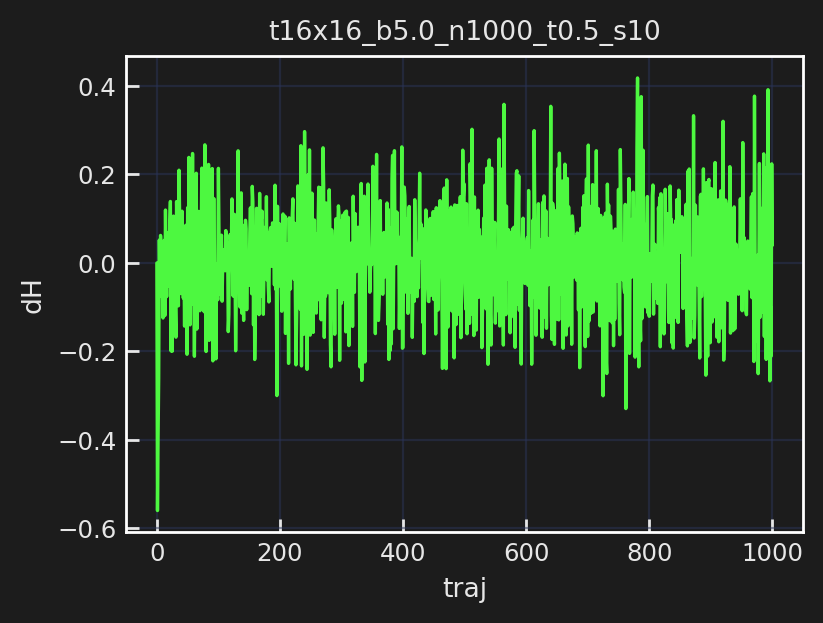

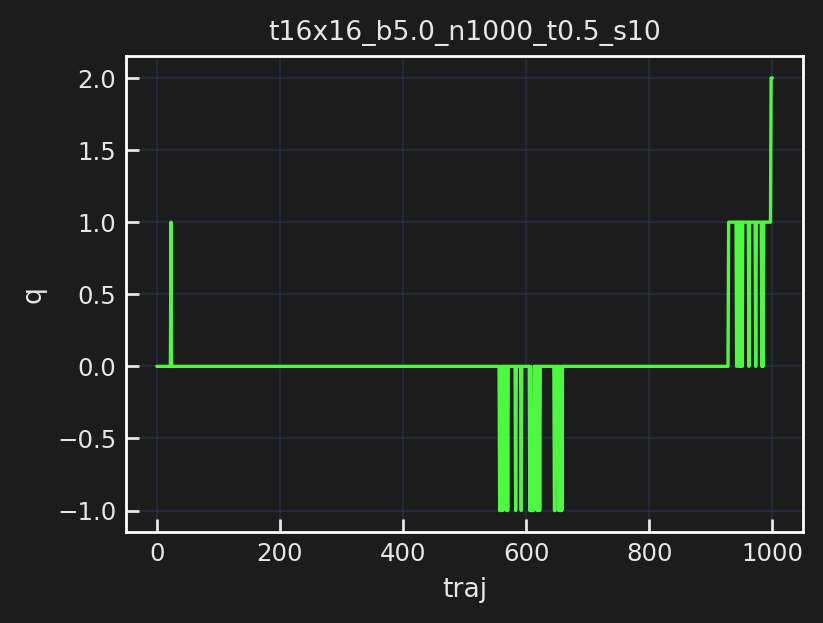

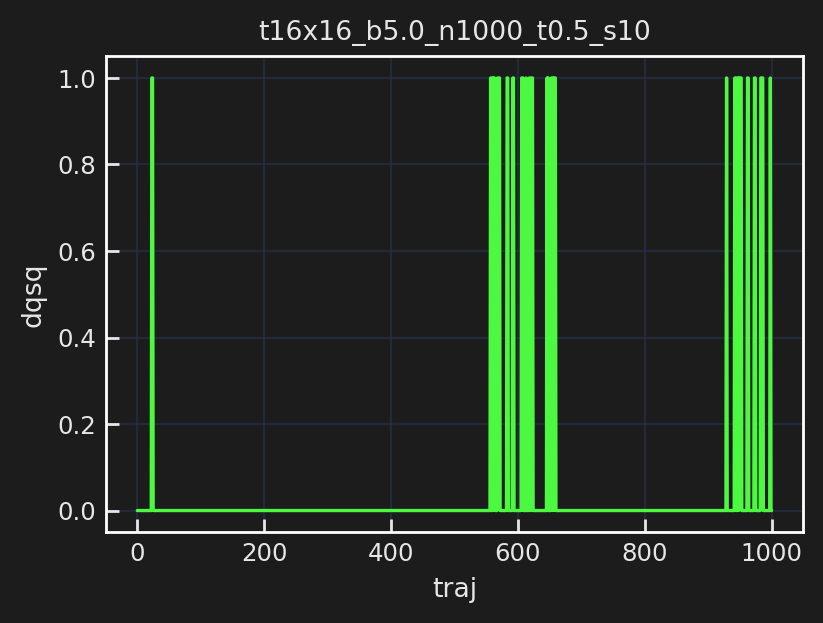

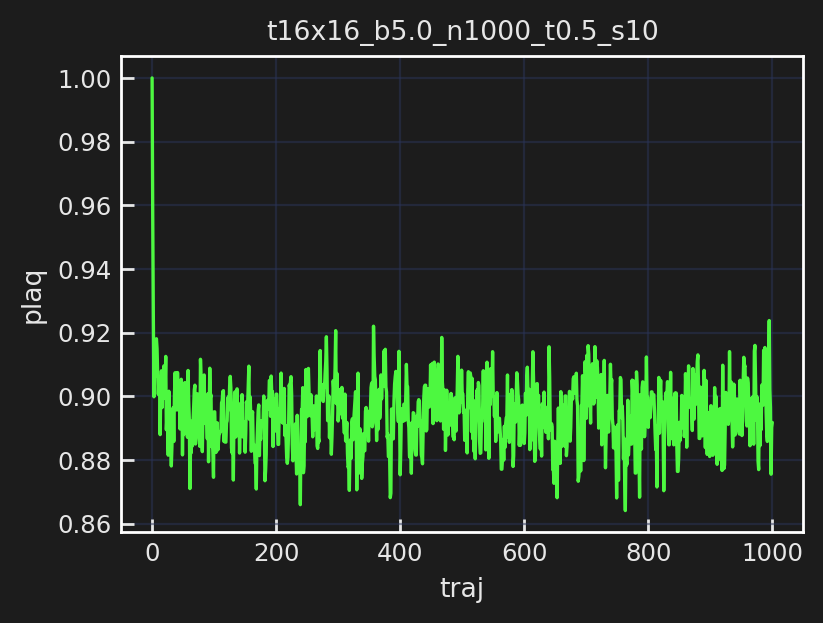

[23:48:23]  Run times: ['6.3122']

            Per trajectory: ['0.0063']

[23:48:23]  Saving hmc_histories to                                                          
            ../../logs/hmc/t16x16_b5.0_n1000_t0.5_s10/2021-06-21-234815/hmc_histories.z.

[23:48:23]  Saving hmc_fields_arr to                                                         
            ../../logs/hmc/t16x16_b5.0_n1000_t0.5_s10/2021-06-21-234815/hmc_fields_arr.z.

[23:48:24]  Creating directory: ../../logs/t16x16_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88
            _lr0.0001_era10_epoch1000/training/2021-06-21-234824

[23:48:24]  Creating directory: ../../logs/t16x16_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88
            _lr0.0001_era10_epoch1000/training/2021-06-21-234824/plots

[23:48:24]  Creating directory: ../../logs/t16x16_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_hl88
            _lr0.0001_era10_epoch1000/training/2021-06-21-234824/checkpoints

[23:48:24]  Scheduler created!

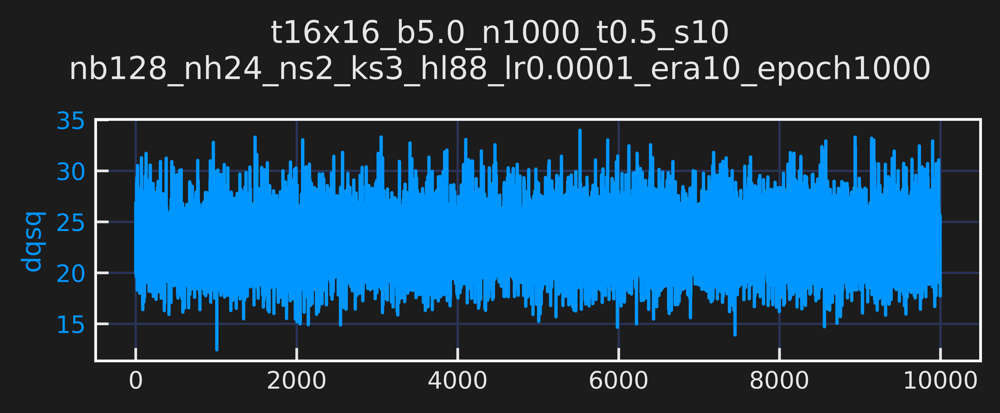

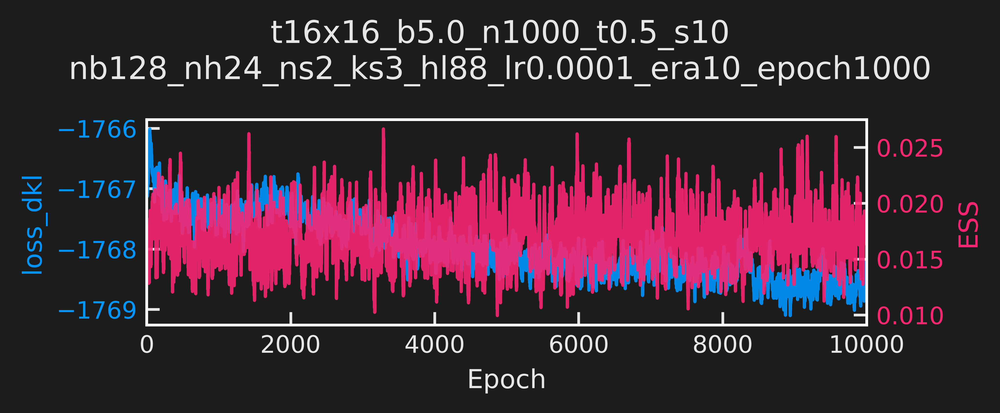

─────────────────────────────── ERA=0, last took: 0 min 0 sec ───────────────────────────────

[23:49:32]  (now) epoch: 499 dt=0.133 ess=0.017 loss_dkl=-1767.209 logp=1122.356             
            logq=-644.852 dqsq=23.922 plaq=0.877

            (avg) epoch: 499 dt=0.133 ess=0.019 loss_dkl=-1767.272 logp=1123.081             
            logq=-644.191 dqsq=23.243 plaq=0.877

[23:50:40]  (now) epoch: 999 dt=0.131 ess=0.018 loss_dkl=-1766.513 logp=1122.524             
            logq=-643.989 dqsq=24.875 plaq=0.877

            (avg) epoch: 999 dt=0.132 ess=0.017 loss_dkl=-1767.516 logp=1122.299             
            logq=-645.216 dqsq=23.631 plaq=0.877

[23:50:41]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era0-epoch999.tar

───────────────────────────── ERA=1, last took: 2 min 16.43 sec ─────────────────────────────

[23:51:47]  (now) epoch: 499 dt=0.130 ess=0.008 loss_dkl=-1767.491 logp=1123.376             
            logq=-644.115 dqsq=25.977 plaq=0.878

            (avg) epoch: 499 dt=0.131 ess=0.014 loss_dkl=-1767.404 logp=1122.756             
            logq=-644.648 dqsq=23.712 plaq=0.877

[23:52:54]  (now) epoch: 999 dt=0.130 ess=0.033 loss_dkl=-1767.119 logp=1121.102             
            logq=-646.016 dqsq=20.094 plaq=0.876

            (avg) epoch: 999 dt=0.131 ess=0.015 loss_dkl=-1767.406 logp=1122.641             
            logq=-644.765 dqsq=23.627 plaq=0.877

[23:52:55]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era1-epoch999.tar

───────────────────────────── ERA=2, last took: 2 min 14.36 sec ─────────────────────────────

[23:54:02]  (now) epoch: 499 dt=0.131 ess=0.009 loss_dkl=-1767.834 logp=1124.880             
            logq=-642.954 dqsq=19.688 plaq=0.879

            (avg) epoch: 499 dt=0.131 ess=0.018 loss_dkl=-1767.506 logp=1123.178             
            logq=-644.328 dqsq=22.711 plaq=0.877

[23:55:09]  (now) epoch: 999 dt=0.131 ess=0.016 loss_dkl=-1766.806 logp=1123.037             
            logq=-643.769 dqsq=18.906 plaq=0.877

            (avg) epoch: 999 dt=0.131 ess=0.015 loss_dkl=-1767.727 logp=1123.623             
            logq=-644.103 dqsq=23.349 plaq=0.878

[23:55:10]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era2-epoch999.tar

───────────────────────────── ERA=3, last took: 2 min 14.76 sec ─────────────────────────────

[23:56:17]  (now) epoch: 499 dt=0.131 ess=0.020 loss_dkl=-1767.955 logp=1123.672             
            logq=-644.283 dqsq=20.500 plaq=0.878

            (avg) epoch: 499 dt=0.131 ess=0.017 loss_dkl=-1767.907 logp=1122.984             
            logq=-644.923 dqsq=24.584 plaq=0.877

[23:57:24]  (now) epoch: 999 dt=0.132 ess=0.025 loss_dkl=-1767.633 logp=1122.848             
            logq=-644.785 dqsq=23.562 plaq=0.877

            (avg) epoch: 999 dt=0.131 ess=0.017 loss_dkl=-1768.048 logp=1123.563             
            logq=-644.485 dqsq=21.777 plaq=0.878

[23:57:26]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era3-epoch999.tar

───────────────────────────── ERA=4, last took: 2 min 14.94 sec ─────────────────────────────

[23:58:32]  (now) epoch: 499 dt=0.131 ess=0.018 loss_dkl=-1767.897 logp=1123.093             
            logq=-644.804 dqsq=26.875 plaq=0.877

            (avg) epoch: 499 dt=0.131 ess=0.015 loss_dkl=-1768.028 logp=1123.742             
            logq=-644.285 dqsq=23.866 plaq=0.878

[23:59:40]  (now) epoch: 999 dt=0.131 ess=0.009 loss_dkl=-1767.350 logp=1123.038             
            logq=-644.312 dqsq=24.172 plaq=0.877

            (avg) epoch: 999 dt=0.131 ess=0.017 loss_dkl=-1768.161 logp=1123.720             
            logq=-644.441 dqsq=22.163 plaq=0.878

[23:59:41]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era4-epoch999.tar

───────────────────────────── ERA=5, last took: 2 min 15.03 sec ─────────────────────────────

[00:00:48]  (now) epoch: 499 dt=0.131 ess=0.009 loss_dkl=-1767.268 logp=1119.863             
            logq=-647.405 dqsq=18.844 plaq=0.875

            (avg) epoch: 499 dt=0.131 ess=0.013 loss_dkl=-1768.218 logp=1122.711             
            logq=-645.507 dqsq=21.999 plaq=0.877

[00:01:55]  (now) epoch: 999 dt=0.131 ess=0.008 loss_dkl=-1767.557 logp=1122.580             
            logq=-644.977 dqsq=25.758 plaq=0.877

            (avg) epoch: 999 dt=0.131 ess=0.021 loss_dkl=-1768.501 logp=1123.103             
            logq=-645.397 dqsq=23.209 plaq=0.877

[00:01:56]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era5-epoch999.tar

───────────────────────────── ERA=6, last took: 2 min 15.14 sec ─────────────────────────────

[00:03:03]  (now) epoch: 499 dt=0.131 ess=0.012 loss_dkl=-1768.795 logp=1123.969             
            logq=-644.827 dqsq=21.352 plaq=0.878

            (avg) epoch: 499 dt=0.131 ess=0.019 loss_dkl=-1768.379 logp=1123.575             
            logq=-644.804 dqsq=22.425 plaq=0.878

[00:04:11]  (now) epoch: 999 dt=0.131 ess=0.014 loss_dkl=-1767.238 logp=1122.798             
            logq=-644.440 dqsq=22.219 plaq=0.877

            (avg) epoch: 999 dt=0.131 ess=0.021 loss_dkl=-1768.124 logp=1123.878             
            logq=-644.246 dqsq=22.852 plaq=0.878

[00:04:12]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era6-epoch999.tar

───────────────────────────── ERA=7, last took: 2 min 15.33 sec ─────────────────────────────

[00:05:19]  (now) epoch: 499 dt=0.131 ess=0.009 loss_dkl=-1768.557 logp=1124.226             
            logq=-644.331 dqsq=24.734 plaq=0.878

            (avg) epoch: 499 dt=0.131 ess=0.016 loss_dkl=-1768.353 logp=1124.027             
            logq=-644.326 dqsq=23.347 plaq=0.878

[00:06:27]  (now) epoch: 999 dt=0.132 ess=0.025 loss_dkl=-1768.178 logp=1122.737             
            logq=-645.442 dqsq=25.766 plaq=0.877

            (avg) epoch: 999 dt=0.131 ess=0.017 loss_dkl=-1768.525 logp=1123.751             
            logq=-644.773 dqsq=22.706 plaq=0.878

[00:06:28]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era7-epoch999.tar

───────────────────────────── ERA=8, last took: 2 min 15.47 sec ─────────────────────────────

[00:07:35]  (now) epoch: 499 dt=0.131 ess=0.008 loss_dkl=-1768.420 logp=1123.670             
            logq=-644.750 dqsq=28.922 plaq=0.878

            (avg) epoch: 499 dt=0.131 ess=0.018 loss_dkl=-1768.604 logp=1123.784             
            logq=-644.820 dqsq=23.292 plaq=0.878

[00:08:44]  (now) epoch: 999 dt=0.134 ess=0.009 loss_dkl=-1768.372 logp=1123.214             
            logq=-645.158 dqsq=24.648 plaq=0.878

            (avg) epoch: 999 dt=0.134 ess=0.015 loss_dkl=-1768.479 logp=1124.342             
            logq=-644.137 dqsq=23.829 plaq=0.878

[00:08:45]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era8-epoch999.tar

───────────────────────────── ERA=9, last took: 2 min 16.35 sec ─────────────────────────────

[00:09:54]  (now) epoch: 499 dt=0.134 ess=0.011 loss_dkl=-1769.213 logp=1125.611             
            logq=-643.602 dqsq=19.359 plaq=0.879

            (avg) epoch: 499 dt=0.134 ess=0.017 loss_dkl=-1768.620 logp=1124.093             
            logq=-644.527 dqsq=22.130 plaq=0.878

[00:11:04]  (now) epoch: 999 dt=0.134 ess=0.025 loss_dkl=-1769.145 logp=1125.661             
            logq=-643.484 dqsq=18.383 plaq=0.879

            (avg) epoch: 999 dt=0.134 ess=0.019 loss_dkl=-1768.421 logp=1123.502             
            logq=-644.919 dqsq=22.542 plaq=0.878

[00:11:05]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era9-epoch999.tar

[00:11:06]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/checkpoints/ckpt-era10-epoch1001.tar

[00:11:07]  Saving live plots to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/t16x16_b5.0_n10
            00_t0.5_s10/nb128_nh24_ns2_ks3_hl88_lr0.0001_era10_epoch1000/training/2021-06-21-
            234824/plots

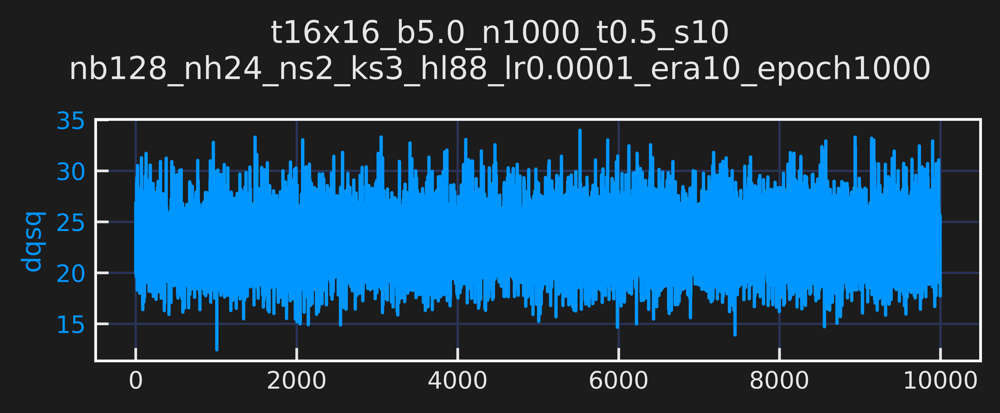

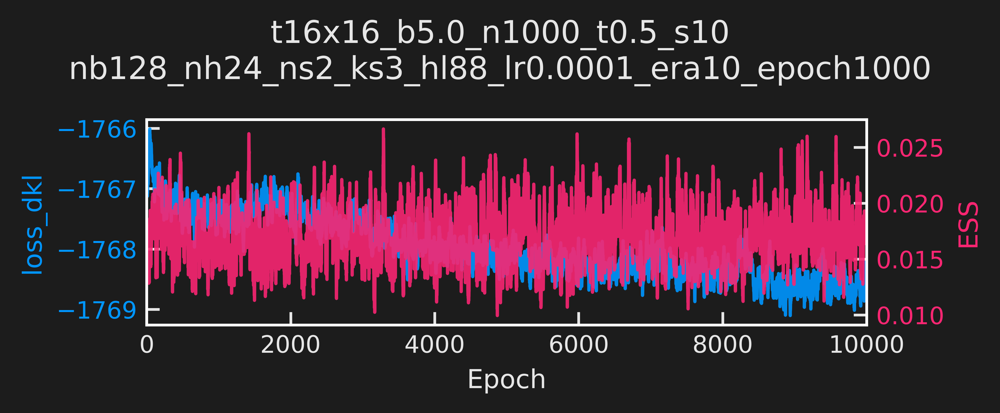

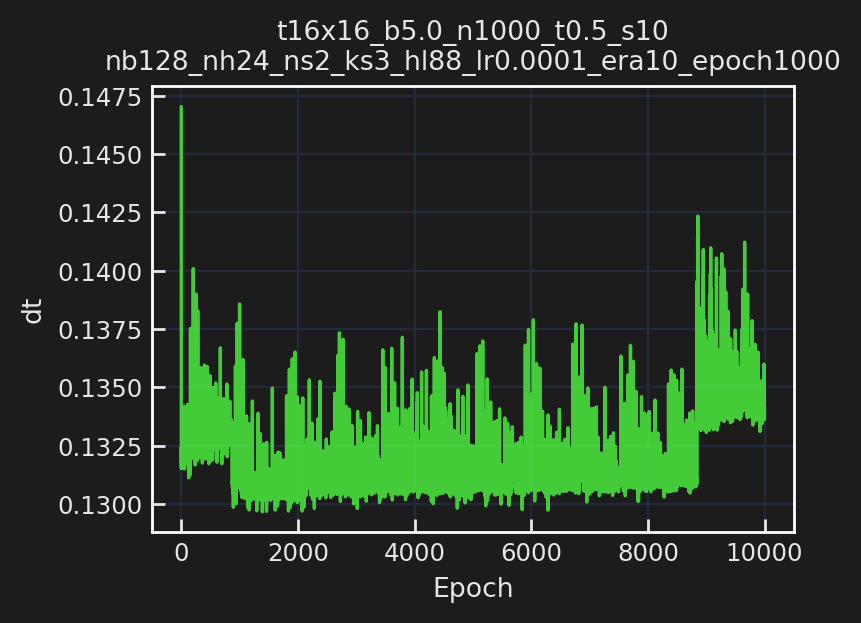

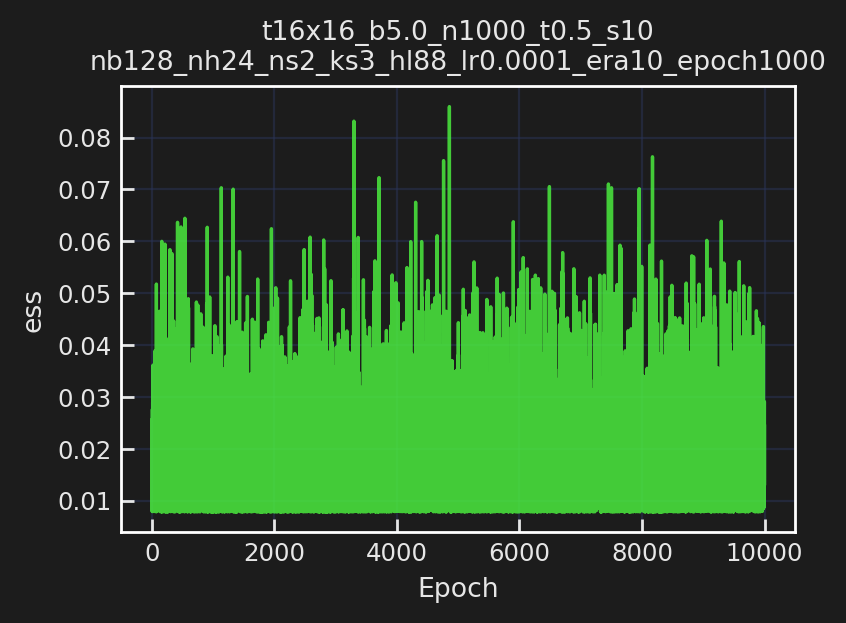

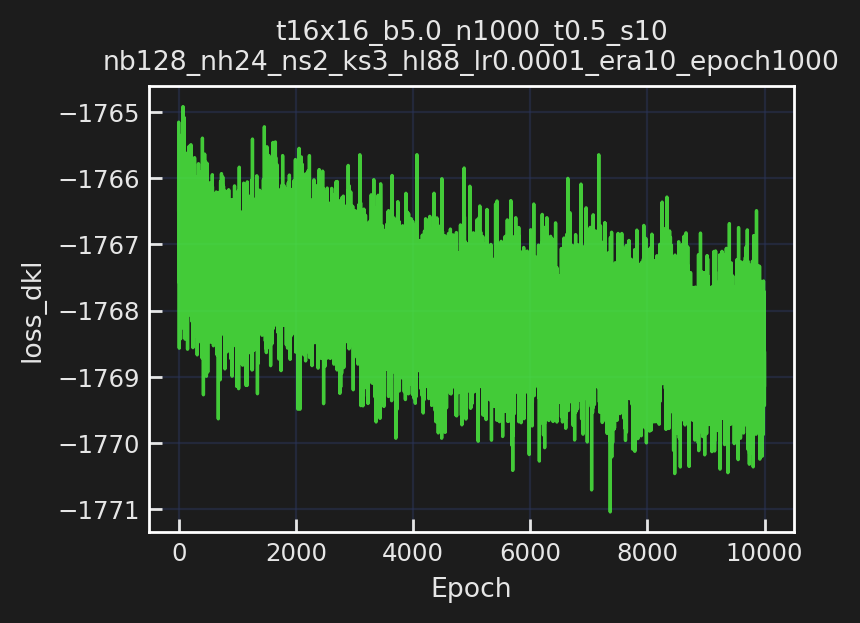

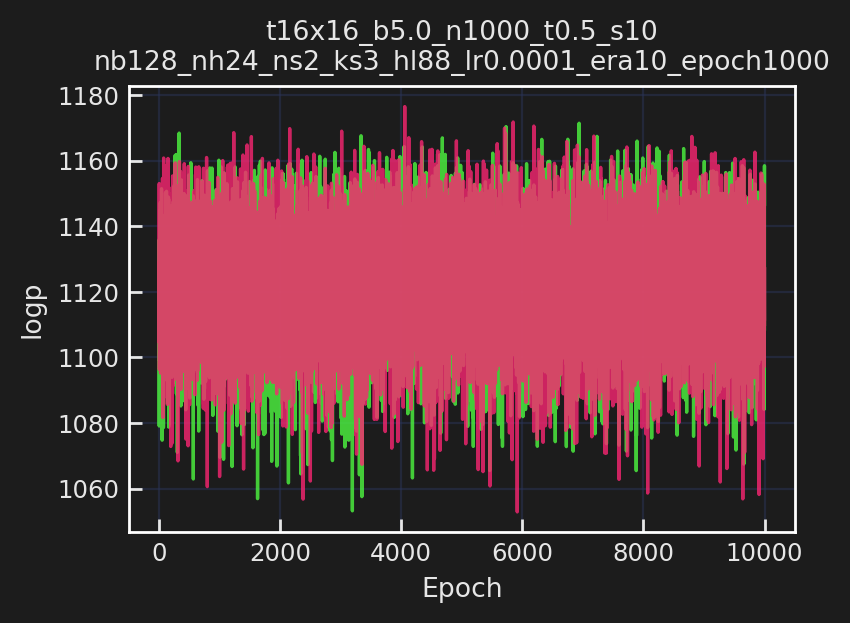

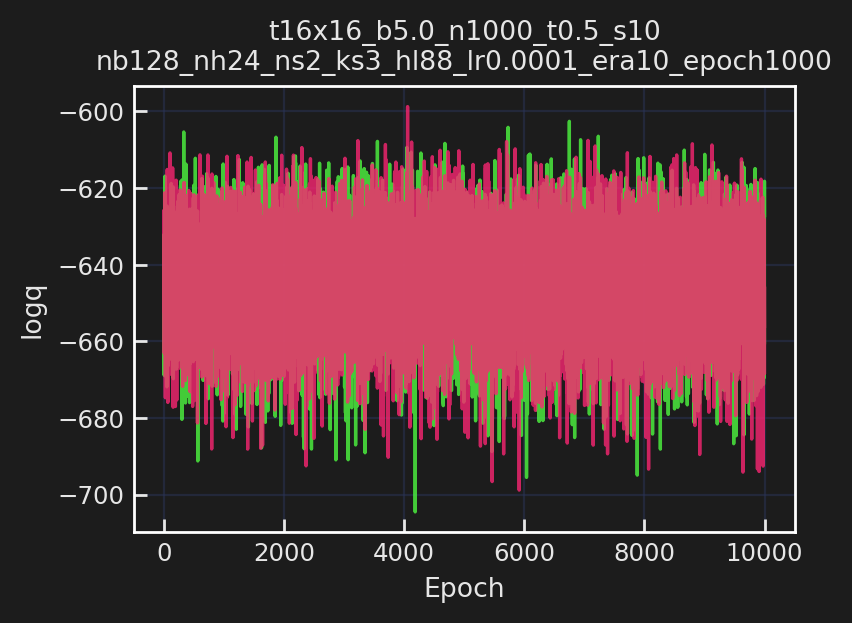

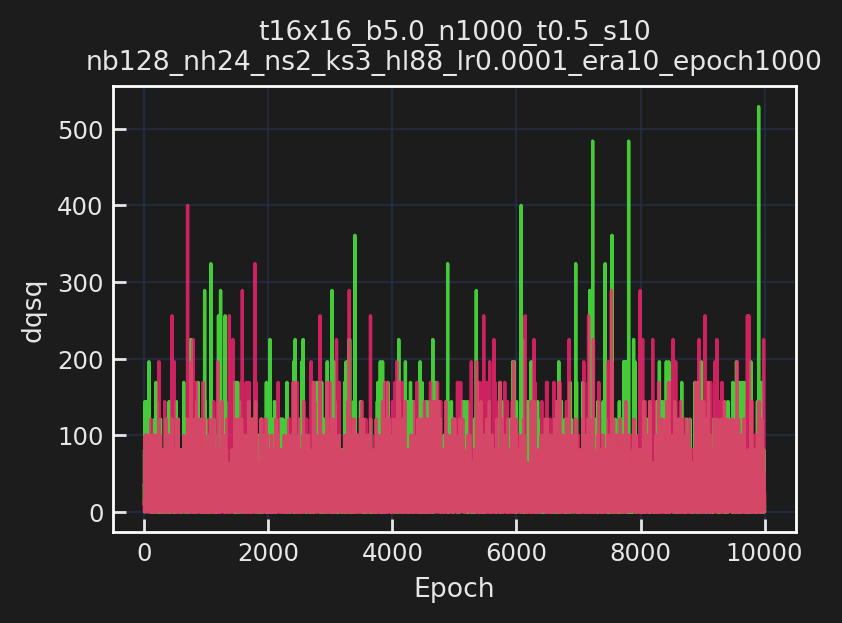

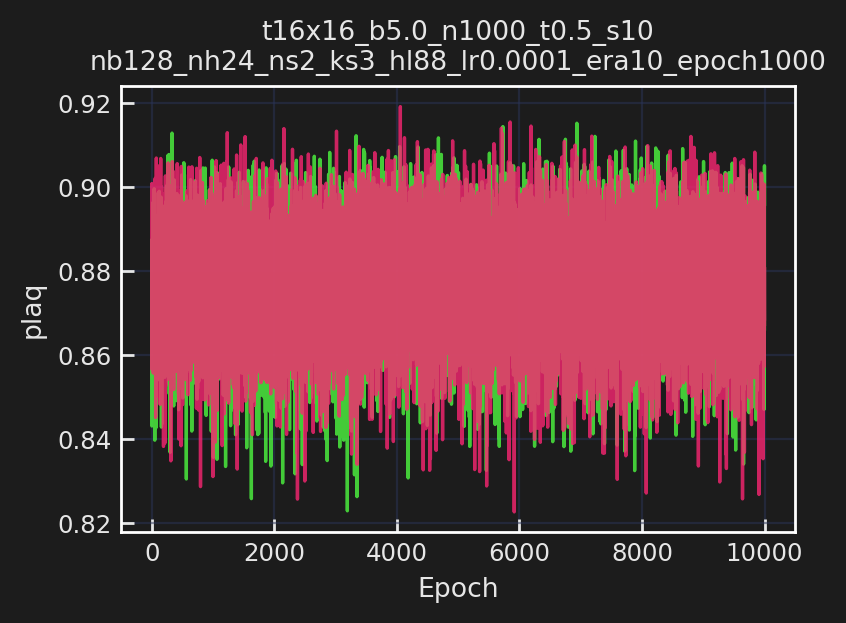

[00:11:11]  Saving train_history to ../../logs/t16x16_b5.0_n1000_t0.5_s10/nb128_nh24_ns2_ks3_
            hl88_lr0.0001_era10_epoch1000/training/2021-06-21-234824/train_history.z.

KeyError: 'dirs'

In [26]:
layers = train_outputs8['model'].layers #['layers']
layers.train()
train_outputs16 = transfer(L=16, param_init=param8,
                          config_init=train_config8,
                          layers_init=layers, 
                          new_lr=0.0001, run_hmc=True)

# ----------------------------------------------------------------
# Run inference on transferred model and evaluate / plot metrics
# ----------------------------------------------------------------
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history
from fthmc.utils.samplers import make_mcmc_ensemble

sns.set_context('paper')
action_fn16 = qed.BatchAction(param8.beta)
dirs16 = train_outputs16['dirs']
logdir16 = dirs16['logdir']

inf_dir16 = os.path.join(logdir16, 'inference')
inf_pdir16 = os.path.join(inf_dir16, 'plots')
history16 = make_mcmc_ensemble(model=train_outputs16['model'],
                               action_fn=action_fn16,
                               batch_size=train_config16.batch_size,
                               num_samples=1000)
plot_history(history=history16,
             param=16, config=train_config16, skip=['epoch', 'x'],
             num_chains=4, therm_frac=0.0, xlabel='MC Step', outdir=inf_pdir16)

In [ ]:
model16.layers

In [27]:
param16

Param:
----------------
beta=5.0
L=16
tau=0.5
nstep=10
ntraj=1000
nrun=1
nprint=100
seed=1331
randinit=False
nth_interop=2
nth=2
lat=[16, 16]
nd=2
shape=[2, 16, 16]
volume=256
dt=0.05

In [ ]:
from fthmc.ft_hmc import ft_run
fields, metrics = ft_run(param16, model16.layers)

In [29]:
%debug

> /lus/grand/projects/DLHMC/conda/pytorch/2021-05-12/lib/python3.8/site-packages/numpy/core/arrayprint.py(703)_extendLine()
    701 
    702     if needs_wrap:
--> 703         s += line.rstrip() + "\n"
    704         line = next_line_prefix
    705     line += word

ipdb> up
> /lus/grand/projects/DLHMC/conda/pytorch/2021-05-12/lib/python3.8/site-packages/numpy/core/arrayprint.py(715)_extendLine_pretty()
    713     words = word.splitlines()
    714     if len(words) == 1 or legacy == '1.13':
--> 715         return _extendLine(s, line, word, line_width, next_line_prefix, legacy)
    716 
    717     max_word_length = max(len(word) for word in words)

ipdb> up
> /lus/grand/projects/DLHMC/conda/pytorch/2021-05-12/lib/python3.8/site-packages/numpy/core/arrayprint.py(802)recurser()
    800             for i in range(trailing_items, 1, -1):
    801                 word = recurser(index + (-i,), next_hanging_indent, next_width)
--> 802                 s, line = _extendLine_pretty(
    803   

# OLD

In [3]:
%matplotlib inline

In [ ]:
import matplotlib as mpl

from fthmc.train import train
from fthmc.utils.param import Param
from fthmc.config import TrainConfig, PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_u1_equiv_layers, set_weights
from fthmc.utils.plot_helpers import save_live_plots

import fthmc.utils.qed_helpers as qed

import datetime

from fthmc.config import LOGS_DIR

mpl.rcParams['text.usetex'] = False
plt.style.use('/Users/saforem2/.matplotlib/stylelib/molokai.mplstyle')

param = {
    'L': 4,
    'tau': 0.5,
    'nrun': 2,
    'beta': 4.,
    'nstep': 5,
    'ntraj': 1000,
    'nprint': 100,
    'seed': 1331,
}

train_config = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 50,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 3,
    'batch_size': 64,
    'print_freq': 20,
    'plot_freq': 20,
})

param = Param(**param)
logger.log(repr(param))
logger.log(repr(train_config))

#logdir = io.make_experiment_dirs(param, train_config)

## Specify directories for saving model, etc

In [ ]:
from fthmc.hmc import run_hmc

#hmc_mdir = io.tstamp_dir(os.path.join(logdir, 'hmc'))
#hmc_mdir = io.tstamp_dir(os.path.join(dirs, 'hmc'))

hmc_fields, hmc_history = run_hmc(param,
                                  keep_fields=True,
                                  save_history=True)

## Define `TrainConfig` and build model as
```python
model = {
    'prior': MultivariateUniform(...),
    'model': make_u1_equiv_layers(...),
}
```

### Train `model_init`:

In [ ]:
train_config.n_epoch = 100

In [ ]:
from fthmc.train import train

%matplotlib inline
plt.style.use('default')
plt.style.use('/Users/saforem2/.matplotlib/stylelib/molokai.mplstyle')
sns.set_context('paper', font_scale=0.6)

train_outputs = train(param,
                      train_config,
                      pre_model=None,
                      figsize=(5, 2))

pre_flow_plots = train_outputs['plots']
pre_flow_history = train_outputs['history']
flow_act = train_outputs['action']
pre_flow_model = train_outputs['model']
pre_flow_optimizer = train_outputs['optimizer']

## Run inference on trained model and plot history

In [ ]:
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history
from fthmc.utils.samplers import make_mcmc_ensemble

action_fn = qed.BatchAction(param.beta)
dirs = train_outputs['dirs']
logdir = dirs['logdir']

inf_dir = os.path.join(logdir, 'inference')
inf_pdir = os.path.join(inf_dir, 'plots')
history = make_mcmc_ensemble(model=train_outputs['model'], action_fn=action_fn,
                             batch_size=train_config.batch_size, num_samples=1000)
plot_history(history=history,
             param=param, config=train_config, skip=['epoch', 'x'],
             num_chains=4, therm_frac=0.0, xlabel='MC Step', outdir=inf_pdir)

### Transfer to new lattice

In [ ]:
from dataclasses import asdict
from fthmc.train import train, transfer_to_new_lattice
%matplotlib inline

plt.style.use('default')
plt.style.use('/Users/saforem2/.matplotlib/stylelib/molokai.mplstyle')
sns.set_context('paper', font_scale=0.6)

layers = train_outputs['model']['layers']


xfr = transfer_to_new_lattice(L=6,
                              layers=layers,
                              param_init=param)
param6 = xfr['param']
model6 = xfr['model']

cfg_dict = asdict(train_config)
cfg_dict['base_lr'] = 0.0005
train_config6 = TrainConfig(**cfg_dict)

train_outputs6 = train(param6,
                       train_config6,
                       model=model6,
                       pre_model=None,
                       figsize=(5, 2))

#pre_flow_plots = train_outputs['plots']
#pre_flow_history = train_outputs['history']
#flow_act = train_outputs['action']
#pre_flow_model = train_outputs['model']
#pre_flow_optimizer = train_outputs['optimizer']

In [ ]:
txfrtxfr

In [ ]:
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed

tstamp = io.get_timestamp('%Y-%m-%d-%H%M%S')

history = make_mcmc_ensemble(model=train_outputs['model'],
                             action_fn=train_outputs['action'],
                             batch_size=train_config.batch_size,
                             num_samples=1000)

pdir = os.path.join(PLOTS_DIR, 'inference', 'pre_flow_model', TSTAMP)
if os.path.isdir(pdir):
    pdir = os.path.join(PLOTS_DIR, 'inference', 'pre_flow_model', tstamp)
    
mdir = os.path.join(PLOTS_DIR,' inference', 'pre_flow_model', TSTAMP)
if os.path.isdir(mdir):
    mdir = os.path.join(METRICS_DIR, 'inference', 'pre_flow_model', TSTAMP)
    
io.check_else_make_dir(pdir)
io.check_else_make_dir(mdir)

plot_history(history=history,
             param=param, skip=['epoch', 'x'],
             num_chains=2, therm_frac=0.0,#, thin=10,
             xlabel='MC Step', outdir=pdir, alpha=0.5)

mfile = os.path.join(mdir, 'inference_metrics.z')

io.save_history(history, mfile, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

In [ ]:
from fthmc.config import grab

#for key, val in history.items():
#    #x = grab(val)
#    if key == 'x':
#        continue
#        
#    logger.log(f'({key}) shape: {val.shape}, mean: {np.mean(val)}')
np.mean(history['accepted'])
#np.mean(history['accepted'])

In [ ]:
from fthmc.utils.samplers import generate_ensemble

outputs = generate_ensemble(pre_flow_model, flow_act, logger=logger)

history = outputs['history']
#u1_ens = outputs['ensemble']

pre_flow = pre_flow_model['layers']

In [ ]:
import matplotlib.pyplot as plt

from fthmc.utils.plot_helpers import plot_history

tstamp = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir = os.path.join(PLOTS_DIR, 'training', 'pre_flow_model', TSTAMP)
if os.path.isdir(pdir):
    pdir = os.path.join(PLOTS_DIR, 'training', 'pre_flow_model', tstamp)
    
mdir = os.path.join(METRICS_DIR, 'training', 'pre_flow_model', TSTAMP)
if os.path.isdir(mdir):
    mdir = os.path.join(METRICS_DIR, 'training', 'pre_flow_model', tstamp)
    
io.check_else_make_dir(pdir)
io.check_else_make_dir(mdir)

plot_history(history=train_outputs['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=outdir, alpha=0.5)

mfile = os.path.join(mdir, 'train_metrics.z')
io.save_history(train_outputs['history'], mfile, name='train_metrics')

In [ ]:
train_force = False
flow_model = None

if train_force:
    flow_model, flow_act = flow_train(param, with_force=True, pre_model=pre_flow_model)
else:
    flow_model = pre_flow_model
    
u1_ens = generate_ensemble(flow_model, flow_act, logger=logger)
flow = flow_model['layers']
flow.eval()

# Try increasing $\beta$ on `4x4` lattice

In [ ]:
from dataclasses import asdict

pdict = asdict(param)
logger.log(pdict)

In [ ]:
type(pre_flow_model['layers'])

In [ ]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history

param4 = Param(**{
    'L': 4,
    'tau': 1.,
    'nrun': 5,
    'beta': 4.5,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 100,
    'seed': 1331,
})

logger.log(repr(param4))

flow4 = make_net_from_layers(lattice_shape=tuple(param.lat),
                              nets=get_nets(pre_flow_model['layers']))


train_config4 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 100,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 3,
    'batch_size': 256,
    'print_freq': 100,
    'plot_freq': 100,
})

prior4 = MultivariateUniform(torch.zeros((2, *param4.lat)),
                              2. * PI * torch.ones(tuple(param4.lat)))

model4 = {'layers': flow4, 'prior': prior4}

DAYSTR4 = io.get_timestamp('%Y-%m-%d')
NOW4 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP4 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR4 = os.path.join(LOGS_DIR,
                           param4.uniquestr())
METRICS_DIR4 = os.path.join(PARAM_DIR4, 'metrics')
MODEL_DIR4 = os.path.join(PARAM_DIR4, 'models')
PLOTS_DIR4 = os.path.join(PARAM_DIR4, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR4)
io.check_else_make_dir(MODEL_DIR4)
io.check_else_make_dir(METRICS_DIR4)
io.check_else_make_dir(PLOTS_DIR4)

train_outputs4 = train(param4,
                        train_config4,
                        model=model4,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots4 = train_outputs4['plots']
pre_flow_history4 = train_outputs4['history']
flow_act4 = train_outputs4['action']

pre_flow_model4 = train_outputs4['model']
pre_flow_optimizer4 = train_outputs4['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step4 = train_config4.n_era * train_config4.n_epoch

outfile4 = os.path.join(MODEL_DIR4, 'pre_flow_model', TSTAMP4, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step4,
    outfile=outfile4,
    model=pre_flow_model4['layers'],
    optimizer=pre_flow_optimizer4,
    history=train_outputs4['history'],
    overwrite=True,
)

plots4 = train_outputs4['plots']
outdir4 = os.path.join(PLOTS_DIR4, 'training', 'pre_flow_model', TSTAMP4)

save_live_plots(plots4, outdir4)


tstamp4 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir4 = os.path.join(PLOTS_DIR4, 'training', 'pre_flow_model', TSTAMP4)
if os.path.isdir(pdir4):
    pdir4 = os.path.join(PLOTS_DIR4, 'training', 'pre_flow_model', tstamp4)
    
mdir4 = os.path.join(METRICS_DIR4, 'training', 'pre_flow_model', TSTAMP4)
if os.path.isdir(mdir4):
    mdir4 = os.path.join(METRICS_DIR4, 'training', 'pre_flow_model', tstamp4)
    
io.check_else_make_dir(pdir4)
io.check_else_make_dir(mdir4)

plot_history(history=train_outputs4['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir4, alpha=0.5)

mfile4 = os.path.join(mdir4, 'train_metrics.z')
io.save_history(train_outputs4['history'], mfile4, name='train_metrics')


history4 = make_mcmc_ensemble(model=train_outputs4['model'],
                               action_fn=train_outputs4['action'],
                               batch_size=train_config4.batch_size,
                               num_samples=10000)

pdir4 = os.path.join(PLOTS_DIR4, 'inference', 'pre_flow_model', TSTAMP4)
if os.path.isdir(pdir):
    pdir4 = os.path.join(PLOTS_DIR4, 'inference', 'pre_flow_model', tstamp4)
    
mdir4 = os.path.join(PLOTS_DIR4,'inference', 'pre_flow_model', TSTAMP4)
if os.path.isdir(mdir):
    mdir4 = os.path.join(METRICS_DIR4, 'inference', 'pre_flow_model', TSTAMP4)
    
io.check_else_make_dir(pdir4)
io.check_else_make_dir(mdir4)

plot_history(history=history4,
             param=param4,
             outdir=pdir4,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile4 = os.path.join(mdir4, 'inference_metrics.z')

io.save_history(history4, mfile4, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

## Extract layers from `pre_flow_model` and transfer learning to larger lattice

## Transfer up to $8\times8$ lattice

In [ ]:
logger.log(repr(param))
logger.log(train_config)

In [ ]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history

param8 = Param(**{
    'L': 8,
    'tau': 1.,
    'nrun': 5,
    'beta': 4.5,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 100,
    'seed': 1331,
})

logger.log(repr(param8))

flow8 = make_net_from_layers(lattice_shape=tuple(param8.lat),
                             nets=get_nets(pre_flow_model['layers']))


train_config8 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 100,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 3,
    'batch_size': 256,
    'print_freq': 100,
    'plot_freq': 100,
})
logger.log(repr(param8))

prior8 = MultivariateUniform(torch.zeros((2, *param8.lat)),
                              2. * PI * torch.ones(tuple(param8.lat)))

model8 = {'layers': flow8, 'prior': prior8}

DAYSTR8 = io.get_timestamp('%Y-%m-%d')
NOW8 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP8 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR8 = os.path.join(LOGS_DIR,
                           param8.uniquestr())
METRICS_DIR8 = os.path.join(PARAM_DIR8, 'metrics')
MODEL_DIR8 = os.path.join(PARAM_DIR8, 'models')
PLOTS_DIR8 = os.path.join(PARAM_DIR8, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR8)
io.check_else_make_dir(MODEL_DIR8)
io.check_else_make_dir(METRICS_DIR8)
io.check_else_make_dir(PLOTS_DIR8)

train_outputs8 = train(param8,
                        train_config8,
                        model=model8,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots8 = train_outputs8['plots']
pre_flow_history8 = train_outputs8['history']
flow_act8 = train_outputs8['action']

pre_flow_model8 = train_outputs8['model']
pre_flow_optimizer8 = train_outputs8['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step8 = train_config8.n_era * train_config8.n_epoch

outfile8 = os.path.join(MODEL_DIR8, 'pre_flow_model', TSTAMP8, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step8,
    outfile=outfile8,
    model=pre_flow_model8['layers'],
    optimizer=pre_flow_optimizer8,
    history=train_outputs8['history'],
    overwrite=True,
)

plots8 = train_outputs8['plots']
outdir8 = os.path.join(PLOTS_DIR8, 'training', 'pre_flow_model', TSTAMP8)

save_live_plots(plots8, outdir8)


tstamp8 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir8 = os.path.join(PLOTS_DIR8, 'training', 'pre_flow_model', TSTAMP8)
if os.path.isdir(pdir8):
    pdir8 = os.path.join(PLOTS_DIR8, 'training', 'pre_flow_model', tstamp8)
    
mdir8 = os.path.join(METRICS_DIR8, 'training', 'pre_flow_model', TSTAMP8)
if os.path.isdir(mdir8):
    mdir8 = os.path.join(METRICS_DIR8, 'training', 'pre_flow_model', tstamp8)
    
io.check_else_make_dir(pdir8)
io.check_else_make_dir(mdir8)

plot_history(history=train_outputs8['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir8, alpha=0.5)

mfile8 = os.path.join(mdir8, 'train_metrics.z')
io.save_history(train_outputs8['history'], mfile8, name='train_metrics')


history8 = make_mcmc_ensemble(model=train_outputs8['model'],
                               action_fn=train_outputs8['action'],
                               batch_size=train_config8.batch_size,
                               num_samples=10000)

pdir8 = os.path.join(PLOTS_DIR8, 'inference', 'pre_flow_model', TSTAMP8)
if os.path.isdir(pdir):
    pdir8 = os.path.join(PLOTS_DIR8, 'inference', 'pre_flow_model', tstamp8)
    
mdir8 = os.path.join(PLOTS_DIR8,'inference', 'pre_flow_model', TSTAMP8)
if os.path.isdir(mdir):
    mdir8 = os.path.join(METRICS_DIR8, 'inference', 'pre_flow_model', TSTAMP8)
    
io.check_else_make_dir(pdir8)
io.check_else_make_dir(mdir8)

plot_history(history=history8,
             param=param8,
             outdir=pdir8,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile8 = os.path.join(mdir8, 'inference_metrics.z')

io.save_history(history8, mfile8, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

# Try increasing $\beta$, using previously trained `8x8` network

In [ ]:
param8_1 = Param(
    beta=3.,
    L=8,
    tau=0.5,
    nstep=10,
    ntraj=256,
    nrun=5,
    nprint=100,
    seed=1331,
    randinit=False,
    nth=2,
    nth_interop=2,
)

logger.log(repr(param8_1))

flow8_1 = make_net_from_layers(lattice_shape=tuple(param8_1.lat),
                              nets=get_nets(pre_flow_model['layers']))


train_config8_1 = TrainConfig(
    n_era=10,
    n_epoch=100,
    n_layers=24,
    n_s_nets=2,
    hidden_sizes=[8, 8],
    kernel_size=3,
    base_lr=0.001,
    batch_size=64,
    print_freq=10,
    plot_freq=10,
    with_force=False,
)

prior8_1 = MultivariateUniform(torch.zeros((2, *param8_1.lat)),
                              2. * PI * torch.ones(tuple(param8_1.lat)))

model8_1 = {'layers': flow8_1, 'prior': prior8_1}

DAYSTR8_1 = io.get_timestamp('%Y-%m-%d')
NOW8_1 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP8_1 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR8_1 = os.path.join(LOGS_DIR,
                           param8_1.uniquestr())
METRICS_DIR8_1 = os.path.join(PARAM_DIR8_1, 'metrics')
MODEL_DIR8_1 = os.path.join(PARAM_DIR8_1, 'models')
PLOTS_DIR8_1 = os.path.join(PARAM_DIR8_1, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR8_1)
io.check_else_make_dir(MODEL_DIR8_1)
io.check_else_make_dir(METRICS_DIR8_1)
io.check_else_make_dir(PLOTS_DIR8_1)

train_outputs8_1 = train(param8_1,
                        train_config8_1,
                        model=model8_1,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots8_1 = train_outputs8_1['plots']
pre_flow_history8_1 = train_outputs8_1['history']
flow_act8_1 = train_outputs8_1['action']

pre_flow_model8_1 = train_outputs8_1['model']
pre_flow_optimizer8_1 = train_outputs8_1['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step8_1 = train_config8_1.n_era * train_config8_1.n_epoch

outfile8_1 = os.path.join(MODEL_DIR8_1, 'pre_flow_model', TSTAMP8_1, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step8_1,
    outfile=outfile8_1,
    model=pre_flow_model8_1['layers'],
    optimizer=pre_flow_optimizer8_1,
    history=train_outputs8_1['history'],
    overwrite=True,
)

plots8_1 = train_outputs8_1['plots']
outdir8_1 = os.path.join(PLOTS_DIR8_1, 'training', 'pre_flow_model', TSTAMP8_1)

save_live_plots(plots8_1, outdir8_1)


tstamp8_1 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir8_1 = os.path.join(PLOTS_DIR8_1, 'training', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(pdir8_1):
    pdir8_1 = os.path.join(PLOTS_DIR8_1, 'training', 'pre_flow_model', tstamp8_1)
    
mdir8_1 = os.path.join(METRICS_DIR8_1, 'training', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(mdir8_1):
    mdir8_1 = os.path.join(METRICS_DIR8_1, 'training', 'pre_flow_model', tstamp8_1)
    
io.check_else_make_dir(pdir8_1)
io.check_else_make_dir(mdir8_1)

plot_history(history=train_outputs8_1['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir8_1, alpha=0.5)

mfile8_1 = os.path.join(mdir8_1, 'train_metrics.z')
io.save_history(train_outputs8_1['history'], mfile8_1, name='train_metrics')


history8_1 = make_mcmc_ensemble(model=train_outputs8_1['model'],
                               action_fn=train_outputs8_1['action'],
                               batch_size=train_config8_1.batch_size,
                               num_samples=10000)

pdir8_1 = os.path.join(PLOTS_DIR8_1, 'inference', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(pdir):
    pdir8_1 = os.path.join(PLOTS_DIR8_1, 'inference', 'pre_flow_model', tstamp8_1)
    
mdir8_1 = os.path.join(PLOTS_DIR8_1,'inference', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(mdir):
    mdir8_1 = os.path.join(METRICS_DIR8_1, 'inference', 'pre_flow_model', TSTAMP8_1)
    
io.check_else_make_dir(pdir8_1)
io.check_else_make_dir(mdir8_1)

plot_history(history=history8_1,
             param=param8_1,
             outdir=pdir8_1,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile8_1 = os.path.join(mdir8_1, 'inference_metrics.z')

io.save_history(history8_1, mfile8_1, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

# Try increasing $\beta$ again...

In [ ]:
param8_1 = Param(
    beta=3.,
    L=8,
    tau=0.5,
    nstep=10,
    ntraj=256,
    nrun=5,
    nprint=100,
    seed=1331,
    randinit=False,
    nth=2,
    nth_interop=2,
)

logger.log(repr(param8_1))

flow8_1 = make_net_from_layers(lattice_shape=tuple(param8_1.lat),
                              nets=get_nets(pre_flow_model['layers']))


train_config8_1 = TrainConfig(
    n_era=10,
    n_epoch=100,
    n_layers=24,
    n_s_nets=2,
    hidden_sizes=[8, 8],
    kernel_size=3,
    base_lr=0.001,
    batch_size=64,
    print_freq=10,
    plot_freq=10,
    with_force=False,
)

prior8_1 = MultivariateUniform(torch.zeros((2, *param8_1.lat)),
                              2. * PI * torch.ones(tuple(param8_1.lat)))

model8_1 = {'layers': flow8_1, 'prior': prior8_1}

DAYSTR8_1 = io.get_timestamp('%Y-%m-%d')
NOW8_1 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP8_1 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR8_1 = os.path.join(LOGS_DIR,
                           param8_1.uniquestr())
METRICS_DIR8_1 = os.path.join(PARAM_DIR8_1, 'metrics')
MODEL_DIR8_1 = os.path.join(PARAM_DIR8_1, 'models')
PLOTS_DIR8_1 = os.path.join(PARAM_DIR8_1, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR8_1)
io.check_else_make_dir(MODEL_DIR8_1)
io.check_else_make_dir(METRICS_DIR8_1)
io.check_else_make_dir(PLOTS_DIR8_1)

train_outputs8_1 = train(param8_1,
                        train_config8_1,
                        model=model8_1,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots8_1 = train_outputs8_1['plots']
pre_flow_history8_1 = train_outputs8_1['history']
flow_act8_1 = train_outputs8_1['action']

pre_flow_model8_1 = train_outputs8_1['model']
pre_flow_optimizer8_1 = train_outputs8_1['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step8_1 = train_config8_1.n_era * train_config8_1.n_epoch

outfile8_1 = os.path.join(MODEL_DIR8_1, 'pre_flow_model', TSTAMP8_1, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step8_1,
    outfile=outfile8_1,
    model=pre_flow_model8_1['layers'],
    optimizer=pre_flow_optimizer8_1,
    history=train_outputs8_1['history'],
    overwrite=True,
)

plots8_1 = train_outputs8_1['plots']
outdir8_1 = os.path.join(PLOTS_DIR8_1, 'training', 'pre_flow_model', TSTAMP8_1)

save_live_plots(plots8_1, outdir8_1)


tstamp8_1 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir8_1 = os.path.join(PLOTS_DIR8_1, 'training', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(pdir8_1):
    pdir8_1 = os.path.join(PLOTS_DIR8_1, 'training', 'pre_flow_model', tstamp8_1)
    
mdir8_1 = os.path.join(METRICS_DIR8_1, 'training', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(mdir8_1):
    mdir8_1 = os.path.join(METRICS_DIR8_1, 'training', 'pre_flow_model', tstamp8_1)
    
io.check_else_make_dir(pdir8_1)
io.check_else_make_dir(mdir8_1)

plot_history(history=train_outputs8_1['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir8_1, alpha=0.5)

mfile8_1 = os.path.join(mdir8_1, 'train_metrics.z')
io.save_history(train_outputs8_1['history'], mfile8_1, name='train_metrics')


history8_1 = make_mcmc_ensemble(model=train_outputs8_1['model'],
                               action_fn=train_outputs8_1['action'],
                               batch_size=train_config8_1.batch_size,
                               num_samples=10000)

pdir8_1 = os.path.join(PLOTS_DIR8_1, 'inference', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(pdir):
    pdir8_1 = os.path.join(PLOTS_DIR8_1, 'inference', 'pre_flow_model', tstamp8_1)
    
mdir8_1 = os.path.join(PLOTS_DIR8_1,'inference', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(mdir):
    mdir8_1 = os.path.join(METRICS_DIR8_1, 'inference', 'pre_flow_model', TSTAMP8_1)
    
io.check_else_make_dir(pdir8_1)
io.check_else_make_dir(mdir8_1)

plot_history(history=history8_1,
             param=param8_1,
             outdir=pdir8_1,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile8_1 = os.path.join(mdir8_1, 'inference_metrics.z')

io.save_history(history8_1, mfile8_1, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

# Transfer to `12x12` lattice

In [ ]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history


param12 = {
    'L': 12,
    'tau': 0.5,
    'nrun': 5,
    'beta': 2.,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 50,
    'seed': 1331,
    'randinit': True,
}

param12 = Param(**param12)
logger.log(repr(param12))

flow12 = make_net_from_layers(lattice_shape=tuple(param12.lat),
                              nets=get_nets(pre_flow_model['layers']))

train_config12 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 100,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 3,
    'batch_size': 64,
    'print_freq': 10,
    'plot_freq': 10,
})

prior12 = MultivariateUniform(torch.zeros((2, *param12.lat)),
                              2. * PI * torch.ones(tuple(param12.lat)))

model12 = {'layers': flow12, 'prior': prior12}

DAYSTR12 = io.get_timestamp('%Y-%m-%d')
NOW12 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP12 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR12 = os.path.join(LOGS_DIR,
                           param12.uniquestr())
METRICS_DIR12 = os.path.join(PARAM_DIR12, 'metrics')
MODEL_DIR12 = os.path.join(PARAM_DIR12, 'models')
PLOTS_DIR12 = os.path.join(PARAM_DIR12, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR12)
io.check_else_make_dir(MODEL_DIR12)
io.check_else_make_dir(METRICS_DIR12)
io.check_else_make_dir(PLOTS_DIR12)

train_outputs12 = train(param12,
                        train_config12,
                        model=model12,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots12 = train_outputs12['plots']
pre_flow_history12 = train_outputs12['history']
flow_act12 = train_outputs12['action']

pre_flow_model12 = train_outputs12['model']
pre_flow_optimizer12 = train_outputs12['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step12 = train_config12.n_era * train_config12.n_epoch

outfile12 = os.path.join(MODEL_DIR12, 'pre_flow_model', TSTAMP12, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step12,
    outfile=outfile12,
    model=pre_flow_model12['layers'],
    optimizer=pre_flow_optimizer12,
    history=train_outputs12['history'],
    overwrite=True,
)

plots12 = train_outputs12['plots']
outdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', TSTAMP12)

save_live_plots(plots12, outdir12)


tstamp12 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', TSTAMP12)
if os.path.isdir(pdir12):
    pdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', tstamp12)
    
mdir12 = os.path.join(METRICS_DIR12, 'training', 'pre_flow_model', TSTAMP12)
if os.path.isdir(mdir12):
    mdir12 = os.path.join(METRICS_DIR12, 'training', 'pre_flow_model', tstamp12)
    
io.check_else_make_dir(pdir12)
io.check_else_make_dir(mdir12)

plot_history(history=train_outputs12['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir12, alpha=0.5)

mfile12 = os.path.join(mdir12, 'train_metrics.z')
io.save_history(train_outputs12['history'], mfile12, name='train_metrics')


history12 = make_mcmc_ensemble(model=train_outputs12['model'],
                               action_fn=train_outputs12['action'],
                               batch_size=train_config12.batch_size,
                               num_samples=10000)

pdir12 = os.path.join(PLOTS_DIR12, 'inference', 'pre_flow_model', TSTAMP12)
if os.path.isdir(pdir):
    pdir12 = os.path.join(PLOTS_DIR12, 'inference', 'pre_flow_model', tstamp12)
    
mdir12 = os.path.join(PLOTS_DIR12,'inference', 'pre_flow_model', TSTAMP12)
if os.path.isdir(mdir):
    mdir12 = os.path.join(METRICS_DIR12, 'inference', 'pre_flow_model', TSTAMP12)
    
io.check_else_make_dir(pdir12)
io.check_else_make_dir(mdir12)

plot_history(history=history12,
             param=param12,
             outdir=pdir12,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile12 = os.path.join(mdir12, 'inference_metrics.z')

io.save_history(history12, mfile12, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

In [ ]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history


param16 = {
    'L': 16,
    'tau': 0.5,
    'nrun': 5,
    'beta': 2.,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 50,
    'seed': 1331,
    'randinit': True,
}

param16 = Param(**param16)
logger.log(repr(param16))

flow16 = make_net_from_layers(lattice_shape=tuple(param16.lat),
                              nets=get_nets(pre_flow_model['layers']))

train_config16 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 100,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 3,
    'batch_size': 64,
    'print_freq': 10,
    'plot_freq': 10,
})

prior16 = MultivariateUniform(torch.zeros((2, *param16.lat)),
                              2. * PI * torch.ones(tuple(param16.lat)))

model16 = {'layers': flow16, 'prior': prior16}

DAYSTR16 = io.get_timestamp('%Y-%m-%d')
NOW16 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP16 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR16 = os.path.join(LOGS_DIR,
                           param16.uniquestr())
METRICS_DIR16 = os.path.join(PARAM_DIR16, 'metrics')
MODEL_DIR16 = os.path.join(PARAM_DIR16, 'models')
PLOTS_DIR16 = os.path.join(PARAM_DIR16, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR16)
io.check_else_make_dir(MODEL_DIR16)
io.check_else_make_dir(METRICS_DIR16)
io.check_else_make_dir(PLOTS_DIR16)

train_outputs16 = train(param16,
                        train_config16,
                        model=model16,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots16 = train_outputs16['plots']
pre_flow_history16 = train_outputs16['history']
flow_act16 = train_outputs16['action']

pre_flow_model16 = train_outputs16['model']
pre_flow_optimizer16 = train_outputs16['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step16 = train_config16.n_era * train_config16.n_epoch

outfile16 = os.path.join(MODEL_DIR16, 'pre_flow_model', TSTAMP16, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step16,
    outfile=outfile16,
    model=pre_flow_model16['layers'],
    optimizer=pre_flow_optimizer16,
    history=train_outputs16['history'],
    overwrite=True,
)

plots16 = train_outputs16['plots']
outdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', TSTAMP16)

save_live_plots(plots16, outdir16)


tstamp16 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', TSTAMP16)
if os.path.isdir(pdir16):
    pdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', tstamp16)
    
mdir16 = os.path.join(METRICS_DIR16, 'training', 'pre_flow_model', TSTAMP16)
if os.path.isdir(mdir16):
    mdir16 = os.path.join(METRICS_DIR16, 'training', 'pre_flow_model', tstamp16)
    
io.check_else_make_dir(pdir16)
io.check_else_make_dir(mdir16)

plot_history(history=train_outputs16['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir16, alpha=0.5)

mfile16 = os.path.join(mdir16, 'train_metrics.z')
io.save_history(train_outputs16['history'], mfile16, name='train_metrics')


history16 = make_mcmc_ensemble(model=train_outputs16['model'],
                               action_fn=train_outputs16['action'],
                               batch_size=train_config16.batch_size,
                               num_samples=10000)

pdir16 = os.path.join(PLOTS_DIR16, 'inference', 'pre_flow_model', TSTAMP16)
if os.path.isdir(pdir):
    pdir16 = os.path.join(PLOTS_DIR16, 'inference', 'pre_flow_model', tstamp16)
    
mdir16 = os.path.join(PLOTS_DIR16,'inference', 'pre_flow_model', TSTAMP16)
if os.path.isdir(mdir):
    mdir16 = os.path.join(METRICS_DIR16, 'inference', 'pre_flow_model', TSTAMP16)
    
io.check_else_make_dir(pdir16)
io.check_else_make_dir(mdir16)

plot_history(history=history16,
             param=param16,
             outdir=pdir16,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile16 = os.path.join(mdir16, 'inference_metrics.z')

io.save_history(history16, mfile16, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

In [ ]:
logger.log(repr(param))

In [ ]:
logger.log(train_config)

In [ ]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets

param12 = {
    'L': 12,
    'tau': 0.5,
    'nrun': 5,
    'beta': 2.,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 50,
    'seed': 1331,
    'randinit': True,
}

param12 = Param(**param12)
logger.log(repr(param12))

flow12 = make_net_from_layers(lattice_shape=tuple(param12.lat),
                              nets=get_nets(pre_flow_model['layers']))

train_config12 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 1000,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [12, 12],
    'kernel_size': 5,
    'batch_size': 256,
    'print_freq': 100,
    'plot_freq': 100,
})

prior12 = MultivariateUniform(torch.zeros((2, *param12.lat)),
                              2. * PI * torch.ones(tuple(param12.lat)))

model12 = {'layers': flow12, 'prior': prior12}

In [ ]:
DAYSTR12 = io.get_timestamp('%Y-%m-%d')
NOW12 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP12 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR12 = os.path.join(LOGS_DIR,
                           param12.uniquestr())
METRICS_DIR12 = os.path.join(PARAM_DIR12, 'metrics')
MODEL_DIR12 = os.path.join(PARAM_DIR12, 'models')
PLOTS_DIR12 = os.path.join(PARAM_DIR12, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR12)
io.check_else_make_dir(MODEL_DIR12)
io.check_else_make_dir(METRICS_DIR12)
io.check_else_make_dir(PLOTS_DIR12)

In [ ]:
train_outputs12 = train(param12,
                        train_config12,
                        model=model12,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots12 = train_outputs12['plots']
pre_flow_history12 = train_outputs12['history']
flow_act12 = train_outputs12['action']

pre_flow_model12 = train_outputs12['model']
pre_flow_optimizer12 = train_outputs12['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step12 = train_config12.n_era * train_config12.n_epoch

outfile12 = os.path.join(MODEL_DIR12, 'pre_flow_model', TSTAMP12, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step12,
    outfile=outfile12,
    model=pre_flow_model12['layers'],
    optimizer=pre_flow_optimizer12,
    history=train_outputs12['history'],
    overwrite=True,
)

plots12 = train_outputs12['plots']
outdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', TSTAMP12)

save_live_plots(plots12, outdir12)

In [ ]:
from fthmc.utils.plot_helpers import plot_history

tstamp12 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', TSTAMP12)
if os.path.isdir(pdir12):
    pdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', tstamp12)
    
mdir12 = os.path.join(METRICS_DIR12, 'training', 'pre_flow_model', TSTAMP12)
if os.path.isdir(mdir12):
    mdir12 = os.path.join(METRICS_DIR12, 'training', 'pre_flow_model', tstamp12)
    
io.check_else_make_dir(pdir12)
io.check_else_make_dir(mdir12)

plot_history(history=train_outputs12['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir12, alpha=0.5)

mfile12 = os.path.join(mdir12, 'train_metrics.z')
io.save_history(train_outputs12['history'], mfile12, name='train_metrics')

In [ ]:
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed


history12 = make_mcmc_ensemble(model=train_outputs12['model'],
                               action_fn=train_outputs12['action'],
                               batch_size=train_config12.batch_size,
                               num_samples=10000)

pdir12 = os.path.join(PLOTS_DIR12, 'inference', 'pre_flow_model', TSTAMP12)
if os.path.isdir(pdir):
    pdir12 = os.path.join(PLOTS_DIR12, 'inference', 'pre_flow_model', tstamp12)
    
mdir12 = os.path.join(PLOTS_DIR12,'inference', 'pre_flow_model', TSTAMP12)
if os.path.isdir(mdir):
    mdir12 = os.path.join(METRICS_DIR12, 'inference', 'pre_flow_model', TSTAMP12)
    
io.check_else_make_dir(pdir12)
io.check_else_make_dir(mdir12)

plot_history(history=history12,
             param=param12,
             outdir=pdir12,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile12 = os.path.join(mdir12, 'inference_metrics.z')

io.save_history(history12, mfile12, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

In [ ]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed

from fthmc.utils.plot_helpers import plot_history

param16 = {
    'L': 16,
    'tau': 0.5,
    'nrun': 5,
    'beta': 2.,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 50,
    'seed': 1331,
    'randinit': True,
}

param16 = Param(**param16)
logger.log(repr(param16))

flow16 = make_net_from_layers(lattice_shape=tuple(param16.lat),
                              nets=get_nets(pre_flow_model12['layers']))

train_config16 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 1000,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [16, 16],
    'kernel_size': 5,
    'batch_size': 256,
    'print_freq': 100,
    'plot_freq': 100,
})

prior16 = MultivariateUniform(torch.zeros((2, *param16.lat)),
                              2. * PI * torch.ones(tuple(param16.lat)))

model16 = {'layers': flow16, 'prior': prior16}

DAYSTR16 = io.get_timestamp('%Y-%m-%d')
NOW16 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP16 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR16 = os.path.join(LOGS_DIR,
                           param16.uniquestr())
METRICS_DIR16 = os.path.join(PARAM_DIR16, 'metrics')
MODEL_DIR16 = os.path.join(PARAM_DIR16, 'models')
PLOTS_DIR16 = os.path.join(PARAM_DIR16, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR16)
io.check_else_make_dir(MODEL_DIR16)
io.check_else_make_dir(METRICS_DIR16)
io.check_else_make_dir(PLOTS_DIR16)


train_outputs16 = train(param16,
                        train_config16,
                        model=model16,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots16 = train_outputs16['plots']
pre_flow_history16 = train_outputs16['history']
flow_act16 = train_outputs16['action']

pre_flow_model16 = train_outputs16['model']
pre_flow_optimizer16 = train_outputs16['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step16 = train_config16.n_era * train_config16.n_epoch

outfile16 = os.path.join(MODEL_DIR16, 'pre_flow_model', TSTAMP16, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step16,
    outfile=outfile16,
    model=pre_flow_model16['layers'],
    optimizer=pre_flow_optimizer16,
    history=train_outputs16['history'],
    overwrite=True,
)

plots16 = train_outputs16['plots']
outdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', TSTAMP16)

save_live_plots(plots16, outdir16)


tstamp16 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', TSTAMP16)
if os.path.isdir(pdir16):
    pdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', tstamp16)
    
mdir16 = os.path.join(METRICS_DIR16, 'training', 'pre_flow_model', TSTAMP16)
if os.path.isdir(mdir16):
    mdir16 = os.path.join(METRICS_DIR16, 'training', 'pre_flow_model', tstamp16)
    
io.check_else_make_dir(pdir16)
io.check_else_make_dir(mdir16)

plot_history(history=train_outputs16['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir16, alpha=0.5)

mfile16 = os.path.join(mdir16, 'train_metrics.z')
io.save_history(train_outputs16['history'], mfile16, name='train_metrics')



history16 = make_mcmc_ensemble(model=train_outputs16['model'],
                               action_fn=train_outputs16['action'],
                               batch_size=train_config16.batch_size,
                               num_samples=10000)

pdir16 = os.path.join(PLOTS_DIR16, 'inference', 'pre_flow_model', TSTAMP16)
if os.path.isdir(pdir):
    pdir16 = os.path.join(PLOTS_DIR16, 'inference', 'pre_flow_model', tstamp16)
    
mdir16 = os.path.join(PLOTS_DIR16,'inference', 'pre_flow_model', TSTAMP16)
if os.path.isdir(mdir):
    mdir16 = os.path.join(METRICS_DIR16, 'inference', 'pre_flow_model', TSTAMP16)
    
io.check_else_make_dir(pdir16)
io.check_else_make_dir(mdir16)

plot_history(history=history16,
             param=param16,
             outdir=pdir16,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile16 = os.path.join(mdir16, 'inference_metrics.z')

io.save_history(history16, mfile16, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

In [ ]:
pre_flow_model.keys()

In [ ]:
layers8 = pre_flow_model['layers']
logger.log([val.shape for _, val in layers8.state_dict().items()])

In [ ]:
layers12 = model12['layers']
logger.log([val.shape for _, val in layers12.state_dict().items()])

In [ ]:
layers12 = model12['layers']
logger.log(layers12.state_dict())

In [ ]:
import seaborn as sns

from dataclasses import asdict
from copy import deepcopy
from utils.distributions import MultivariateUniform
from utils.layers import make_u1_equiv_layers, set_weights
from math import pi as PI
import utils.qed_helpers as qed

TWO_PI = 2 * PI
# from train import train

sns.set_context('notebook')
sns.set_palette('bright')

train_cfg_force = asdict(train_config)
train_cfg_force['with_force'] = True

tconfig_force = TrainConfig(**train_cfg_force)

link_shape = (2, *param.lat)
lattice_shape = tuple(param.lat)
u1_action = qed.BatchAction(param.beta)

prior = MultivariateUniform(torch.zeros(link_shape),
                            TWO_PI * torch.ones(link_shape))

tconfig_force
layers = make_u1_equiv_layers(lattice_shape=lattice_shape,
                              n_layers=tconfig_force.n_layers,
                              n_mixture_comps=tconfig_force.n_s_nets,
                              hidden_sizes=tconfig_force.hidden_sizes,
                              kernel_size=tconfig_force.kernel_size)

set_weights(layers)

model_force = {
    'prior': prior,
    'layers': layers,
}
                              

outputs = train(param, tconfig_force,
                model=model_force,
                pre_model=pre_flow_model,
                figsize=(8, 2.),
                use_alt=False,
                force_factor=0.001,
                dkl_factor=1.)#, logger=logger)

flow_model_force = outputs['model']
flow_model_force_history = outputs['history']
flow_action_force = outputs['action']

In [ ]:
def test_force(
    param: Param,
    model: dict,
    x: torch.Tensor = None,
    pre_model: dict = None
):
    """Test the force.
    
    If `x` is None:
      - Draw samples `xi (~ pre_prior)` from prior and pass through `pre_model` 
        to get `x (~ pre_posterior)`.
     
    Pass `x` backwards through the `model` to get `xi (~ prior)`.
    
    Calculate `force(xi)` and `norm(force(xi))`.
    """
    if x is None:
        if pre_model is None:
            raise ValueError(f'Either `x` or `pre_model` must be specified.')
            
        # Draw samples `xi` from prior
        pre_xi = pre_model['prior'].sample_n(1)
        
        # Pass `xi` through layers in `pre_model`
        x = qed.ft_flow(pre_model['layers'], pre_xi)
        
    # Pass `x` backwards through layers in `model`
    xi = qed.ft_flow_inv(model['layers'], x)
    # Calculate force
    force = qed.ft_force(param, model['layers'], xi)
    force_norm = torch.linalg.norm(force)
    return force_norm

In [ ]:
from train import run as hmc_run
fields, metrics = hmc_run(param, logger=logger, keep_fields=True)

#metrics_dir = os.path.join(OUTDIR, 'metrics', 'hmc')
#metrics_file = os.path.join(metrics_dir, 'metrics.z')
#io.savez(metrics, metrics_file)

In [ ]:
#field_arr = torch.stack(tuple(fields.values()), dim=0)
len(fields)
#
field_arr = np.array([qed.grab(torch.stack(i)) for i in fields])
field_arr.shape
#logger.log(field_arr.shape)

In [ ]:
for field in field_arr:
    force_tf = test_force(param, flow_model_force, pre_model=pre_flow_model)
    logger.log(f'ft_flow(players, pxi), (pxi ~ pre_prior): {force_tf:.5g}') 
    
    x = torch.from_numpy(field[-1]).squeeze()[None, :]
    if torch.cuda.is_available():
        x = x.cuda()
    
    #x_ = field_arr.squeeze()[None, :]
    force_ = test_force(param, flow_model_force, x=x, pre_model=pre_flow_model)
    logger.log(f'ft_flow(layers, field_arr), (pxi ~ pre_prior): {force_:.5g}')

In [ ]:
# field_arr generated from generic HMC run
for idx, fields in enumerate(field_arr):
    # x generated from HMC
    x = torch.from_numpy(fields)
    if torch.cuda.is_available():
        x = x.cuda()
        
    # flow HMC samples backwards through `flow_model_force` and calculate force
    force1 = test_force(param, flow_model_force, x=x)
    
    # sample x ~ pre_flow_model_prior, flow through `pre_flow_model` to get xi 
    # flow xi backwards through `flow_model_force` and calculate force
    force2 = test_force(param, flow_model_force, pre_model=pre_flow_model)
    
    logger.log(f'run={idx}\n'
               f'  (xi ~ HMC): force_xi={force1:.5g}\n'
               f"  (xi ~ pre_flow_model_prior): force_xi_pre={force2:.5g}")

In [ ]:
#field_run = torch.stack(tuple(fields.values()), dim=0)
##flows = flow

#x0 = field_arr[0][None, :]
#x = field_arr[0][None, :]

# select last trajectory from last run
x = torch.from_numpy(field_arr[-1][-1][None, :]).cuda()
x0 = torch.from_numpy(field_arr[-1][-1][None, :]).cuda()

if torch.cuda.is_available():
    x = x.cuda()

plaq0 = qed.action(param, x) / (-param.beta * param.volume)
logger.log(f'plaq(field_arr[0])={plaq0:.8g}')

#logger\.log(f'plaq(field_run[0]) {qed.action(param, x) / (-param.beta*param.volume)}')
# field.requires_grad_(True)
#x = field_run[0][None, :]
logJ = 0.0
for layer in reversed(flow_model_force['layers']):
    x, lJ = layer.reverse(x)
    logJ += lJ

# x is the prior distribution now
    
x.requires_grad_(True)
    
y = x
logJy = 0.0
for layer in flow_model_force['layers']:
    y, lJ = layer.forward(y)
    logJy += lJ
    
s = qed.action(param, y[0][None, :]) - logJy

logger.log(f'sum(logJ): {qed.grab(logJ.sum())}')
logger.log(f'sum(logJy): {qed.grab(logJy.sum())}')
#print(logJ,logJy)


# print("eff_action", s + 136.3786)

logger.log(f'original_action: {qed.action(param, y[0][None, :]) + 91}')
#print("original_action", qed.action(param, y[0][None, :]) + 91)

logger.log(f'eff_action: {s + 56}')
#print("eff_action", {s + 56)

s.backward()

f = x.grad

x.requires_grad_(False)

logger.log(f'plaq(x) {qed.action(param, x[0][None, :]) / (-param.beta*param.volume)}  logJ {qed.grab(logJ)}  force.norm {torch.linalg.norm(f)}')
logger.log(f'plaq(y) {qed.action(param, y[0][None, :]) / (-param.beta*param.volume)}')
logger.log(f'plaq(x) {qed.action(param, x0) / (-param.beta*param.volume)}  force.norm {torch.linalg.norm(qed.force(param, x0))}')

In [ ]:
logger.log(x.shape)

field_tensor = torch.from_numpy(field_arr).cuda()

x = qed.ft_flow_inv(flow, field_tensor[-1])
# x = field_run
#for layer in reversed(flows):
#    x, lJ = layer.reverse(x)
ff = qed.ft_force(param, flow, x)
logger.log(torch.linalg.norm(ff))
fff = qed.ft_force(param, flow, x)
logger.log(torch.linalg.norm(fff))

In [ ]:
x = qed.ft_flow_inv(flow, field_tensor[-1])
logger.log(qed.grab(qed.ft_action(param, flow, x)))